# Creating a Neural Network from Scratch in Python

Introduction :
    
In this article, we will study a simple artificial neural network, which is one of the main building block of artificial intelligence. Different variants of an Artificial Neural Network exists, dedicated to solving a particular problem. For instance Convolutional Neural Networks are commonly used for Image Recognition problems while Recurrent Neural Networks are used to solve sequence problems.

There are many deep learning libraries that can be used to create a neural network in a single line of code. However, if you really want to understand the in-depth working of a neural network, I suggest you learn how to code it from scratch in any programming language. Performing this exercise will really clear up many of the concepts for you. And this is exactly what we will do in this article.

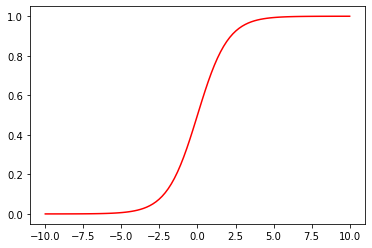

In [23]:
input = np.linspace(-10, 10, 100)

def sigmoid(x):
    return 1/(1+np.exp(-x))

from matplotlib import pyplot as plt
plt.plot(input, sigmoid(input), c="r")


In the script above, we first randomly generate 100 linearly-spaced points between -10 and 10. To do so, we use the linspace method from the NumPy library. Next, we define the sigmoid function. Finally, we use the matplotlib library to plot the input values against the values returned by the sigmoid function.

In [1]:
# Let's first create our feature set and the corresponding labels. Execute the following script:

import numpy as np
feature_set = np.array([[0,1,0],[0,0,1],[1,0,0],[1,1,0],[1,1,1]])
labels = np.array([[1,0,0,1,1]])
labels = labels.reshape(5,1)

In [2]:
print(feature_set)

[[0 1 0]
 [0 0 1]
 [1 0 0]
 [1 1 0]
 [1 1 1]]


In [3]:
print(labels)

[[1]
 [0]
 [0]
 [1]
 [1]]


In the above script, we create our feature set. It contains five records. Similarly, we created a labels set which contains corresponding labels for each record in the feature set. The labels are the answers we're trying to predict with the neural network.

The next step is to define hyper parameters for our neural network. Execute the following script to do so:

In [4]:
np.random.seed(42)
weights = np.random.rand(3,1)
bias = np.random.rand(1)
lr = 0.05

In the script above we used the random.seed function so that we can get the same random values whenever the script is executed.

In the next step, we initialize our weights with normally distributed random numbers. Since we have three features in the input, we have a vector of three weights. We then initialize the bias value with another random number. Finally, we set the learning rate to 0.05.

Next, we need to define our activation function and its derivative (I'll explain in a moment why we need to find the derivative of the activation). Our activation function is the sigmoid function, which we covered earlier.


In [5]:
def sigmoid(x):
    return 1/(1+np.exp(-x))

In [6]:
def sigmoid_der(x):
    return sigmoid(x)*(1-sigmoid(x))

The derivative of sigmoid function is simply sigmoid(x) * sigmoid(1-x).

Now we are ready to train our neural network that will be able to predict whether a person is obese or not.

Look at the following script:

In [7]:
for epoch in range(20000):
    inputs = feature_set

    # feedforward step1
    XW = np.dot(feature_set, weights) + bias

    #feedforward step2
    z = sigmoid(XW)


    # backpropagation step 1
    error = z - labels

    print(error.sum())

    # backpropagation step 2
    dcost_dpred = error
    dpred_dz = sigmoid_der(z)

    z_delta = dcost_dpred * dpred_dz

    inputs = feature_set.T
    weights -= lr * np.dot(inputs, z_delta)

    for num in z_delta:
        bias -= lr * num

1.1484765089981492
1.1370374057501034
1.1255946731475135
1.1141521191251875
1.1027135368122778
1.0912826991625884
1.0798633536714135
1.0684592171946765
1.057073970885539
1.0457112552629333
1.0343746654256973
1.0230677464251738
1.011793988808234
1.0005568243417682
0.9893596219286931
0.97820568372455
0.9670982414627042
0.9560404529951445
0.9450353990547999
0.9340860802442471
0.9231954142546343
0.9123662333175894
0.9016012818918814
0.8909032145855899
0.8802745943135835
0.8697178906891608
0.8592354786478364
0.8488296373003921
0.8385025490115107
0.8282562986995811
0.8180928733525368
0.8080141617539774
0.7980219544132175
0.788117943692388
0.7783037241232473
0.7685807929059396
0.7589505505815883
0.7494143018703172
0.739973256666038
0.7306285311791626
0.7213811492182582
0.7122320436015701
0.7031820576892992
0.6942319470275317
0.6853823810947425
0.6766339451419043
0.6679871421173361
0.6594423946675809
0.651000047205802
0.6426603680393705
0.6344235515485803
0.6262897204086635
0.618258927847567
0

0.0496599796182694
0.04958432569471394
0.04950889844979933
0.04943369686921928
0.04935871994483543
0.0492839666746277
0.04920943606264683
0.049135127118966004
0.049061038859632755
0.04898717030662353
0.04891352048779618
0.0488400884368434
0.048766873193248794
0.048693873802240606
0.04862108931474701
0.04854851878735228
0.04847616128225252
0.048404015867213435
0.04833208161552516
0.04826035760596287
0.048188842922741726
0.04811753665547669
0.048046437899140426
0.047975545754024074
0.047904859325694216
0.04783437772495436
0.047764100067805404
0.04769402547540563
0.04762415307403112
0.047554481995038755
0.047485011374826885
0.0474157403547972
0.0473466680813181
0.04727779370568741
0.04720911638409481
0.04714063527758572
0.04707234955202563
0.047004258378063546
0.046936360931097265
0.04686865639123766
0.04680114394327456
0.04673382277664151
0.046666692085382044
0.0465997510681162
0.04653299892800555
0.0464664348727222
0.04640005811441428
0.04633386786967322
0.04626786335950239
0.0462020438

0.02993079952844288
0.029902994403132793
0.029875240680386078
0.029847538219374026
0.029819886879776547
0.029792286521781064
0.029764737006079567
0.02973723819386398
0.02970978994682924
0.029682392127165336
0.029655044597559632
0.029627747221191075
0.0296004998617303
0.02957330238333722
0.029546154650657186
0.029519056528821364
0.029492007883442417
0.02946500858061346
0.029438058486905727
0.029411157469365956
0.029384305395515176
0.029357502133346258
0.02933074755132098
0.029304041518369267
0.029277383903886844
0.029250774577732425
0.02922421341022563
0.029197700272147187
0.029171235034733234
0.02914481756967624
0.02911844774912231
0.029092125445668138
0.02906585053236027
0.029039622882692406
0.029013442370604492
0.028987308870479234
0.028961222257140762
0.028935182405853854
0.028909189192319718
0.028883242492677208
0.02885734218349667
0.028831488141782574
0.028805680244969267
0.028779918370918145
0.028754202397918982
0.028728532204684465
0.02870290767035069
0.02867732867447484
0.02865

0.02028854368074609
0.020275773048801196
0.020263018566962
0.020250280204740317
0.020237557931724937
0.020224851717580566
0.020212161532047385
0.020199487344941786
0.0201868291261548
0.02017418684565253
0.02016156047347603
0.02014894997974069
0.020136355334637285
0.020123776508429364
0.020111213471454448
0.020098666194125064
0.020086134646926046
0.02007361880041572
0.020061118625225152
0.02004863409205876
0.020036165171692946
0.02002371183497645
0.020011274052830375
0.019998851796248288
0.019986445036293835
0.019974053744103326
0.019961677890884127
0.019949317447913978
0.019936972386542268
0.019924642678188303
0.019912328294341752
0.019900029206563113
0.019887745386481914
0.019875476805797543
0.019863223436279664
0.019850985249766195
0.019838762218165024
0.019826554313451913
0.019814361507672254
0.019802183772939352
0.019790021081434572
0.01977787340540821
0.019765740717176544
0.019753622989125585
0.019741520193707757
0.01972943230344229
0.019717359290915837
0.019705301128782382
0.0196

0.01560031454887384
0.015592791517877194
0.01558527580407372
0.015577767396799655
0.015570266285412193
0.015562772459289748
0.015555285907830674
0.015547806620453838
0.015540334586598425
0.015532869795724824
0.015525412237312713
0.015517961900862048
0.015510518775894794
0.015503082851951011
0.01549565411859144
0.015488232565397775
0.015480818181971112
0.015473410957932782
0.015466010882924264
0.01545861794660569
0.015451232138658982
0.015443853448784309
0.0154364818667026
0.015429117382153634
0.01542175998489781
0.015414409664715231
0.015407066411404019
0.015399730214783885
0.015392401064691863
0.01538507895098673
0.015377763863544752
0.015370455792262594
0.015363154727056072
0.015355860657860515
0.015348573574628932
0.015341293467335773
0.015334020325972947
0.015326754140552346
0.015319494901104166
0.015312242597678355
0.015304997220343258
0.015297758759185917
0.01529052720431301
0.015283302545849684
0.015276084773939297
0.015268873878744801
0.015261669850447301
0.01525447267924615
0.

0.012671797297648557
0.012666853678322959
0.012661913956430654
0.012656978127359164
0.012652046186502466
0.01264711812926167
0.012642193951045988
0.012637273647270533
0.012632357213358814
0.01262744464474086
0.012622535936854376
0.012617631085143508
0.012612730085060503
0.012607832932064453
0.012602939621620651
0.012598050149202414
0.012593164510290522
0.012588282700372072
0.01258340471494089
0.01257853054949934
0.012573660199555428
0.01256879366062455
0.012563930928229494
0.012559071997899851
0.012554216865172274
0.012549365525589773
0.012544517974703198
0.012539674208070242
0.012534834221254593
0.012529998009827986
0.012525165569368349
0.012520336895461226
0.012515511983698213
0.012510690829677706
0.012505873429006692
0.0125010597772965
0.012496249870167078
0.012491443703244565
0.012486641272161342
0.01248184257255762
0.012477047600080213
0.012472256350382072
0.012467468819123001
0.012462685001970342
0.01245790489459736
0.012453128492683818
0.012448355791917609
0.01244358678799104
0.

0.010665304025243197
0.010661815464766938
0.01065832921257695
0.010654845266376431
0.010651363623873727
0.010647884282777909
0.010644407240803094
0.010640932495665278
0.010637460045083771
0.010633989886781034
0.010630522018482108
0.010627056437915505
0.010623593142812943
0.010620132130908483
0.010616673399939672
0.010613216947646609
0.010609762771772918
0.010606310870064709
0.010602861240271322
0.010599413880144987
0.01059596878744104
0.010592525959917637
0.010589085395335457
0.010585647091459316
0.010582211046055723
0.010578777256894989
0.01057534572174973
0.010571916438395723
0.01056848940461215
0.010565064618180436
0.010561642076884911
0.010558221778513843
0.010554803720856668
0.010551387901707052
0.01054797431886137
0.010544562970119131
0.010541153853281679
0.010537746966153866
0.010534342306543418
0.010530939872261516
0.010527539661120883
0.010524141670938375
0.010520745899533349
0.010517352344727476
0.010513961004345374
0.010510571876215735
0.01050718495816845
0.01050380024803690

0.009274747901815136
0.009272118473426488
0.00926949055381382
0.009266864141674304
0.009264239235707974
0.0092616158346156
0.009258993937098545
0.009256373541860846
0.00925375464760854
0.0092511372530472
0.0092485213568851
0.009245906957832395
0.009243294054600101
0.009240682645900292
0.009238072730447681
0.009235464306957208
0.009232857374146766
0.00923025193073411
0.009227647975438985
0.009225045506983949
0.009222444524090587
0.009219845025484334
0.009217247009890406
0.009214650476036076
0.009212055422650398
0.00920946184846326
0.0092068697522067
0.009204279132613291
0.009201689988418485
0.00919910231835714
0.009196516121166884
0.009193931395587267
0.009191348140358102
0.009188766354221362
0.009186186035920418
0.009183607184199187
0.00918102979780426
0.009178453875483064
0.00917587941598462
0.00917330641805883
0.00917073488045815
0.009168164801934761
0.00916559618124467
0.009163029017142693
0.009160463308386671
0.009157899053735201
0.009155336251949073
0.00915277490178993
0.009150215

0.008299378249205847
0.008297278519506679
0.008295179865301996
0.008293082285762157
0.008290985780059518
0.008288890347365956
0.008286795986855555
0.008284702697702456
0.008282610479082783
0.008280519330171147
0.008278429250145089
0.008276340238183091
0.008274252293462743
0.008272165415164033
0.008270079602467048
0.008267994854552811
0.008265911170603636
0.008263828549802357
0.008261746991332294
0.008259666494378301
0.008257587058125099
0.008255508681759588
0.008253431364468392
0.008251355105439173
0.00824927990386061
0.00824720575892253
0.008245132669814942
0.008243060635728765
0.008240989655856928
0.008238919729391288
0.00823685085552571
0.008234783033454908
0.008232716262373735
0.008230650541478458
0.00822858586996595
0.008226522247034171
0.008224459671881547
0.008222398143706663
0.008220337661710923
0.008218278225094515
0.008216219833059799
0.008214162484809072
0.008212106179545604
0.008210050916474101
0.008207996694799213
0.008205943513726777
0.008203891372463919
0.008201840270217

0.007350348142873872
0.007348706155805809
0.007347064911484014
0.007345424409402057
0.007343784649054837
0.007342145629936785
0.00734050735154429
0.007338869813373408
0.007337233014920064
0.007335596955681548
0.007333961635155102
0.007332327052838483
0.007330693208230127
0.007329060100829059
0.0073274277301339785
0.007325796095645168
0.00732416519686202
0.0073225350332856015
0.0073209056044168525
0.0073192769097571025
0.007317648948808639
0.007316021721073485
0.007314395226054607
0.007312769463255389
0.007311144432179506
0.007309520132331049
0.007307896563214782
0.007306273724335302
0.007304651615198776
0.0073030302353109255
0.007301409584178055
0.0072997896613076
0.007298170466206226
0.007296551998381556
0.007294934257342303
0.007293317242597366
0.007291700953654792
0.007290085390024993
0.007288470551217646
0.007286856436743067
0.00728524304611243
0.007283630378836711
0.007282018434428064
0.00728040721239781
0.007278796712259512
0.00727718693352597
0.007275577875710412
0.0072739695383

0.006595412656852713
0.006594094248208768
0.006592776373270451
0.006591459031712363
0.00659014222320984
0.006588825947437399
0.006587510204071043
0.006586194992786426
0.006584880313259267
0.006583566165166255
0.006582252548183107
0.006580939461987484
0.006579626906255673
0.0065783148806655214
0.006577003384894163
0.006575692418619598
0.006574381981519897
0.006573072073273421
0.006571762693558705
0.006570453842054846
0.006569145518440414
0.006567837722395456
0.006566530453598771
0.006565223711731502
0.006563917496472768
0.006562611807503081
0.006561306644503842
0.006560002007155084
0.006558697895138271
0.006557394308135338
0.006556091245827525
0.006554788707896386
0.006553486694025751
0.006552185203895992
0.006550884237191426
0.006549583793594105
0.006548283872788156
0.006546984474456688
0.006545685598283141
0.006544387243951566
0.006543089411146605
0.0065417920995527665
0.0065404953088543105
0.0065391990387373145
0.006537903288885878
0.006536608058986267
0.006535313348724023
0.00653401

0.0060950634221841535
0.006093939709169785
0.006092816415704395
0.006091693541552701
0.0060905710864782164
0.006089449050246339
0.00608832743262102
0.006087206233366962
0.006086085452249784
0.0060849650890336116
0.006083845143484833
0.006082725615367761
0.006081606504449444
0.006080487810494764
0.006079369533269596
0.006078251672541071
0.006077134228074987
0.006076017199637698
0.006074900586996286
0.006073784389917319
0.006072668608168269
0.006071553241516259
0.006070438289728669
0.006069323752572665
0.006068209629816433
0.006067095921227908
0.006065982626575241
0.006064869745626596
0.0060637572781502835
0.006062645223915156
0.006061533582690015
0.0060604223542437274
0.006059311538345782
0.006058201134764983
0.0060570911432707986
0.006055981563633676
0.006054872395622579
0.006053763639008045
0.006052655293559736
0.006051547359048712
0.006050439835245128
0.006049332721919619
0.006048226018843236
0.0060471197257866705
0.0060460138425213125
0.006044908368818706
0.006043803304450493
0.0060

0.0056767338563766395
0.005675760851640496
0.0056747881846401504
0.005673815855197564
0.005672843863137184
0.005671872208282136
0.00567090089045693
0.005669929909484832
0.005668959265190121
0.005667988957397341
0.005667018985929931
0.005666049350612802
0.005665080051270713
0.00566411108772788
0.005663142459809062
0.005662174167339114
0.005661206210143516
0.005660238588047456
0.0056592713008757
0.005658304348453429
0.005657337730606775
0.005656371447160996
0.005655405497941912
0.0056544398827754055
0.005653474601487782
0.0056525096539043335
0.005651545039851942
0.005650580759157031
0.005649616811645622
0.005648653197144679
0.0056476899154808
0.005646726966480491
0.005645764349971279
0.005644802065779747
0.00564384011373327
0.005642878493659478
0.005641917205385066
0.005640956248738081
0.005639995623546432
0.005639035329637665
0.005638075366839558
0.005637115734980047
0.005636156433887651
0.005635197463390307
0.005634238823316706
0.005633280513494904
0.005632322533753918
0.00563136488392

0.005310183397409338
0.0053093334238286105
0.005308483725754168
0.005307634303051582
0.005306785155586809
0.005305936283224948
0.005305087685831933
0.005304239363274024
0.005303391315416087
0.005302543542125407
0.00530169604326719
0.005300848818707626
0.005300001868313323
0.005299155191950386
0.005298308789485312
0.0052974626607853875
0.0052966168057156995
0.005295771224144145
0.005294925915937096
0.005294080880961331
0.005293236119084041
0.005292391630172456
0.005291547414093059
0.00529070347071342
0.005289859799900612
0.00528901640152267
0.005288173275446645
0.005287330421539949
0.005286487839670881
0.005285645529705889
0.005284803491514001
0.005283961724962552
0.00528312022992012
0.005282279006253901
0.0052814380538327085
0.005280597372524169
0.005279756962197582
0.0052789168227209
0.005278076953962332
0.005277237355790346
0.0052763980280742945
0.0052755589706823605
0.0052747201834842244
0.0052738816663475685
0.005273043419142608
0.00527220544173744
0.005271367734001858
0.0052705302

0.004980367445133686
0.004979620980800306
0.004978874743018426
0.0049781287316836564
0.004977382946693261
0.004976637387943239
0.0049758920553301805
0.0049751469487511885
0.004974402068102603
0.00497365741328161
0.004972912984184397
0.004972168780708629
0.004971424802751041
0.004970681050208273
0.0049699375229779255
0.004969194220956763
0.004968451144042284
0.004967708292132202
0.004966965665122752
0.004966223262912767
0.00496548108539864
0.004964739132478031
0.0049639974040491565
0.004963255900009268
0.004962514620256167
0.004961773564687563
0.004961032733201469
0.004960292125695695
0.004959551742068143
0.0049588115822169695
0.004958071646040611
0.0049573319334366844
0.004956592444303947
0.00495585317853986
0.004955114136043458
0.004954375316713187
0.004953636720447546
0.004952898347144508
0.004952160196702998
0.004951422269021968
0.004950684563999774
0.004949947081535448
0.004949209821527575
0.0049484727838752865
0.004947735968477387
0.004946999375233296
0.004946263004041503
0.004945

0.004644395201996353
0.004643747185579906
0.00464309935223544
0.004642451701885264
0.0046418042344514646
0.00464115694985625
0.004640509848021633
0.004639862928869951
0.004639216192323471
0.00463856963830505
0.004637923266736017
0.004637277077540258
0.004636631070638601
0.004635985245954641
0.004635339603410612
0.00463469414292958
0.004634048864433672
0.004633403767845372
0.004632758853087983
0.004632114120083984
0.004631469568756513
0.004630825199028004
0.0046301810108216775
0.004629537004060165
0.004628893178667333
0.004628249534565185
0.004627606071677198
0.004626962789926577
0.004626319689236595
0.004625676769530091
0.004625034030730772
0.004624391472761766
0.004623749095546331
0.004623106899008144
0.00462246488307011
0.004621823047655994
0.004621181392689917
0.004620539918094503
0.00461989862379383
0.0046192575097111915
0.0046186165757708605
0.004617975821896558
0.004617335248011424
0.00461669485403958
0.004616054639905075
0.004615414605531984
0.004614774750843733
0.00461413507576

0.004156164760158527
0.004155647251624567
0.0041551298735461595
0.004154612625872613
0.004154095508555375
0.004153578521544431
0.004153061664790042
0.004152544938243616
0.00415202834185479
0.004151511875574963
0.004150995539353955
0.004150479333143341
0.004149963256893114
0.0041494473105542565
0.004148931494077156
0.004148415807413132
0.00414790025051278
0.0041473848233263555
0.004146869525805036
0.004146354357900145
0.004145839319562344
0.004145324410741981
0.004144809631390543
0.0041442949814589555
0.004143780460897896
0.0041432660696580845
0.004142751807691587
0.004142237674948576
0.0041417236713802465
0.0041412097969380085
0.0041406960515727245
0.004140182435235833
0.0041396689478778795
0.0041391555894511114
0.004138642359905603
0.0041381292591934175
0.0041376162872655275
0.004137103444073378
0.004136590729568082
0.004136078143701122
0.004135565686423759
0.004135053357687414
0.004134541157443605
0.0041340290856436285
0.004133517142239092
0.004133005327181555
0.00413249364042231
0.0

0.0039049486212072923
0.003904492481043749
0.0039040364487398574
0.0039035805242570235
0.003903124707557465
0.0039026689986022683
0.003902213397353048
0.0039017579037710706
0.00390130251781879
0.0039008472394582022
0.003900392068649665
0.0038999370053556595
0.0038994820495378626
0.003899027201158034
0.003898572460177968
0.0038981178265594107
0.0038976633002645103
0.003897208881254152
0.003896754569491269
0.003896300364936982
0.0038958462675536196
0.0038953922773027824
0.0038949383941467436
0.0038944846180468257
0.0038940309489656592
0.0038935773868648826
0.003893123931706398
0.003892670583452107
0.0038922173420644877
0.0038917642075053
0.003891311179737268
0.003890858258721215
0.003890405444419792
0.003889952736795675
0.0038895001358103393
0.003889047641425933
0.0038885952536051177
0.003888142972309598
0.003887690797501807
0.0038872387291441386
0.0038867867671981485
0.0038863349116274384
0.003885883162392606
0.003885431519456934
0.0038849799827826784
0.0038845285523322545
0.00388407722

0.0037116774402776234
0.0037112658440917948
0.0037108543402937406
0.0037104429288521354
0.003710031609736146
0.0037096203829140133
0.00370920924835454
0.0037087982060266915
0.003708387255899479
0.003707976397941841
0.0037075656321221805
0.0037071549584096267
0.0037067443767728955
0.003706333887180828
0.0037059234896024557
0.003705513184007081
0.003705102970363229
0.003704692848639793
0.003704282818805908
0.0037038728808303292
0.003703463034682629
0.0037030532803311103
0.003702643617745024
0.003702234046893651
0.0037018245677459087
0.0037014151802704856
0.0037010058844371974
0.0037005966802144824
0.003700187567571612
0.0036997785464778846
0.003699369616902648
0.003698960778814455
0.0036985520321823825
0.003698143376976666
0.0036977348131652585
0.003697326340718135
0.003696917959604272
0.0036965096697927045
0.0036961014712530854
0.003695693363954311
0.0036952853478655796
0.003694877422957356
0.0036944695891967874
0.003694061846555019
0.0036936541950004925
0.0036932466345029995
0.00369283

0.0035544719877868766
0.0035540949138342694
0.003553717920844697
0.003553341008792444
0.003552964177650851
0.003552587427393731
0.0035522107579952222
0.003551834169428763
0.003551457661668894
0.0035510812346888007
0.003550704888462968
0.0035503286229646124
0.0035499524381682676
0.003549576334047365
0.0035492003105761366
0.0035488243677285203
0.003548448505478363
0.0035480727237996584
0.0035476970226662394
0.003547321402052349
0.003546945861932209
0.0035465704022788827
0.00354619502306755
0.00354581972427135
0.00354544450586472
0.0035450693678220208
0.003544694310116482
0.0035443193327231656
0.003543944435615065
0.0035435696187676377
0.0035431948821535927
0.003542820225747756
0.0035424456495244984
0.0035420711534575426
0.0035416967375210967
0.0035413224016892925
0.003540948145936633
0.0035405739702368613
0.003540199874564609
0.003539825858893713
0.00353945192319886
0.0035390780674534363
0.003538704291632569
0.0035383305957104247
0.0035379569796604587
0.0035375834434579027
0.003537209987

0.0034008472056400313
0.003400502387877761
0.003400157640871978
0.003399812964601269
0.0033994683590428953
0.003399123824175884
0.0033987793599777605
0.0033984349664271246
0.003398090643501859
0.0033977463911806158
0.0033974022094409514
0.0033970580982611923
0.003396714057619859
0.003396370087494799
0.0033960261878645745
0.003395682358707318
0.0033953386000012548
0.0033949949117245276
0.0033946512938554108
0.0033943077463721855
0.0033939642692533585
0.0033936208624766664
0.003393277526021213
0.0033929342598645537
0.0033925910639854458
0.0033922479383617296
0.003391904882972481
0.003391561897795388
0.0033912189828092035
0.003390876137991723
0.0033905333633221027
0.003390190658778214
0.003389848024338473
0.0033895054599812763
0.00338916296568547
0.0033888205414286804
0.003388478187189896
0.0033881359029474395
0.0033877936886793393
0.003387451544364685
0.0033871094699815738
0.0033867674655085195
0.0033864255309240775
0.0033860836662064075
0.0033857418713347034
0.0033854001462868197
0.0033

0.0032293632306439925
0.003229052693518114
0.0032287422168205404
0.003228431800533907
0.003228121444640776
0.0032278111491226627
0.0032275009139623376
0.003227190739142287
0.003226880624644754
0.003226570570451767
0.0032262605765457746
0.003225950642909474
0.0032256407695246195
0.0032253309563740618
0.003225021203439968
0.0032247115107043936
0.0032244018781500544
0.0032240923057596654
0.0032237827935148247
0.0032234733413987054
0.003223163949393107
0.003222854617480418
0.0032225453456436667
0.0032222361338647906
0.003221926982126453
0.003221617890410689
0.0032213088587002975
0.0032209998869779516
0.003220690975225364
0.003220382123425739
0.003220073331560991
0.0032197645996137544
0.0032194559275669707
0.0032191473154025846
0.003218838763103065
0.0032185302706512695
0.003218221838029632
0.0032179134652205836
0.003217605152206454
0.0032172968989701844
0.003216988705493855
0.003216680571760354
0.003216372497752376
0.003216064483452137
0.003215756528841915
0.003215448633904959
0.0032151407

0.003102040733925032
0.0031017544733753996
0.0031014682662784676
0.0031011821126198276
0.00310089601238462
0.0031006099655572807
0.003100323972122787
0.003100038032066585
0.003099752145373273
0.00309946631202827
0.003099180532016174
0.0030988948053218
0.003098609131930854
0.003098323511828101
0.0030980379449979042
0.0030977524314266536
0.0030974669710978966
0.003097181563997395
0.0030968962101102573
0.0030966109094213434
0.003096325661916019
0.0030960404675789872
0.00309575532639509
0.003095470238350176
0.0030951852034288192
0.003094900221616244
0.0030946152928973993
0.0030943304172571136
0.003094045594681294
0.0030937608251543555
0.0030934761086619175
0.0030931914451884507
0.0030929068347194874
0.003092622277240241
0.003092337772735973
0.003092053321191557
0.0030917689225915465
0.0030914845769222307
0.0030912002841681774
0.0030909160443143915
0.0030906318573466207
0.003090347723249516
0.0030900636420080757
0.0030897796136083316
0.0030894956380347616
0.003089211715272676
0.003088927845

0.002962931187329404
0.0029626703066910273
0.0029624094725277314
0.002962148684827297
0.002961887943576741
0.0029616272487637436
0.0029613666003760405
0.0029611059984010063
0.0029608454428260503
0.0029605849336394006
0.002960324470828009
0.002960064054379475
0.0029598036842811773
0.002959543360521094
0.0029592830830870234
0.0029590228519658507
0.0029587626671456063
0.002958502528613821
0.0029582424363577657
0.002957982390365585
0.0029577223906247507
0.002957462437122471
0.002957202529846388
0.002956942668784601
0.0029566828539244645
0.002956423085253554
0.0029561633627596395
0.002955903686430266
0.002955644056252711
0.0029553844722152514
0.002955124934305338
0.002954865442510439
0.0029546059968181757
0.002954346597216294
0.00295408724369238
0.0029538279362345994
0.0029535686748300358
0.002953309459466473
0.002953050290131938
0.0029527911668134135
0.002952532089499537
0.002952273058177142
0.002952014072834637
0.0029517551334587652
0.002951496240038199
0.0029512373925605698
0.00295097859

0.0028587585455905826
0.0028585158893630926
0.002858273274806318
0.0028580307019091603
0.002857788170661499
0.0028575456810518776
0.002857303233069902
0.0028570608267049283
0.002856818461945746
0.0028565761387820132
0.002856333857203082
0.0028560916171980408
0.002855849418755725
0.0028556072618658238
0.0028553651465176785
0.0028551230727001525
0.0028548810404028756
0.002854639049614645
0.002854397100325371
0.0028541551925242263
0.0028539133261998653
0.002853671501341859
0.0028534297179401216
0.002853187975983284
0.002852946275460736
0.00285270461636207
0.002852462998675989
0.0028522214223923315
0.002851979887500182
0.0028517383939893476
0.0028514969418483097
0.0028512555310668923
0.002851014161634538
0.0028507728335402382
0.002850531546773387
0.0028502903013237144
0.0028500490971798687
0.0028498079343318647
0.002849566812768503
0.002849325732479528
0.002849084693454039
0.0028488436956814814
0.002848602739151572
0.002848361823853278
0.0028481209497757953
0.0028478801169089032
0.00284763

0.0027350720481302895
0.002734850162209479
0.002734628312702981
0.002734406499602552
0.0027341847228982766
0.002733962982582064
0.0027337412786443624
0.002733519611075916
0.0027332979798680886
0.002733076385012266
0.0027328548264987026
0.0027326333043191653
0.00273241181846421
0.0027321903689248514
0.002731968955692131
0.002731747578757323
0.0027315262381114175
0.002731304933744856
0.0027310836656496487
0.0027308624338164
0.002730641238235826
0.0027304200788995994
0.0027301989557981313
0.0027299778689228033
0.002729756818264862
0.0027295358038150683
0.002729314825564464
0.002729093883504525
0.0027288729776256057
0.0027286521079195256
0.002728431274377014
0.002728210476989061
0.0027279897157469757
0.0027277689906415707
0.0027275483016642316
0.0027273276488060175
0.0027271070320575783
0.0027268864514106983
0.0027266659068559407
0.0027264453983843542
0.0027262249259875845
0.0027260044896563716
0.0027257840893820384
0.0027255637251553007
0.0027253433969675195
0.002725123104810115
0.0027249

0.0026154538445161968
0.00261525115049285
0.0026150484882435238
0.0026148458577613942
0.002614643259038728
0.002614440692067902
0.0026142381568413434
0.0026140356533518837
0.002613833181591401
0.002613630741553262
0.0026134283332293375
0.0026132259566125395
0.002613023611694982
0.002612821298469476
0.002612619016928802
0.0026124167670646473
0.0026122145488701454
0.0026120123623379517
0.002611810207459972
0.0026116080842296142
0.00261140599263867
0.002611203932680023
0.002611001904345992
0.0026107999076293437
0.0026105979425226702
0.002610396009017968
0.0026101941071084434
0.0026099922367864813
0.0026097903980443066
0.0026095885908752198
0.0026093868152708977
0.0026091850712244014
0.0026089833587279905
0.0026087816777747366
0.0026085800283569584
0.0026083784104666205
0.002608176824097412
0.0026079752692410724
0.0026077737458903537
0.00260757225403839
0.002607370793676997
0.002607169364798937
0.0026069679673967547
0.0026067666014638682
0.0026065652669915174
0.002606363963973627
0.0026061

0.002524131038435195
0.002523942404660369
0.0025237537993978154
0.0025235652226414176
0.002523376674384438
0.0025231881546210096
0.002522999663343524
0.002522811200546378
0.0025226227662226534
0.00252243436036639
0.0025222459829702254
0.002522057634028671
0.00252186931353433
0.002521681021481474
0.0025214927578633695
0.0025213045226732053
0.0025211163159049484
0.0025209281375518193
0.0025207399876080415
0.002520551866066204
0.0025203637729205725
0.00252017570816428
0.0025199876717909644
0.002519799663794394
0.0025196116841676094
0.0025194237329046708
0.0025192358099989896
0.0025190479154436236
0.0025188600492332854
0.0025186722113601234
0.00251848440181901
0.0025182966206022603
0.0025181088677046284
0.002517921143119023
0.0025177334468390183
0.002517545778858335
0.0025173581391705405
0.002517170527769272
0.002516982944647611
0.002516795389799563
0.0025166078632185493
0.0025164203648986166
0.0025162328948327706
0.0025160454530149673
0.002515858039438327
0.002515670654096979
0.0025154832

0.0024290449816381614
0.0024288704435528816
0.0024286959308315783
0.002428521443468473
0.0024283469814583326
0.0024281725447952603
0.002427998133474078
0.002427823747488891
0.0024276493868341017
0.0024274750515044137
0.0024273007414946333
0.002427126456798344
0.002426952197410565
0.0024267779633258373
0.0024266037545383305
0.002426429571042714
0.0024262554128333357
0.0024260812799048077
0.002425907172251461
0.0024257330898674358
0.0024255590327480828
0.002425385000887006
0.002425210994279361
0.0024250370129193614
0.002424863056801157
0.00242468912591968
0.0024245152202693274
0.00242434133984455
0.0024241674846396007
0.0024239936546491606
0.0024238198498677463
0.0024236460702898484
0.0024234723159099712
0.002423298586722661
0.0024231248827223176
0.002422951203902974
0.002422777550259936
0.0024226039217878845
0.0024224303184802037
0.002422256740332352
0.002422083187338088
0.0024219096594924553
0.00242173615679012
0.00242156267922471
0.0024213892267919736
0.0024212157994856365
0.002421042

0.002345967373400454
0.002345804697087327
0.002345642043586303
0.002345479412892317
0.0023453168050006877
0.0023451542199066262
0.002344991657605121
0.0023448291180917288
0.0023446666013613483
0.0023445041074093634
0.0023443416362303373
0.0023441791878207677
0.0023440167621746107
0.0023438543592874533
0.0023436919791546464
0.002343529621771468
0.002343367287132792
0.0023432049752337165
0.002343042686069819
0.002342880419636116
0.0023427181759281893
0.0023425559549405256
0.002342393756668837
0.0023422315811081826
0.0023420694282538564
0.0023419072981011382
0.002341745190645013
0.0023415831058803613
0.0023414210438034277
0.0023412590044086298
0.0023410969876914538
0.002340934993646831
0.0023407730222706324
0.0023406110735573263
0.002340449147502458
0.002340287244101352
0.0023401253633490646
0.0023399635052408236
0.0023398016697718065
0.0023396398569378255
0.002339478066733184
0.002339316299153729
0.002339154554194492
0.0023389928318505934
0.0023388311321177607
0.002338669454990845
0.0023

0.00227897926392418
0.002278825844250444
0.0022786724454612692
0.002278519067552394
0.00227836571052022
0.0022782123743594444
0.002278059059066473
0.0022779057646369685
0.002277752491066303
0.0022775992383506118
0.0022774460064851117
0.002277292795466134
0.0022771396052890212
0.0022769864359496877
0.002276833287443634
0.0022766801597671887
0.0022765270529149853
0.0022763739668838663
0.002276220901668874
0.002276067857265999
0.00227591483367107
0.0022757618308796527
0.0022756088488877155
0.002275455887690514
0.002275302947284369
0.0022751500276644975
0.002274997128827092
0.0022748442507674743
0.002274691393481812
0.002274538556965716
0.0022743857412147964
0.002274232946224801
0.0022740801719917138
0.0022739274185110455
0.0022737746857785495
0.00227362197379026
0.002273469282542011
0.0022733166120284427
0.0022731639622467457
0.002273011333192297
0.002272858724860249
0.002272706137246788
0.002272553570348043
0.0022724010241592096
0.0022722484986759054
0.0022720959938945275
0.0022719435098

0.0021926595545194213
0.002192517657878798
0.002192375779805071
0.0021922339202949184
0.002192092079344038
0.00219195025694976
0.0021918084531072288
0.0021916666678136985
0.002191524901065462
0.002191383152858231
0.002191241423188814
0.0021910997120535482
0.0021909580194486855
0.002190816345370562
0.002190674689815807
0.002190533052780389
0.0021903914342606603
0.002190249834253295
0.0021901082527545045
0.0021899666897605124
0.0021898251452677937
0.002189683619272815
0.002189542111771515
0.002189400622760936
0.002189259152236908
0.0021891177001957147
0.002188976266633955
0.002188834851548034
0.0021886934549347203
0.00218855207678933
0.002188410717108716
0.002188269375889864
0.0021881280531284436
0.002187986748820696
0.0021878454629636057
0.002187704195553128
0.0021875629465858987
0.0021874217160580984
0.0021872805039655392
0.0021871393103060494
0.0021869981350746727
0.002186856978268382
0.0021867158398833526
0.002186574719915988
0.002186433618362701
0.0021862925352203674
0.0021861514704

0.0021234219723439366
0.002123288989165962
0.0021231560228260875
0.0021230230733206464
0.0021228901406473884
0.0021227572248025406
0.0021226243257830603
0.002122491443584954
0.002122358578206031
0.0021222257296429244
0.002122092897892251
0.0021219600829505744
0.0021218272848153655
0.0021216945034825685
0.0021215617389493124
0.0021214289912123187
0.002121296260269103
0.0021211635461154885
0.0021210308487487374
0.0021208981681657448
0.0021207655043631295
0.0021206328573374067
0.0021205002270856844
0.0021203676136054197
0.0021202350168925653
0.0021201024369436744
0.002119969873756235
0.0021198373273269046
0.002119704797652156
0.0021195722847293375
0.002119439788555135
0.0021193073091260433
0.0021191748464390123
0.002119042400491166
0.0021189099712787887
0.002118777558798513
0.002118645163047956
0.002118512784023849
0.0021183804217225106
0.002118248076141003
0.0021181157472762065
0.002117983435124789
0.0021178511396832828
0.002117718860949365
0.00211758659891869
0.0021174543535892962
0.002

0.002067625093363768
0.0020674990802633207
0.002067373082689332
0.0020672471006384745
0.0020671211341083944
0.0020669951830958773
0.0020668692475984303
0.0020667433276126863
0.002066617423135804
0.0020664915341649867
0.0020663656606976395
0.0020662398027307335
0.002066113960261115
0.0020659881332863537
0.0020658623218034345
0.0020657365258096756
0.0020656107453011843
0.002065484980276408
0.0020653592307317004
0.00206523349666452
0.0020651077780716644
0.002064982074950719
0.002064856387298253
0.0020647307151118663
0.002064605058388732
0.0020644794171258782
0.0020643537913198097
0.0020642281809688037
0.002064102586069148
0.0020639770066181486
0.002063851442613302
0.002063725894051377
0.002063600360929327
0.0020634748432448204
0.002063349340994728
0.002063223854176125
0.002063098382786368
0.002062972926822216
0.002062847486281256
0.00206272206116059
0.0020625966514572734
0.0020624712571678337
0.002062345878290555
0.0020622205148217963
0.0020620951667590405
0.002061969834098995
0.002061844

0.0020080405815485654
0.002007921801885323
0.0020078030364255248
0.002007684285166428
0.002007565548105654
0.002007446825240485
0.002007328116568126
0.0020072094220862785
0.002007090741792849
0.0020069720756845447
0.0020068534237593603
0.0020067347860142845
0.002006616162447284
0.0020064975530552486
0.0020063789578357444
0.0020062603767865145
0.002006141809904941
0.002006023257188322
0.002005904718634273
0.0020057861942401195
0.002005667684003098
0.0020055491879211428
0.00200543070599107
0.002005312238211123
0.002005193784578009
0.0020050753450899135
0.0020049569197436393
0.0020048385085373686
0.0020047201114674704
0.002004601728532179
0.002004483359728944
0.0020043650050550928
0.0020042466645083766
0.002004128338085418
0.0020040100257844445
0.00200389172760251
0.002003773443537407
0.0020036551735865653
0.0020035369177468787
0.002003418676016994
0.0020033004483931537
0.002003182234873375
0.002003064035454999
0.002002945850135829
0.0020028276789125256
0.002002709521783587
0.002002591378

0.0019482456768119445
0.001948133938482267
0.0019480222131060682
0.0019479105006820676
0.0019477988012074707
0.0019476871146804978
0.0019475754410983384
0.001947463780459114
0.0019473521327600194
0.0019472404979994015
0.0019471288761750555
0.0019470172672846342
0.001946905671325487
0.001946794088295515
0.0019466825181925149
0.0019465709610143982
0.00194645941675866
0.0019463478854229548
0.001946236367005666
0.0019461248615038514
0.0019460133689153027
0.001945901889238542
0.0019457904224704989
0.0019456789686090985
0.0019455675276522262
0.001945456099597554
0.0019453446844425147
0.001945233282185493
0.001945121892824149
0.0019450105163553097
0.001944899152778068
0.0019447878020893983
0.0019446764642870613
0.001944565139369147
0.0019444538273331972
0.0019443425281768633
0.0019442312418978432
0.0019441199684944142
0.001944008707963617
0.0019438974603040206
0.0019437862255125074
0.0019436750035874278
0.0019435637945263637
0.0019434525983272402
0.0019433414149875143
0.0019432302445050766
0.

0.0018933139875182761
0.0018932085258468664
0.0018931030760492434
0.001892997638123263
0.001892892212066788
0.0018927867978780488
0.001892681395554775
0.0018925760050951968
0.0018924706264970906
0.0018923652597584474
0.0018922599048772637
0.0018921545618518706
0.001892049230679961
0.0018919439113596285
0.0018918386038885675
0.0018917333082652601
0.0018916280244871617
0.001891522752552617
0.001891417492459982
0.0018913122442061805
0.001891207007790257
0.001891101783209486
0.001890996570462336
0.0018908913695467357
0.0018907861804604124
0.001890681003201505
0.0018905758377679993
0.0018904706841581312
0.0018903655423696646
0.0018902604124003079
0.001890155294248701
0.001890050187912485
0.0018899450933893662
0.0018898400106781288
0.0018897349397762574
0.001889629880681325
0.0018895248333921887
0.0018894197979064803
0.0018893147742221998
0.0018892097623374356
0.0018891047622499567
0.001888999773957685
0.0018888947974592292
0.001888789832752296
0.0018886848798343372
0.0018885799387041297
0.0

0.001843022098128368
0.0018429222218737489
0.0018428223565578206
0.0018427225021795737
0.0018426226587364772
0.00184252282622753
0.001842423004650439
0.0018423231940029837
0.0018422233942845413
0.0018421236054924559
0.001842023827624644
0.0018419240606798205
0.001841824304656568
0.001841724559552043
0.0018416248253651547
0.0018415251020941822
0.0018414253897369708
0.0018413256882921
0.0018412259977570802
0.0018411263181309576
0.0018410266494114959
0.0018409269915968425
0.001840827344685051
0.001840727708675216
0.001840628083564286
0.0018405284693515534
0.0018404288660344229
0.0018403292736114442
0.0018402296920810059
0.0018401301214408874
0.0018400305616897115
0.0018399310128256012
0.001839831474846074
0.0018397319477503442
0.001839632431536186
0.0018395329262015786
0.001839433431745436
0.0018393339481650658
0.0018392344754593719
0.0018391350136261284
0.0018390355626636892
0.0018389361225704948
0.001838836693344257
0.0018387372749838447
0.0018386378674867532
0.0018385384708515494
0.001

0.001804499899134648
0.0018044041970854893
0.001804308505293624
0.0018042128237579676
0.0018041171524767648
0.0018040214914482947
0.0018039258406709145
0.0018038302001430091
0.0018037345698631406
0.0018036389498294891
0.0018035433400399696
0.0018034477404934232
0.001803352151188235
0.0018032565721226804
0.0018031610032948082
0.0018030654447033553
0.0018029698963466251
0.0018028743582224095
0.0018027788303297126
0.001802683312666812
0.0018025878052317784
0.0018024923080233526
0.0018023968210391563
0.0018023013442782926
0.001802205877738848
0.0018021104214189024
0.0018020149753175292
0.001801919539432359
0.0018018241137617644
0.001801728698304604
0.001801633293058852
0.0018015378980229518
0.0018014425131955558
0.001801347138574239
0.0018012517741582967
0.0018011564199454377
0.0018010610759344181
0.0018009657421232568
0.0018008704185105348
0.0018007751050943422
0.0018006798018734994
0.001800584508845569
0.0018004892260099076
0.0018003939533645513
0.001800298690907403
0.0018002034386367244

0.0017633588756605454
0.0017632675319619803
0.001763176197825466
0.0017630848732495888
0.0017629935582329608
0.0017629022527739513
0.0017628109568713912
0.001762719670523447
0.0017626283937285103
0.0017625371264854157
0.001762445868792116
0.0017623546206479903
0.0017622633820508962
0.001762172152999359
0.0017620809334919774
0.001761989723527502
0.0017618985231036763
0.001761807332219676
0.0017617161508740181
0.0017616249790648082
0.0017615338167908928
0.0017614426640502577
0.0017613515208419785
0.001761260387164499
0.0017611692630159909
0.0017610781483950316
0.0017609870433002578
0.0017608959477302157
0.0017608048616833353
0.001760713785157738
0.0017606227181523985
0.0017605316606657886
0.0017604406126963314
0.0017603495742422766
0.0017602585453027272
0.0017601675258755861
0.0017600765159592885
0.0017599855155531023
0.0017598945246548939
0.0017598035432634818
0.0017597125713768903
0.001759621608994245
0.0017595306561133534
0.001759439712733582
0.0017593487788527418
0.001759257854469634

0.001723110821673323
0.001723023642214376
0.0017229364716681086
0.0017228493100341843
0.0017227621573105215
0.0017226750134955518
0.0017225878785890256
0.0017225007525882175
0.0017224136354923314
0.0017223265273003559
0.0017222394280105788
0.0017221523376217684
0.0017220652561322249
0.0017219781835408256
0.00172189111984598
0.0017218040650468017
0.0017217170191412626
0.0017216299821290384
0.001721542954007213
0.0017214559347756668
0.0017213689244328437
0.0017212819229768528
0.0017211949304069205
0.0017211079467212686
0.0017210209719187783
0.001720934005997694
0.001720847048957119
0.001720760100795752
0.0017206731615115912
0.0017205862311038753
0.0017204993095710705
0.0017204123969116313
0.001720325493124026
0.0017202385982078277
0.0017201517121607345
0.0017200648349816501
0.0017199779666689369
0.0017198911072218766
0.0017198042566391493
0.0017197174149185673
0.001719630582059279
0.0017195437580596693
0.001719456942918772
0.0017193701366351784
0.0017192833392070637
0.0017191965506332361

0.0016833452560435884
0.0016832620943080003
0.001683178940874136
0.0016830957957404448
0.001683012658906597
0.001682929530370426
0.001682846410130806
0.0016827632981867673
0.0016826801945367745
0.0016825970991800922
0.0016825140121149544
0.0016824309333401573
0.001682347862854646
0.0016822648006573453
0.0016821817467466069
0.0016820987011216
0.0016820156637804354
0.0016819326347226361
0.0016818496139465455
0.0016817666014506821
0.0016816835972339808
0.0016816006012960166
0.0016815176136344059
0.001681434634248212
0.001681351663136585
0.0016812687002977188
0.0016811857457309926
0.001681102799434564
0.0016810198614075084
0.0016809369316487764
0.0016808540101565447
0.0016807710969303016
0.0016806881919683749
0.0016806052952692517
0.0016805224068321238
0.0016804395266557387
0.0016803566547388543
0.0016802737910797602
0.0016801909356777642
0.0016801080885314873
0.0016800252496399024
0.0016799424190013148
0.0016798595966146107
0.0016797767824787632
0.001679693976592067
0.0016796111789540956


In the first step, we define the number of epochs. An epoch is basically the number of times we want to train the algorithm on our data. We will train the algorithm on our data 20,000 times. I have tested this number and found that the error is pretty much minimized after 20,000 iterations. You can try with a different number. The ultimate goal is to minimize the error.

Next we store the values from the feature_set to the input variable. We then execute the following line:!!!



In [8]:
XW = np.dot(feature_set, weights) + bias


Here we find the dot product of the input and the weight vector and add bias to it. This is Step 1 of the feedforward section.

In [9]:
z = sigmoid(XW)


We pass the dot product through the sigmoid activation function, as explained in Step 2 of the feedforward section. This completes the feed forward part of our algorithm.

Now is the time to start backpropagation. The variable z contains the predicted outputs. The first step of the backpropagation is to find the error. We do so in the following line:

In [10]:
error = z - labels

We then print the error on the screen.

Now is the time to execute Step 2 of backpropagation, which is the gist of this code.

Here, 2 is constant and therefore can be ignored. This is basically the error which we already calculated. In the code, you can see the line:

In [12]:
dcost_dpred = error # ........ (2)

Here "d_pred" is simply the sigmoid function and we have differentiated it with respect to input dot product "z". In the script, this is defined as:


In [14]:
dpred_dz = sigmoid_der(z) # ......... (3)

Therefore, derivative with respect to any weight is simply the corresponding input. Hence, our final derivative of the cost function with respect to any weight is:



In [30]:
z_delta = dcost_dpred * dpred_dz
inputs = feature_set.T
weights -= lr * np.dot(inputs, z_delta)


Here we have the z_delta variable, which contains the product of dcost_dpred and dpred_dz. Instead of looping through each record and multiplying the input with corresponding z_delta, we take the transpose of the input feature matrix and multiply it with the z_delta. Finally, we multiply the learning rate variable lr with the derivative to increase the speed of convergence.


You can see that error is extremely small at the end of the training of our neural network. At this point of time our weights and bias will have values that can be used to detect whether a person is diabetic or not, based on his smoking habits, obesity, and exercise habits.

You can now try and predict the value of a single instance. Let's suppose we have a record of a patient that comes in who smokes, is not obese, and doesn't exercise. Let's find if he is likely to be diabetic or not. The input feature will look like this: [1,0,0].

Execute the following script:



In [20]:
single_point = np.array([1,0,0])
result = sigmoid(np.dot(single_point, weights) + bias)
print(result)

[0.0070758]


You can see that the person is likely not diabetic since the value is much closer to 0 than 1.

Now let's test another person who doesn't, smoke, is obese, and doesn't exercises. The input feature vector will be [0,1,0]. Execute this script:

In [21]:
single_point = np.array([0,1,0])
result = sigmoid(np.dot(single_point, weights) + bias)
print(result)
# In the output you will see the following value:

[0.99837062]


You can see that the value is very close to 1, which is likely due to the person's obesity.

# Creating a Neural Network from Scratch in Python: Adding Hidden Layers

In the previous article, we started our discussion about artificial neural networks; we saw how to create a simple neural network with one input and one output layer, from scratch in Python. Such a neural network is called a perceptron. However, real-world neural networks, capable of performing complex tasks such as image classification and stock market analysis, contain multiple hidden layers in addition to the input and output layer.

In the previous article, we concluded that a Perceptron is capable of finding linear decision boundary. We used perceptron to predict whether a person is diabetic or not using a toy dataset. However, a perceptron is not capable of finding non-linear decision boundaries.

In this article, we will build upon the concepts that we studied in Part 1 of this series and will develop a neural network with one input layer, one hidden layer, and one output layer. We will see that the neural network that we will develop will be capable of finding non-linear boundaries.


Dataset :
    
For this article, we need a non-linearly separable data. In other words, we need a dataset that cannot be classified using a straight line.

Luckily, Python's Scikit Learn library comes with a variety of tools that can be used to automatically generate different types of datasets.

Execute the following script to generate the dataset that we are going to use, in order to train and test our neural network.

In [1]:
from sklearn import datasets
import matplotlib.pyplot as plt
import numpy as np
np.random.seed(0)
feature_set, labels = datasets.make_moons(100, noise=0.10)
plt.figure(figsize=(10,7))
plt.scatter(feature_set[:,0], feature_set[:,1], c=labels, cmap=plt.cm.winter)

In the script above we import the datasets class from the sklearn library. To create non-linear dataset of 100 data-points, we use the make_moons method and pass it 100 as the first parameter. The method returns a dataset, which when plotted contains two interleaving half circles, as shown in the figure below:

You can clearly see that this data cannot be separated by a single straight line, hence the perceptron cannot be used to correctly classify this data.

Let's verify this concept. To do so, we'll use a simple perceptron with one input layer and one output layer (the one we created in the last article) and try to classify our "moons" dataset. Execute the following script:

17.553996678204935
8.439834348636696
7.91408317591509
5.159803182413134
4.776783970534443
4.404583567775188
4.309629211626161
4.229526174037587
4.211785972364752
4.186284989552499
4.179871958172135
4.16956921950242
4.166184839382557
4.161861517614325
4.160133039837854
4.158471218677729
4.15783460081968
4.157443749294647
4.1574951368672775
4.157742241967655
4.158195326444301
4.158766270691271
4.159433794564648
4.160159898212874
4.160925489928286
4.1617113240392385
4.162504743985737
4.163295186516525
4.164075069568979
4.164838550956572
4.165581412360381
4.166300599852684
4.16699402250365
4.1676603256707825
4.168298740435934
4.168908951965181
4.16949099977089
4.170045196044728
4.170572061262653
4.171072272326344
4.171546621217216
4.171995981875041
4.172421283770188
4.172823490837286
4.173203584752079
4.173562551716523
4.173901372087769
4.1742210123118575
4.174522418726843
4.174806512881699
4.17507418808345
4.175326306938139
4.175563699694262
4.1757871632321
4.175997460570901
4.17619532078

4.17925946214864
4.17925946214864
4.17925946214864
4.17925946214864
4.179259462148641
4.179259462148641
4.179259462148641
4.179259462148641
4.179259462148641
4.179259462148641
4.179259462148641
4.179259462148641
4.179259462148641
4.179259462148642
4.179259462148642
4.179259462148641
4.179259462148642
4.179259462148641
4.179259462148642
4.179259462148641
4.179259462148641
4.179259462148641
4.179259462148641
4.179259462148641
4.179259462148641
4.179259462148641
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.17925946

4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643
4.179259462148642
4.179259462148643


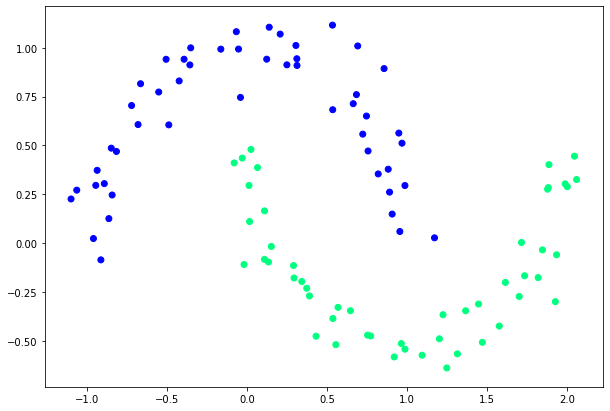

In [2]:
from sklearn import datasets
import numpy as np
import matplotlib.pyplot as plt

np.random.seed(0)
feature_set, labels = datasets.make_moons(100, noise=0.10)
plt.figure(figsize=(10,7))
plt.scatter(feature_set[:,0], feature_set[:,1], c=labels, cmap=plt.cm.winter)

labels = labels.reshape(100, 1)

def sigmoid(x):
    return 1/(1+np.exp(-x))

def sigmoid_der(x):
    return sigmoid(x) *(1-sigmoid (x))

np.random.seed(42)
weights = np.random.rand(2, 1) 
lr = 0.5
bias = np.random.rand(1)

for epoch in range(200000):
    inputs = feature_set

    # feedforward step 1
    XW = np.dot(feature_set,weights) + bias

    # feedforward step 2
    z = sigmoid(XW)

    # backpropagation step 1
    error_out = ((1 / 2) * (np.power((z - labels), 2)))
    print(error_out.sum())

    error = z - labels

    # backpropagation step 2
    dcost_dpred = error
    dpred_dz = sigmoid_der(z) 

    z_delta = dcost_dpred * dpred_dz

    inputs = feature_set.T
    weights -= lr * np.dot(inputs, z_delta)

    for num in z_delta:
        bias -= lr * num

# Code for Neural Networks with One Hidden Layer


Now let's implement the neural network that we just discussed in Python from scratch. You will clearly see the correspondence between the code snippets and the theory that we discussed in the previous section. We will again try to classify the non-linear data that we created in the Dataset section of the article. Take a look at the following script.

13.969800889589633
19.896843754373155
14.662281060099824
19.76923564580246
13.221997064044603
17.073474668292704
13.634915886857735
11.144622927361297
6.9068434590796315
5.475842257603821
4.912654665009603
4.650007375311326
4.507408342007149
4.413628573917615
4.348646352306439
4.302613766293507
4.269345436592088
4.244851148477441
4.226510213829043
4.212566627547733
4.201819736511404
4.193432577190168
4.186811177174271
4.181527058240623
4.177266501819204
4.173796692310805
4.170942717456189
4.168571681149956
4.166581561014648
4.164893283174762
4.163445012839456
4.162187992495547
4.161083475424996
4.160100443768351
4.15921389489457
4.15840354370544
4.157652832311506
4.1569481689012715
4.156278338941065
4.155634046967595
4.155007558050844
4.154392415832968
4.153783219740372
4.153175448158537
4.152565317453345
4.151949669039556
4.151325878432327
4.1506917815391615
4.150045614455738
4.149385963810251
4.148711725307686
4.14802206860774
4.147316407053854
4.146594371083631
4.145855784406075
4.1

2.6655732808021764
2.6648286541632795
2.664087708983518
2.663350389608334
2.662616641183016
2.661886409634869
2.6611596416558148
2.660436284685396
2.6597162868942226
2.6589995971677993
2.6582861650907823
2.6575759409316073
2.656868875627526
2.656164920770032
2.6554640285906537
2.6547661519471415
2.654071244310017
2.6533792597495096
2.6526901529228377
2.652003879061869
2.6513203939611416
2.650639653966238
2.649961615962516
2.649286237364195
2.6486134761037916
2.6479432906219063
2.647275639857363
2.6466104832376818
2.645947780669913
2.645287492531808
2.644629579663327
2.643974003358512
2.6433207253576696
2.6426697078399357
2.6420209134161405
2.641374305122049
2.6407298464119235
2.6400875011524407
2.639447233616937
2.638809008480015
2.6381727908124692
2.6375385460765792
2.6369062401217342
2.6362758391803913
2.6356473098643995
2.635020619161655
2.634395734433105
2.6337726234100916
2.633151254192049
2.6325315952445405
2.631913615397642
2.631297283844672
2.630682570141263
2.6300694442047754


2.4425985854271617
2.4423462120148143
2.442094180696142
2.4418424905488108
2.441591140654376
2.441340130098253
2.441089457969695
2.4408391233617643
2.4405891253713214
2.4403394630989865
2.44009013564913
2.4398411421298376
2.4395924816529053
2.439344153333801
2.4390961562916487
2.438848489649211
2.4386011525328612
2.438354144072567
2.4381074634018676
2.43786110965785
2.4376150819811344
2.43736937951585
2.437124001409616
2.436878946813517
2.436634214882097
2.436389804773323
2.4361457156485726
2.435901946672618
2.4356584970136015
2.435415365843021
2.435172552335708
2.434930055669808
2.4346878750267713
2.4344460095913183
2.434204458551436
2.4339632210983546
2.4337222964265317
2.4334816837336244
2.4332413822204915
2.4330013910911577
2.4327617095528034
2.4325223368157536
2.4322832720934495
2.432044514602437
2.4318060635623575
2.4315679181959173
2.431330077728881
2.431092541390052
2.4308553084112554
2.4306183780273303
2.4303817494760986
2.4301454219983643
2.4299093948378845
2.429673667241371


2.3825268092020995
2.4162624592681015
2.3823134035084648
2.416156542804333
2.3821003285762057
2.416050812506004
2.381887583460331
2.415945267071041
2.381675167225529
2.415839905221338
2.3814630789457683
2.415734725701735
2.3812513177039447
2.415629727279078
2.381039882591562
2.415524908741323
2.380828772708415
2.4154202688967406
2.3806179871623043
2.415315806573119
2.3804075250687604
2.415211520617076
2.3801973855508143
2.4151074098933663
2.3799875677387368
2.415003473284289
2.379778070769836
2.414899709689071
2.379568893788254
2.414796118023353
2.379360035944765
2.4146926972186433
2.379151496396595
2.414589446221872
2.378943274307265
2.414486363994914
2.3787353688464123
2.41438344951418
2.3785277791896577
2.4142807017702035
2.3783205045184546
2.4141781197672865
2.3781135440199557
2.414075702523119
2.3779068968868953
2.4139734490684654
2.3777005623174485
2.4138713584468308
2.3774945395151463
2.4137694297141743
2.377288827688751
2.413667661938619
2.377083426052149
2.4135660542001762
2.3

2.335809043588097
2.392822359033409
2.3356616751759876
2.392746135270984
2.3355145014612537
2.392669993542209
2.3353675221275503
2.3925939337534343
2.3352207368593443
2.3925179558115275
2.335074145341913
2.39244205962386
2.3349277472613377
2.392366245098317
2.3347815423045084
2.392290512143274
2.3346355301591095
2.392214860667599
2.334489710513621
2.3921392905806362
2.3343440830573163
2.392063801792208
2.334198647480257
2.391988394212598
2.3340534034732845
2.391913067752551
2.3339083507280267
2.39183782232327
2.3337634889368837
2.3917626578363973
2.333618817793035
2.3916875742040222
2.3334743369904243
2.3916125713386616
2.333330046223764
2.391537649153257
2.3331859451885317
2.391462807561175
2.333042033580963
2.3913880464761936
2.3328983110980515
2.3913133658125005
2.332754777437536
2.391238765484674
2.3326114322979183
2.391164245407697
2.3324682753784343
2.3910898054969345
2.3323253063790674
2.3910154456681414
2.332182525000542
2.3909411658374466
2.3320399309443176
2.390866965921343
2

2.3051794413732654
2.3765890137583994
2.3050714735676343
2.3765304774082043
2.304963641550744
2.376472005988983
2.3048559451352153
2.3764135994347217
2.3047483841340206
2.376355257679397
2.3046409583604968
2.376296980656968
2.3045336676283394
2.376238768301386
2.3044265117515996
2.3761806205466014
2.3043194905446907
2.3761225373265495
2.304212603822379
2.3760645185751623
2.3041058513997887
2.376006564226357
2.303999233092394
2.3759486742140434
2.3038927487160286
2.3758908484721317
2.3037863980868765
2.375833086934505
2.303680181021477
2.375775389535061
2.303574097336711
2.3757177562076652
2.3034681468498253
2.3756601868861935
2.3033623293783996
2.375602681504515
2.3032566447403795
2.3755452399964807
2.3031510927540455
2.3754878622959352
2.3030456732380302
2.3754305483367175
2.3029403860113113
2.3753732980526663
2.302835230893213
2.3753161113776047
2.302730207703405
2.375258988245356
2.302625316261901
2.375201928589731
2.302520556389054
2.375144932344532
2.3024159279055634
2.37508799944

2.283100114686573
2.364432174221189
2.283019682431059
2.3643871371245617
2.282939350172572
2.3643421495942007
2.282859117789745
2.364297211568196
2.282778985161423
2.3642523229846746
2.2826989521666654
2.3642074837818083
2.28261901868474
2.364162693897819
2.2825391845951333
2.3641179532709597
2.28245944977754
2.3640732618395486
2.2823798141118674
2.3640286195419375
2.2823002774782326
2.3639840263165177
2.282220839756965
2.3639394821017286
2.2821415008285952
2.36389498683605
2.2820622605738765
2.3638505404580217
2.281983118873764
2.363806142906219
2.281904075609421
2.363761794119248
2.2818251306622197
2.363717494035792
2.2817462839137415
2.363673242594553
2.281667535245775
2.363629039734289
2.2815888845403114
2.3635848853938066
2.2815103316795526
2.363540779511952
2.281431876545903
2.363496722027614
2.281353519021975
2.3634527128797447
2.2812752589905885
2.3634087520073233
2.28119709633476
2.363364839349386
2.281119030937714
2.3633209748450112
2.2810410626828843
2.3632771584333305
2.280

2.267437152940698
2.3555077749985176
2.26737636235059
2.3554723483812414
2.2673156492141993
2.355436958767895
2.267255013447733
2.355401606108074
2.2671944549675227
2.3553662903514314
2.267133973690029
2.3553310114476806
2.2670735695318456
2.3552957693465792
2.2670132424096883
2.3552605639979354
2.2669529922404057
2.3552253953516167
2.2668928189409674
2.355190263357544
2.266832722428474
2.3551551679656852
2.266772702620151
2.355120109126056
2.2667127594333496
2.3550850867887334
2.2666528927855483
2.3550501009038474
2.2665931025943538
2.3550151514215716
2.266533388777489
2.354980238292121
2.2664737512528084
2.3549453614657985
2.266414189938293
2.3549105208929246
2.2663547047520445
2.3548757165238934
2.266295295612284
2.354840948309124
2.266235962437369
2.3548062161991203
2.266176705145769
2.3547715201444133
2.266117523656083
2.3547368600955974
2.266058417887026
2.3547022360033085
2.2659993877574443
2.3546676478182533
2.2659404331862967
2.3546330954911636
2.2658815540926764
2.35459857897

2.3479029357733077
2.254760730259792
2.347875107849419
2.2547165599311296
2.3478473061034877
2.254672449805014
2.3478195304956424
2.254628399820795
2.3477917809860376
2.2545844099178907
2.3477640575348775
2.2545404800357858
2.347736360102376
2.2544966101140207
2.3477086886487903
2.254452800092214
2.347681043134426
2.2544090499100418
2.3476534235195894
2.2543653595072426
2.347625829764635
2.2543217288236175
2.3475982618299485
2.254278157799042
2.3475707196759314
2.2542346463734457
2.347543203263046
2.2541911944868254
2.347515712551761
2.2541478020792365
2.347488247502576
2.2541044690908034
2.3474608080760313
2.254061195461712
2.347433394232697
2.2540179811322063
2.3474060059331707
2.2539748260426
2.347378643138073
2.2539317301332606
2.3473513058080737
2.253888693344622
2.347323993903843
2.2538457156171843
2.347296707386118
2.2538027968915
2.347269446215639
2.2537599371081907
2.3472422103531776
2.253717136207933
2.3472149997595544
2.2536743941314645
2.347187814395589
2.2536317108195902
2

2.342321204526062
2.2463604261753143
2.3422982382218414
2.2463281821439733
2.3422752898542405
2.246295986136084
2.342252359387579
2.2462638381005333
2.3422294467861766
2.246231737986232
2.3422065520143573
2.2461996857421136
2.3421836750364586
2.246167681317134
2.3421608158168166
2.2461357246602685
2.342137974319772
2.2461038157205184
2.3421151505096702
2.246071954446893
2.3420923443508435
2.246040140788442
2.3420695558076674
2.2460083746942234
2.3420467848444964
2.245976656113323
2.3420240314256833
2.2459449849948374
2.3420012955155998
2.2459133612878976
2.34197857707861
2.24588178494164
2.3419558760790946
2.2458502559052396
2.341933192481428
2.245818774127868
2.3419105262499773
2.2457873395587367
2.341887877349132
2.2457559521470665
2.3418652457432896
2.245724611842101
2.3418426313968195
2.2456933185931054
2.3418200342741278
2.245662072349355
2.3417974543395945
2.245630873060153
2.3417748915576166
2.245599720674816
2.3417523458926026
2.245568615142687
2.341729817308943
2.2455375564131

2.337163640230578
2.2397963688052718
2.337143985215968
2.239774355713839
2.337124339255247
2.239752378426125
2.337104702309879
2.2397304368914344
2.3370850743412763
2.239708531059058
2.337065455310844
2.239686660878259
2.337045845179949
2.23966482629829
2.337026243909929
2.2396430272683845
2.3370066514621004
2.2396212637377535
2.336987067797731
2.239599535655588
2.336967492878053
2.239577842971059
2.336947926664301
2.239556185633326
2.336928369117661
2.2395345635915245
2.336908820199292
2.2395129767947703
2.33688927987031
2.239491425192152
2.3368697480917984
2.239469908732748
2.3368502248248326
2.239448427365615
2.3368307100304366
2.239426981039785
2.3368112036696087
2.2394055697042745
2.336791705703314
2.2393841933080743
2.3367722160924944
2.2393628518001565
2.3367527347980523
2.239341545129478
2.3367332617808505
2.2393202732449606
2.336713797001727
2.2392990360955154
2.3366943404214853
2.23927783363003
2.336674892000901
2.2392566657973716
2.3366554517007194
2.2392355325463833
2.33663

2.2356175360303387
2.3328374822180757
2.235602297733336
2.33281882015096
2.235587082958983
2.332800157296631
2.235571891648403
2.332781493606057
2.235556723742666
2.3327628290301146
2.235541579182791
2.332744163519648
2.2355264579097387
2.3327254970254017
2.2355113598644216
2.3327068294980764
2.2354962849876876
2.3326881608883197
2.235481233220339
2.332669491146704
2.235466204503127
2.33265082022376
2.2354511987767403
2.3326321480699255
2.235436215981821
2.332613474635613
2.2354212560589515
2.332594799871143
2.235406318948658
2.3325761237267892
2.2353914045914185
2.3325574461527605
2.235376512927649
2.3325387670992095
2.2353616438977126
2.3325200865162055
2.2353467974419177
2.3325014043537626
2.2353319735005126
2.3324827205618526
2.2353171720136995
2.3324640350903767
2.2353023929216222
2.332445347889161
2.2352876361643688
2.3324266589079925
2.2352729016819635
2.3324079680965606
2.2352581894143806
2.332389275404524
2.2352434993015424
2.332370580781458
2.2352288312833055
2.33235188417687

2.2324474155421754
2.328134153725357
2.2324360270636623
2.3281136941273344
2.232424645908445
2.3280932199295283
2.232413272002128
2.328072731068845
2.2324019052702573
2.3280522274821496
2.232390545638317
2.3280317091062908
2.2323791930317274
2.328011175878065
2.2323678473758544
2.327990627734277
2.232356508596
2.327970064611668
2.2323451766174074
2.3279494864469856
2.2323338513652646
2.327928893176926
2.2323225327646927
2.3279082847381862
2.23231122074076
2.3278876610674195
2.2322999152184773
2.3278670221012576
2.2322886161227915
2.3278463677763215
2.232277323378593
2.327825698029191
2.2322660369107155
2.3278050127964356
2.2322547566439344
2.3277843120146167
2.2322434825029713
2.3277635956202554
2.2322322144124858
2.32774286354985
2.2322209522970837
2.327722115739906
2.2322096960813096
2.3277013521268777
2.2321984456896553
2.327680572647217
2.2321872010465564
2.327659777237356
2.2321759620763904
2.3276389658337164
2.232164728703482
2.3276181383726944
2.2321535008520996
2.32759729479067

2.2299021563222228
2.322994500873292
2.2298904480565263
2.3229691405344126
2.229878729545308
2.3229437522300374
2.2298670007146146
2.3229183359161456
2.2298552614905978
2.3228928915489244
2.2298435117995274
2.322867419084852
2.2298317515677906
2.322841918480633
2.2298199807218837
2.3228163896932235
2.229808199188422
2.3227908326798494
2.2297964068941436
2.3227652473979723
2.229784603765902
2.32273963380533
2.229772789730677
2.3227139918599193
2.229760964715565
2.3226883215199896
2.2297491286477977
2.3226626227440446
2.2297372814547125
2.322636895490862
2.229725423063791
2.3226111397194957
2.2297135534026378
2.322585355389244
2.2297016723989858
2.322559542459697
2.229689779980699
2.3225337008907077
2.229677876075779
2.3225078306423863
2.2296659606123512
2.3224819316751546
2.2296540335186914
2.3224560039496707
2.229642094723197
2.3224300474269093
2.229630144154419
2.3224040620680855
2.2296181817410337
2.322378047834757
2.229606207411876
2.3223520046886827
2.229594221095902
2.322325932591

2.3161140468131625
2.226669958316079
2.3160815307638747
2.2266541346934248
2.3160489862579894
2.2266382893878887
2.316016413341624
2.2266224223881594
2.315983812061419
2.2266065336833014
2.315951182464286
2.2265906232627257
2.315918524597668
2.2265746911162143
2.315885838509274
2.2265587372338937
2.3158531242473175
2.226542761606244
2.3158203818602323
2.2265267642240616
2.3157876113968747
2.2265107450784827
2.315754812906374
2.22649470416096
2.3157219864382244
2.226478641463272
2.315689132042234
2.2264625569775327
2.3156562497685296
2.2264464506961827
2.3156233396676726
2.2264303226120297
2.31559040179052
2.2264141727182194
2.315557436188409
2.2263980010082824
2.3155244429130084
2.226381807476096
2.315491422016418
2.226365592115906
2.315458373551085
2.2263493549222946
2.3154252975697944
2.226333095890169
2.315392194125624
2.2263168150147585
2.315359063271977
2.2263005122916053
2.315325905062487
2.2262841877165305
2.3152927195510875
2.2262678412856927
2.315259506792032
2.226251472995558

2.222431366936343
2.3078982924188853
2.2224101217155554
2.307859553374851
2.222388809840219
2.307820928301089
2.222367619123379
2.3077827766085814
2.2223467420836176
2.3077454080476705
2.2223263259810446
2.307708989767489
2.2223064237907946
2.3076734705164736
2.2222869592407593
2.3076385457966064
2.222267718262148
2.3076036821816386
2.2222483749766897
2.307568207612801
2.222228553084302
2.307531458506714
2.22220791435972
2.307492957638407
2.2221862569841173
2.30745258264902
2.222163599930265
2.307410678662889
2.2221402279726776
2.3073680725799135
2.2221166765109084
2.3073259631978784
2.2220936466010617
2.3072856879427275
2.222071856759617
2.3072483998875413
2.222051856279478
2.3072147196331483
2.222033840497202
2.3071844482735386
2.222017517249451
2.3071564310048007
2.222002071563409
2.3071286424370943
2.221986260738119
2.3070985222959677
2.2219686449911076
2.307063531316273
2.221947924308207
2.3070218311272948
2.2219233169906487
2.3069729371516265
2.2218948892978703
2.3069181646134678

2.3422020908541024
2.2094520797718333
2.2233312726130183
2.1888333738056835
2.34336980401523
2.209436567420093
2.2210440444734147
2.1885332002216273
2.345336626244059
2.209644534111238
2.217542529937397
2.1877444977613476
2.3454795160374657
2.209868819747602
2.216841458425253
2.1871948608701923
2.342374101365288
2.2098462288220655
2.2209972507114246
2.187668385410168
2.3378756016614624
2.209646226232694
2.227812916840249
2.1889956893574514
2.3344256259267566
2.2093053599558448
2.233105767257722
2.1902186734633995
2.333493211392077
2.2088803781447517
2.233708841455976
2.190550264266644
2.335807180848798
2.2086641693183506
2.2286358299889524
2.18980661704386
2.3407134162694323
2.2090823321425095
2.2204463190715393
2.1882603608891045
2.344004641876735
2.2099113621002897
2.2162239789283795
2.186820236702021
2.340385241315339
2.2101634217083954
2.2216333413283196
2.1872623638002744
2.332266923173366
2.2099406450599797
2.23423591433156
2.1899009332365114
2.324345962042496
2.2094327158150047


2.148323107466011
2.1638531602440785
2.314826364128969
2.1559152341471615
2.1660591586468523
2.17225892264675
2.3500004128474465
2.1604525435744617
2.1465719596245307
2.162498605176144
2.309990910479583
2.155028775939869
2.1691826311897575
2.1728699334814934
2.353213779338276
2.160407897658594
2.1452045752439735
2.1613179151051183
2.305629063091694
2.1541229905633643
2.1715044078068053
2.173083179190485
2.354668026166179
2.1600159277454156
2.144517173202807
2.160604891924838
2.303138688240195
2.153349363491255
2.172266574722084
2.1728694201863754
2.3544071181825688
2.159368171456408
2.1444705332697946
2.160378497626326
2.302776478711354
2.1527936586025507
2.1717270208030435
2.1723716895716207
2.3530556756277035
2.1585960774750093
2.144820366576059
2.1604439307172387
2.303742767212829
2.152401575586973
2.170565887575757
2.171728435871924
2.351121789637229
2.1577578615589017
2.1453811855895695
2.1606335554950102
2.3052530324600378
2.15206824520619
2.169149847457349
2.1709963695409815
2.3

2.117994172341538
2.1672363287176273
2.1249212641467587
2.2069805353999916
2.117735248766113
2.1671031664866525
2.1245832950186148
2.206398628144751
2.1174742327059137
2.1669548309014828
2.124250659834041
2.205846665714105
2.11721103947481
2.1667909088087756
2.123923456708101
2.2053251350500167
2.116945585857754
2.1666109726905343
2.1236017854533182
2.204834539100262
2.116677790154618
2.16641457969735
2.123285748008539
2.204375398748838
2.1164075723023656
2.166201271050307
2.1229754487770216
2.2039482542876914
2.1161348540988394
2.1659705719441193
2.1226709948432245
2.203553666276569
2.1158595595540155
2.1657219921045043
2.1223724960332166
2.2031922156148815
2.1155816153970854
2.1654550271735418
2.122080064778908
2.2028645026249
2.115300951769436
2.1651691611168693
2.1217938157415475
2.2025711449220884
2.115017503134838
2.1648638698650418
2.12151386514575
2.202312773826822
2.114731209437763
2.1645386264149034
2.1212403297717306
2.2020900290544314
2.1144420175387255
2.1641929076240003
2

2.102857200645154
2.3432189518612963
2.082285541763331
2.0855055538571756
2.102671093926407
2.3456191358502156
2.0820479211768625
2.0847058234981666
2.1024813798494875
2.348051249316266
2.0818070793964876
2.0838931277241777
2.102287824823709
2.35051537875504
2.0815628536264583
2.083067127670805
2.1020903101333346
2.3530120715969063
2.0813151131348397
2.0822272400131263
2.101888423442961
2.3555407591397715
2.0810636449748734
2.081373405910943
2.1016823764048405
2.358103297607195
2.0808084175718786
2.0805043752095833
2.1014708924502794
2.3606958116566297
2.0805489616164072
2.0796216200649535
2.1012561609816447
2.363327825917292
2.0802858549958394
2.0787202334911847
2.101031967853547
2.3659764147818705
2.0800170911737306
2.07781053509864
2.1008127092447526
2.3686982901537355
2.079747141732305
2.076865753223535
2.1005610023915184
2.371350103635835
2.0794638907053677
2.075951293132263
2.100371988126069
2.3743005869648806
2.0791985294247852
2.074898988494179
2.099994499118179
2.3765802300612

1.9931124377656109
2.343149080656379
1.9650924103086247
2.0396461958702377
2.168876691936862
2.78083844124005
2.1566696884682837
2.043213679265713
1.9743674544589687
2.036285521994392
2.466361886418803
1.9617112462937931
1.9066339028878945
1.902862924738324
1.900652678677173
1.89933072716163
1.8991384394516442
1.904045801985326
1.9375819944617165
2.1364274123464835
2.112014920213736
2.709144697364328
2.023876179508402
1.9742640485015461
2.1588969937968265
2.0837472461185986
2.5901727268084027
2.0338892559423765
1.9582141817874188
2.0216881952956807
2.141900861018417
2.7167207028948535
2.1219423775989417
2.0159327830257903
1.9742276280493771
2.086658474305121
2.6046530912672927
2.036222483164516
1.9600894208173851
2.0074821509106866
2.125684054377573
2.679897110075823
2.0961552450794936
1.999233644177214
1.9779297974733276
2.0919822792654656
2.6060521734255597
2.043917848421133
1.9647826171943543
1.9971388343448233
2.1102503292758614
2.6410662073303937
2.0707436417853327
1.9820420017003

1.8811947789714962
1.9364079684161124
1.9452909165920238
2.159390880470141
1.8815961917250328
1.9386678125220929
1.9447098584744642
2.1573121727117934
1.8813980770175216
1.9386854633984536
1.9437495249055823
2.1541918577283927
1.881517631654586
1.939854143493739
1.9429475895056658
2.1515102987922274
1.8815106186904609
1.94054242736861
1.9420684010456715
2.14862318040456
1.8815713683370776
1.9414586445470763
1.9412050951099165
2.1457836545243607
1.881623229736052
1.9423257304600683
1.9403243722844912
2.142901877823843
1.881693486349613
1.9432415585469824
1.9394363393578826
2.14000483244345
1.8817739131310651
1.9441769585626554
1.938537836109683
2.1370840409008034
1.8818670709425562
1.9451409714044896
1.937629221350678
2.134140322889137
1.8819726899957945
1.9461326853328764
1.936710008694611
2.1311722604926087
1.8820911755447387
1.9471535111318665
1.9357798502357488
2.128178776142604
1.8822228273828243
1.948204480359243
1.934838345950346
2.1251586388719326
1.8823679878196176
1.9492867506

1.868280283215691
1.9429956236273427
1.8681011334603927
1.9426276203508106
1.8679221876479477
1.9422604567001123
1.8677434451238948
1.9418941287249938
1.8675649052375383
1.9415286325028152
1.8673865673419603
1.9411639641383727
1.8672084307940116
1.9408001197636848
1.867030494954267
1.9404370955377401
1.8668527591870474
1.940074887646369
1.8666752228603756
1.9397134923019406
1.8664978853459746
1.939352905743237
1.8663207460192528
1.9389931242352172
1.8661438042592782
1.938634144068816
1.8659670594487758
1.9382759615607488
1.865790510974115
1.9379185730533282
1.8656141582252712
1.9375619749142363
1.8654380005958353
1.9372061635363613
1.8652620374829854
1.936851135337596
1.8650862682874843
1.93649688676064
1.8649106924136387
1.9361434142728158
1.8647353092693102
1.9357907143658837
1.864560118265883
1.9354387835558342
1.8643851188182607
1.935087618382759
1.864210310344838
1.934737215410587
1.8640356922674903
1.9343875712269667
1.8638612640115686
1.934038682443076
1.8636870250058581
1.93369

1.8263949707445988
1.8664116471269923
1.8262557106541422
1.866183321767008
1.8261165690776076
1.865955337237734
1.8259775458892096
1.8657276927552666
1.8258386409638507
1.8655003875394303
1.8256998541771143
1.8652734208137205
1.8255611854052471
1.8650467918052969
1.8254226345251752
1.8648204997449664
1.8252842014144732
1.864594543867112
1.8251458859513794
1.8643689234097296
1.825007688014778
1.8641436376143476
1.824869607484199
1.8639186857260237
1.8247316442398096
1.8636940669933246
1.8245937981624103
1.8634697806682823
1.8244560691334268
1.863245826006382
1.824318457034912
1.8630222022665377
1.824180961749528
1.8627989087110548
1.8240435831605553
1.8625759446056234
1.8239063211518698
1.8623533092192643
1.823769175607955
1.8621310018243316
1.823632146413892
1.861909021696493
1.823495233455343
1.8616873681146757
1.823358436618561
1.8614660403610577
1.823221755790365
1.8612450377210423
1.8230851908581704
1.861024359483263
1.8229487417099428
1.860804004939502
1.8228124082342132
1.8605839

1.7954685686869618
1.8189966741699046
1.7953556909415744
1.8188347439116506
1.7952429112953519
1.8186730290181352
1.7951302296810718
1.81851152913895
1.7950176460315017
1.8183502439244286
1.794905160279416
1.8181891730256188
1.7947927723575752
1.818028316094302
1.7946804821987448
1.8178676727829746
1.7945682897356772
1.817707242744844
1.7944561949011202
1.817547025633837
1.7943441976278125
1.8173870211045804
1.7942322978484915
1.817227228812419
1.7941204954958814
1.8170676484133834
1.794008790502698
1.8169082795642133
1.793897182801647
1.81674912192234
1.7937856723254275
1.816590175145888
1.7936742590067234
1.8164314388936658
1.793562942778209
1.8162729128251733
1.793451723572547
1.816114596600586
1.793340601322388
1.8159564898807596
1.7932295759603676
1.8157985923272315
1.7931186474191072
1.815640903602199
1.793007815631218
1.8154834233685384
1.7928970805292905
1.8153261512897896
1.7927864420459074
1.8151690870301604
1.7926759001136283
1.815012230254507
1.792565454664999
1.81485558062

1.7845288409480342
1.770125979653912
1.7844111857871723
1.7700354726745013
1.7842936755112546
1.7699450461966573
1.7841763098909038
1.7698547001470426
1.7840590886971206
1.7697644344523158
1.7839420117012568
1.7696742490391226
1.7838250786750272
1.7695841438341078
1.7837082893905052
1.7694941187639062
1.783591643620122
1.7694041737551516
1.7834751411366716
1.769314308734468
1.783358781713304
1.76922452362848
1.7832425651235269
1.769134818363801
1.7831264911412044
1.7690451928670432
1.7830105595405537
1.7689556470648136
1.7828947700961546
1.7688661808837194
1.7827791225829435
1.768776794250363
1.782663616776203
1.7686874870913316
1.7825482524515766
1.7685982593332277
1.7824330293850639
1.7685091109026407
1.7823179473530137
1.7684200417261613
1.7822030061321281
1.7683310517303723
1.782088205499464
1.76824214084186
1.781973545232434
1.768153308987209
1.7818590251087953
1.7680645560930022
1.7817446449066612
1.767975882085819
1.7816304044044935
1.7678872868922402
1.781516303381104
1.7677987

1.7580421308360756
1.748949680720359
1.7579555786678036
1.7488777893175396
1.7578691223578513
1.7488059597459988
1.7577827617571242
1.7487341919390793
1.757696496716784
1.7486624858301811
1.757610327088247
1.7485908413527538
1.7575242527231831
1.7485192584402918
1.7574382734735237
1.7484477370263403
1.7573523891914475
1.7483762770445
1.7572665997293833
1.7483048784284132
1.7571809049400253
1.748233541111783
1.7570953046763165
1.748162265028356
1.7570097987914453
1.748091050111927
1.7569243871388616
1.7480198962963494
1.7568390695722638
1.7479488035155208
1.756753845945601
1.747877771703394
1.7566687161130727
1.747806800793971
1.7565836799291348
1.7477358907213034
1.7564987372484877
1.7476650414194965
1.756413887926089
1.747594252822705
1.7563291318171363
1.7475235248651357
1.7562444687770817
1.747452857481045
1.7561598986616285
1.747382250604749
1.7560754213267282
1.7473117041705994
1.7559910366285745
1.747241218113017
1.7559067444236172
1.7471707923664659
1.7558225445685482
1.74710042

1.7400491863142036
1.7336195500740281
1.7399815623111814
1.7335604721939561
1.739914005384835
1.7335014419989336
1.7398465154363074
1.7334424594356106
1.7397790923669039
1.7333835244506872
1.7397117360781107
1.733324636990931
1.7396444464715874
1.7332657970031604
1.7395772234491633
1.7332070044342542
1.739510066912844
1.7331482592311533
1.7394429767648034
1.7330895613408512
1.739375952907388
1.733030910710405
1.7393089952431195
1.7329723072869245
1.739242103674687
1.732913751017586
1.7391752781049534
1.7328552418496195
1.7391085184369517
1.732796779730306
1.7390418245738815
1.732738364607
1.7389751964191196
1.7326799964271051
1.7389086338762099
1.732621675138083
1.7388421368488611
1.7325634006874553
1.738775705240958
1.7325051730228034
1.7387093389565518
1.7324469920917633
1.738643037899857
1.7323888578420341
1.738576801975268
1.732330770221366
1.738510631087335
1.7322727291775737
1.7384445251407807
1.73221473465853
1.7383784840405008
1.7321567866121628
1.7383125076915493
1.73209888498

1.721484336747561
1.7263556401120441
1.7214347131262009
1.7263009121840875
1.7213851266458957
1.7262462329290569
1.721335577265588
1.7261916022801287
1.7212860649442636
1.7261370201705932
1.7212365896409658
1.7260824865338613
1.7211871513147796
1.726028001303443
1.7211377499248475
1.725973564412979
1.721088385430356
1.7259191757962107
1.7210390577905443
1.7258648353869963
1.7209897669647023
1.725810543119311
1.7209405129121653
1.7257562989272368
1.7208912955923215
1.7257021027449693
1.720842114964608
1.725647954506817
1.7207929709885095
1.7255938541472047
1.7207438636235632
1.7255398016006596
1.7206947928293548
1.7254857968018311
1.7206457585655188
1.7254318396854758
1.720596760791734
1.7253779301864542
1.7205477994677394
1.7253240682397502
1.7204988745533154
1.7252702537804487
1.7204499860082902
1.7252164867437494
1.7204011337925462
1.725162767064962
1.720352317866013
1.725109094679508
1.720303538188665
1.7250554695229119
1.7202547947205349
1.7250018915308172
1.7202060874216911
1.7249

1.7145684976841686
1.7105946660791913
1.7145236964049877
1.710552856792285
1.7144789306782717
1.7105110761380344
1.714434200459014
1.7104693240858622
1.7143895057022855
1.710427600605215
1.7143448463632251
1.7103859056655846
1.7143002223970474
1.7103442392364985
1.7142556337590367
1.7103026012875224
1.7142110804045434
1.7102609917882576
1.7141665622890074
1.7102194107083486
1.7141220793679193
1.7101778580174665
1.7140776315968491
1.7101363336853332
1.7140332189314402
1.7100948376816976
1.7139888413274054
1.71005336997635
1.7139444987405306
1.7100119305391182
1.7139001911266631
1.709970519339867
1.7138559184417361
1.7099291363484985
1.713811680641738
1.7098877815349485
1.7137674776827365
1.709846454869194
1.7137233095208635
1.709805156321249
1.7136791761123291
1.7097638858611615
1.7136350774134055
1.7097226434590187
1.7135910133804406
1.709681429084946
1.7135469839698472
1.7096402427091024
1.7135029891381113
1.7095990843016815
1.7134590288417846
1.7095579538329242
1.7134151030374898
1.7

1.7013525795722046
1.7047423598204878
1.701316822263859
1.7047049477403105
1.7012810872486999
1.704667562202644
1.701245374503889
1.7046302031764153
1.701209684006606
1.7045928706306048
1.7011740157340705
1.7045555645342338
1.7011383696635178
1.7045182848563747
1.7011027457722185
1.7044810315661425
1.7010671440374634
1.7044438046326937
1.7010315644365765
1.704406604025236
1.7009960069469074
1.7043694297130234
1.7009604715458324
1.7043322816653501
1.7009249582107553
1.7042951598515605
1.7008894669191073
1.7042580642410383
1.7008539976483452
1.7042209948032183
1.7008185503759532
1.7041839515075792
1.7007831250794452
1.7041469343236417
1.7007477217363594
1.7041099432209752
1.7007123403242599
1.704072978169187
1.7006769808207414
1.7040360391379383
1.700641643203424
1.703999126096929
1.7006063274499532
1.7039622390159068
1.7005710335380002
1.7039253778646604
1.7005357614452699
1.7038885426130255
1.7005005111494849
1.7038517332308811
1.7004652826284
1.703814949688151
1.700430075859795
1.7037

1.6968112764050596
1.69367270951237
1.6967792136481
1.6936415290718831
1.6967471713695539
1.6936103663250082
1.6967151495469746
1.6935792212543304
1.6966831481579492
1.6935480938424587
1.6966511671800977
1.6935169840720228
1.6966192065910668
1.69348589192567
1.6965872663685353
1.6934548173860657
1.69655534649021
1.6934237604359015
1.6965234469338317
1.6933927210578856
1.6964915676771675
1.693361699234744
1.696459708698018
1.6933306949492262
1.696427869974212
1.6932997081841006
1.6963960514836076
1.6932687389221521
1.6963642532040946
1.6932377871461903
1.6963324751135915
1.6932068528390465
1.696300717190049
1.6931759359835608
1.6962689794114443
1.6931450365626048
1.6962372617557886
1.6931141545590647
1.6962055642011165
1.6930832899558461
1.6961738867254987
1.6930524427358742
1.696142229307031
1.6930216128820976
1.6961105919238422
1.6929908003774798
1.6960789745540883
1.6929600052050053
1.6960473771759526
1.6929292273476824
1.6960157997676573
1.6928984667885312
1.6959842423074423
1.69286

1.6901301018414527
1.6871275951458402
1.690102100984906
1.6870999635063884
1.6900741162703379
1.6870723461299
1.6900461476809678
1.6870447430028488
1.6900181952000466
1.6870171541117174
1.6899902588108358
1.6869895794430025
1.6899623384966243
1.6869620189832262
1.689934434240718
1.6869344727189122
1.6899065460264473
1.6869069406366075
1.6898786738371623
1.6868794227228712
1.6898508176562308
1.6868519189642766
1.6898229774670406
1.6868244293474144
1.6897951532530135
1.6867969538588894
1.68976734499757
1.6867694924853172
1.689739552684173
1.6867420452133344
1.6897117762962899
1.6867146120295862
1.6896840158174147
1.6866871929207394
1.6896562712310688
1.6866597878734686
1.6896285425207793
1.686632396874467
1.689600829670103
1.6866050199104414
1.6895731326626187
1.6865776569681121
1.689545451481922
1.6865503080342183
1.6895177861116315
1.6865229730955111
1.6894901365353818
1.6864956521387542
1.6894625027368313
1.6864683451507265
1.689434884699659
1.6864410521182256
1.6894072824075612
1.686

1.6812212912277829
1.684157799038605
1.6811965654744283
1.6841330690817355
1.6811718512723064
1.6841083519379074
1.681147148610817
1.684083647594347
1.6811224574793773
1.6840589560382968
1.6810977778674123
1.6840342772570136
1.6810731097643588
1.6840096112377667
1.6810484531596672
1.6839849579678443
1.6810238080427942
1.6839603174345472
1.6809991744032104
1.6839356896251876
1.6809745522303978
1.6839110745270927
1.6809499415138491
1.683886472127615
1.6809253422430683
1.6838618824141083
1.680900754407571
1.6838373053739453
1.68087617799688
1.6838127409945132
1.680851613000535
1.6837881892632167
1.680827059408083
1.6837636501674704
1.6808025172090841
1.6837391236947066
1.680777986393104
1.6837146098323692
1.6807534669497268
1.6836901085679183
1.6807289588685446
1.6836656198888273
1.6807044621391567
1.6836411437825873
1.6806799767511822
1.6836166802367012
1.6806555026942418
1.6835922292386798
1.68063103995797
1.6835677907760627
1.6806065885320187
1.6835433648363909
1.6805821484060393
1.683

1.6790048265273196
1.676019931080117
1.6789826315343812
1.6759975191185372
1.678960446863445
1.675975116615135
1.6789382725045017
1.675952723561479
1.6789161084475552
1.6759303399491399
1.6788939546826198
1.6759079657697054
1.6788718111997205
1.6758856010147625
1.678849677988889
1.6758632456759153
1.6788275550401708
1.675840899744771
1.6788054423436238
1.675818563212943
1.6787833398893106
1.6757962360720593
1.6787612476673102
1.6757739183137554
1.6787391656677122
1.675751609929672
1.6787170938806115
1.6757293109114586
1.6786950322961178
1.675707021250776
1.6786729809043506
1.6756847409392877
1.678650939695437
1.675662469968676
1.6786289086595196
1.6756402083306206
1.6786068877867493
1.675617956016816
1.6785848770672878
1.675595713018962
1.6785628764913032
1.6755734793287684
1.6785408860489783
1.6755512549379508
1.6785189057305057
1.675529039838239
1.6784969355260864
1.675506834021366
1.678474975425937
1.6754846374790704
1.6784530254202763
1.6754624502031044
1.6784310854993416
1.6754402

1.6742936022966834
1.6712416127521312
1.674273479437304
1.6712211157325079
1.6742533649072346
1.6712006264833394
1.674233258698518
1.6711801449978532
1.6742131608032018
1.6711596712692902
1.6741930712133446
1.671139205290893
1.6741729899210114
1.671118747055911
1.6741529169182767
1.6710982965576027
1.674132852197219
1.671077853789234
1.6741127957499304
1.6710574187440672
1.6740927475685012
1.671036991415385
1.6740727076450435
1.6710165717964685
1.674052675971664
1.6709961598806076
1.6740326525404854
1.6709757556610945
1.6740126373436346
1.6709553591312387
1.673992630373249
1.670934970284344
1.6739726316214691
1.6709145891137245
1.6739526410804468
1.6708942156127038
1.6739326587423407
1.670873849774608
1.673912684599318
1.6708534915927735
1.673892718643554
1.6708331410605417
1.6738727608672264
1.6708127981712564
1.6738528112625293
1.6707924629182733
1.6738328698216582
1.6707721352949518
1.6738129365368168
1.6707518152946583
1.6737930114002189
1.6707315029107614
1.6737730944040836
1.6707

1.6696492281904354
1.6664929968203723
1.6696309059739585
1.666474197056161
1.6696125903683654
1.6664554035977799
1.6695942813673397
1.6664366164398374
1.6695759789645646
1.6664178355769406
1.669557683153728
1.666399061003709
1.6695393939285301
1.666380292714766
1.6695211112826727
1.6663615307047315
1.66950283520986
1.6663427749682436
1.6694845657038078
1.6663240254999332
1.6694663027582404
1.6663052822944426
1.6694480463668742
1.6662865453464202
1.6694297965234446
1.6662678146505152
1.669411553221689
1.6662490902013813
1.6693933164553467
1.6662303719936808
1.6693750862181682
1.6662116600220782
1.669356862503908
1.666192954281245
1.669338645306321
1.6661742547658565
1.6693204346191763
1.666155561470588
1.6693022304362435
1.6661368743901317
1.669284032751298
1.6661181935191702
1.6692658415581225
1.6660995188524035
1.6692476568505048
1.6660808503845288
1.6692294786222388
1.6660621881102484
1.6692113068671217
1.6660435320242744
1.6691931415789611
1.6660248821213197
1.669174982751566
1.6660

1.665614149865042
1.6623423405543072
1.6655971872067084
1.6623248531784114
1.6655802298498035
1.6623073709917624
1.6655632777891631
1.6622898939899595
1.6655463310196301
1.6622724221686098
1.6655293895360475
1.662254955523327
1.6655124533332712
1.662237494049728
1.6654955224061494
1.6622200377434266
1.6654785967495473
1.6622025866000523
1.6654616763583268
1.662185140615228
1.6654447612273537
1.6621676997845867
1.6654278513515035
1.6621502641037624
1.66541094672565
1.6621328335683936
1.6653940473446793
1.6621154081741212
1.6653771532034705
1.662097987916594
1.6653602642969192
1.6620805727914587
1.6653433806199156
1.6620631627943692
1.665326502167359
1.6620457579209844
1.665309628934155
1.662028358166965
1.6652927609152068
1.6620109635279763
1.6652758981054308
1.661993573999685
1.6652590404997378
1.6619761895777627
1.6652421880930492
1.6619588102578895
1.6652253408802915
1.6619414360357412
1.6652084988563927
1.6619240669070057
1.6651916620162834
1.661906702867368
1.665174830354906
1.6618

1.6619219134030248
1.6585305957738075
1.661906021235373
1.6585141719746006
1.6618901333099911
1.6584977524649673
1.6618742496225958
1.6584813372412777
1.6618583701689105
1.658464926299908
1.661842494944655
1.6584485196372374
1.661826623945556
1.6584321172496477
1.6618107571673462
1.6584157191335223
1.6617948946057557
1.65839932528525
1.6617790362565243
1.658382935701219
1.6617631821153929
1.6583665503778273
1.6617473321781009
1.6583501693114682
1.661731486440401
1.6583337924985442
1.66171564489804
1.6583174199354578
1.6616998075467784
1.6583010516186114
1.661683974382366
1.6582846875444157
1.6616681454005675
1.658268327709284
1.661652320597147
1.6582519721096296
1.6616364999678725
1.658235620741871
1.661620683508516
1.6582192736024282
1.661604871214851
1.6582029306877257
1.6615890630826542
1.6581865919941903
1.6615732591077126
1.6581702575182502
1.6615574592858038
1.6581539272563408
1.6615416636127196
1.6581376012048956
1.661525872084253
1.6581212793603541
1.6615100846961979
1.65810496

1.6547040469390937
1.6582051711450778
1.6546885551368922
1.6581901850108598
1.6546730668345542
1.6581752021793434
1.6546575820291058
1.6581602226469925
1.6546421007175767
1.6581452464102724
1.6546266228969944
1.6581302734656487
1.654611148564392
1.6581153038095953
1.6545956777168047
1.6581003374385834
1.6545802103512726
1.6580853743490882
1.6545647464648303
1.6580704145375909
1.654549286054524
1.6580554580005733
1.6545338291173988
1.6580405047345166
1.654518375650499
1.6580255547359093
1.654502925650875
1.658010608001243
1.6544874791155815
1.6579956645270097
1.6544720360416698
1.657980724309705
1.6544565964261981
1.6579657873458256
1.6544411602662252
1.6579508536318743
1.6544257275588143
1.657935923164354
1.6544102983010283
1.6579209959397718
1.654394872489933
1.657906071954635
1.6543794501225983
1.6578911512054582
1.6543640311960939
1.657876233688754
1.654348615707494
1.6578613194010388
1.6543332036538778
1.6578464083388371
1.6543177950323187
1.657831500498668
1.6543023898399027
1.657

1.6550105344317596
1.6513899708880322
1.654996189161062
1.6513751785815374
1.6549818464842996
1.651360389178466
1.654967506398497
1.6513456026763331
1.654953168900682
1.6513308190726586
1.6549388339878828
1.6513160383649637
1.6549245016571306
1.6513012605507722
1.6549101719054635
1.6512864856276086
1.6548958447299151
1.651271713592999
1.6548815201275222
1.6512569444444725
1.6548671980953291
1.6512421781795605
1.65485287863038
1.6512274147957973
1.6548385617297185
1.6512126542907184
1.6548242473903965
1.6511978966618601
1.6548099356094617
1.6511831419067622
1.6547956263839694
1.651168390022968
1.6547813197109764
1.651153641008018
1.6547670155875387
1.65113889485946
1.6547527140107194
1.651124151574841
1.6547384149775768
1.6511094111517117
1.654724118485183
1.6510946735876215
1.6547098245306013
1.6510799388801276
1.6546955331109008
1.6510652070267844
1.6546812442231582
1.651050478025149
1.6546669578644448
1.6510357518727836
1.6546526740318397
1.6510210285672478
1.654638392722423
1.651006

1.6513736910861063
1.6476490312467553
1.6513599249518025
1.6476349136860402
1.6513461607186506
1.6476207984517044
1.651332398384268
1.6476066855417684
1.6513186379462754
1.647592574954253
1.6513048794022993
1.647578466687178
1.6512911227499674
1.6475643607385684
1.6512773679869053
1.6475502571064529
1.6512636151107458
1.6475361557888557
1.6512498641191218
1.6475220567838058
1.65123611500967
1.6475079600893399
1.6512223677800262
1.6474938657034859
1.651208622427833
1.6474797736242839
1.6511948789507294
1.6474656838497654
1.6511811373463632
1.64745159637797
1.6511673976123786
1.647437511206946
1.6511536597464265
1.6474234283347255
1.651139923746155
1.6474093477593563
1.6511261896092213
1.6473952694788865
1.6511124573332772
1.6473811934913623
1.6510987269159827
1.6473671197948336
1.6510849983549982
1.6473530483873517
1.651071271647983
1.6473389792669713
1.6510575467926059
1.647324912431746
1.6510438237865306
1.6473108478797331
1.6510301026274268
1.647296785608991
1.6510163833129643
1.6472

1.6480122814931226
1.6442144294595031
1.6479989195079296
1.6442008326636752
1.647985558901386
1.6441872377575133
1.6479721996716594
1.6441736447394755
1.6479588418169244
1.6441600536080185
1.64794548533535
1.644146464361604
1.6479321302251115
1.644132876998695
1.6479187764843868
1.6441192915177547
1.647905424111357
1.6441057079172454
1.6478920731042028
1.6440921261956365
1.647878723461105
1.6440785463513958
1.6478653751802506
1.644064968382993
1.6478520282598292
1.6440513922889035
1.647838682698031
1.6440378180675976
1.647825338493048
1.6440242457175531
1.6478119956430748
1.6440106752372436
1.647798654146307
1.6439971066251535
1.6477853140009475
1.6439835398797578
1.647771975205193
1.6439699749995424
1.647758637757251
1.6439564119829897
1.647745301655325
1.6439428508285883
1.6477319668976247
1.6439292915348216
1.6477186334823608
1.643915734100182
1.6477053014077427
1.643902178523158
1.6476919706719875
1.6438886248022453
1.647678641273312
1.643875072935937
1.6476653132099344
1.643861522

1.6446319382670718
1.6407913606335693
1.6446188755656286
1.6407782019059265
1.6446058138464734
1.6407650447280009
1.6445927531083449
1.6407518890986807
1.6445796933499846
1.6407387350168514
1.644566634570134
1.6407255824814027
1.644553576767538
1.640712431491223
1.6445405199409462
1.6406992820452082
1.6445274640891043
1.6406861341422474
1.644514409210765
1.6406729877812398
1.6445013553046823
1.6406598429610801
1.6444883023696135
1.6406466996806668
1.644475250404317
1.6406335579389029
1.6444621994075495
1.6406204177346864
1.644449149378079
1.640607279066922
1.6444361003146664
1.6405941419345158
1.6444230522160816
1.6405810063363737
1.6444100050810913
1.6405678722714037
1.6443969589084673
1.6405547397385154
1.6443839136969862
1.6405416087366218
1.644370869445424
1.6405284792646357
1.6443578261525562
1.6405153513214716
1.6443447838171654
1.6405022249060466
1.644331742438036
1.6404891000172752
1.6443187020139491
1.6404759766540837
1.6443056625436927
1.6404628548153863
1.6442926240260578
1.

1.637713845995956
1.6415482083421409
1.637701026887875
1.6415353487479365
1.637688209109777
1.6415224898978713
1.6376753926609215
1.6415096317912024
1.6376625775405638
1.6414967744271918
1.6376497637479634
1.641483917805099
1.6376369512823796
1.6414710619241906
1.6376241401430756
1.6414582067837336
1.637611330329311
1.6414453523829942
1.6375985218403548
1.641432498721244
1.6375857146754706
1.641419645797755
1.6375729088339253
1.6414067936118018
1.6375601043149888
1.6413939421626607
1.6375473011179327
1.6413810914496119
1.6375344992420278
1.6413682414719337
1.6375216986865446
1.6413553922289135
1.6375088994507656
1.6413425437198335
1.6374961015339582
1.6413296959439787
1.6374833049354065
1.6413168489006438
1.6374705096543882
1.6413040025891166
1.6374577156901837
1.6412911570086928
1.6374449230420747
1.6412783121586663
1.637432131709346
1.6412654680383352
1.6374193416912808
1.6412526246469972
1.6374065529871682
1.6412397819839601
1.637393765596293
1.6412269400485195
1.6373809795179468
1.

1.6383675788830576
1.634548776660249
1.6383548868272295
1.634536270522583
1.6383421953925421
1.6345237655721303
1.6383295045787374
1.6345112618084836
1.6383168143855538
1.6344987592312352
1.638304124812741
1.6344862578399808
1.6382914358600404
1.6344737576343122
1.638278747527202
1.6344612586138259
1.6382660598139747
1.6344487607781215
1.6382533727201098
1.6344362641267958
1.6382406862453576
1.6344237686594454
1.638228000389474
1.634411274375677
1.638215315152216
1.634398781275085
1.63820263053334
1.6343862893572794
1.638189946532604
1.6343737986218596
1.6381772631497709
1.6343613090684337
1.6381645803846043
1.6343488206966057
1.638151898236868
1.6343363335059833
1.6381392167063276
1.634323847496179
1.6381265357927532
1.6343113626667998
1.6381138554959127
1.634298879017457
1.6381011758155775
1.6342863965477634
1.6380884967515206
1.6342739152573333
1.6380758183035178
1.6342614351457798
1.638063140471346
1.6342489562127196
1.6380504632547817
1.6342364784577712
1.638037786653607
1.6342240

1.6355899912385425
1.6318254171056115
1.6355774324072434
1.6318131642376417
1.6355648741778575
1.6318009124928237
1.6355523165504524
1.631788661870974
1.635539759525099
1.6317764123719087
1.6355272031018628
1.6317641639954419
1.635514647280819
1.631751916741393
1.6355020920620398
1.6317396706095797
1.6354895374455978
1.6317274255998206
1.6354769834315663
1.6317151817119349
1.635464430020022
1.6317029389457431
1.6354518772110433
1.6316906973010665
1.6354393250047081
1.6316784567777274
1.6354267734010928
1.6316662173755487
1.635414222400283
1.6316539790943563
1.635401672002358
1.631641741933972
1.6353891222074024
1.6316295058942234
1.6353765730154992
1.6316172709749355
1.6353640244267338
1.631605037175935
1.6353514764411934
1.6315928044970502
1.6353389290589668
1.631580572938112
1.6353263822801425
1.6315683424989473
1.6353138361048092
1.631556113179387
1.6353012905330608
1.631543884979264
1.6352887455649883
1.6315316578984078
1.635276201200688
1.6315194319366528
1.6352636574402515
1.6315

1.6328417721831865
1.6291565913731778
1.6328293492961012
1.6291445824457114
1.632816927050767
1.629132574617939
1.6328045054474558
1.629120567889823
1.6327920844864479
1.6291085622613215
1.6327796641680168
1.6290965577323977
1.632767244492441
1.62908455430301
1.6327548254599982
1.6290725519731206
1.632742407070967
1.6290605507426914
1.632729989325627
1.629048550611685
1.6327175722242582
1.6290365515800653
1.6327051557671401
1.6290245536477952
1.6326927399545532
1.629012556814837
1.6326803247867836
1.6290005610811575
1.632667910264109
1.6289885664467194
1.632655496386812
1.6289765729114882
1.632643083155181
1.6289645804754318
1.6326306705694977
1.6289525891385142
1.6326182586300477
1.628940598900703
1.632605847337115
1.6289286097619626
1.6325934366909873
1.6289166217222648
1.6325810266919514
1.628904634781574
1.6325686173402945
1.628892648939862
1.6325562086363068
1.6288806641970965
1.6325438005802746
1.6288686805532442
1.6325313931724876
1.6288566980082781
1.6325189864132361
1.62884471

1.6264705008401594
1.6300388286205836
1.6264587401756974
1.6300265595062917
1.6264469806113
1.6300142911089495
1.6264352221469953
1.6300020234289279
1.62642346478282
1.6299897564665948
1.6264117085188032
1.6299774902223192
1.6263999533549793
1.6299652246964718
1.6263881992913831
1.6299529598894256
1.626376446328047
1.6299406958015434
1.6263646944650028
1.629928432433201
1.6263529437022861
1.6299161697847657
1.6263411940399282
1.6299039078566102
1.6263294454779673
1.629891646649106
1.6263176980164349
1.6298793861626202
1.6263059516553646
1.6298671263975275
1.626294206394792
1.629854867354195
1.626282462234751
1.6298426090329974
1.6262707191752792
1.6298303514343035
1.6262589772164076
1.6298180945584904
1.6262472363581737
1.6298058384059233
1.626235496600613
1.6297935829769779
1.6262237579437622
1.6297813282720268
1.6262120203876549
1.6297690742914417
1.6262002839323255
1.629756821035595
1.6261885485778145
1.6297445685048584
1.6261768143241533
1.629732316699605
1.6261650811713793
1.62972

1.6239097244442358
1.6273575510659457
1.6238982067860295
1.627345448727894
1.6238866902374987
1.627333347189443
1.6238751747986961
1.6273212464509688
1.6238636604696624
1.6273091465128366
1.6238521472504501
1.6272970473754196
1.6238406351411048
1.6272849490390862
1.6238291241416756
1.6272728515042063
1.6238176142522054
1.627260754771151
1.623806105472748
1.6272486588402888
1.623794597803348
1.62723656371199
1.6237830912440536
1.6272244693866211
1.6237715857949095
1.6272123758645562
1.6237600814559672
1.62720028314616
1.6237485782272727
1.6271881912318025
1.6237370761088705
1.627176100121852
1.6237255751008126
1.6271640098166773
1.6237140752031416
1.627151920316648
1.62370257641591
1.627139831622132
1.6236910787391603
1.627127743733493
1.6236795821729433
1.6271156566511051
1.6236680867173023
1.6271035703753325
1.6236565923722874
1.6270914849065432
1.6236450991379445
1.6270794002451043
1.6236336070143207
1.6270673163913834
1.6236221160014652
1.6270552333457482
1.62361062609942
1.62704315

1.6214026505377113
1.624714930039288
1.6213913780602383
1.6247030121973485
1.62138010670137
1.6246910952314604
1.6213688364611383
1.6246791791419413
1.6213575673395706
1.6246672639291093
1.6213462993366963
1.62465534959328
1.621335032452547
1.6246434361347712
1.6213237666871474
1.624631523553901
1.6213125020405297
1.6246196118509868
1.6213012385127217
1.6246077010263407
1.6212899761037534
1.6245957910802844
1.6212787148136516
1.624583882013129
1.621267454642444
1.6245719738251925
1.6212561955901599
1.6245600665167885
1.6212449376568288
1.624548160088232
1.621233680842477
1.6245362545398385
1.6212224251471323
1.6245243498719204
1.6212111705708234
1.624512446084795
1.621199917113577
1.624500543178773
1.6211886647754223
1.6244886411541675
1.6211774135563843
1.6244767400112914
1.621166163456492
1.6244648397504577
1.6211549144757698
1.6244529403719763
1.6211436666142476
1.6244410418761657
1.6211324198719523
1.6244291442633318
1.621121174248909
1.624417247533786
1.621109929745144
1.624405351

1.6189717464463742
1.6221380737545616
1.618960718283712
1.6221263538570703
1.618949691242683
1.6221146348970952
1.618938665323283
1.622102916874878
1.6189276405255086
1.622091199790662
1.6189166168493567
1.622079483644691
1.6189055942948245
1.622067768437206
1.6188945728619066
1.6220560541684512
1.6188835525505976
1.6220443408386662
1.6188725333608969
1.622032628448093
1.618861515292797
1.622020916996974
1.6188504983462957
1.6220092064855487
1.6188394825213883
1.6219974969140594
1.618828467818067
1.6219857882827442
1.6188174542363316
1.6219740805918412
1.6188064417761732
1.6219623738415938
1.6187954304375871
1.6219506680322364
1.6187844202205677
1.6219389631640109
1.6187734111251104
1.6219272592371556
1.6187624031512113
1.6219155562519076
1.6187513962988604
1.6219038542085045
1.6187403905680546
1.6218921531071824
1.618729385958785
1.6218804529481772
1.6187183824710463
1.6218687537317282
1.6187073801048337
1.621857055458071
1.6186963788601376
1.6218453581274397
1.6186853787369528
1.6218

1.6162173409269516
1.6192034158646116
1.6162065960001337
1.6191919399722972
1.6161958521889588
1.6191804650678188
1.616185109493378
1.61916899115133
1.6161743679133496
1.6191575182229871
1.6161636274488316
1.619146046282946
1.6161528880997764
1.6191345753313569
1.616142149866139
1.6191231053683766
1.6161314127478763
1.619111636394158
1.6161206767449456
1.6191001684088548
1.6161099418572988
1.619088701412617
1.6160992080848917
1.619077235405602
1.6160884754276807
1.6190657703879594
1.6160777438856198
1.6190543063598393
1.6160670134586592
1.6190428433213953
1.616056284146761
1.619031381272776
1.616045555949873
1.6190199202141393
1.6160348288679511
1.6190084601456258
1.6160241029009503
1.6189970010673926
1.6160133780488215
1.6189855429795856
1.6160026543115218
1.618974085882358
1.6159919316890037
1.6189626297758584
1.615981210181219
1.6189511746602339
1.6159704897881226
1.6189397205356335
1.6159597705096638
1.6189282674022034
1.6159490523457978
1.6189168152600955
1.6159383352964785
1.6189

1.6134506125839922
1.616242119689887
1.6134401569276176
1.6162309059666904
1.6134297023706294
1.616219693261365
1.6134192489129482
1.616208481573991
1.6134087965544948
1.6161972709046448
1.6133983452951908
1.6161860612534047
1.6133878951349545
1.6161748526203472
1.6133774460737074
1.6161636450055483
1.6133669981113683
1.6161524384090864
1.6133565512478565
1.6161412328310352
1.6133461054830958
1.6161300282714732
1.613335660817003
1.6161188247304759
1.6133252172494987
1.616107622208118
1.6133147747805017
1.6160964207044746
1.6133043334099306
1.61608522021962
1.613293893137708
1.616074020753631
1.6132834539637493
1.6160628223065816
1.6132730158879787
1.616051624878547
1.6132625789103094
1.6160404284695993
1.613252143030663
1.6160292330798116
1.6132417082489596
1.6160180387092602
1.6132312745651145
1.6160068453580132
1.6132208419790488
1.6159956530261508
1.6132104104906804
1.6159844617137422
1.6131999800999268
1.6159732714208588
1.6131895508067091
1.6159620821475749
1.6131791226109404
1.61

1.6110950062235128
1.613711856190572
1.6110847989643273
1.6137008760854619
1.6110745927837196
1.6136898970098574
1.6110643876815909
1.6136789189637897
1.611054183657836
1.6136679419472804
1.6110439807123542
1.6136569659603617
1.6110337788450468
1.613645991003055
1.6110235780558044
1.6136350170753846
1.6110133783445268
1.61362404417738
1.6110031797111146
1.6136130723090638
1.6109929821554634
1.613602101470464
1.610982785677471
1.6135911316616038
1.6109725902770349
1.6135801628825095
1.610962395954048
1.6135691951332014
1.6109522027084109
1.6135582284137069
1.6109420105400203
1.61354726272405
1.6109318194487736
1.613536298064258
1.6109216294345692
1.6135253344343505
1.6109114404972995
1.6135143718343539
1.6109012526368633
1.6135034102642867
1.610891065853157
1.6134924497241758
1.610880880146079
1.6134814902140473
1.6108706955155219
1.6134705317339202
1.610860511961385
1.6134595742838136
1.6108503294835623
1.6134486178637581
1.610840148081955
1.6134376624737714
1.6108299677564528
1.613426

1.6088054204458337
1.6112458118833939
1.6087954552619717
1.6112350658167216
1.6087854911316661
1.611224320781172
1.6087755280547933
1.6112135767767342
1.608765566031236
1.6112028338033946
1.6087556050608773
1.6111920918611438
1.6087456451436033
1.6111813509499764
1.6087356862792928
1.6111706110698782
1.6087257284678276
1.611159872220834
1.6087157717090925
1.6111491344028377
1.6087058160029672
1.6111383976158773
1.6086958613493334
1.6111276618599415
1.6086859077480793
1.6111169271350188
1.6086759551990804
1.6111061934410973
1.6086660037022211
1.611095460778167
1.6086560532573835
1.6110847291462143
1.6086461038644513
1.6110739985452276
1.6086361555233026
1.6110632689751947
1.608626208233822
1.611052540436106
1.6086162619958906
1.6110418129279447
1.6086063168093894
1.611031086450701
1.6085963726741979
1.6110203610043565
1.6085864295902021
1.611009636588907
1.6085764875572826
1.610998913204336
1.6085665465753183
1.6109881908506336
1.6085566066441943
1.6109774695277805
1.6085466677637876
1.

1.6062495969596402
1.608486500054107
1.606239901613061
1.6084760213889804
1.6062302072880352
1.6084655437484494
1.606220513984438
1.60845506713248
1.6062108217021367
1.6084445915410321
1.606201130441009
1.608434116974072
1.6061914402009232
1.6084236434315562
1.6061817509817544
1.6084131709134495
1.6061720627833729
1.6084026994197107
1.6061623756056498
1.6083922289503056
1.6061526894484603
1.6083817595051955
1.606143004311675
1.6083712910843384
1.6061333201951673
1.6083608236876992
1.6061236370988075
1.6083503573152378
1.6061139550224675
1.608339891966918
1.6061042739660218
1.6083294276426967
1.6060945939293407
1.6083189643425402
1.606084914912295
1.6083085020664034
1.6060752369147588
1.608298040814254
1.6060655599366034
1.6082875805860464
1.6060558839776988
1.6082771213817477
1.606046209037921
1.6082666632013152
1.6060365351171393
1.608256206044711
1.6060268622152263
1.6082457499118958
1.6060171903320528
1.6082352948028311
1.6060075194674925
1.6082248407174735
1.605997849621415
1.60821

1.6039800860294013
1.606031618258867
1.603970629172949
1.6060213812116837
1.6039611733072179
1.606011145178246
1.603951718432079
1.6060009101585009
1.6039422645474
1.6059906761523963
1.603932811653049
1.6059804431598776
1.6039233597488922
1.6059702111808907
1.603913908834799
1.6059599802153863
1.603904458910636
1.6059497502633089
1.6038950099762725
1.6059395213246066
1.6038855620315782
1.6059292933992293
1.603876115076419
1.6059190664871206
1.6038666691106613
1.6059088405882298
1.6038572241341764
1.6058986157025026
1.603847780146831
1.605888391829886
1.6038383371484934
1.6058781689703285
1.603828895139033
1.605867947123775
1.6038194541183126
1.605857726290172
1.6038100140862057
1.6058475064694682
1.603800575042577
1.6058372876616074
1.6037911369872957
1.6058270698665422
1.6037816999202295
1.605816853084212
1.6037722638412464
1.6058066373145696
1.6037628287502137
1.6057964225575585
1.6037533946470013
1.6057862088131252
1.603743961531474
1.605775996081216
1.6037345294035026
1.60576578436

1.6035736931745106
1.6017016675141604
1.6035637008313457
1.60169244846731
1.6035537094880892
1.6016832303788229
1.603543719144675
1.6016740132485665
1.6035337298010488
1.6016647970764104
1.6035237414571466
1.6016555818622185
1.603513754112908
1.6016463676058592
1.6035037677682746
1.6016371543072003
1.6034937824231823
1.6016279419661081
1.603483798077575
1.6016187305824494
1.6034738147313894
1.601609520156093
1.6034638323845658
1.6016003106869032
1.6034538510370422
1.6015911021747504
1.6034438706887582
1.6015818946195013
1.603433891339657
1.6015726880210202
1.6034239129896757
1.6015634823791767
1.6034139356387538
1.601554277693837
1.6034039592868286
1.6015450739648682
1.60339398393384
1.6015358711921377
1.6033840095797283
1.6015266693755144
1.6033740362244355
1.601517468514863
1.6033640638678959
1.601508268610052
1.6033540925100511
1.6014990696609475
1.60334412215084
1.601489871667417
1.6033341527902016
1.6014806746293277
1.6033241844280763
1.6014714785465465
1.603314217064403
1.6014622

1.6012723749807893
1.5995792560501667
1.6012626139502484
1.599570256717135
1.6012528539051507
1.5995612583116017
1.6012430948454293
1.5995522608334398
1.6012333367710236
1.5995432642825183
1.6012235796818723
1.5995342686587024
1.6012138235779096
1.5995252739618628
1.601204068459072
1.5995162801918654
1.6011943143252956
1.59950728734858
1.6011845611765183
1.5994982954318722
1.6011748090126776
1.5994893044416145
1.6011650578337093
1.5994803143776728
1.601155307639552
1.5994713252399149
1.60114555843014
1.5994623370282106
1.6011358102054123
1.5994533497424273
1.6011260629653037
1.5994443633824338
1.601116316709754
1.5994353779480979
1.6011065714386983
1.5994263934392892
1.6010968271520714
1.5994174098558733
1.6010870838498124
1.599408427197722
1.6010773415318567
1.5993994454646994
1.601067600198142
1.5993904646566808
1.601057859848606
1.5993814847735255
1.6010481204831863
1.5993725058151096
1.6010383821018168
1.5993635277812985
1.601028644704434
1.599354550671959
1.6010189082909785
1.5993

1.5989007027537085
1.5973930486905505
1.598891182236737
1.59738427357339
1.598881662689676
1.5973754993515867
1.5988721441124631
1.5973667260250146
1.5988626265050414
1.5973579535935405
1.5988531098673395
1.597349182057038
1.5988435941993016
1.5973404114153755
1.5988340795008622
1.5973316416684251
1.5988245657719595
1.5973228728160551
1.5988150530125311
1.597314104858139
1.598805541222513
1.5973053377945452
1.5987960304018436
1.5972965716251444
1.5987865205504583
1.5972878063498108
1.598777011668299
1.5972790419684109
1.5987675037553004
1.597270278480818
1.598757996811399
1.597261515886901
1.5987484908365368
1.5972527541865325
1.5987389858306462
1.5972439933795808
1.5987294817936653
1.59723523346592
1.5987199787255337
1.597226474445419
1.5987104766261888
1.5972177163179486
1.5987009754955677
1.5972089590833802
1.5986914753336088
1.5972002027415833
1.5986819761402469
1.5971914472924298
1.5986724779154218
1.5971826927357915
1.598662980659071
1.597173939071536
1.5986534843711293
1.5971651

1.5968108291432788
1.5954667050546059
1.5968015224277454
1.5954581255533313
1.5967922166684707
1.5954495469189696
1.5967829118653958
1.5954409691513993
1.5967736080184607
1.5954323922504912
1.5967643051276086
1.5954238162161185
1.596755003192774
1.595415241048157
1.5967457022138989
1.5954066667464737
1.5967364021909214
1.5953980933109495
1.5967271031237853
1.5953895207414521
1.5967178050124278
1.5953809490378559
1.59670850785679
1.5953723782000357
1.5966992116568126
1.595363808227867
1.5966899164124368
1.5953552391212193
1.5966806221235994
1.5953466708799668
1.5966713287902428
1.5953381035039824
1.5966620364123052
1.5953295369931406
1.5966527449897272
1.5953209713473138
1.5966434545224506
1.5953124065663775
1.5966341650104159
1.5953038426502038
1.596624876453562
1.5952952795986648
1.596615588851828
1.595286717411637
1.5966063022051555
1.5952781560889906
1.5965970165134837
1.5952695956305996
1.5965877317767547
1.5952610360363402
1.5965784479949074
1.5952524773060837
1.5965691651678828
1

1.594758993960181
1.5935747050893072
1.5947498990337003
1.593566315794406
1.5947408050505065
1.5935579273384508
1.5947317120105406
1.5935495397213166
1.5947226199137494
1.593541152942881
1.5947135287600736
1.5935327670030184
1.5947044385494609
1.5935243819016063
1.5946953492818527
1.5935159976385227
1.5946862609571955
1.5935076142136384
1.5946771735754295
1.5934992316268333
1.594668087136501
1.593490849877982
1.5946590016403543
1.5934824689669607
1.5946499170869337
1.593474088893645
1.594640833476182
1.59346570965791
1.5946317508080448
1.5934573312596356
1.5946226690824663
1.5934489536986964
1.5946135882993906
1.5934405769749647
1.5946045084587608
1.593432201088322
1.5945954295605231
1.59342382603864
1.594586351604621
1.593415451825798
1.5945772745909979
1.593407078449669
1.5945681985195974
1.593398705910133
1.594559123390368
1.5933903342070637
1.5945500492032487
1.5933819633403372
1.594540975958189
1.5933735933098303
1.5945319036551298
1.5933652241154184
1.5945228322940157
1.593356855

1.5926031405167873
1.591585054590872
1.592594270422903
1.591576863111499
1.592585401259515
1.5915686724416267
1.5925765330265786
1.5915604825811391
1.5925676657240395
1.5915522935299116
1.592558799351848
1.5915441052878225
1.592549933909958
1.5915359178547541
1.5925410693983137
1.5915277312305842
1.592532205816868
1.5915195454151883
1.5925233431655732
1.591511360408449
1.5925144814443752
1.5915031762102403
1.5925056206532235
1.5914949928204485
1.5924967607920726
1.5914868102389443
1.5924879018608689
1.5914786284656113
1.5924790438595633
1.5914704475003276
1.5924701867881066
1.5914622673429712
1.5924613306464481
1.5914540879934196
1.592452475434538
1.5914459094515536
1.592443621152327
1.5914377317172534
1.5924347677997686
1.5914295547903956
1.5924259153768046
1.5914213786708582
1.5924170638833919
1.5914132033585224
1.5924082133194795
1.5914050288532666
1.5923993636850162
1.591396855154968
1.592390514979956
1.5913886822635077
1.592381667204246
1.591380510178763
1.5923728203578378
1.59137

1.589634040855396
1.5904835990071535
1.5896260409822496
1.5904749526989181
1.5896180418896724
1.5904663073099174
1.589610043577547
1.5904576628401073
1.5896020460457514
1.5904490192894485
1.589594049294168
1.5904403766578952
1.589586053322678
1.5904317349454054
1.5895780581311638
1.5904230941519366
1.589570063719504
1.590414454277449
1.5895620700875832
1.5904058153218965
1.5895540772352805
1.590397177285242
1.589546085162477
1.5903885401674402
1.5895380938690538
1.5903799039684492
1.5895301033548934
1.590371268688225
1.5895221136198758
1.59036263432673
1.5895141246638838
1.5903540008839177
1.5895061364867973
1.590345368359749
1.5894981490884983
1.5903367367541796
1.5894901624688678
1.5903281060671723
1.5894821766277885
1.590319476298681
1.5894741915651394
1.590310847448662
1.5894662072808037
1.5903022195170786
1.5894582237746608
1.5902935925038864
1.5894502410465934
1.590284966409043
1.5894422590964832
1.5902763412325083
1.5894342779242114
1.5902677169742414
1.5894262975296578
1.590259

1.588375788752243
1.5876736826339133
1.588367368304901
1.5876658727268829
1.5883589487675762
1.5876580635712538
1.588350530140234
1.5876502551669078
1.5883421124228418
1.587642447513731
1.5883336956153702
1.5876346406116089
1.5883252797177883
1.5876268344604194
1.5883168647300623
1.5876190290600507
1.5883084506521647
1.5876112244103862
1.5883000374840615
1.5876034205113094
1.5882916252257222
1.5875956173627024
1.5882832138771166
1.5875878149644505
1.588274803438214
1.5875800133164375
1.588266393908983
1.587572212418544
1.588257985289392
1.5875644122706616
1.5882495775794117
1.587556612872665
1.588241170779009
1.587548814224443
1.5882327648881567
1.5875410163258792
1.5882243599068206
1.5875332191768565
1.5882159558349733
1.5875254227772597
1.588207552672584
1.5875176271269698
1.5881991504196196
1.5875098322258736
1.58819074907605
1.587502038073854
1.5881823486418478
1.5874942446707958
1.588173949116981
1.5874864520165803
1.5881655505014174
1.5874786601110946
1.5881571527951308
1.5874708

1.5862088480878493
1.585660453489366
1.5862006642692108
1.5856528357879796
1.5861924813545845
1.5856452188080887
1.5861842993439625
1.5856376025495784
1.5861761182373322
1.5856299870123374
1.586167938034678
1.5856223721962517
1.5861597587359906
1.58561475810121
1.5861515803412547
1.5856071447271016
1.586143402850461
1.5855995320738108
1.5861352262635926
1.5855919201412272
1.5861270505806424
1.5855843089292396
1.5861188758015978
1.5855766984377353
1.5861107019264438
1.5855690886666012
1.5861025289551711
1.5855614796157251
1.5860943568877672
1.5855538712849964
1.5860861857242214
1.5855462636743016
1.586078015464523
1.5855386567835297
1.5860698461086578
1.5855310506125657
1.586061677656615
1.5855234451613025
1.5860535101083888
1.585515840429627
1.586045343463961
1.5855082364174233
1.5860371777233222
1.5855006331245824
1.5860290128864656
1.5854930305509929
1.5860208489533767
1.58548542869654
1.5860126859240447
1.5854778275611148
1.5860045237984608
1.5854702271446048
1.585996362576612
1.585

1.5841035281247051
1.5836963898767538
1.5840955801568262
1.583688956760801
1.5840876330937868
1.5836815243381568
1.584079686935614
1.5836740926087212
1.5840717416823296
1.58366666157239
1.5840637973339577
1.5836592312290618
1.5840558538905238
1.58365180157864
1.5840479113520503
1.5836443726210179
1.5840399697185654
1.5836369443560978
1.5840320289900909
1.583629516783778
1.584024089166657
1.5836220899039575
1.584016150248284
1.5836146637165343
1.584008212235001
1.5836072382214108
1.5840002751268323
1.583599813418484
1.5839923389238046
1.5835923893076527
1.5839844036259434
1.5835849658888195
1.5839764692332787
1.5835775431618797
1.5839685357458333
1.5835701211267366
1.583960603163636
1.5835626997832875
1.5839526714867116
1.5835552791314336
1.5839447407150924
1.5835478591710757
1.583936810848802
1.5835404399021114
1.5839288818878687
1.5835330213244427
1.5839209538323231
1.5835256034379697
1.5839130266821924
1.5835181862425909
1.583905100437504
1.5835107697382078
1.5838971750982878
1.58350

1.5823148801636784
1.5820193937153992
1.5823071396150459
1.5820121162503724
1.5822993999838564
1.5820048394585295
1.5822916612702078
1.5819975633398062
1.5822839234741997
1.5819902878941314
1.58227618659593
1.5819830131214392
1.5822684506354983
1.5819757390216624
1.5822607155930055
1.5819684655947341
1.5822529814685513
1.5819611928405868
1.582245248262236
1.581953920759153
1.582237515974161
1.581946649350367
1.5822297846044293
1.5819393786141638
1.5822220541531429
1.5819321085504763
1.582214324620406
1.5819248391592395
1.5822065960063194
1.5819175704403896
1.5821988683109924
1.5819103023938579
1.582191141534525
1.581903035019583
1.582183415677024
1.5818957683175014
1.5821756907385942
1.5818885022875446
1.5821679667193438
1.5818812369296529
1.5821602436193778
1.5818739722437587
1.5821525214388035
1.5818667082298041
1.5821448001777303
1.5818594448877206
1.582137079836265
1.581852182217449
1.5821293604145181
1.5818449202189262
1.5821216419125967
1.581837658892089
1.582113924330613
1.58183

1.5803275966252854
1.5805138430802605
1.5803204763010064
1.5805063232278007
1.5803133566460004
1.5804988043368722
1.5803062376603358
1.5804912864077882
1.5802991193440796
1.5804837694408755
1.5802920016973054
1.5804762534364567
1.5802848847200832
1.5804687383948584
1.5802777684124831
1.5804612243164053
1.5802706527745807
1.580453711201426
1.5802635378064498
1.5804461990502547
1.5802564235081664
1.5804386878632195
1.5802493098798078
1.5804311776406574
1.5802421969214517
1.5804236683829014
1.580235084633178
1.5804161600902917
1.5802279730150686
1.5804086527631647
1.5802208620672025
1.580401146401864
1.580213751789665
1.5803936410067319
1.5802066421825396
1.580386136578111
1.5801995332459118
1.5803786331163499
1.5801924249798678
1.5803711306217956
1.5801853173844977
1.5803636290947995
1.5801782104598887
1.5803561285357115
1.580171104206134
1.580348628944888
1.5801639986233222
1.580341130322682
1.5801568937115469
1.580333632669452
1.580149789470906
1.580326135985556
1.5801426859014913
1.58

1.5786243812100373
1.5787231447023178
1.5786174290701487
1.5787158727367228
1.5786104776791938
1.5787086018955139
1.578603527037977
1.5787013321799697
1.5785965771473087
1.5786940635913698
1.5785896280080018
1.5786867961310083
1.5785826796208857
1.578679529800185
1.5785757319867855
1.5786722646002067
1.5785687851065393
1.5786650005323892
1.578561838980991
1.578657737598058
1.5785548936109928
1.5786504757985478
1.578547948997402
1.5786432151351977
1.578541005141082
1.5786359556093605
1.5785340620429076
1.5786286972223929
1.578527119703758
1.5786214399756648
1.5785201781245208
1.5786141838705525
1.5785132373060897
1.5786069289084426
1.5785062972493664
1.5785996750907292
1.578499357955259
1.5785924224188166
1.5784924194246872
1.5785851708941157
1.5784854816585707
1.5785779205180503
1.5784785446578469
1.5785706712920513
1.5784716084234527
1.5785634232175583
1.5784646729563372
1.5785561762960223
1.5784577382574547
1.578548930528902
1.5784508043277683
1.5785416859176675
1.5784438711682527
1.

1.5766728487006032
1.5766977660595767
1.5766661954895567
1.5766909270552705
1.5766595439606121
1.5766840903260702
1.5766528941222422
1.5766772558815016
1.5766462459829897
1.5766704237311562
1.5766395995514577
1.5766635938846951
1.5766329548363238
1.5766567663518414
1.5766263118463255
1.5766499411423913
1.5766196705902753
1.5766431182662055
1.5766130310770472
1.5766362977332142
1.576606393315591
1.5766294795534157
1.5765997573149162
1.576622663736874
1.5765931230841137
1.5766158502937273
1.5765864906323328
1.5766090392341796
1.5765798599687981
1.5766022305685043
1.576573231102807
1.576595424307048
1.5765666040437247
1.576588620460224
1.576559978800986
1.5765818190385186
1.576553355384102
1.5765750200524857
1.5765467338026538
1.5765682235127556
1.5765401140662945
1.5765614294300268
1.5765334961847504
1.5765546378150668
1.5765268801678216
1.5765478486787217
1.5765202660253823
1.5765410620319058
1.5765136537673783
1.5765342778856066
1.5765070434038355
1.5765274962508848
1.5765004349448477


1.575100908950393
1.575099548894623
1.5750951006554639
1.5750937125120548
1.5750892974914417
1.5750878817159577
1.575083499459393
1.5750820565035246
1.5750777065599986
1.5750762368715414
1.5750719187935527
1.5750704228163912
1.5750661361599643
1.5750646143340459
1.5750603586587464
1.5750588114200703
1.5750545862890188
1.5750530140696175
1.5750488190495067
1.575047222277425
1.5750430569385374
1.5750414360378167
1.57503729995403
1.5750356553446985
1.5750315480935049
1.5750298801915583
1.5750258013540752
1.5750241105714633
1.5750200597324466
1.5750183464770584
1.5750143232249119
1.5750125879005683
1.5750085918273589
1.5750068348337938
1.5750028655352548
1.5750010872681106
1.574997144343656
1.574995345194469
1.5749914282472017
1.5749896086033943
1.5749857172401147
1.5749838774849882
1.5749800113161954
1.5749781518289199
1.5749743104688287
1.5749724316244365
1.5749686146909776
1.5749667168603572
1.5749629239751841
1.5749610075250726
1.5749572383135657
1.5749553036065504
1.5749515576978228
1

1.573715405584054
1.5737128503906384
1.5737102954677655
1.5737077405620485
1.573705185918402
1.5737026312987208
1.573700076933097
1.573697522597841
1.5736949685090698
1.573692414456675
1.5736898606436136
1.5736873068725705
1.5736847533341032
1.5736821998429502
1.5736796465779899
1.573677093365311
1.5736745403727967
1.5736719874372245
1.5736694347161215
1.5736668820563287
1.5736643296056312
1.5736617772203363
1.5736592250390604
1.5736566729270238
1.5736541210142125
1.5736515691742339
1.5736490175289566
1.5736464659598746
1.5736439145812238
1.5736413632819142
1.5736388121690075
1.5736362611383836
1.5736337102903604
1.5736311595273738
1.573628608943396
1.5736260584470283
1.5736235081262828
1.5736209578955498
1.5736184078372446
1.5736158578711976
1.5736133080745613
1.5736107583722774
1.5736082088365628
1.5736056593971535
1.5736031101216326
1.5736005609442365
1.5735980119281996
1.5735954630119868
1.573592914254744
1.5735903655989094
1.5735878170997957
1.573585268703559
1.5735827204619215
1.

1.5724881433352704
1.5724856467157486
1.5724831502111574
1.5724806538214804
1.572478157546703
1.5724756613868156
1.5724731653418078
1.5724706694116632
1.5724681735963706
1.572465677895917
1.5724631823102921
1.5724606868394793
1.5724581914834714
1.5724556962422513
1.5724532011158088
1.5724507061041306
1.5724482112072058
1.5724457164250187
1.5724432217575592
1.572440727204815
1.5724382327667736
1.5724357384434213
1.5724332442347466
1.572430750140737
1.5724282561613792
1.5724257622966626
1.5724232685465713
1.5724207749110979
1.5724182813902254
1.5724157879839447
1.572413294692241
1.572410801515102
1.572408308452516
1.572405815504471
1.5724033226709555
1.5724008299519538
1.5723983373474568
1.5723958448574504
1.5723933524819231
1.5723908602208607
1.5723883680742528
1.5723858760420868
1.5723833841243493
1.5723808923210298
1.572378400632113
1.5723759090575886
1.5723734175974442
1.5723709262516676
1.5723684350202454
1.5723659439031648
1.5723634529004156
1.5723609620119832
1.5723584712378569
1.

1.5713785383749586
1.5713760921507487
1.5713736460361858
1.5713712000312596
1.571368754135957
1.5713663083502676
1.5713638626741806
1.571361417107686
1.5713589716507708
1.5713565263034261
1.5713540810656386
1.571351635937399
1.5713491909186954
1.5713467460095156
1.571344301209851
1.5713418565196902
1.57133941193902
1.5713369674678308
1.5713345231061118
1.5713320788538512
1.5713296347110393
1.5713271906776616
1.5713247467537121
1.5713223029391756
1.5713198592340454
1.5713174156383045
1.5713149721519473
1.5713125287749599
1.5713100855073325
1.5713076423490533
1.5713051993001124
1.571302756360498
1.5713003135301993
1.5712978708092038
1.5712954281975027
1.5712929856950837
1.571290543301937
1.5712881010180502
1.571285658843414
1.5712832167780149
1.5712807748218447
1.5712783329748898
1.5712758912371407
1.571273449608588
1.571271008089219
1.5712685666790227
1.5712661253779865
1.571263684186103
1.571261243103357
1.5712588021297424
1.5712563612652446
1.5712539205098541
1.5712514798635593
1.5712

1.570161703959831
1.5701593115422794
1.570156919229113
1.570154527020322
1.5701521349158971
1.570149742915828
1.5701473510201052
1.5701449592287169
1.5701425675416552
1.5701401759589086
1.5701377844804698
1.5701353931063264
1.5701330018364708
1.5701306106708899
1.5701282196095776
1.5701258286525204
1.570123437799711
1.5701210470511395
1.570118656406793
1.5701162658666667
1.5701138754307467
1.5701114850990259
1.5701090948714909
1.5701067047481363
1.5701043147289484
1.5701019248139179
1.570099535003037
1.5700971452962948
1.570094755693681
1.5700923661951867
1.5700899768008012
1.570087587510517
1.5700851983243198
1.5700828092422032
1.5700804202641572
1.570078031390171
1.5700756426202338
1.5700732539543378
1.5700708653924733
1.5700684769346276
1.570066088580794
1.5700637003309603
1.5700613121851204
1.57005892414326
1.5700565362053727
1.570054148371446
1.570051760641473
1.5700493730154415
1.5700469854933408
1.5700445980751663
1.5700422107609018
1.570039823550541
1.5700374364440741
1.5700350

1.569055640351008
1.5690532956387002
1.5690509510263717
1.5690486065140126
1.5690462621016148
1.5690439177891673
1.569041573576665
1.5690392294640951
1.569036885451451
1.5690345415387217
1.5690321977258996
1.5690298540129755
1.5690275103999407
1.5690251668867854
1.569022823473501
1.569020480160079
1.5690181369465082
1.569015793832783
1.569013450818892
1.569011107904826
1.569008765090578
1.5690064223761384
1.5690040797614975
1.569001737246646
1.5689993948315772
1.5689970525162789
1.5689947103007436
1.568992368184965
1.568990026168929
1.56898768425263
1.5689853424360576
1.5689830007192045
1.5689806591020607
1.568978317584616
1.5689759761668636
1.5689736348487937
1.5689712936303983
1.568968952511666
1.5689666114925902
1.5689642705731606
1.5689619297533686
1.5689595890332069
1.5689572484126635
1.5689549078917306
1.5689525674704008
1.5689502271486633
1.5689478869265099
1.568945546803932
1.56894320678092
1.5689408668574663
1.5689385270335605
1.5689361873091936
1.568933847684357
1.56893150815

1.5679346176994269
1.5679323202587037
1.5679300229137954
1.567927725664694
1.5679254285113895
1.5679231314538769
1.5679208344921445
1.5679185376261855
1.567916240855992
1.5679139441815555
1.5679116476028672
1.5679093511199202
1.567907054732705
1.5679047584412127
1.5679024622454365
1.5679001661453684
1.5678978701409985
1.5678955742323213
1.5678932784193245
1.5678909827020038
1.567888687080348
1.5678863915543524
1.5678840961240057
1.5678818007892996
1.5678795055502268
1.56787721040678
1.5678749153589504
1.5678726204067304
1.5678703255501079
1.56786803078908
1.5678657361236348
1.5678634415537664
1.5678611470794646
1.5678588527007236
1.5678565584175324
1.5678542642298854
1.5678519701377722
1.5678496761411853
1.567847382240117
1.5678450884345596
1.5678427947245037
1.5678405011099408
1.5678382075908637
1.5678359141672653
1.5678336208391346
1.5678313276064653
1.5678290344692487
1.567826741427477
1.5678244484811406
1.5678221556302336
1.5678198628747453
1.5678175702146704
1.5678152776499985
1.5

1.566676285153945
1.5666740395681868
1.5666717940738744
1.5666695486710003
1.5666673033595568
1.566665058139537
1.5666628130109324
1.566660567973735
1.5666583230279398
1.566656078173537
1.5666538334105193
1.5666515887388806
1.5666493441586105
1.5666470996697055
1.566644855272154
1.5666426109659513
1.566640366751089
1.5666381226275599
1.5666358785953556
1.5666336346544694
1.5666313908048923
1.5666291470466192
1.5666269033796425
1.5666246598039504
1.5666224163195401
1.5666201729264022
1.56661792962453
1.5666156864139156
1.5666134432945509
1.5666112002664294
1.5666089573295425
1.5666067144838831
1.5666044717294443
1.5666022290662178
1.5665999864941977
1.5665977440133738
1.56659550162374
1.5665932593252903
1.5665910171180137
1.5665887750019065
1.566586532976959
1.566584291043164
1.5665820492005136
1.5665798074490023
1.5665775657886205
1.5665753242193619
1.566573082741217
1.5665708413541806
1.566568600058245
1.5665663588534016
1.566564117739644
1.5665618767169636
1.566559635785355
1.5665573

1.5655889613668388
1.565586759620767
1.5655845579625893
1.565582356392299
1.5655801549098896
1.5655779535153522
1.565575752208682
1.5655735509898696
1.5655713498589103
1.5655691488157955
1.5655669478605199
1.5655647469930742
1.5655625462134533
1.565560345521651
1.5655581449176572
1.5655559444014666
1.5655537439730725
1.5655515436324672
1.5655493433796432
1.565547143214597
1.5655449431373167
1.5655427431477995
1.5655405432460359
1.5655383434320198
1.5655361437057438
1.5655339440672014
1.5655317445163852
1.5655295450532878
1.5655273456779035
1.5655251463902236
1.565522947190244
1.5655207480779556
1.5655185490533505
1.5655163501164246
1.5655141512671678
1.5655119525055756
1.5655097538316392
1.5655075552453532
1.5655053567467097
1.5655031583357029
1.565500960012324
1.5654987617765668
1.5654965636284246
1.5654943655678901
1.5654921675949571
1.565489969709618
1.5654877719118665
1.5654855742016942
1.565483376579095
1.565481179044063
1.5654789815965888
1.5654767842366686
1.5654745869642923
1.5

1.5644924350034688
1.5644902766050872
1.5644881182912007
1.5644859600618042
1.5644838019168898
1.5644816438564522
1.5644794858804842
1.5644773279889803
1.5644751701819322
1.5644730124593356
1.5644708548211819
1.5644686972674648
1.5644665397981794
1.5644643824133182
1.564462225112876
1.5644600678968428
1.564457910765216
1.5644557537179873
1.564453596755149
1.5644514398766975
1.5644492830826247
1.5644471263729223
1.564444969747587
1.5644428132066115
1.5644406567499878
1.5644385003777104
1.5644363440897733
1.5644341878861694
1.5644320317668905
1.5644298757319326
1.564427719781289
1.5644255639149531
1.5644234081329167
1.5644212524351757
1.5644190968217213
1.564416941292548
1.5644147858476505
1.5644126304870216
1.5644104752106536
1.5644083200185417
1.5644061649106773
1.5644040098870557
1.5644018549476701
1.5643997000925125
1.5643975453215788
1.5643953906348627
1.5643932360323556
1.5643910815140525
1.564388927079945
1.5643867727300285
1.564384618464296
1.5643824642827402
1.5643803101853568
1

1.5633813204202824
1.563379205100049
1.5633770898610369
1.5633749747032402
1.5633728596266498
1.5633707446312635
1.5633686297170726
1.5633665148840736
1.563364400132257
1.5633622854616205
1.5633601708721545
1.563358056363855
1.5633559419367156
1.5633538275907304
1.5633517133258934
1.563349599142195
1.5633474850396345
1.5633453710182044
1.5633432570778973
1.5633411432187057
1.5633390294406275
1.5633369157436536
1.5633348021277806
1.563332688592997
1.5633305751393036
1.563328461766691
1.5633263484751525
1.5633242352646832
1.5633221221352778
1.563320009086927
1.5633178961196281
1.5633157832333726
1.5633136704281567
1.5633115577039736
1.5633094450608165
1.5633073324986795
1.563305220017557
1.5633031076174428
1.5633009952983294
1.5632988830602144
1.5632967709030894
1.5632946588269472
1.5632925468317829
1.563290434917592
1.5632883230843635
1.5632862113320987
1.5632840996607864
1.5632819880704203
1.5632798765609976
1.5632777651325103
1.563275653784953
1.5632735425183182
1.5632714313326015
1.5

1.5622217059854409
1.5622196347510742
1.5622175635946742
1.5622154925162337
1.5622134215157477
1.562211350593213
1.5622092797486193
1.5622072089819645
1.5622051382932425
1.5622030676824452
1.5622009971495703
1.5621989266946115
1.5621968563175612
1.5621947860184138
1.5621927157971656
1.5621906456538086
1.562188575588341
1.562186505600753
1.5621844356910408
1.562182365859199
1.5621802961052211
1.562178226429101
1.5621761568308332
1.5621740873104153
1.5621720178678364
1.5621699485030955
1.5621678792161835
1.5621658100070965
1.5621637408758282
1.5621616718223732
1.5621596028467268
1.5621575339488822
1.5621554651288339
1.5621533963865761
1.5621513277221026
1.5621492591354096
1.5621471906264905
1.5621451221953389
1.5621430538419487
1.5621409855663173
1.5621389173684352
1.5621368492483005
1.562134781205905
1.562132713241244
1.5621306453543122
1.5621285775451013
1.5621265098136086
1.5621244421598275
1.5621223745837525
1.562120307085378
1.5621182396646986
1.5621161723217072
1.562114105056401
1.

1.5612750429697886
1.5612730070876106
1.561270971280855
1.5612689355495193
1.5612668998935963
1.561264864313081
1.5612628288079686
1.5612607933782532
1.5612587580239279
1.5612567227449903
1.5612546875414335
1.5612526524132528
1.5612506173604421
1.5612485823829958
1.56124654748091
1.561244512654178
1.5612424779027945
1.561240443226755
1.5612384086260538
1.5612363741006838
1.5612343396506432
1.561232305275924
1.5612302709765216
1.5612282367524306
1.5612262026036465
1.5612241685301622
1.5612221345319728
1.5612201006090736
1.5612180667614592
1.5612160329891247
1.5612139992920637
1.5612119656702723
1.5612099321237427
1.5612078986524722
1.5612058652564533
1.561203831935682
1.561201798690153
1.5611997655198606
1.5611977324247996
1.5611956994049632
1.561193666460349
1.5611916335909488
1.5611896007967587
1.5611875680777751
1.561185535433989
1.5611835028653964
1.561181470371993
1.5611794379537733
1.5611774056107313
1.5611753733428615
1.561173341150158
1.5611713090326182
1.5611692769902343
1.5611

1.5603344050595684
1.5603324037546138
1.560330402522652
1.5603284013636778
1.5603264002776889
1.5603243992646783
1.5603223983246388
1.560320397457568
1.5603183966634608
1.5603163959423125
1.5603143952941156
1.5603123947188677
1.5603103942165617
1.5603083937871942
1.5603063934307582
1.5603043931472502
1.5603023929366653
1.5603003927989971
1.5602983927342422
1.560296392742395
1.5602943928234478
1.5602923929774002
1.5602903932042431
1.5602883935039737
1.5602863938765865
1.5602843943220766
1.5602823948404372
1.5602803954316653
1.5602783960957547
1.560276396832702
1.5602743976424998
1.5602723985251459
1.5602703994806322
1.5602684005089555
1.5602664016101093
1.5602644027840895
1.5602624040308923
1.5602604053505114
1.5602584067429408
1.560256408208177
1.5602544097462139
1.5602524113570464
1.560250413040671
1.560248414797082
1.5602464166262715
1.56024441852824
1.5602424205029761
1.560240422550481
1.5602384246707448
1.5602364268637656
1.5602344291295367
1.5602324314680522
1.5602304338793103
1.5

1.559356514962838
1.5593545490401015
1.559352583187928
1.5593506174063145
1.5593486516952526
1.5593466860547418
1.5593447204847746
1.5593427549853467
1.5593407895564515
1.5593388241980883
1.5593368589102492
1.559334893692931
1.5593329285461277
1.5593309634698356
1.5593289984640484
1.5593270335287628
1.559325068663973
1.559323103869675
1.559321139145863
1.5593191744925354
1.559317209909683
1.5593152453973032
1.5593132809553907
1.5593113165839416
1.5593093522829504
1.559307388052413
1.5593054238923227
1.559303459802677
1.559301495783471
1.5592995318346983
1.5592975679563552
1.5592956041484358
1.5592936404109377
1.5592916767438538
1.5592897131471803
1.559287749620913
1.5592857861650458
1.5592838227795744
1.559281859464496
1.5592798962198025
1.5592779330454904
1.5592759699415555
1.5592740069079927
1.559272043944797
1.5592700810519657
1.55926811822949
1.559266155477368
1.5592641927955955
1.559262230184165
1.5592602676430742
1.559258305172318
1.55925634277189
1.5592543804417862
1.55925241818

1.5583783962060511
1.558376465115241
1.5583745340926558
1.5583726031382956
1.558370672252152
1.5583687414342227
1.5583668106845017
1.5583648800029861
1.5583629493896702
1.5583610188445496
1.5583590883676197
1.558357157958877
1.5583552276183148
1.558353297345931
1.558351367141721
1.5583494370056783
1.5583475069378
1.5583455769380803
1.558343647006517
1.558341717143103
1.5583397873478344
1.5583378576207076
1.5583359279617184
1.5583339983708608
1.5583320688481301
1.5583301393935245
1.558328210007036
1.5583262806886629
1.5583243514383993
1.5583224222562408
1.5583204931421826
1.558318564096221
1.5583166351183515
1.5583147062085692
1.5583127773668677
1.558310848593247
1.5583089198876983
1.5583069912502205
1.558305062680807
1.5583031341794524
1.5583012057461547
1.5582992773809083
1.5582973490837075
1.5582954208545494
1.5582934926934284
1.5582915646003415
1.5582896365752836
1.5582877086182494
1.5582857807292347
1.558283852908236
1.5582819251552484
1.5582799974702648
1.5582780698532839
1.558276

1.5574763269621457
1.5574744275147465
1.557472528133502
1.5574706288184057
1.5574687295694556
1.5574668303866466
1.5574649312699735
1.5574630322194345
1.5574611332350228
1.5574592343167355
1.5574573354645678
1.557455436678515
1.5574535379585734
1.55745163930474
1.5574497407170071
1.5574478421953732
1.5574459437398334
1.5574440453503833
1.5574421470270197
1.5574402487697359
1.5574383505785308
1.5574364524533968
1.557434554394331
1.5574326564013297
1.557430758474388
1.557428860613502
1.5574269628186677
1.5574250650898804
1.5574231674271346
1.5574212698304288
1.5574193722997565
1.557417474835114
1.5574155774364975
1.5574136801039011
1.557411782837323
1.5574098856367584
1.5574079885022005
1.5574060914336478
1.5574041944310955
1.5574022974945385
1.5574004006239734
1.5573985038193954
1.5573966070807996
1.5573947104081831
1.5573928138015407
1.5573909172608693
1.5573890207861636
1.557387124377419
1.5573852280346316
1.557383331757798
1.5573814355469127
1.5573795394019725
1.557377643322972
1.557

1.5565366354436965
1.5565347684846695
1.5565329015897185
1.5565310347588397
1.5565291679920283
1.5565273012892797
1.5565254346505901
1.556523568075957
1.5565217015653745
1.5565198351188378
1.5565179687363448
1.556516102417892
1.5565142361634727
1.5565123699730854
1.5565105038467237
1.556508637784387
1.556506771786068
1.5565049058517635
1.5565030399814694
1.5565011741751837
1.5564993084328989
1.5564974427546132
1.5564955771403215
1.5564937115900235
1.5564918461037078
1.5564899806813774
1.556488115323024
1.5564862500286463
1.5564843847982373
1.5564825196317948
1.5564806545293162
1.5564787894907945
1.5564769245162269
1.55647505960561
1.5564731947589383
1.556471329976211
1.5564694652574207
1.556467600602563
1.5564657360116372
1.5564638714846364
1.5564620070215591
1.5564601426223976
1.5564582782871508
1.556456414015814
1.5564545498083828
1.5564526856648535
1.5564508215852224
1.5564489575694844
1.5564470936176373
1.5564452297296745
1.5564433659055938
1.5564415021453908
1.5564396384490615
1.5

1.555600055118215
1.5555982200739273
1.5555963850917245
1.555594550171603
1.5555927153135591
1.5555908805175893
1.5555890457836878
1.555587211111852
1.5555853765020788
1.5555835419543642
1.5555817074687044
1.5555798730450938
1.5555780386835316
1.5555762043840111
1.5555743701465294
1.5555725359710841
1.5555707018576694
1.5555688678062833
1.5555670338169203
1.5555651998895783
1.5555633660242507
1.5555615322209373
1.555559698479632
1.5555578648003314
1.5555560311830312
1.5555541976277283
1.5555523641344198
1.5555505307031003
1.5555486973337664
1.5555468640264147
1.5555450307810406
1.5555431975976408
1.5555413644762126
1.5555395314167495
1.5555376984192508
1.5555358654837106
1.555534032610126
1.5555321997984926
1.5555303670488072
1.555528534361065
1.555526701735263
1.5555248691713963
1.5555230366694637
1.555521204229459
1.5555193718513798
1.5555175395352208
1.5555157072809793
1.5555138750886517
1.5555120429582323
1.55551021088972
1.5555083788831094
1.5555065469383975
1.5555047150555787
1.5

1.554675765984495
1.5546739619966532
1.5546721580690108
1.5546703542015632
1.5546685503943078
1.5546667466472417
1.5546649429603598
1.5546631393336592
1.5546613357671355
1.5546595322607863
1.5546577288146068
1.5546559254285945
1.5546541221027455
1.5546523188370562
1.5546505156315218
1.5546487124861406
1.5546469094009077
1.5546451063758204
1.5546433034108726
1.5546415005060656
1.5546396976613917
1.5546378948768484
1.5546360921524325
1.554634289488139
1.5546324868839665
1.5546306843399103
1.5546288818559664
1.5546270794321322
1.5546252770684035
1.554623474764776
1.5546216725212472
1.554619870337814
1.554618068214471
1.5546162661512166
1.5546144641480446
1.5546126622049554
1.5546108603219408
1.554609058499001
1.554607256736129
1.554605455033325
1.5546036533905827
1.5546018518078981
1.5546000502852704
1.554598248822694
1.5545964474201641
1.5545946460776807
1.5545928447952377
1.5545910435728314
1.5545892424104601
1.554587441308118
1.554585640265803
1.5545838392835107
1.5545820383612374
1.55

1.5537545995137219
1.5537528260606472
1.5537510526659712
1.5537492793296872
1.5537475060517933
1.5537457328322868
1.553743959671164
1.55374218656842
1.5537404135240536
1.55373864053806
1.5537368676104362
1.5537350947411792
1.5537333219302845
1.553731549177751
1.5537297764835718
1.5537280038477461
1.5537262312702704
1.55372445875114
1.553722686290353
1.5537209138879047
1.5537191415437923
1.5537173692580122
1.5537155970305618
1.5537138248614375
1.5537120527506347
1.553710280698151
1.5537085087039832
1.5537067367681276
1.5537049648905803
1.553703193071339
1.5537014213103995
1.5536996496077589
1.5536978779634132
1.553696106377359
1.553694334849594
1.5536925633801137
1.5536907919689158
1.5536890206159963
1.55368724932135
1.5536854780849765
1.5536837069068723
1.5536819357870315
1.5536801647254528
1.5536783937221315
1.5536766227770644
1.5536748518902501
1.5536730810616843
1.5536713102913613
1.5536695395792797
1.553667768925436
1.5536659983298273
1.5536642277924497
1.553662457313299
1.55366068

1.5527705088321442
1.5527687675613622
1.5527670263471378
1.5527652851894647
1.5527635440883447
1.5527618030437704
1.5527600620557402
1.5527583211242517
1.5527565802493006
1.5527548394308834
1.552753098668998
1.5527513579636407
1.55274961731481
1.5527478767224996
1.5527461361867076
1.5527443957074323
1.552742655284669
1.5527409149184148
1.5527391746086672
1.5527374343554203
1.552735694158674
1.552733954018426
1.5527322139346702
1.5527304739074042
1.5527287339366256
1.5527269940223296
1.5527252541645158
1.5527235143631783
1.552721774618316
1.5527200349299248
1.5527182952980008
1.5527165557225417
1.5527148162035456
1.5527130767410071
1.5527113373349235
1.552709597985292
1.5527078586921104
1.552706119455374
1.5527043802750802
1.5527026411512252
1.5527009020838078
1.5526991630728233
1.552697424118268
1.5526956852201401
1.5526939463784357
1.5526922075931526
1.5526904688642853
1.552688730191833
1.5526869915757924
1.5526852530161586
1.5526835145129305
1.5526817760661034
1.5526800376756738
1.55

1.5518777440644045
1.5518760316182063
1.5518743192269717
1.5518726068906978
1.5518708946093822
1.5518691823830209
1.5518674702116118
1.5518657580951518
1.551864046033637
1.5518623340270647
1.5518606220754334
1.5518589101787392
1.551857198336977
1.551855486550148
1.5518537748182468
1.5518520631412691
1.5518503515192148
1.551848639952078
1.5518469284398577
1.5518452169825514
1.5518435055801545
1.551841794232665
1.5518400829400794
1.5518383717023951
1.5518366605196081
1.5518349493917172
1.5518332383187188
1.5518315273006091
1.551829816337386
1.5518281054290457
1.5518263945755857
1.5518246837770036
1.5518229730332957
1.5518212623444596
1.5518195517104914
1.5518178411313894
1.5518161306071487
1.551814420137767
1.5518127097232437
1.5518109993635727
1.5518092890587523
1.5518075788087788
1.5518058686136527
1.5518041584733657
1.5518024483879187
1.5518007383573067
1.5517990283815275
1.551797318460578
1.5517956085944562
1.5517938987831565
1.5517921890266788
1.55179047932502
1.5517887696781743
1.5

1.550974412792746
1.5509727291745807
1.5509710456098418
1.5509693620985272
1.550967678640633
1.550965995236156
1.5509643118850933
1.5509626285874447
1.550960945343205
1.5509592621523727
1.5509575790149432
1.5509558959309155
1.5509542129002858
1.5509525299230509
1.55095084699921
1.5509491641287574
1.5509474813116937
1.5509457985480135
1.5509441158377157
1.5509424331807957
1.5509407505772526
1.5509390680270823
1.5509373855302826
1.5509357030868505
1.5509340206967825
1.5509323383600788
1.5509306560767315
1.5509289738467424
1.5509272916701067
1.550925609546822
1.5509239274768856
1.550922245460295
1.550920563497045
1.5509188815871358
1.5509171997305642
1.5509155179273268
1.5509138361774186
1.5509121544808426
1.5509104728375902
1.5509087912476622
1.5509071097110534
1.5509054282277628
1.5509037467977864
1.5509020654211223
1.5509003840977673
1.5508987028277184
1.550897021610974
1.5508953404475294
1.5508936593373843
1.550891978280533
1.550890297276974
1.550888616326706
1.5508869354297241
1.5508

1.5500878612068634
1.5500862055733358
1.5500845499917988
1.5500828944622493
1.5500812389846852
1.5500795835591048
1.5500779281855048
1.5500762728638808
1.550074617594233
1.550072962376558
1.5500713072108525
1.5500696520971142
1.550067997035341
1.550066342025529
1.5500646870676769
1.5500630321617814
1.5500613773078402
1.5500597225058512
1.5500580677558102
1.5500564130577164
1.5500547584115654
1.5500531038173566
1.550051449275086
1.5500497947847518
1.5500481403463493
1.550046485959879
1.5500448316253361
1.5500431773427192
1.5500415231120261
1.5500398689332517
1.5500382148063958
1.5500365607314557
1.5500349067084274
1.5500332527373077
1.5500315988180977
1.5500299449507915
1.5500282911353869
1.5500266373718816
1.5500249836602749
1.5500233300005613
1.5500216763927388
1.5500200228368055
1.55001836933276
1.550016715880598
1.5500150624803168
1.550013409131915
1.5500117558353885
1.550010102590736
1.5500084493979536
1.5500067962570403
1.550005143167994
1.5500034901308086
1.5500018371454847
1.550

1.54921597196199
1.5492143435762735
1.5492127152412087
1.5492110869567906
1.5492094587230192
1.5492078305398906
1.5492062024074031
1.5492045743255547
1.5492029462943415
1.549201318313762
1.5491996903838148
1.5491980625044945
1.549196434675802
1.5491948068977333
1.5491931791702844
1.5491915514934564
1.5491899238672435
1.5491882962916463
1.5491866687666596
1.5491850412922819
1.5491834138685132
1.549181786495347
1.549180159172783
1.5491785319008187
1.549176904679452
1.54917527750868
1.5491736503884996
1.5491720233189097
1.5491703962999068
1.549168769331489
1.549167142413654
1.5491655155463988
1.549163888729722
1.5491622619636198
1.549160635248091
1.5491590085831322
1.549157381968741
1.5491557554049162
1.5491541288916542
1.549152502428953
1.54915087601681
1.5491492496552235
1.5491476233441903
1.5491459970837076
1.5491443708737735
1.5491427447143866
1.5491411186055435
1.5491394925472406
1.549137866539477
1.5491362405822497
1.549134614675557
1.5491329888193959
1.5491313630137635
1.5491297372

1.548335946024288
1.5483343448907934
1.5483327438066696
1.5483311427719144
1.5483295417865262
1.5483279408505015
1.5483263399638392
1.548324739126537
1.5483231383385914
1.5483215376000015
1.5483199369107647
1.5483183362708794
1.548316735680342
1.5483151351391493
1.548313534647302
1.5483119342047962
1.54831033381163
1.5483087334678005
1.5483071331733063
1.548305532928145
1.5483039327323138
1.54830233258581
1.5483007324886326
1.54829913244078
1.5482975324422474
1.5482959324930352
1.5482943325931389
1.5482927327425569
1.5482911329412876
1.5482895331893283
1.548287933486677
1.548286333833332
1.54828473422929
1.5482831346745494
1.5482815351691073
1.5482799357129613
1.5482783363061094
1.548276736948551
1.5482751376402817
1.5482735383813007
1.5482719391716042
1.5482703400111903
1.5482687409000582
1.5482671418382046
1.5482655428256287
1.5482639438623254
1.5482623449482933
1.548260746083532
1.5482591472680385
1.548257548501809
1.548255949784842
1.5482543511171372
1.5482527524986898
1.5482511539

1.5474816107367477
1.5474800358463932
1.5474784610042394
1.5474768862102823
1.547475311464521
1.5474737367669542
1.547472162117578
1.5474705875163923
1.5474690129633932
1.5474674384585791
1.5474658640019483
1.547464289593498
1.547462715233229
1.5474611409211347
1.5474595666572157
1.5474579924414693
1.5474564182738946
1.547454844154486
1.5474532700832462
1.5474516960601703
1.547450122085256
1.5474485481585016
1.547446974279906
1.5474454004494664
1.547443826667181
1.5474422529330463
1.5474406792470614
1.5474391056092247
1.547437532019534
1.547435958477987
1.5474343849845804
1.5474328115393134
1.5474312381421824
1.547429664793188
1.547428091492327
1.5474265182395965
1.5474249450349944
1.5474233718785195
1.5474217987701684
1.5474202257099414
1.5474186526978344
1.5474170797338456
1.5474155068179734
1.5474139339502146
1.5474123611305692
1.547410788359034
1.5474092156356065
1.5474076429602852
1.5474060703330668
1.5474044977539512
1.5474029252229358
1.5474013527400174
1.547399780305194
1.54739

1.5467824089030844
1.5467808553538662
1.5467793018519416
1.5467777483973095
1.5467761949899672
1.546774641629913
1.546773088317146
1.5467715350516626
1.5467699818334624
1.546768428662543
1.5467668755389006
1.5467653224625357
1.5467637694334453
1.5467622164516273
1.5467606635170803
1.5467591106298022
1.5467575577897907
1.546756004997044
1.5467544522515602
1.5467528995533373
1.5467513469023726
1.5467497942986663
1.5467482417422134
1.5467466892330155
1.546745136771067
1.5467435843563682
1.5467420319889176
1.5467404796687116
1.5467389273957488
1.5467373751700277
1.546735822991545
1.5467342708603007
1.546732718776292
1.5467311667395167
1.546729614749973
1.5467280628076583
1.5467265109125725
1.546724959064712
1.5467234072640759
1.5467218555106614
1.5467203038044663
1.5467187521454897
1.5467172005337289
1.5467156489691818
1.546714097451848
1.546712545981723
1.546710994558807
1.5467094431830972
1.546707891854592
1.5467063405732893
1.5467047893391865
1.5467032381522814
1.5467016870125747
1.5467

1.5460099642913667
1.546008434197293
1.5460069041495688
1.546005374148193
1.5460038441931623
1.5460023142844754
1.546000784422132
1.545999254606128
1.5459977248364623
1.5459961951131342
1.5459946654361407
1.5459931358054813
1.5459916062211527
1.5459900766831536
1.5459885471914818
1.5459870177461363
1.545985488347115
1.5459839589944162
1.5459824296880376
1.5459809004279776
1.5459793712142351
1.5459778420468073
1.5459763129256925
1.5459747838508893
1.5459732548223966
1.5459717258402108
1.54597019690433
1.5459686680147557
1.5459671391714822
1.5459656103745114
1.5459640816238385
1.5459625529194618
1.5459610242613802
1.5459594956495926
1.5459579670840962
1.54595643856489
1.5459549100919718
1.5459533816653404
1.5459518532849938
1.5459503249509283
1.5459487966631436
1.545947268421639
1.5459457402264105
1.5459442120774585
1.545942683974779
1.5459411559183731
1.5459396279082347
1.5459380999443666
1.5459365720267642
1.5459350441554258
1.5459335163303507
1.5459319885515368
1.5459304608189814
1.54

1.5451843914123908
1.5451828862723307
1.5451813811776751
1.545179876128424
1.545178371124575
1.5451768661661271
1.545175361253076
1.545173856385425
1.5451723515631683
1.5451708467863037
1.5451693420548327
1.5451678373687516
1.5451663327280605
1.545164828132755
1.5451633235828366
1.5451618190783016
1.5451603146191477
1.5451588102053762
1.5451573058369819
1.5451558015139666
1.5451542972363257
1.5451527930040583
1.5451512888171648
1.5451497846756403
1.5451482805794856
1.5451467765286988
1.5451452725232773
1.545143768563219
1.5451422646485247
1.5451407607791894
1.5451392569552143
1.5451377531765957
1.545136249443334
1.545134745755426
1.5451332421128698
1.5451317385156653
1.5451302349638092
1.5451287314573015
1.5451272279961392
1.5451257245803207
1.5451242212098464
1.545122717884711
1.545121214604917
1.5451197113704593
1.545118208181337
1.5451167050375498
1.5451152019390955
1.5451136988859722
1.5451121958781773
1.545110692915711
1.5451091899985714
1.5451076871267557
1.5451061843002631
1.545

1.544502732352145
1.5445012477491997
1.544499763190934
1.544498278677342
1.5444967942084251
1.5444953097841811
1.5444938254046086
1.544492341069705
1.5444908567794717
1.5444893725339046
1.5444878883330009
1.5444864041767634
1.5444849200651867
1.5444834359982709
1.5444819519760142
1.5444804679984157
1.5444789840654727
1.5444775001771842
1.5444760163335485
1.5444745325345648
1.5444730487802318
1.5444715650705454
1.5444700814055072
1.544468597785115
1.544467114209365
1.5444656306782583
1.544464147191792
1.5444626637499657
1.544461180352776
1.5444596970002231
1.5444582136923042
1.5444567304290198
1.5444552472103656
1.544453764036342
1.5444522809069474
1.5444507978221798
1.544449314782037
1.544447831786519
1.5444463488356228
1.5444448659293477
1.544443383067692
1.5444419002506544
1.5444404174782331
1.5444389347504275
1.5444374520672344
1.5444359694286525
1.5444344868346824
1.5444330042853194
1.5444315217805646
1.5444300393204153
1.5444285569048704
1.5444270745339281
1.5444255922075871
1.544

1.543840616574637
1.5438391518816152
1.5438376872326074
1.5438362226276143
1.5438347580666334
1.543833293549664
1.543831829076705
1.543830364647754
1.5438289002628105
1.5438274359218713
1.543825971624938
1.5438245073720065
1.5438230431630768
1.5438215789981469
1.5438201148772155
1.5438186508002816
1.5438171867673427
1.5438157227783988
1.5438142588334471
1.543812794932488
1.543811331075518
1.5438098672625364
1.5438084034935433
1.5438069397685348
1.5438054760875124
1.5438040124504713
1.5438025488574136
1.5438010853083353
1.5437996218032348
1.543798158342113
1.5437966949249662
1.5437952315517944
1.5437937682225962
1.54379230493737
1.5437908416961137
1.5437893784988255
1.5437879153455063
1.5437864522361526
1.543784989170764
1.5437835261493378
1.5437820631718744
1.5437806002383714
1.5437791373488274
1.5437776745032412
1.5437762117016116
1.5437747489439364
1.5437732862302145
1.5437718235604452
1.543770360934627
1.5437688983527578
1.5437674358148348
1.5437659733208597
1.5437645108708304
1.543

1.5432032741578139
1.5432018286117581
1.543200383109123
1.5431989376499085
1.5431974922341094
1.5431960468617278
1.5431946015327611
1.5431931562472099
1.5431917110050695
1.5431902658063408
1.5431888206510223
1.543187375539112
1.5431859304706093
1.5431844854455123
1.543183040463821
1.5431815955255326
1.5431801506306475
1.5431787057791613
1.5431772609710763
1.5431758162063887
1.5431743714850992
1.543172926807204
1.5431714821727045
1.543170037581596
1.5431685930338812
1.5431671485295557
1.5431657040686204
1.5431642596510717
1.543162815276912
1.5431613709461351
1.5431599266587428
1.5431584824147349
1.5431570382141064
1.5431555940568586
1.54315414994299
1.5431527058724985
1.5431512618453838
1.5431498178616434
1.5431483739212772
1.543146930024283
1.54314548617066
1.543144042360407
1.5431425985935217
1.5431411548700043
1.5431397111898522
1.5431382675530656
1.543136823959642
1.5431353804095802
1.5431339369028787
1.5431324934395374
1.5431310500195539
1.5431296066429268
1.543128163309656
1.54312

1.5425514414639447
1.5425500155006502
1.5425485895802113
1.5425471637026251
1.5425457378678917
1.5425443120760092
1.542542886326976
1.5425414606207908
1.5425400349574527
1.5425386093369629
1.5425371837593171
1.5425357582245145
1.5425343327325554
1.5425329072834375
1.5425314818771603
1.5425300565137219
1.5425286311931201
1.5425272059153565
1.5425257806804273
1.5425243554883337
1.5425229303390726
1.5425215052326433
1.5425200801690444
1.5425186551482764
1.5425172301703352
1.5425158052352228
1.5425143803429358
1.5425129554934731
1.5425115306868347
1.5425101059230193
1.5425086812020237
1.5425072565238493
1.5425058318884928
1.5425044072959546
1.5425029827462333
1.5425015582393269
1.5425001337752349
1.542498709353956
1.5424972849754883
1.542495860639832
1.5424944363469861
1.5424930120969467
1.5424915878897154
1.5424901637252886
1.5424887396036684
1.5424873155248506
1.5424858914888357
1.5424844674956215
1.5424830435452077
1.5424816196375937
1.542480195772776
1.5424787719507556
1.54247734817152

1.5419028166293363
1.541901410172654
1.5419000037583064
1.5418985973862926
1.5418971910566104
1.5418957847692591
1.5418943785242387
1.541892972321546
1.5418915661611818
1.541890160043144
1.5418887539674329
1.5418873479340454
1.5418859419429818
1.541884535994241
1.541883130087822
1.5418817242237217
1.5418803184019414
1.54187891262248
1.5418775068853348
1.5418761011905056
1.5418746955379918
1.5418732899277914
1.5418718843599035
1.541870478834328
1.5418690733510627
1.5418676679101078
1.541866262511461
1.5418648571551212
1.5418634518410885
1.5418620465693593
1.5418606413399358
1.5418592361528145
1.541857831007996
1.5418564259054781
1.5418550208452602
1.54185361582734
1.5418522108517188
1.5418508059183933
1.5418494010273642
1.5418479961786289
1.541846591372188
1.5418451866080387
1.5418437818861808
1.5418423772066128
1.5418409725693343
1.5418395679743437
1.5418381634216398
1.5418367589112227
1.54183535444309
1.5418339500172413
1.5418325456336746
1.5418311412923897
1.541829736993386
1.5418283

1.541160535003353
1.5411591509215077
1.541157766881455
1.5411563828831918
1.5411549989267184
1.5411536150120326
1.5411522311391352
1.5411508473080233
1.5411494635186973
1.541148079771157
1.5411466960653986
1.5411453124014232
1.5411439287792297
1.5411425451988168
1.5411411616601836
1.5411397781633285
1.5411383947082529
1.541137011294953
1.5411356279234292
1.5411342445936798
1.5411328613057051
1.541131478059503
1.5411300948550732
1.5411287116924144
1.541127328571526
1.5411259454924064
1.5411245624550545
1.541123179459471
1.541121796505653
1.5411204135936012
1.541119030723313
1.5411176478947899
1.5411162651080281
1.5411148823630278
1.5411134996597875
1.5411121169983075
1.5411107343785864
1.5411093518006223
1.5411079692644165
1.5411065867699647
1.5411052043172686
1.5411038219063262
1.5411024395371373
1.5411010572097
1.5410996749240138
1.5410982926800783
1.5410969104778913
1.5410955283174526
1.541094146198761
1.541092764121816
1.5410913820866157
1.5410900000931613
1.5410886181414487
1.54108

1.5405337144054208
1.5405323492840968
1.5405309842041486
1.5405296191655737
1.5405282541683734
1.5405268892125459
1.5405255242980895
1.5405241594250056
1.5405227945932913
1.5405214298029468
1.5405200650539705
1.5405187003463625
1.5405173356801205
1.5405159710552452
1.5405146064717345
1.5405132419295886
1.5405118774288056
1.5405105129693852
1.5405091485513258
1.5405077841746282
1.5405064198392906
1.540505055545312
1.5405036912926913
1.5405023270814275
1.54050096291152
1.5404995987829702
1.5404982346957734
1.5404968706499316
1.540495506645442
1.5404941426823053
1.54049277876052
1.5404914148800846
1.5404900510409993
1.5404886872432628
1.5404873234868741
1.540485959771832
1.540484596098137
1.5404832324657867
1.5404818688747817
1.5404805053251196
1.5404791418168007
1.5404777783498231
1.5404764149241872
1.540475051539891
1.5404736881969348
1.5404723248953172
1.5404709616350367
1.5404695984160939
1.5404682352384869
1.540466872102214
1.5404655090072765
1.5404641459536716
1.5404627829413995
1.5

1.5399330043446573
1.5399316574711177
1.5399303106385909
1.539928963847076
1.5399276170965726
1.5399262703870809
1.5399249237185992
1.5399235770911262
1.5399222305046618
1.5399208839592047
1.5399195374547552
1.5399181909913113
1.539916844568874
1.5399154981874406
1.5399141518470112
1.539912805547584
1.539911459289161
1.5399101130717379
1.5399087668953164
1.539907420759895
1.5399060746654716
1.539904728612048
1.5399033825996216
1.5399020366281924
1.539900690697759
1.5398993448083214
1.539897998959878
1.5398966531524292
1.5398953073859736
1.5398939616605087
1.5398926159760369
1.5398912703325554
1.5398899247300637
1.5398885791685615
1.5398872336480476
1.5398858881685216
1.539884542729983
1.5398831973324296
1.539881851975863
1.5398805066602796
1.5398791613856804
1.539877816152065
1.5398764709594317
1.53987512580778
1.5398737806971081
1.539872435627418
1.539871090598706
1.5398697456109731
1.5398684006642185
1.5398670557584393
1.5398657108936373
1.5398643660698108
1.5398630212869595
1.539861

1.5392288683120474
1.5392275429499462
1.5392262176284768
1.5392248923476397
1.5392235671074335
1.5392222419078572
1.5392209167489108
1.5392195916305924
1.5392182665529026
1.5392169415158412
1.5392156165194064
1.539214291563596
1.5392129666484133
1.5392116417738555
1.5392103169399207
1.53920899214661
1.5392076673939221
1.5392063426818565
1.539205018010412
1.539203693379589
1.5392023687893857
1.5392010442398016
1.5391997197308367
1.5391983952624897
1.5391970708347602
1.5391957464476482
1.539194422101152
1.5391930977952708
1.5391917735300051
1.5391904493053536
1.5391891251213148
1.5391878009778883
1.5391864768750756
1.5391851528128737
1.539183828791282
1.5391825048103012
1.5391811808699296
1.539179856970167
1.5391785331110122
1.539177209292465
1.5391758855145246
1.53917456177719
1.5391732380804608
1.5391719144243374
1.539170590808817
1.539169267233901
1.5391679436995873
1.539166620205876
1.5391652967527663
1.539163973340257
1.539162649968347
1.5391613266370379
1.5391600033463277
1.5391586

1.5385634124994978
1.5385621076151148
1.5385608027710467
1.5385594979672907
1.538558193203849
1.5385568884807195
1.5385555837979021
1.5385542791553952
1.5385529745531992
1.5385516699913129
1.5385503654697368
1.5385490609884687
1.5385477565475092
1.5385464521468575
1.5385451477865129
1.5385438434664758
1.5385425391867436
1.538541234947317
1.5385399307481953
1.5385386265893786
1.5385373224708645
1.5385360183926533
1.5385347143547454
1.5385334103571398
1.5385321063998338
1.5385308024828293
1.5385294986061258
1.538528194769721
1.5385268909736154
1.538525587217807
1.5385242835022985
1.5385229798270863
1.538521676192171
1.5385203725975516
1.538519069043227
1.5385177655291982
1.5385164620554643
1.5385151586220231
1.538513855228875
1.538512551876021
1.5385112485634567
1.5385099452911863
1.5385086420592047
1.538507338867515
1.538506035716114
1.538504732605003
1.5385034295341795
1.538502126503644
1.5385008235133968
1.5384995205634362
1.538498217653762
1.5384969147843732
1.5384956119552695
1.5384

1.5379198424318858
1.5379185575148164
1.5379172726377897
1.537915987800806
1.5379147030038647
1.5379134182469651
1.5379121335301056
1.5379108488532878
1.5379095642165101
1.5379082796197718
1.5379069950630733
1.5379057105464122
1.53790442606979
1.5379031416332056
1.5379018572366576
1.5379005728801467
1.5378992885636715
1.5378980042872328
1.5378967200508284
1.5378954358544596
1.5378941516981233
1.5378928675818215
1.537891583505553
1.5378902994693167
1.5378890154731129
1.53788773151694
1.5378864476007985
1.5378851637246882
1.537883879888607
1.5378825960925557
1.5378813123365338
1.5378800286205405
1.5378787449445743
1.5378774613086366
1.5378761777127252
1.5378748941568414
1.5378736106409825
1.5378723271651502
1.5378710437293428
1.5378697603335592
1.5378684769778004
1.5378671936620645
1.537865910386351
1.5378646271506617
1.5378633439549938
1.5378620607993465
1.5378607776837219
1.537859494608117
1.5378582115725317
1.537856928576967
1.537855645621421
1.5378543627058932
1.537853079830383
1.537

1.5372937555666817
1.537292490252756
1.5372912249786415
1.5372899597443397
1.5372886945498485
1.5372874293951684
1.5372861642802977
1.5372848992052373
1.5372836341699863
1.5372823691745432
1.537281104218909
1.5372798393030833
1.5372785744270647
1.5372773095908532
1.5372760447944478
1.53727478003785
1.537273515321057
1.5372722506440695
1.5372709860068876
1.5372697214095095
1.5372684568519357
1.5372671923341656
1.537265927856198
1.5372646634180338
1.5372633990196722
1.5372621346611122
1.5372608703423538
1.537259606063396
1.5372583418242387
1.5372570776248824
1.5372558134653247
1.537254549345568
1.537253285265609
1.5372520212254481
1.5372507572250866
1.5372494932645207
1.5372482293437533
1.537246965462782
1.5372457016216068
1.5372444378202283
1.5372431740586445
1.537241910336856
1.5372406466548618
1.5372393830126618
1.5372381194102553
1.537236855847643
1.5372355923248224
1.5372343288417947
1.5372330653985589
1.537231801995114
1.5372305386314606
1.5372292753075987
1.5372280120235262
1.5372

1.5366722843191287
1.5366710386612699
1.5366697930430209
1.5366685474643842
1.536667301925357
1.5366660564259391
1.536664810966132
1.5366635655459338
1.5366623201653455
1.536661074824364
1.5366598295229932
1.5366585842612288
1.5366573390390714
1.5366560938565217
1.5366548487135785
1.5366536036102416
1.5366523585465104
1.536651113522386
1.5366498685378653
1.5366486235929504
1.5366473786876396
1.5366461338219326
1.53664488899583
1.5366436442093303
1.5366423994624339
1.5366411547551393
1.536639910087448
1.5366386654593571
1.536637420870869
1.5366361763219822
1.5366349318126953
1.536633687343009
1.5366324429129223
1.5366311985224355
1.5366299541715482
1.53662870986026
1.5366274655885694
1.536626221356478
1.5366249771639842
1.5366237330110866
1.5366224888977877
1.5366212448240841
1.5366200007899773
1.536618756795467
1.5366175128405513
1.5366162689252305
1.5366150250495054
1.536613781213374
1.536612537416838
1.536611293659895
1.5366100499425441
1.5366088062647871
1.5366075626266227
1.5366063

1.5360482603090908
1.536047034609465
1.5360458089492754
1.5360445833285203
1.5360433577472
1.5360421322053146
1.5360409067028629
1.5360396812398456
1.5360384558162616
1.5360372304321108
1.5360360050873927
1.5360347797821075
1.5360335545162547
1.5360323292898328
1.536031104102843
1.5360298789552842
1.5360286538471568
1.5360274287784599
1.536026203749193
1.5360249787593567
1.53602375380895
1.536022528897972
1.5360213040264237
1.5360200791943033
1.5360188544016118
1.536017629648348
1.5360164049345129
1.5360151802601043
1.5360139556251233
1.5360127310295681
1.536011506473441
1.536010281956739
1.5360090574794627
1.536007833041612
1.5360066086431867
1.5360053842841868
1.5360041599646108
1.536002935684459
1.5360017114437314
1.5360004872424275
1.5359992630805468
1.5359980389580892
1.5359968148750534
1.5359955908314404
1.5359943668272493
1.5359931428624793
1.5359919189371318
1.5359906950512052
1.5359894712046986
1.5359882473976132
1.535987023629948
1.535985799901701
1.5359845762128745
1.5359833

1.5353716431734286
1.5353704393920535
1.5353692356499486
1.5353680319471124
1.5353668282835466
1.5353656246592493
1.5353644210742199
1.5353632175284595
1.535362014021967
1.5353608105547418
1.535359607126785
1.5353584037380952
1.5353572003886715
1.535355997078516
1.5353547938076262
1.5353535905760025
1.535352387383645
1.535351184230553
1.5353499811167257
1.5353487780421649
1.535347575006868
1.5353463720108356
1.5353451690540674
1.535343966136563
1.5353427632583228
1.5353415604193463
1.535340357619632
1.5353391548591813
1.535337952137992
1.5353367494560666
1.535335546813403
1.535334344210001
1.5353331416458595
1.5353319391209803
1.5353307366353626
1.5353295341890045
1.5353283317819073
1.5353271294140702
1.5353259270854929
1.5353247247961752
1.5353235225461166
1.5353223203353181
1.5353211181637778
1.5353199160314959
1.535318713938472
1.535317511884707
1.5353163098701987
1.5353151078949483
1.5353139059589545
1.535312704062218
1.5353115022047386
1.5353103003865145
1.535309098607548
1.535307

1.5347805673583095
1.534779382983241
1.5347781986473144
1.5347770143505288
1.534775830092885
1.5347746458743818
1.534773461695021
1.5347722775547996
1.5347710934537198
1.5347699093917797
1.5347687253689797
1.5347675413853192
1.5347663574407984
1.5347651735354166
1.534763989669174
1.5347628058420697
1.5347616220541056
1.5347604383052784
1.534759254595589
1.534758070925038
1.5347568872936248
1.534755703701349
1.53475452014821
1.5347533366342077
1.534752153159343
1.5347509697236128
1.5347497863270199
1.5347486029695634
1.5347474196512412
1.5347462363720552
1.5347450531320046
1.5347438699310887
1.5347426867693077
1.5347415036466607
1.5347403205631476
1.534739137518769
1.5347379545135245
1.5347367715474125
1.534735588620434
1.5347344057325887
1.5347332228838766
1.5347320400742963
1.5347308573038485
1.5347296745725332
1.534728491880349
1.5347273092272966
1.5347261266133752
1.534724944038586
1.5347237615029257
1.5347225790063979
1.5347213965489999
1.5347202141307308
1.5347190317515926
1.53471

1.534209569643341
1.5342084042635529
1.5342072389227939
1.534206073621065
1.5342049083583649
1.5342037431346929
1.5342025779500503
1.5342014128044357
1.5342002476978491
1.5341990826302905
1.53419791760176
1.5341967526122562
1.5341955876617805
1.5341944227503308
1.5341932578779085
1.5341920930445128
1.5341909282501434
1.5341897634948005
1.5341885987784831
1.5341874341011916
1.5341862694629245
1.5341851048636839
1.5341839403034678
1.534182775782277
1.53418161130011
1.5341804468569682
1.5341792824528502
1.5341781180877563
1.5341769537616858
1.5341757894746395
1.5341746252266157
1.5341734610176154
1.5341722968476368
1.5341711327166827
1.5341699686247499
1.5341688045718394
1.5341676405579507
1.5341664765830838
1.5341653126472385
1.5341641487504143
1.5341629848926117
1.534161821073829
1.5341606572940678
1.5341594935533265
1.534158329851606
1.5341571661889046
1.5341560025652239
1.5341548389805617
1.5341536754349192
1.5341525119282957
1.5341513484606917
1.534150185032105
1.5341490216425382
1.5

1.5336225781213095
1.5336214325406181
1.5336202869988471
1.5336191414959959
1.5336179960320648
1.5336168506070544
1.5336157052209625
1.5336145598737918
1.5336134145655393
1.5336122692962064
1.5336111240657924
1.5336099788742967
1.5336088337217195
1.5336076886080614
1.5336065435333208
1.533605398497498
1.533604253500593
1.5336031085426058
1.5336019636235354
1.5336008187433816
1.5335996739021456
1.5335985290998264
1.5335973843364228
1.5335962396119354
1.5335950949263641
1.5335939502797094
1.5335928056719692
1.5335916611031448
1.533590516573236
1.5335893720822416
1.5335882276301613
1.5335870832169967
1.5335859388427466
1.53358479450741
1.5335836502109874
1.5335825059534778
1.5335813617348821
1.5335802175552007
1.5335790734144314
1.5335779293125753
1.5335767852496325
1.5335756412256012
1.5335744972404826
1.533573353294276
1.5335722093869808
1.533571065518597
1.5335699216891252
1.5335687778985645
1.533567634146915
1.5335664904341761
1.5335653467603474
1.5335642031254295
1.5335630595294216
1

1.5330726624408577
1.5330715356735063
1.5330704089449738
1.5330692822552625
1.533068155604372
1.5330670289923005
1.5330659024190494
1.5330647758846168
1.5330636493890035
1.53306252293221
1.5330613965142337
1.533060270135078
1.5330591437947405
1.5330580174932196
1.5330568912305182
1.533055765006634
1.5330546388215676
1.5330535126753182
1.5330523865678864
1.5330512604992717
1.5330501344694734
1.5330490084784918
1.5330478825263265
1.5330467566129775
1.5330456307384446
1.533044504902727
1.5330433791058253
1.5330422533477392
1.5330411276284668
1.5330400019480104
1.5330388763063685
1.5330377507035418
1.5330366251395287
1.5330354996143298
1.5330343741279446
1.5330332486803724
1.5330321232716144
1.53303099790167
1.533029872570539
1.5330287472782198
1.5330276220247137
1.5330264968100191
1.533025371634138
1.533024246497069
1.5330231213988106
1.5330219963393652
1.53302087131873
1.5330197463369066
1.533018621393894
1.5330174964896925
1.5330163716243015
1.5330152467977207
1.5330141220099502
1.53301

1.5325052593473287
1.5325041522740221
1.5325030452394293
1.532501938243551
1.5325008312863873
1.5324997243679364
1.532498617488199
1.5324975106471757
1.5324964038448654
1.5324952970812673
1.5324941903563816
1.532493083670209
1.5324919770227492
1.5324908704140001
1.5324897638439636
1.5324886573126384
1.5324875508200242
1.5324864443661212
1.5324853379509296
1.5324842315744485
1.5324831252366782
1.5324820189376172
1.5324809126772674
1.532479806455627
1.532478700272696
1.5324775941284754
1.5324764880229627
1.53247538195616
1.532474275928065
1.5324731699386798
1.5324720639880023
1.5324709580760327
1.532469852202772
1.5324687463682185
1.5324676405723732
1.5324665348152342
1.5324654290968018
1.5324643234170774
1.532463217776059
1.5324621121737474
1.5324610066101425
1.532459901085242
1.5324587955990492
1.5324576901515605
1.5324565847427778
1.5324554793727
1.5324543740413274
1.5324532687486594
1.5324521634946966
1.5324510582794373
1.5324499531028821
1.5324488479650307
1.5324477428658838
1.53244

1.5319413229325138
1.5319402357296577
1.5319391485654024
1.5319380614397486
1.5319369743526947
1.5319358873042408
1.5319348002943882
1.5319337133231339
1.5319326263904791
1.5319315394964252
1.5319304526409694
1.5319293658241133
1.531928279045855
1.5319271923061948
1.5319261056051339
1.5319250189426707
1.5319239323188043
1.5319228457335368
1.531921759186866
1.531920672678792
1.531919586209316
1.5319184997784352
1.5319174133861506
1.5319163270324632
1.5319152407173708
1.5319141544408748
1.531913068202974
1.531911982003668
1.5319108958429575
1.5319098097208421
1.5319087236373208
1.5319076375923928
1.5319065515860604
1.5319054656183206
1.5319043796891758
1.531903293798623
1.5319022079466649
1.5319011221332977
1.5319000363585245
1.5318989506223442
1.531897864924754
1.531896779265758
1.5318956936453525
1.5318946080635394
1.5318935225203174
1.531892437015686
1.531891351549645
1.5318902661221951
1.5318891807333357
1.5318880953830663
1.5318870100713868
1.5318859247982974
1.5318848395637978
1.53

1.531371577704457
1.531370510888351
1.5313694441107193
1.5313683773715592
1.531367310670873
1.5313662440086575
1.5313651773849146
1.5313641107996443
1.5313630442528448
1.5313619777445169
1.5313609112746593
1.5313598448432733
1.5313587784503573
1.5313577120959116
1.5313566457799361
1.5313555795024305
1.5313545132633937
1.5313534470628265
1.5313523809007283
1.5313513147770987
1.5313502486919381
1.531349182645245
1.5313481166370204
1.5313470506672628
1.5313459847359732
1.531344918843151
1.5313438529887946
1.5313427871729057
1.5313417213954832
1.5313406556565266
1.5313395899560358
1.5313385242940105
1.5313374586704511
1.531336393085357
1.5313353275387274
1.5313342620305626
1.5313331965608612
1.5313321311296244
1.5313310657368517
1.5313300003825427
1.5313289350666965
1.5313278697893142
1.5313268045503934
1.531325739349936
1.53132467418794
1.5313236090644076
1.531322543979336
1.5313214789327254
1.531320413924577
1.5313193489548886
1.5313182840236623
1.5313172191308957
1.531316154276589
1.531

1.530768678466979
1.5307676335754987
1.5307665887223352
1.5307655439074888
1.5307644991309581
1.530763454392744
1.530762409692845
1.5307613650312615
1.5307603204079936
1.5307592758230402
1.530758231276401
1.530757186768076
1.5307561422980658
1.5307550978663684
1.5307540534729853
1.5307530091179147
1.5307519648011567
1.530750920522711
1.5307498762825777
1.5307488320807563
1.5307477879172464
1.5307467437920488
1.5307456997051607
1.5307446556565842
1.530743611646318
1.530742567674362
1.5307415237407151
1.5307404798453783
1.530739435988351
1.5307383921696325
1.5307373483892228
1.5307363046471212
1.5307352609433278
1.5307342172778413
1.5307331736506633
1.5307321300617924
1.5307310865112282
1.5307300429989703
1.5307289995250186
1.5307279560893738
1.5307269126920335
1.5307258693329986
1.5307248260122692
1.5307237827298448
1.5307227394857257
1.530721696279909
1.5307206531123974
1.5307196099831895
1.5307185668922845
1.530717523839683
1.5307164808253837
1.5307154378493868
1.5307143949116921
1.53

1.5302274234095599
1.5302263985159816
1.5302253736605553
1.530224348843283
1.530223324064163
1.5302222993231942
1.5302212746203783
1.530220249955713
1.5302192253291984
1.5302182007408343
1.5302171761906216
1.530216151678557
1.530215127204644
1.5302141027688783
1.5302130783712629
1.5302120540117965
1.530211029690477
1.5302100054073056
1.530208981162283
1.5302079569554072
1.5302069327866779
1.530205908656095
1.5302048845636589
1.5302038605093689
1.5302028364932236
1.5302018125152241
1.5302007885753701
1.5301997646736596
1.5301987408100937
1.5301977169846726
1.5301966931973943
1.530195669448259
1.5301946457372657
1.530193622064417
1.5301925984297096
1.5301915748331436
1.5301905512747198
1.5301895277544373
1.5301885042722956
1.530187480828294
1.5301864574224322
1.5301854340547107
1.5301844107251295
1.5301833874336863
1.530182364180383
1.530181340965217
1.5301803177881894
1.5301792946493
1.530178271548548
1.530177248485933
1.5301762254614557
1.5301752024751143
1.5301741795269086
1.530173156

1.5297116832190225
1.5297106776620975
1.5297096721431445
1.529708666662162
1.52970766121915
1.5297066558141086
1.5297056504470365
1.5297046451179341
1.5297036398268011
1.5297026345736364
1.5297016293584393
1.5297006241812106
1.5296996190419494
1.5296986139406552
1.5296976088773278
1.5296966038519668
1.5296955988645715
1.5296945939151414
1.5296935890036771
1.5296925841301774
1.5296915792946424
1.5296905744970712
1.529689569737464
1.5296885650158196
1.5296875603321378
1.5296865556864192
1.5296855510786622
1.5296845465088673
1.5296835419770336
1.5296825374831615
1.5296815330272495
1.529680528609297
1.529679524229305
1.5296785198872722
1.5296775155831988
1.529676511317084
1.5296755070889279
1.5296745028987286
1.529673498746488
1.5296724946322033
1.5296714905558761
1.529670486517505
1.52966948251709
1.5296684785546308
1.529667474630127
1.5296664707435768
1.5296654668949823
1.5296644630843408
1.5296634593116538
1.5296624555769198
1.5296614518801386
1.5296604482213096
1.5296594446004335
1.529

1.529188979335829
1.5291879936590298
1.5291870080199867
1.529186022418701
1.5291850368551723
1.5291840513294002
1.5291830658413836
1.5291820803911216
1.5291810949786149
1.5291801096038629
1.5291791242668649
1.52917813896762
1.529177153706128
1.529176168482389
1.529175183296403
1.529174198148169
1.5291732130376845
1.5291722279649524
1.5291712429299715
1.529170257932739
1.529169272973257
1.5291682880515243
1.5291673031675406
1.529166318321304
1.529165333512817
1.5291643487420767
1.5291633640090834
1.529162379313837
1.5291613946563358
1.5291604100365805
1.529159425454572
1.5291584409103072
1.5291574564037873
1.5291564719350113
1.5291554875039783
1.5291545031106886
1.5291535187551417
1.5291525344373365
1.5291515501572739
1.529150565914953
1.5291495817103717
1.5291485975435322
1.5291476134144313
1.5291466293230713
1.5291456452694496
1.5291446612535677
1.529143677275423
1.5291426933350167
1.529141709432347
1.529140725567415
1.5291397417402197
1.529138757950761
1.5291377741990362
1.5291367904

1.528755045676448
1.5287540767197514
1.5287531078006091
1.528752138919021
1.5287511700749852
1.5287502012685035
1.5287492324995733
1.528748263768196
1.5287472950743686
1.5287463264180932
1.5287453577993677
1.528744389218193
1.5287434206745671
1.5287424521684905
1.528741483699962
1.5287405152689828
1.5287395468755491
1.528738578519664
1.528737610201326
1.5287366419205324
1.5287356736772857
1.5287347054715839
1.5287337373034269
1.5287327691728139
1.5287318010797442
1.5287308330242189
1.5287298650062342
1.5287288970257935
1.5287279290828946
1.5287269611775363
1.528725993309718
1.5287250254794416
1.5287240576867045
1.5287230899315063
1.5287221222138478
1.5287211545337265
1.5287201868911438
1.5287192192860988
1.52871825171859
1.5287172841886183
1.5287163166961826
1.5287153492412815
1.528714381823916
1.5287134144440848
1.5287124471017877
1.528711479797024
1.5287105125297926
1.528709545300095
1.528708578107929
1.5287076109532947
1.5287066438361914
1.5287056767566187
1.528704709714576
1.528703

1.5282600425775108
1.5282590929323352
1.5282581433244502
1.5282571937538565
1.5282562442205523
1.528255294724538
1.5282543452658124
1.528253395844375
1.5282524464602256
1.5282514971133632
1.5282505478037884
1.5282495985314988
1.528248649296495
1.5282477000987762
1.528246750938344
1.5282458018151932
1.5282448527293269
1.5282439036807443
1.5282429546694427
1.5282420056954245
1.5282410567586864
1.5282401078592296
1.5282391589970534
1.5282382101721568
1.5282372613845387
1.5282363126342002
1.5282353639211392
1.5282344152453557
1.5282334666068502
1.52823251800562
1.528231569441666
1.5282306209149872
1.5282296724255837
1.5282287239734542
1.5282277755585993
1.5282268271810169
1.5282258788407068
1.5282249305376694
1.5282239822719035
1.5282230340434086
1.5282220858521844
1.5282211376982302
1.528220189581545
1.5282192415021292
1.5282182934599808
1.528217345455101
1.5282163974874883
1.5282154495571418
1.528214501664062
1.5282135538082486
1.5282126059896988
1.528211658208414
1.5282107104643934
1.52

1.5277889295229672
1.52778799849071
1.527787067495461
1.527786136537218
1.52778520561598
1.5277842747317467
1.527783343884518
1.527782413074293
1.5277814823010702
1.5277805515648515
1.527779620865634
1.5277786902034176
1.527777759578202
1.5277768289899858
1.5277758984387695
1.5277749679245527
1.527774037447334
1.5277731070071119
1.5277721766038874
1.5277712462376607
1.5277703159084286
1.5277693856161918
1.52776845536095
1.5277675251427016
1.5277665949614478
1.527765664817186
1.5277647347099172
1.5277638046396396
1.5277628746063534
1.5277619446100579
1.5277610146507516
1.5277600847284354
1.527759154843107
1.527758224994767
1.5277572951834146
1.5277563654090496
1.5277554356716703
1.527754505971277
1.527753576307868
1.5277526466814446
1.527751717092005
1.5277507875395484
1.527749858024074
1.5277489285455823
1.5277479991040719
1.5277470696995428
1.5277461403319936
1.5277452110014245
1.5277442817078333
1.5277433524512216
1.5277424232315873
1.5277414940489304
1.5277405649032503
1.52773963579

1.5273727799692236
1.5273718655646826
1.5273709511968678
1.5273700368657779
1.5273691225714134
1.527368208313772
1.5273672940928542
1.5273663799086588
1.5273654657611864
1.5273645516504342
1.5273636375764035
1.5273627235390925
1.527361809538501
1.5273608955746287
1.5273599816474743
1.5273590677570368
1.5273581539033172
1.5273572400863127
1.5273563263060241
1.5273554125624509
1.5273544988555912
1.5273535851854456
1.5273526715520127
1.527351757955292
1.5273508443952837
1.5273499308719858
1.5273490173853979
1.52734810393552
1.5273471905223506
1.5273462771458906
1.5273453638061376
1.5273444505030915
1.5273435372367525
1.5273426240071184
1.5273417108141905
1.5273407976579658
1.5273398845384463
1.5273389714556291
1.5273380584095146
1.5273371454001015
1.52733623242739
1.527335319491379
1.527334406592068
1.5273334937294563
1.5273325809035434
1.5273316681143279
1.5273307553618096
1.527329842645989
1.5273289299668635
1.5273280173244332
1.5273271047186971
1.5273261921496561
1.5273252796173078
1.5

1.5269228341255734
1.5269219378915497
1.5269210416939158
1.5269201455326715
1.526919249407814
1.526918353319345
1.5269174572672626
1.5269165612515654
1.526915665272254
1.526914769329327
1.5269138734227834
1.5269129775526236
1.5269120817188464
1.5269111859214497
1.5269102901604348
1.5269093944358005
1.5269084987475456
1.5269076030956699
1.5269067074801717
1.5269058119010517
1.526904916358308
1.5269040208519402
1.526903125381948
1.5269022299483306
1.5269013345510867
1.5269004391902163
1.5268995438657182
1.5268986485775926
1.526897753325837
1.526896858110453
1.5268959629314383
1.5268950677887922
1.5268941726825151
1.5268932776126043
1.5268923825790612
1.5268914875818844
1.5268905926210734
1.526889697696626
1.526888802808543
1.5268879079568238
1.5268870131414667
1.526886118362472
1.5268852236198374
1.5268843289135643
1.5268834342436508
1.5268825396100965
1.5268816450129001
1.5268807504520618
1.52687985592758
1.526878961439454
1.5268780669876845
1.5268771725722694
1.526876278193208
1.526875

1.5264625635013749
1.526461686056068
1.5264608086467684
1.5264599312734775
1.5264590539361926
1.526458176634914
1.5264572993696406
1.5264564221403711
1.526455544947106
1.5264546677898432
1.5264537906685827
1.5264529135833238
1.5264520365340664
1.526451159520808
1.5264502825435489
1.5264494056022881
1.5264485286970246
1.526447651827758
1.526446774994488
1.5264458981972124
1.5264450214359324
1.5264441447106458
1.5264432680213524
1.5264423913680496
1.5264415147507397
1.5264406381694196
1.526439761624091
1.5264388851147501
1.5264380086413982
1.526437132204034
1.5264362558026567
1.5264353794372654
1.526434503107859
1.5264336268144374
1.526432750557
1.5264318743355454
1.5264309981500732
1.5264301220005823
1.5264292458870719
1.5264283698095416
1.526427493767991
1.5264266177624175
1.5264257417928238
1.5264248658592057
1.5264239899615635
1.5264231140998967
1.5264222382742048
1.5264213624844865
1.5264204867307416
1.526419611012969
1.5264187353311676
1.5264178596853373
1.5264169840754769
1.526416

1.5260722005036742
1.526071339147664
1.5260704778273082
1.5260696165426064
1.5260687552935575
1.5260678940801613
1.5260670329024153
1.526066171760321
1.5260653106538755
1.5260644495830789
1.526063588547931
1.52606272754843
1.5260618665845749
1.5260610056563657
1.5260601447638011
1.5260592839068812
1.5260584230856047
1.5260575622999697
1.5260567015499753
1.5260558408356228
1.5260549801569103
1.5260541195138368
1.5260532589064018
1.526052398334604
1.5260515377984423
1.5260506772979172
1.5260498168330272
1.526048956403771
1.5260480960101483
1.5260472356521588
1.5260463753297995
1.526045515043072
1.5260446547919755
1.526043794576507
1.5260429343966675
1.5260420742524559
1.5260412141438704
1.5260403540709118
1.5260394940335786
1.526038634031869
1.526037774065784
1.5260369141353205
1.5260360542404803
1.5260351943812605
1.5260343345576617
1.5260334747696822
1.5260326150173205
1.5260317553005776
1.5260308956194515
1.5260300359739414
1.5260291763640472
1.5260283167897677
1.5260274572511014
1.52

1.5256510158495449
1.5256501720059028
1.5256493281975017
1.5256484844243396
1.5256476406864163
1.5256467969837317
1.525645953316284
1.5256451096840733
1.5256442660870972
1.5256434225253563
1.5256425789988495
1.5256417355075744
1.525640892051532
1.5256400486307213
1.5256392052451404
1.52563836189479
1.5256375185796667
1.5256366752997712
1.5256358320551031
1.525634988845661
1.5256341456714435
1.5256333025324516
1.5256324594286814
1.525631616360135
1.5256307733268097
1.5256299303287053
1.5256290873658214
1.525628244438156
1.5256274015457083
1.5256265586884792
1.5256257158664654
1.525624873079668
1.5256240303280857
1.5256231876117163
1.5256223449305601
1.5256215022846162
1.5256206596738837
1.5256198170983621
1.525618974558049
1.5256181320529454
1.5256172895830489
1.5256164471483602
1.5256156047488771
1.5256147623845993
1.5256139200555259
1.5256130777616557
1.525612235502988
1.5256113932795223
1.5256105510912576
1.525609708938193
1.5256088668203278
1.5256080247376604
1.5256071826901902
1.52

1.5252574509725851
1.5252566236300542
1.5252557963223468
1.5252549690494621
1.5252541418113978
1.5252533146081548
1.5252524874397317
1.5252516603061268
1.5252508332073391
1.5252500061433691
1.5252491791142146
1.5252483521198759
1.5252475251603506
1.5252466982356385
1.5252458713457395
1.5252450444906511
1.5252442176703733
1.5252433908849055
1.525242564134246
1.5252417374183944
1.52524091073735
1.5252400840911104
1.5252392574796774
1.5252384309030476
1.5252376043612212
1.5252367778541964
1.5252359513819742
1.5252351249445515
1.5252342985419292
1.525233472174105
1.525232645841079
1.5252318195428487
1.5252309932794155
1.5252301670507775
1.5252293408569322
1.5252285146978812
1.525227688573622
1.5252268624841545
1.5252260364294767
1.5252252104095896
1.5252243844244906
1.5252235584741793
1.5252227325586551
1.5252219066779158
1.525221080831962
1.5252202550207925
1.5252194292444057
1.5252186035028008
1.5252177777959781
1.5252169521239354
1.5252161264866728
1.525215300884188
1.5252144753164814
1

1.524848104839534
1.524847294793287
1.5248464847813967
1.5248456748038628
1.5248448648606843
1.5248440549518596
1.5248432450773888
1.5248424352372698
1.5248416254315034
1.5248408156600861
1.5248400059230196
1.5248391962203012
1.5248383865519297
1.5248375769179061
1.5248367673182273
1.5248359577528938
1.524835148221904
1.5248343387252572
1.5248335292629518
1.5248327198349874
1.5248319104413632
1.5248311010820785
1.5248302917571315
1.5248294824665207
1.5248286732102467
1.5248278639883088
1.524827054800704
1.524826245647433
1.524825436528494
1.5248246274438868
1.5248238183936105
1.5248230093776625
1.524822200396043
1.5248213914487518
1.5248205825357861
1.5248197736571472
1.5248189648128332
1.524818156002842
1.524817347227174
1.5248165384858277
1.5248157297788023
1.5248149211060964
1.5248141124677101
1.5248133038636411
1.5248124952938895
1.5248116867584538
1.5248108782573335
1.5248100697905265
1.5248092613580337
1.5248084529598525
1.5248076445959828
1.5248068362664233
1.5248060279711735
1.

1.524475123728227
1.5244743295536611
1.5244735354129995
1.5244727413062413
1.5244719472333854
1.5244711531944304
1.5244703591893756
1.5244695652182199
1.5244687712809617
1.5244679773776022
1.524467183508138
1.5244663896725685
1.5244655958708944
1.5244648021031129
1.5244640083692231
1.524463214669225
1.5244624210031175
1.5244616273708989
1.5244608337725682
1.5244600402081254
1.5244592466775682
1.524458453180896
1.5244576597181079
1.524456866289204
1.5244560728941825
1.5244552795330413
1.5244544862057807
1.5244536929123995
1.5244528996528963
1.524452106427271
1.5244513132355213
1.5244505200776473
1.524449726953647
1.5244489338635208
1.5244481408072659
1.524447347784883
1.5244465547963704
1.5244457618417269
1.524444968920952
1.5244441760340444
1.524443383181003
1.5244425903618262
1.5244417975765148
1.5244410048250658
1.5244402121074798
1.5244394194237552
1.5244386267738905
1.5244378341578857
1.5244370415757382
1.5244362490274483
1.5244354565130156
1.5244346640324382
1.524433871585715
1.52

1.5240954652363805
1.5240946873203973
1.5240939094378299
1.5240931315886759
1.524092353772935
1.5240915759906069
1.5240907982416894
1.5240900205261825
1.5240892428440835
1.5240884651953936
1.5240876875801104
1.5240869099982324
1.5240861324497605
1.524085354934692
1.5240845774530265
1.5240838000047623
1.5240830225898991
1.524082245208436
1.524081467860371
1.524080690545704
1.524079913264434
1.5240791360165586
1.5240783588020788
1.5240775816209924
1.5240768044732986
1.524076027358996
1.5240752502780839
1.5240744732305613
1.5240736962164272
1.5240729192356801
1.5240721422883197
1.5240713653743447
1.5240705884937538
1.524069811646546
1.524069034832721
1.5240682580522757
1.5240674813052124
1.5240667045915273
1.5240659279112205
1.5240651512642904
1.5240643746507367
1.5240635980705577
1.5240628215237528
1.5240620450103208
1.5240612685302608
1.5240604920835714
1.5240597156702524
1.524058939290301
1.5240581629437184
1.524057386630503
1.524056610350651
1.5240558341041652
1.5240550578910435
1.524

1.5237533417498899
1.5237525785679085
1.523751815418878
1.5237510523027977
1.523750289219666
1.5237495261694816
1.5237487631522442
1.523748000167952
1.5237472372166048
1.5237464742982003
1.5237457114127386
1.5237449485602184
1.5237441857406384
1.5237434229539972
1.5237426602002944
1.5237418974795287
1.5237411347916983
1.5237403721368046
1.5237396095148437
1.5237388469258155
1.5237380843697181
1.5237373218465529
1.5237365593563172
1.523735796899009
1.523735034474629
1.5237342720831757
1.523733509724648
1.5237327473990439
1.5237319851063629
1.5237312228466047
1.5237304606197677
1.5237296984258504
1.5237289362648518
1.5237281741367712
1.5237274120416084
1.5237266499793602
1.5237258879500277
1.5237251259536093
1.523724363990103
1.523723602059507
1.523722840161823
1.5237220782970478
1.5237213164651808
1.523720554666222
1.5237197929001687
1.5237190311670206
1.5237182694667766
1.5237175077994365
1.523716746164997
1.5237159845634598
1.5237152229948214
1.5237144614590823
1.523713699956242
1.523

1.5233333210545257
1.5233325760601082
1.5233318310980395
1.5233310861683214
1.5233303412709513
1.5233295964059286
1.5233288515732508
1.523328106772918
1.5233273620049295
1.5233266172692843
1.5233258725659797
1.5233251278950157
1.5233243832563914
1.5233236386501061
1.5233228940761578
1.523322149534545
1.523321405025268
1.5233206605483238
1.5233199161037134
1.5233191716914345
1.5233184273114861
1.5233176829638677
1.5233169386485776
1.5233161943656155
1.5233154501149784
1.5233147058966672
1.52331396171068
1.5233132175570159
1.5233124734356733
1.5233117293466516
1.52331098528995
1.5233102412655666
1.5233094972735008
1.5233087533137515
1.523308009386318
1.5233072654911985
1.5233065216283916
1.5233057777978973
1.5233050339997132
1.52330429023384
1.523303546500275
1.5233028027990176
1.5233020591300668
1.5233013154934216
1.5233005718890804
1.5232998283170431
1.5232990847773074
1.5232983412698728
1.5232975977947383
1.523296854351903
1.523296110941365
1.5232953675631233
1.5232946242171785
1.5232

1.522947350559997
1.522946622365932
1.5229458942036362
1.5229451660731086
1.5229444379743486
1.5229437099073544
1.5229429818721265
1.522942253868662
1.5229415258969607
1.5229407979570209
1.5229400700488422
1.5229393421724227
1.5229386143277617
1.5229378865148588
1.5229371587337102
1.5229364309843185
1.5229357032666793
1.5229349755807942
1.5229342479266603
1.5229335203042766
1.5229327927136427
1.5229320651547575
1.522931337627619
1.5229306101322266
1.5229298826685789
1.5229291552366755
1.522928427836515
1.522927700468096
1.522926973131417
1.522926245826478
1.5229255185532766
1.5229247913118127
1.5229240641020847
1.5229233369240918
1.5229226097778328
1.5229218826633057
1.5229211555805104
1.5229204285294458
1.5229197015101104
1.522918974522503
1.5229182475666223
1.5229175206424677
1.5229167937500385
1.5229160668893318
1.522915340060348
1.5229146132630864
1.5229138864975438
1.5229131597637209
1.5229124330616162
1.5229117063912279
1.5229109797525562
1.5229102531455985
1.5229095265703543
1.5

1.5225814947262524
1.5225807825257889
1.5225800703565204
1.5225793582184455
1.522578646111561
1.5225779340358694
1.522577221991366
1.5225765099780524
1.522575797995925
1.5225750860449854
1.5225743741252296
1.5225736622366584
1.52257295037927
1.5225722385530631
1.522571526758038
1.5225708149941917
1.522570103261523
1.5225693915600322
1.5225686798897171
1.522567968250577
1.5225672566426105
1.5225665450658168
1.5225658335201944
1.5225651220057417
1.5225644105224592
1.5225636990703444
1.5225629876493962
1.5225622762596134
1.5225615649009958
1.5225608535735415
1.5225601422772495
1.5225594310121189
1.5225587197781474
1.522558008575336
1.5225572974036812
1.5225565862631838
1.522555875153842
1.5225551640756536
1.5225544530286186
1.522553742012736
1.5225530310280038
1.5225523200744218
1.5225516091519877
1.5225508982607012
1.5225501874005616
1.5225494765715664
1.5225487657737158
1.5225480550070072
1.522547344271441
1.522546633567015
1.5225459228937284
1.5225452122515806
1.522544501640569
1.52254

1.5221812584677168
1.522180563830985
1.5221798692247919
1.5221791746491358
1.5221784801040146
1.5221777855894294
1.5221770911053762
1.5221763966518562
1.5221757022288673
1.522175007836409
1.5221743134744783
1.5221736191430753
1.5221729248421993
1.522172230571849
1.5221715363320223
1.5221708421227185
1.5221701479439367
1.522169453795676
1.5221687596779345
1.522168065590711
1.5221673715340054
1.522166677507815
1.5221659835121402
1.5221652895469784
1.52216459561233
1.5221639017081927
1.522163207834565
1.522162513991447
1.5221618201788365
1.522161126396733
1.522160432645135
1.5221597389240415
1.5221590452334504
1.5221583515733625
1.5221576579437754
1.5221569643446873
1.5221562707760983
1.5221555772380067
1.5221548837304106
1.522154190253311
1.5221534968067039
1.5221528033905904
1.5221521100049682
1.5221514166498373
1.5221507233251945
1.52215003003104
1.5221493367673726
1.5221486435341913
1.5221479503314945
1.522147257159281
1.5221465640175496
1.5221458709062994
1.5221451778255288
1.5221444

1.5217834590788242
1.5217827819581042
1.5217821048672429
1.5217814278062403
1.5217807507750942
1.5217800737738043
1.5217793968023687
1.5217787198607864
1.5217780429490577
1.521777366067178
1.5217766892151499
1.5217760123929698
1.5217753356006372
1.5217746588381513
1.5217739821055098
1.5217733054027136
1.5217726287297584
1.5217719520866464
1.5217712754733748
1.5217705988899417
1.5217699223363474
1.52176924581259
1.5217685693186678
1.521767892854581
1.5217672164203273
1.5217665400159055
1.5217658636413152
1.5217651872965552
1.5217645109816227
1.5217638346965179
1.5217631584412403
1.5217624822157876
1.5217618060201588
1.521761129854352
1.5217604537183682
1.5217597776122047
1.5217591015358591
1.521758425489333
1.5217577494726233
1.5217570734857289
1.5217563975286506
1.521755721601384
1.5217550457039304
1.5217543698362874
1.5217536939984544
1.5217530181904306
1.5217523424122144
1.5217516666638042
1.5217509909451985
1.5217503152563976
1.521749639597399
1.5217489639682025
1.521748288368806
1.

1.5214890572696145
1.5214883931436751
1.5214877290470754
1.5214870649798151
1.5214864009418938
1.5214857369333095
1.521485072954061
1.5214844090041466
1.5214837450835672
1.5214830811923188
1.521482417330402
1.5214817534978153
1.521481089694557
1.521480425920627
1.5214797621760225
1.521479098460744
1.5214784347747892
1.5214777711181575
1.5214771074908477
1.521476443892858
1.5214757803241876
1.5214751167848355
1.5214744532748004
1.52147378979408
1.521473126342676
1.5214724629205845
1.5214717995278049
1.521471136164337
1.5214704728301778
1.5214698095253287
1.5214691462497856
1.5214684830035503
1.521467819786619
1.5214671565989917
1.5214664934406679
1.5214658303116444
1.5214651672119217
1.521464504141499
1.5214638411003731
1.5214631780885446
1.521462515106012
1.5214618521527732
1.521461189228828
1.5214605263341745
1.5214598634688123
1.5214592006327394
1.5214585378259553
1.5214578750484582
1.5214572123002474
1.521456549581322
1.5214558868916792
1.5214552242313197
1.5214545616002417
1.521453

1.5211340197726293
1.5211333713465127
1.5211327229490936
1.5211320745803705
1.5211314262403428
1.521130777929009
1.5211301296463686
1.5211294813924199
1.5211288331671609
1.5211281849705924
1.5211275368027108
1.521126888663517
1.5211262405530084
1.521125592471184
1.5211249444180432
1.521124296393585
1.521123648397807
1.5211230004307097
1.52112235249229
1.5211217045825485
1.5211210567014823
1.5211204088490917
1.5211197610253748
1.5211191132303303
1.5211184654639578
1.5211178177262552
1.521117170017221
1.5211165223368552
1.521115874685156
1.5211152270621224
1.5211145794677527
1.5211139319020468
1.5211132843650015
1.521112636856618
1.5211119893768936
1.5211113419258278
1.5211106945034185
1.5211100471096648
1.5211093997445666
1.521108752408122
1.5211081051003301
1.5211074578211883
1.5211068105706973
1.5211061633488545
1.52110551615566
1.5211048689911106
1.5211042218552078
1.5211035747479487
1.5211029276693313
1.5211022806193564
1.521101633598022
1.5211009866053264
1.5211003396412688
1.52109

1.5208508311742202
1.5208501952880804
1.520849559430112
1.520848923600314
1.5208482877986853
1.520847652025225
1.5208470162799308
1.520846380562803
1.520845744873839
1.5208451092130388
1.5208444735804012
1.5208438379759242
1.5208432023996066
1.5208425668514485
1.5208419313314465
1.5208412958396011
1.5208406603759108
1.520840024940374
1.5208393895329895
1.5208387541537571
1.5208381188026747
1.5208374834797413
1.5208368481849552
1.5208362129183166
1.5208355776798228
1.5208349424694734
1.520834307287267
1.5208336721332023
1.5208330370072782
1.5208324019094936
1.5208317668398472
1.5208311317983385
1.5208304967849644
1.520829861799726
1.5208292268426216
1.520828591913648
1.5208279570128056
1.520827322140094
1.520826687295511
1.520826052479055
1.520825417690725
1.5208247829305213
1.5208241481984401
1.5208235134944834
1.5208228788186473
1.5208222441709307
1.520821609551334
1.5208209749598556
1.5208203403964937
1.5208197058612476
1.5208190713541152
1.5208184368750968
1.5208178024241894
1.52081

1.520530159548842
1.5205295378753183
1.5205289162293583
1.5205282946109595
1.5205276730201212
1.5205270514568425
1.520526429921122
1.520525808412958
1.5205251869323497
1.520524565479297
1.520523944053797
1.5205233226558488
1.5205227012854523
1.5205220799426051
1.5205214586273066
1.5205208373395556
1.5205202160793507
1.5205195948466907
1.5205189736415745
1.5205183524640018
1.52051773131397
1.5205171101914783
1.5205164890965253
1.5205158680291109
1.520515246989233
1.5205146259768905
1.5205140049920818
1.5205133840348062
1.5205127631050637
1.520512142202851
1.5205115213281677
1.5205109004810127
1.520510279661385
1.5205096588692837
1.5205090381047068
1.520508417367653
1.5205077966581222
1.520507175976112
1.5205065553216226
1.5205059346946512
1.5205053140951974
1.52050469352326
1.5205040729788382
1.52050345246193
1.5205028319725349
1.5205022115106512
1.520501591076278
1.5205009706694141
1.520500350290058
1.520499729938209
1.5204991096138658
1.5204984893170266
1.5204978690476914
1.5204972488

1.520258049112395
1.5202574395054587
1.5202568299255594
1.5202562203726948
1.5202556108468643
1.5202550013480656
1.5202543918762985
1.5202537824315618
1.5202531730138533
1.5202525636231727
1.5202519542595185
1.5202513449228903
1.5202507356132857
1.5202501263307042
1.520249517075144
1.520248907846605
1.5202482986450847
1.5202476894705828
1.5202470803230983
1.5202464712026291
1.5202458621091743
1.5202452530427333
1.5202446440033046
1.520244034990887
1.5202434260054787
1.5202428170470796
1.5202422081156874
1.520241599211302
1.520240990333922
1.5202403814835443
1.5202397726601709
1.5202391638637984
1.5202385550944262
1.5202379463520532
1.520237337636678
1.5202367289482999
1.5202361202869168
1.5202355116525286
1.5202349030451334
1.52023429446473
1.5202336859113177
1.5202330773848944
1.5202324688854603
1.520231860413013
1.5202312519675514
1.5202306435490756
1.5202300351575828
1.5202294267930727
1.5202288184555441
1.5202282101449944
1.520227601861424
1.5202269936048325
1.5202263853752163
1.52

1.519944674035315
1.5199440783266787
1.5199434826444609
1.5199428869886606
1.519942291359276
1.5199416957563059
1.519941100179749
1.5199405046296048
1.519939909105872
1.5199393136085493
1.5199387181376354
1.5199381226931283
1.5199375272750282
1.5199369318833331
1.5199363365180418
1.5199357411791543
1.5199351458666677
1.5199345505805815
1.519933955320895
1.5199333600876066
1.5199327648807153
1.5199321697002197
1.5199315745461184
1.519930979418411
1.5199303843170948
1.5199297892421706
1.5199291941936361
1.5199285991714895
1.5199280041757308
1.5199274092063586
1.519926814263371
1.519926219346768
1.5199256244565476
1.5199250295927085
1.5199244347552499
1.5199238399441706
1.5199232451594689
1.519922650401144
1.5199220556691952
1.5199214609636205
1.519920866284419
1.5199202716315892
1.519919677005131
1.5199190824050426
1.519918487831322
1.5199178932839696
1.5199172987629825
1.5199167042683606
1.5199161098001024
1.5199155153582073
1.519914920942673
1.5199143265534991
1.5199137321906848
1.5199

1.5196833445061744
1.5196827603850265
1.5196821762897739
1.5196815922204148
1.5196810081769476
1.5196804241593724
1.5196798401676868
1.5196792562018901
1.5196786722619813
1.519678088347959
1.5196775044598219
1.5196769205975693
1.5196763367611992
1.519675752950711
1.5196751691661035
1.5196745854073757
1.5196740016745256
1.5196734179675528
1.5196728342864563
1.5196722506312343
1.5196716670018853
1.519671083398409
1.5196704998208046
1.5196699162690697
1.5196693327432038
1.5196687492432057
1.5196681657690736
1.519667582320807
1.519666998898405
1.5196664155018655
1.5196658321311878
1.5196652487863709
1.5196646654674129
1.5196640821743135
1.5196634989070712
1.5196629156656851
1.5196623324501535
1.5196617492604751
1.5196611660966493
1.5196605829586753
1.5196599998465505
1.5196594167602746
1.5196588336998467
1.5196582506652652
1.5196576676565285
1.519657084673636
1.5196565017165868
1.5196559187853798
1.5196553358800122
1.5196547530004851
1.5196541701467958
1.5196535873189436
1.5196530045169272

1.519425951580863
1.5194253788667569
1.5194248061780231
1.5194242335146606
1.5194236608766676
1.5194230882640436
1.5194225156767878
1.5194219431148972
1.5194213705783728
1.519420798067212
1.5194202255814147
1.5194196531209783
1.5194190806859036
1.519418508276187
1.5194179358918296
1.5194173635328296
1.5194167911991847
1.5194162188908948
1.5194156466079587
1.519415074350375
1.5194145021181418
1.5194139299112595
1.5194133577297257
1.51941278557354
1.5194122134427008
1.519411641337207
1.519411069257057
1.5194104972022504
1.519409925172786
1.5194093531686612
1.5194087811898767
1.5194082092364307
1.5194076373083218
1.5194070654055494
1.5194064935281106
1.5194059216760065
1.5194053498492341
1.519404778047794
1.5194042062716835
1.5194036345209025
1.519403062795449
1.5194024910953223
1.5194019194205213
1.5194013477710446
1.5194007761468906
1.519400204548059
1.5193996329745485
1.5193990614263568
1.5193984899034838
1.519397918405929
1.51939734693369
1.5193967754867659
1.5193962040651556
1.519395

1.5191769530568249
1.5191763913689975
1.5191758297060307
1.519175268067925
1.5191747064546768
1.5191741448662863
1.5191735833027515
1.519173021764072
1.519172460250247
1.5191718987612743
1.5191713372971534
1.519170775857883
1.5191702144434618
1.519169653053888
1.519169091689162
1.5191685303492821
1.519167969034246
1.5191674077440538
1.5191668464787038
1.5191662852381946
1.5191657240225265
1.519165162831696
1.5191646016657037
1.5191640405245481
1.519163479408228
1.5191629183167419
1.5191623572500885
1.5191617962082677
1.5191612351912775
1.5191606741991162
1.5191601132317842
1.5191595522892787
1.5191589913716
1.5191584304787453
1.5191578696107146
1.5191573087675072
1.5191567479491206
1.5191561871555552
1.5191556263868078
1.5191550656428792
1.519154504923767
1.5191539442294704
1.5191533835599884
1.5191528229153206
1.5191522622954634
1.5191517017004181
1.5191511411301828
1.519150580584756
1.5191500200641366
1.5191494595683241
1.5191488990973168
1.5191483386511127
1.519147778229712
1.519147

1.5188821664201864
1.5188816177708895
1.5188810691458405
1.5188805205450397
1.5188799719684851
1.5188794234161749
1.5188788748881095
1.5188783263842869
1.5188777779047056
1.5188772294493642
1.5188766810182626
1.5188761326113995
1.5188755842287731
1.5188750358703829
1.5188744875362268
1.5188739392263049
1.5188733909406151
1.5188728426791573
1.5188722944419295
1.5188717462289307
1.5188711980401597
1.5188706498756146
1.5188701017352964
1.5188695536192014
1.518869005527331
1.5188684574596822
1.5188679094162538
1.5188673613970465
1.5188668134020569
1.5188662654312852
1.5188657174847304
1.5188651695623905
1.518864621664265
1.5188640737903518
1.5188635259406509
1.5188629781151608
1.5188624303138798
1.518861882536807
1.5188613347839433
1.5188607870552837
1.51886023935083
1.5188596916705799
1.5188591440145325
1.5188585963826866
1.5188580487750416
1.5188575011915946
1.5188569536323469
1.5188564060972956
1.5188558585864411
1.5188553110997798
1.5188547636373129
1.518854216199038
1.5188536687849548

1.51860655043275
1.5186060139547009
1.5186054775003224
1.518604941069612
1.5186044046625697
1.5186038682791936
1.518603331919483
1.5186027955834365
1.518602259271053
1.5186017229823319
1.5186011867172708
1.5186006504758698
1.5186001142581271
1.5185995780640433
1.5185990418936142
1.5185985057468407
1.5185979696237217
1.5185974335242551
1.51859689744844
1.518596361396277
1.518595825367762
1.518595289362896
1.5185947533816775
1.518594217424104
1.5185936814901768
1.5185931455798936
1.5185926096932523
1.518592073830253
1.5185915379908936
1.5185910021751738
1.518590466383093
1.518589930614649
1.51858939486984
1.5185888591486663
1.5185883234511268
1.5185877877772198
1.518587252126943
1.5185867165002982
1.518586180897282
1.5185856453178932
1.5185851097621315
1.5185845742299964
1.518584038721485
1.5185835032365977
1.5185829677753326
1.5185824323376886
1.5185818969236649
1.5185813615332604
1.5185808261664733
1.518580290823303
1.5185797555037484
1.518579220207809
1.5185786849354816
1.518578149686

1.518340716089355
1.5183401913288355
1.5183396665914233
1.5183391418771157
1.5183386171859141
1.5183380925178154
1.5183375678728186
1.5183370432509238
1.5183365186521292
1.5183359940764336
1.5183354695238354
1.5183349449943346
1.5183344204879294
1.5183338960046189
1.5183333715444018
1.5183328471072772
1.5183323226932433
1.5183317983022997
1.5183312739344457
1.5183307495896796
1.5183302252680002
1.518329700969406
1.5183291766938962
1.5183286524414705
1.518328128212127
1.5183276040058644
1.5183270798226822
1.518326555662579
1.5183260315255536
1.5183255074116047
1.5183249833207322
1.518324459252934
1.5183239352082083
1.5183234111865558
1.5183228871879737
1.5183223632124625
1.51832183926002
1.5183213153306447
1.5183207914243375
1.5183202675410947
1.518319743680917
1.5183192198438027
1.5183186960297501
1.5183181722387593
1.5183176484708285
1.5183171247259561
1.518316601004142
1.5183160773053845
1.5183155536296824
1.5183150299770347
1.5183145063474408
1.5183139827408991
1.5183134591574077
1.

1.5180745236582656
1.5180740106057886
1.5180734975758505
1.51807298456845
1.5180724715835858
1.5180719586212574
1.518071445681464
1.5180709327642035
1.5180704198694759
1.5180699069972783
1.5180693941476122
1.5180688813204741
1.5180683685158647
1.5180678557337814
1.5180673429742242
1.5180668302371911
1.518066317522683
1.5180658048306956
1.51806529216123
1.5180647795142854
1.5180642668898592
1.5180637542879514
1.5180632417085604
1.5180627291516846
1.5180622166173245
1.518061704105478
1.518061191616143
1.51806067914932
1.5180601667050078
1.5180596542832046
1.5180591418839098
1.5180586295071217
1.5180581171528393
1.5180576048210621
1.5180570925117887
1.5180565802250179
1.5180560679607484
1.5180555557189797
1.5180550434997102
1.5180545313029397
1.5180540191286653
1.5180535069768875
1.5180529948476047
1.5180524827408155
1.5180519706565192
1.5180514585947151
1.5180509465554004
1.5180504345385768
1.5180499225442405
1.5180494105723916
1.5180488986230296
1.5180483866961523
1.518047874791758
1.51

1.5177957174475456
1.5177952166266109
1.517794715827616
1.5177942150505608
1.5177937142954432
1.5177932135622623
1.5177927128510174
1.5177922121617078
1.5177917114943313
1.5177912108488876
1.517790710225375
1.5177902096237939
1.517789709044141
1.517789208486417
1.5177887079506205
1.51778820743675
1.5177877069448038
1.5177872064747828
1.5177867060266839
1.5177862056005071
1.5177857051962511
1.5177852048139147
1.5177847044534971
1.5177842041149967
1.517783703798413
1.5177832035037444
1.5177827032309903
1.5177822029801495
1.5177817027512204
1.5177812025442028
1.5177807023590952
1.5177802021958962
1.5177797020546044
1.5177792019352208
1.5177787018377422
1.5177782017621682
1.5177777017084977
1.517777201676729
1.5177767016668628
1.517776201678896
1.5177757017128293
1.5177752017686594
1.517774701846388
1.5177742019460119
1.5177737020675306
1.517773202210943
1.5177727023762484
1.5177722025634452
1.5177717027725328
1.51777120300351
1.5177707032563756
1.5177702035311287
1.517769703827768
1.51776

1.517572548322696
1.5175720572664322
1.5175715662316274
1.5175710752182798
1.5175705842263885
1.5175700932559537
1.5175696023069727
1.5175691113794447
1.5175686204733687
1.5175681295887447
1.51756763872557
1.5175671478838444
1.517566657063567
1.5175661662647368
1.5175656754873514
1.5175651847314118
1.517564693996916
1.5175642032838614
1.51756371259225
1.5175632219220783
1.5175627312733462
1.5175622406460532
1.5175617500401961
1.5175612594557766
1.5175607688927917
1.5175602783512416
1.5175597878311242
1.517559297332438
1.5175588068551842
1.5175583163993593
1.517557825964964
1.517557335551996
1.5175568451604546
1.517556354790339
1.5175558644416476
1.5175553741143806
1.5175548838085366
1.5175543935241123
1.5175539032611098
1.517553413019526
1.517552922799361
1.517552432600613
1.5175519424232804
1.5175514522673634
1.5175509621328604
1.5175504720197697
1.5175499819280924
1.5175494918578247
1.517549001808967
1.5175485117815182
1.5175480217754773
1.5175475317908425
1.5175470418276136
1.517546

1.5173585411245816
1.5173580594080962
1.517357577712606
1.5173570960381095
1.5173566143846073
1.5173561327520961
1.5173556511405766
1.5173551695500467
1.517354687980506
1.5173542064319523
1.5173537249043858
1.5173532433978054
1.51735276191221
1.5173522804475974
1.517351799003968
1.5173513175813202
1.5173508361796524
1.5173503547989642
1.517349873439255
1.517349392100523
1.5173489107827676
1.5173484294859876
1.517347948210181
1.5173474669553482
1.5173469857214876
1.5173465045085979
1.5173460233166787
1.5173455421457283
1.517345060995746
1.5173445798667307
1.5173440987586815
1.517343617671597
1.5173431366054757
1.5173426555603184
1.5173421745361222
1.517341693532887
1.5173412125506107
1.5173407315892937
1.5173402506489346
1.5173397697295312
1.5173392888310837
1.5173388079535914
1.517338327097051
1.517337846261464
1.5173373654468283
1.5173368846531423
1.5173364038804058
1.5173359231286179
1.5173354423977763
1.5173349616878815
1.5173344809989318
1.5173340003309261
1.5173335196838633
1.5173

1.5170840465152968
1.517083576740699
1.517083106986499
1.5170826372526973
1.5170821675392936
1.5170816978462842
1.517081228173671
1.5170807585214516
1.5170802888896247
1.51707981927819
1.5170793496871458
1.5170788801164918
1.5170784105662263
1.517077941036349
1.5170774715268582
1.5170770020377535
1.5170765325690332
1.5170760631206963
1.5170755936927427
1.5170751242851712
1.5170746548979797
1.5170741855311678
1.5170737161847345
1.5170732468586787
1.517072777553
1.5170723082676965
1.5170718390027682
1.5170713697582128
1.5170709005340295
1.5170704313302186
1.5170699621467767
1.5170694929837059
1.5170690238410025
1.5170685547186666
1.5170680856166976
1.5170676165350934
1.517067147473854
1.5170666784329772
1.5170662094124634
1.5170657404123111
1.5170652714325181
1.5170648024730857
1.51706433353401
1.517063864615292
1.51706339571693
1.5170629268389235
1.5170624579812717
1.5170619891439718
1.5170615203270252
1.5170610515304284
1.517060582754183
1.517060113998285
1.5170596452627365
1.517059176

1.5168733113834347
1.5168728507456462
1.5168723901277972
1.5168719295298891
1.516871468951919
1.516871008393886
1.51687054785579
1.5168700873376293
1.5168696268394029
1.5168691663611096
1.5168687059027492
1.5168682454643205
1.5168677850458216
1.5168673246472526
1.5168668642686116
1.5168664039098985
1.5168659435711118
1.51686548325225
1.516865022953313
1.516864562674299
1.5168641024152076
1.5168636421760382
1.5168631819567888
1.5168627217574584
1.5168622615780472
1.5168618014185529
1.5168613412789749
1.5168608811593123
1.5168604210595642
1.5168599609797295
1.5168595009198076
1.5168590408797966
1.5168585808596962
1.5168581208595049
1.5168576608792224
1.5168572009188475
1.5168567409783782
1.5168562810578148
1.5168558211571561
1.5168553612763997
1.5168549014155464
1.5168544415745944
1.5168539817535427
1.5168535219523906
1.516853062171137
1.5168526024097801
1.51685214266832
1.5168516829467549
1.5168512232450844
1.5168507635633075
1.5168503039014227
1.5168498442594294
1.5168493846373263
1.51

1.516668475586441
1.5166680238016614
1.5166675720363763
1.5166671202905846
1.5166666685642844
1.5166662168574756
1.5166657651701574
1.516665313502329
1.5166648618539882
1.5166644102251354
1.5166639586157684
1.5166635070258878
1.5166630554554907
1.5166626039045774
1.516662152373147
1.5166617008611971
1.5166612493687286
1.5166607978957392
1.5166603464422286
1.516659895008195
1.5166594435936382
1.5166589921985576
1.5166585408229505
1.5166580894668178
1.5166576381301575
1.5166571868129695
1.5166567355152507
1.5166562842370026
1.516655832978223
1.5166553817389115
1.5166549305190664
1.5166544793186871
1.5166540281377723
1.5166535769763214
1.5166531258343332
1.5166526747118072
1.5166522236087419
1.516651772525136
1.516651321460989
1.5166508704163009
1.5166504193910686
1.5166499683852932
1.5166495173989716
1.5166490664321046
1.516648615484691
1.5166481645567282
1.516647713648218
1.5166472627591567
1.5166468118895442
1.5166463610393806
1.5166459102086636
1.5166454593973924
1.516645008605567
1.5

1.5164657977886362
1.5164653547346312
1.5164649116996785
1.516464468683778
1.516464025686928
1.5164635827091282
1.5164631397503763
1.5164626968106731
1.516462253890016
1.5164618109884056
1.5164613681058396
1.5164609252423176
1.5164604823978385
1.5164600395724015
1.5164595967660062
1.51645915397865
1.5164587112103334
1.5164582684610552
1.516457825730814
1.5164573830196086
1.5164569403274388
1.5164564976543038
1.5164560550002015
1.516455612365132
1.5164551697490944
1.516454727152086
1.5164542845741076
1.5164538420151579
1.5164533994752356
1.5164529569543403
1.5164525144524703
1.516452071969625
1.5164516295058033
1.5164511870610047
1.5164507446352276
1.5164503022284712
1.5164498598407348
1.5164494174720173
1.5164489751223178
1.5164485327916357
1.5164480904799689
1.5164476481873168
1.51644720591368
1.5164467636590553
1.516446321423443
1.5164458792068418
1.5164454370092508
1.5164449948306695
1.5164445526710961
1.5164441105305304
1.5164436684089704
1.5164432263064165
1.5164427842228667
1.516

1.5162657266039286
1.516265292138449
1.516264857691587
1.51626442326334
1.5162639888537084
1.5162635544626915
1.5162631200902859
1.5162626857364936
1.5162622514013118
1.5162618170847408
1.5162613827867788
1.516260948507425
1.5162605142466798
1.5162600800045392
1.516259645781005
1.5162592115760751
1.5162587773897493
1.5162583432220254
1.5162579090729036
1.5162574749423827
1.5162570408304616
1.5162566067371392
1.5162561726624146
1.5162557386062867
1.5162553045687555
1.5162548705498187
1.5162544365494763
1.516254002567728
1.5162535686045708
1.5162531346600057
1.5162527007340303
1.5162522668266445
1.5162518329378474
1.5162513990676372
1.5162509652160143
1.5162505313829766
1.5162500975685238
1.5162496637726544
1.5162492299953685
1.516248796236664
1.5162483624965408
1.5162479287749968
1.5162474950720326
1.516247061387646
1.5162466277218365
1.5162461940746035
1.5162457604459454
1.516245326835862
1.5162448932443513
1.5162444596714142
1.516244026117047
1.5162435925812516
1.5162431590640255
1.51

1.5160712313550582
1.516070805208608
1.51607037908035
1.5160699529702857
1.5160695268784126
1.5160691008047302
1.516068674749238
1.5160682487119346
1.5160678226928193
1.51606739669189
1.5160669707091485
1.5160665447445916
1.5160661187982187
1.5160656928700287
1.5160652669600223
1.5160648410681963
1.5160644151945515
1.5160639893390857
1.5160635635017992
1.5160631376826903
1.5160627118817585
1.5160622860990027
1.5160618603344211
1.5160614345880143
1.5160610088597806
1.516060583149719
1.5160601574578287
1.5160597317841082
1.516059306128558
1.5160588804911757
1.5160584548719616
1.5160580292709145
1.5160576036880322
1.5160571781233152
1.516056752576762
1.5160563270483718
1.5160559015381438
1.5160554760460767
1.5160550505721702
1.516054625116422
1.5160541996788333
1.5160537742594014
1.5160533488581263
1.516052923475006
1.5160524981100412
1.5160520727632303
1.5160516474345713
1.5160512221240645
1.516050796831709
1.5160503715575033
1.5160499463014467
1.5160495210635379
1.5160490958437773
1.516

1.5158800354393847
1.5158796174403715
1.515879199459136
1.5158787814956771
1.5158783635499953
1.5158779456220879
1.5158775277119554
1.515877109819596
1.5158766919450097
1.515876274088195
1.515875856249151
1.5158754384278763
1.5158750206243718
1.515874602838634
1.5158741850706643
1.5158737673204605
1.515873349588022
1.5158729318733482
1.5158725141764373
1.5158720964972894
1.5158716788359021
1.515871261192277
1.5158708435664114
1.515870425958305
1.515870008367957
1.515869590795365
1.51586917324053
1.5158687557034505
1.5158683381841251
1.515867920682553
1.515867503198734
1.5158670857326664
1.5158666682843496
1.5158662508537826
1.5158658334409651
1.5158654160458949
1.515864998668573
1.5158645813089964
1.515864163967166
1.5158637466430793
1.5158633293367365
1.5158629120481364
1.515862494777278
1.5158620775241605
1.5158616602887833
1.5158612430711451
1.5158608258712436
1.5158604086890812
1.515859991524654
1.5158595743779628
1.5158591572490054
1.5158587401377817
1.5158583230442915
1.515857905

1.5156982304240072
1.515697820142885
1.515697409879147
1.5156969996327916
1.515696589403818
1.5156961791922254
1.515695768998013
1.5156953588211797
1.515694948661725
1.5156945385196476
1.5156941283949468
1.5156937182876213
1.5156933081976713
1.515692898125095
1.5156924880698912
1.5156920780320604
1.5156916680116006
1.5156912580085105
1.5156908480227906
1.5156904380544387
1.5156900281034549
1.5156896181698378
1.5156892082535864
1.5156887983547005
1.5156883884731784
1.5156879786090194
1.5156875687622227
1.5156871589327876
1.5156867491207133
1.5156863393259985
1.5156859295486431
1.5156855197886447
1.5156851100460036
1.515684700320719
1.515684290612789
1.515683880922214
1.5156834712489924
1.5156830615931232
1.5156826519546058
1.5156822423334388
1.5156818327296222
1.5156814231431548
1.5156810135740353
1.515680604022263
1.515680194487837
1.515679784970757
1.515679375471021
1.5156789659886292
1.5156785565235802
1.5156781470758725
1.5156777376455062
1.5156773282324802
1.5156769188367938
1.5156

1.515514541687945
1.5155141391742901
1.5155137366776215
1.515513334197938
1.5155129317352387
1.515512529289523
1.5155121268607905
1.5155117244490397
1.5155113220542697
1.51551091967648
1.51551051731567
1.5155101149718373
1.5155097126449832
1.5155093103351058
1.5155089080422028
1.5155085057662758
1.5155081035073221
1.5155077012653424
1.5155072990403347
1.5155068968322987
1.5155064946412327
1.5155060924671364
1.5155056903100095
1.51550528816985
1.515504886046658
1.515504483940431
1.5155040818511711
1.5155036797788748
1.515503277723542
1.5155028756851727
1.515502473663764
1.515502071659317
1.5155016696718304
1.5155012677013031
1.5155008657477331
1.5155004638111218
1.5155000618914667
1.5154996599887676
1.5154992581030229
1.5154988562342329
1.5154984543823957
1.5154980525475112
1.5154976507295774
1.515497248928595
1.5154968471445618
1.5154964453774777
1.5154960436273412
1.5154956418941523
1.51549524017791
1.5154948384786122
1.5154944367962588
1.5154940351308495
1.5154936334823828
1.51549323

1.5153351135240185
1.515334718566924
1.5153343236264278
1.5153339287025305
1.51533353379523
1.5153331389045266
1.5153327440304187
1.5153323491729056
1.5153319543319868
1.5153315595076604
1.515331164699927
1.5153307699087846
1.5153303751342324
1.5153299803762703
1.5153295856348974
1.515329190910112
1.5153287962019137
1.5153284015103026
1.5153280068352764
1.5153276121768349
1.5153272175349763
1.5153268229097012
1.5153264283010086
1.5153260337088965
1.5153256391333656
1.5153252445744134
1.5153248500320404
1.515324455506245
1.5153240609970264
1.5153236665043843
1.515323272028317
1.5153228775688248
1.5153224831259051
1.5153220886995589
1.5153216942897847
1.515321299896581
1.5153209055199475
1.515320511159884
1.5153201168163888
1.5153197224894601
1.5153193281790989
1.5153189338853046
1.515318539608074
1.5153181453474085
1.5153177511033054
1.5153173568757652
1.5153169626647869
1.5153165684703696
1.5153161742925114
1.5153157801312134
1.515315385986473
1.5153149918582907
1.5153145977466644
1.51

1.5151586594145443
1.5151582718579308
1.515157884317537
1.5151574967933614
1.5151571092854041
1.5151567217936637
1.5151563343181396
1.515155946858831
1.5151555594157375
1.515155171988857
1.5151547845781899
1.515154397183735
1.515154009805491
1.5151536224434579
1.5151532350976347
1.5151528477680196
1.5151524604546118
1.515152073157413
1.5151516858764194
1.5151512986116307
1.5151509113630477
1.515150524130668
1.5151501369144915
1.515149749714517
1.515149362530744
1.5151489753631715
1.5151485882117979
1.5151482010766242
1.5151478139576473
1.515147426854869
1.515147039768286
1.5151466526978987
1.5151462656437062
1.5151458786057086
1.5151454915839027
1.5151451045782889
1.5151447175888664
1.515144330615635
1.5151439436585927
1.5151435567177394
1.5151431697930744
1.515142782884597
1.5151423959923052
1.5151420091161993
1.515141622256278
1.51514123541254
1.5151408485849862
1.515140461773614
1.515140074978423
1.5151396881994126
1.5151393014365817
1.5151389146899308
1.5151385279594565
1.515138141

1.5149839834958803
1.5149836032339095
1.5149832229877844
1.514982842757504
1.5149824625430677
1.5149820823444746
1.5149817021617233
1.5149813219948136
1.5149809418437439
1.5149805617085133
1.5149801815891222
1.5149798014855695
1.5149794213978536
1.5149790413259738
1.5149786612699303
1.5149782812297214
1.5149779012053466
1.5149775211968042
1.5149771412040949
1.5149767612272176
1.5149763812661707
1.5149760013209532
1.5149756213915653
1.514975241478005
1.5149748615802727
1.5149744816983677
1.5149741018322875
1.5149737219820327
1.5149733421476022
1.514972962328995
1.5149725825262113
1.5149722027392487
1.5149718229681068
1.5149714432127854
1.5149710634732838
1.5149706837496
1.514970304041734
1.5149699243496855
1.5149695446734532
1.5149691650130355
1.5149687853684328
1.5149684057396438
1.5149680261266676
1.514967646529503
1.51496726694815
1.5149668873826072
1.5149665078328751
1.5149661282989508
1.5149657487808352
1.5149653692785259
1.5149649897920234
1.5149646103213272
1.5149642308664344
1.5

1.514815573923264
1.5148152006637368
1.5148148274196949
1.514814454191139
1.5148140809780677
1.514813707780479
1.5148133345983745
1.5148129614317511
1.5148125882806098
1.5148122151449481
1.5148118420247665
1.514811468920064
1.5148110958308394
1.5148107227570915
1.5148103496988208
1.5148099766560257
1.5148096036287058
1.5148092306168592
1.5148088576204861
1.514808484639586
1.5148081116741576
1.5148077387242
1.5148073657897128
1.5148069928706944
1.5148066199671448
1.5148062470790629
1.5148058742064479
1.5148055013492996
1.5148051285076163
1.5148047556813982
1.514804382870643
1.5148040100753515
1.5148036372955214
1.5148032645311535
1.5148028917822458
1.5148025190487977
1.514802146330809
1.5148017736282788
1.5148014009412059
1.5148010282695892
1.5148006556134288
1.5148002829727234
1.514799910347472
1.5147995377376746
1.5147991651433297
1.5147987925644366
1.514798420000994
1.5147980474530023
1.514797674920461
1.5147973024033674
1.5147969299017219
1.514796557415523
1.5147961849447713
1.51479

1.5146476943009473
1.5146473279909904
1.5146469616961635
1.5146465954164643
1.5146462291518938
1.5146458629024497
1.5146454966681324
1.5146451304489403
1.5146447642448728
1.5146443980559297
1.5146440318821097
1.514643665723412
1.514643299579836
1.5146429334513818
1.5146425673380464
1.5146422012398308
1.5146418351567341
1.5146414690887553
1.514641103035893
1.5146407369981465
1.514640370975516
1.5146400049680002
1.5146396389755985
1.5146392729983091
1.5146389070361326
1.514638541089068
1.5146381751571136
1.5146378092402697
1.5146374433385352
1.5146370774519085
1.5146367115803896
1.5146363457239786
1.5146359798826727
1.5146356140564727
1.5146352482453767
1.5146348824493852
1.5146345166684967
1.5146341509027106
1.5146337851520248
1.5146334194164413
1.514633053695957
1.5146326879905716
1.5146323223002847
1.514631956625096
1.5146315909650039
1.5146312253200076
1.5146308596901072
1.5146304940753004
1.514630128475588
1.5146297628909686
1.5146293973214418
1.5146290317670053
1.51462866622766
1.5

1.5144854504541785
1.514485090830288
1.5144847312211838
1.5144843716268652
1.5144840120473317
1.5144836524825822
1.514483292932616
1.5144829333974323
1.5144825738770313
1.5144822143714107
1.5144818548805707
1.5144814954045098
1.5144811359432284
1.5144807764967247
1.514480417064999
1.5144800576480493
1.5144796982458757
1.5144793388584767
1.5144789794858524
1.5144786201280016
1.5144782607849236
1.5144779014566174
1.5144775421430827
1.5144771828443182
1.5144768235603236
1.5144764642910982
1.514476105036641
1.514475745796951
1.514475386572028
1.5144750273618712
1.5144746681664785
1.514474308985852
1.5144739498199875
1.514473590668887
1.514473231532548
1.514472872410971
1.514472513304155
1.5144721542120976
1.5144717951348001
1.5144714360722613
1.5144710770244796
1.5144707179914556
1.5144703589731867
1.514469999969674
1.514469640980915
1.5144692820069106
1.5144689230476591
1.5144685641031597
1.5144682051734122
1.5144678462584156
1.514467487358169
1.514467128472672
1.5144667696019232
1.514466

1.5143268675751238
1.514326514456854
1.5143261613530363
1.5143258082636712
1.514325455188757
1.5143251021282935
1.514324749082281
1.5143243960507162
1.514324043033601
1.5143236900309323
1.5143233370427112
1.5143229840689367
1.5143226311096072
1.5143222781647223
1.5143219252342819
1.514321572318284
1.514321219416729
1.5143208665296157
1.5143205136569438
1.514320160798712
1.5143198079549194
1.5143194551255663
1.51431910231065
1.5143187495101718
1.5143183967241303
1.514318043952525
1.5143176911953538
1.5143173384526176
1.5143169857243146
1.514316633010445
1.5143162803110073
1.514315927626001
1.5143155749554256
1.5143152222992797
1.5143148696575632
1.5143145170302748
1.5143141644174145
1.5143138118189816
1.514313459234974
1.5143131066653925
1.5143127541102352
1.5143124015695024
1.5143120490431925
1.514311696531305
1.51431134403384
1.5143109915507957
1.5143106390821712
1.514310286627967
1.5143099341881812
1.514309581762814
1.5143092293518632
1.5143088769553306
1.5143085245732129
1.514308172

1.5141299816249794
1.5141296365416748
1.514129291472412
1.5141289464171892
1.514128601376007
1.5141282563488632
1.514127911335758
1.5141275663366902
1.5141272213516594
1.5141268763806652
1.5141265314237067
1.5141261864807818
1.5141258415518923
1.514125496637035
1.514125151736211
1.5141248068494195
1.5141244619766578
1.5141241171179274
1.5141237722732268
1.5141234274425546
1.5141230826259109
1.5141227378232953
1.5141223930347063
1.5141220482601434
1.5141217034996064
1.514121358753094
1.5141210140206045
1.5141206693021396
1.5141203245976966
1.5141199799072762
1.514119635230876
1.5141192905684961
1.5141189459201363
1.5141186012857961
1.5141182566654736
1.5141179120591686
1.5141175674668805
1.5141172228886088
1.514116878324352
1.51411653377411
1.514116189237882
1.5141158447156673
1.514115500207465
1.514115155713275
1.5141148112330955
1.5141144667669264
1.5141141223147674
1.5141137778766172
1.5141134334524753
1.5141130890423402
1.5141127446462126
1.5141124002640904
1.5141120558959744
1.5141

1.5139788130626985
1.5139784741161093
1.513978135183248
1.5139777962641128
1.513977457358704
1.5139771184670197
1.5139767795890595
1.5139764407248237
1.5139761018743105
1.5139757630375195
1.513975424214451
1.5139750854051026
1.5139747466094742
1.5139744078275659
1.513974069059376
1.5139737303049048
1.513973391564151
1.5139730528371127
1.513972714123791
1.5139723754241854
1.5139720367382938
1.5139716980661162
1.5139713594076512
1.5139710207628996
1.5139706821318593
1.51397034351453
1.5139700049109113
1.513969666321002
1.513969327744802
1.51396898918231
1.5139686506335261
1.5139683120984484
1.5139679735770775
1.5139676350694116
1.513967296575451
1.5139669580951938
1.513966619628641
1.5139662811757904
1.5139659427366414
1.513965604311194
1.5139652658994467
1.5139649275013995
1.513964589117052
1.5139642507464022
1.5139639123894508
1.5139635740461965
1.5139632357166382
1.5139628974007757
1.5139625590986079
1.5139622208101344
1.513961882535355
1.5139615442742684
1.5139612060268737
1.51396086

1.5138259992986993
1.513825666526075
1.513825333766863
1.5138250010210619
1.5138246682886707
1.5138243355696896
1.5138240028641177
1.5138236701719539
1.5138233374931973
1.5138230048278476
1.513822672175904
1.513822339537366
1.5138220069122332
1.5138216743005042
1.5138213417021793
1.5138210091172561
1.5138206765457363
1.5138203439876168
1.5138200114428988
1.5138196789115803
1.513819346393661
1.5138190138891412
1.5138186813980186
1.5138183489202932
1.5138180164559654
1.5138176840050324
1.513817351567495
1.5138170191433526
1.5138166867326037
1.5138163543352485
1.5138160219512853
1.513815689580714
1.5138153572235342
1.5138150248797446
1.5138146925493448
1.5138143602323344
1.5138140279287118
1.5138136956384767
1.5138133633616297
1.5138130310981688
1.5138126988480929
1.5138123666114025
1.513812034388096
1.5138117021781738
1.513811369981634
1.5138110377984766
1.5138107056287013
1.5138103734723058
1.5138100413292912
1.513809709199657
1.5138093770834005
1.5138090449805217
1.5138087128910211
1.5

1.5136482361363965
1.513647910507359
1.513647584891368
1.513647259288424
1.5136469336985259
1.5136466081216728
1.5136462825578638
1.513645957007099
1.5136456314693776
1.5136453059446984
1.5136449804330612
1.5136446549344649
1.5136443294489097
1.5136440039763934
1.5136436785169165
1.5136433530704791
1.513643027637079
1.5136427022167158
1.513642376809389
1.5136420514150983
1.5136417260338428
1.5136414006656218
1.513641075310434
1.5136407499682811
1.5136404246391597
1.5136400993230696
1.5136397740200118
1.5136394487299836
1.5136391234529858
1.5136387981890171
1.5136384729380767
1.5136381477001648
1.5136378224752793
1.5136374972634206
1.5136371720645885
1.5136368468787809
1.5136365217059977
1.5136361965462388
1.513635871399503
1.51363554626579
1.5136352211450987
1.5136348960374286
1.5136345709427794
1.51363424586115
1.5136339207925396
1.5136335957369476
1.5136332706943736
1.5136329456648174
1.5136326206482773
1.5136322956447534
1.5136319706542445
1.5136316456767511
1.513631320712271
1.5136

1.5135074900662921
1.513507170063233
1.513506850072935
1.5135065300953965
1.513506210130617
1.5135058901785972
1.5135055702393347
1.513505250312829
1.513504930399081
1.513504610498088
1.5135042906098513
1.513503970734369
1.5135036508716408
1.5135033310216661
1.513503011184444
1.513502691359974
1.5135023715482558
1.5135020517492879
1.5135017319630706
1.5135014121896024
1.5135010924288834
1.5135007726809129
1.5135004529456895
1.5135001332232134
1.5134998135134834
1.5134994938164994
1.5134991741322599
1.513498854460765
1.5134985348020138
1.5134982151560052
1.5134978955227394
1.5134975759022156
1.5134972562944327
1.51349693669939
1.5134966171170878
1.5134962975475241
1.513495977990699
1.513495658446612
1.513495338915262
1.5134950193966485
1.5134946998907712
1.513494380397629
1.5134940609172214
1.5134937414495473
1.5134934219946075
1.5134931025523997
1.513492783122924
1.5134924637061804
1.5134921443021665
1.5134918249108833
1.5134915055323295
1.5134911861665037
1.513490866813407
1.513490547

1.5133340233347297
1.51333371022809
1.5133333971338594
1.5133330840520385
1.513332770982626
1.513332457925622
1.5133321448810253
1.513331831848835
1.5133315188290515
1.5133312058216732
1.5133308928267002
1.513330579844131
1.513330266873966
1.513329953916203
1.5133296409708434
1.5133293280378852
1.513329015117328
1.5133287022091717
1.5133283893134146
1.5133280764300574
1.513327763559099
1.5133274507005385
1.5133271378543747
1.5133268250206087
1.5133265121992379
1.5133261993902627
1.5133258865936825
1.5133255738094962
1.5133252610377035
1.5133249482783042
1.513324635531297
1.5133243227966822
1.5133240100744583
1.513323697364624
1.5133233846671799
1.513323071982125
1.5133227593094587
1.5133224466491804
1.513322134001289
1.5133218213657844
1.5133215087426664
1.513321196131933
1.5133208835335847
1.5133205709476205
1.5133202583740404
1.5133199458128426
1.5133196332640275
1.5133193207275935
1.513319008203541
1.5133186956918687
1.5133183831925763
1.5133180707056624
1.5133177582311281
1.5133174

1.5131526491144915
1.5131523431732268
1.513152037244009
1.5131517313268374
1.513151425421711
1.5131511195286294
1.5131508136475917
1.5131505077785976
1.5131502019216467
1.5131498960767384
1.5131495902438714
1.5131492844230454
1.51314897861426
1.5131486728175145
1.513148367032808
1.5131480612601405
1.513147755499511
1.513147449750919
1.5131471440143636
1.5131468382898445
1.5131465325773612
1.5131462268769127
1.5131459211884979
1.5131456155121183
1.5131453098477716
1.5131450041954566
1.5131446985551742
1.5131443929269235
1.513144087310703
1.513143781706512
1.5131434761143512
1.5131431705342193
1.513142864966116
1.5131425594100398
1.5131422538659913
1.5131419483339685
1.5131416428139723
1.513141337306001
1.5131410318100544
1.5131407263261318
1.513140420854233
1.5131401153943569
1.5131398099465023
1.51313950451067
1.5131391990868586
1.5131388936750676
1.5131385882752961
1.5131382828875442
1.5131379775118108
1.5131376721480951
1.5131373667963968
1.5131370614567152
1.5131367561290492
1.51313

1.5130152816963878
1.5130149811502889
1.513014680615964
1.5130143800934117
1.5130140795826321
1.5130137790836249
1.513013478596389
1.513013178120923
1.5130128776572278
1.5130125772053016
1.5130122767651446
1.513011976336756
1.5130116759201349
1.5130113755152808
1.513011075122194
1.513010774740872
1.5130104743713158
1.5130101740135247
1.513009873667498
1.513009573333234
1.5130092730107336
1.5130089726999951
1.5130086724010183
1.513008372113803
1.5130080718383487
1.513007771574654
1.5130074713227186
1.5130071710825423
1.5130068708541236
1.5130065706374627
1.5130062704325593
1.513005970239412
1.5130056700580206
1.513005369888384
1.513005069730503
1.513004769584375
1.513004469450002
1.5130041693273808
1.5130038692165118
1.5130035691173944
1.5130032690300281
1.5130029689544127
1.5130026688905467
1.5130023688384304
1.5130020687980628
1.513001768769443
1.5130014687525715
1.5130011687474463
1.5130008687540677
1.513000568772434
1.5130002688025463
1.5129999688444036
1.512999668898004
1.512999368

1.5128829885546387
1.5128826931780206
1.5128823978129151
1.5128821024593215
1.5128818071172396
1.512881511786669
1.5128812164676089
1.512880921160059
1.5128806258640173
1.5128803305794847
1.5128800353064606
1.5128797400449439
1.512879444794934
1.5128791495564313
1.5128788543294331
1.5128785591139406
1.5128782639099534
1.5128779687174694
1.512877673536489
1.5128773783670124
1.512877083209037
1.5128767880625644
1.5128764929275917
1.5128761978041199
1.512875902692149
1.5128756075916765
1.5128753125027037
1.5128750174252286
1.5128747223592514
1.5128744273047716
1.5128741322617878
1.5128738372303003
1.5128735422103081
1.5128732472018107
1.5128729522048074
1.5128726572192974
1.512872362245281
1.5128720672827574
1.5128717723317249
1.512871477392184
1.5128711824641345
1.5128708875475743
1.512870592642504
1.512870297748922
1.5128700028668292
1.5128697079962243
1.5128694131371068
1.5128691182894751
1.51286882345333
1.5128685286286705
1.5128682338154953
1.5128679390138058
1.5128676442235989
1.512

1.5127512234526177
1.5127509331986002
1.512750642955838
1.5127503527243296
1.512750062504075
1.5127497722950736
1.5127494820973248
1.5127491919108291
1.5127489017355833
1.512748611571589
1.5127483214188453
1.5127480312773507
1.512747741147106
1.5127474510281091
1.5127471609203607
1.5127468708238605
1.512746580738606
1.512746290664599
1.5127460006018367
1.5127457105503208
1.5127454205100483
1.512745130481021
1.5127448404632367
1.5127445504566956
1.512744260461397
1.51274397047734
1.5127436805045242
1.5127433905429495
1.5127431005926144
1.51274281065352
1.5127425207256635
1.5127422308090455
1.5127419409036662
1.5127416510095235
1.5127413611266174
1.512741071254948
1.5127407813945144
1.512740491545316
1.5127402017073512
1.512739911880621
1.5127396220651241
1.5127393322608595
1.5127390424678278
1.5127387526860279
1.5127384629154583
1.5127381731561194
1.5127378834080114
1.5127375936711316
1.512737303945482
1.5127370142310599
1.5127367245278653
1.5127364348358985
1.512736145155158
1.51273585

1.5125838963363163
1.5125836125489014
1.5125833287724162
1.5125830450068607
1.5125827612522351
1.5125824775085372
1.5125821937757677
1.5125819100539257
1.5125816263430107
1.5125813426430217
1.5125810589539592
1.512580775275822
1.5125804916086087
1.5125802079523207
1.512579924306956
1.5125796406725138
1.5125793570489945
1.5125790734363973
1.5125787898347218
1.5125785062439674
1.5125782226641327
1.5125779390952185
1.5125776555372228
1.512577371990147
1.5125770884539884
1.5125768049287476
1.5125765214144242
1.5125762379110173
1.5125759544185264
1.5125756709369504
1.5125753874662902
1.5125751040065438
1.5125748205577116
1.5125745371197925
1.512574253692786
1.5125739702766918
1.512573686871509
1.5125734034772378
1.512573120093877
1.5125728367214253
1.5125725533598846
1.5125722700092519
1.5125719866695277
1.512571703340711
1.512571420022802
1.512571136715799
1.5125708534197027
1.5125705701345122
1.5125702868602267
1.5125700035968461
1.5125697203443682
1.5125694371027947
1.512569153872124
1.5

1.512457845894477
1.5124575669494198
1.5124572880150509
1.5124570090913694
1.5124567301783745
1.5124564512760654
1.512456172384443
1.5124558935035057
1.5124556146332528
1.5124553357736843
1.5124550569247992
1.5124547780865971
1.5124544992590778
1.5124542204422404
1.5124539416360847
1.5124536628406098
1.5124533840558152
1.512453105281701
1.5124528265182655
1.5124525477655095
1.5124522690234312
1.5124519902920313
1.512451711571308
1.5124514328612622
1.5124511541618917
1.5124508754731971
1.512450596795178
1.5124503181278328
1.512450039471162
1.512449760825165
1.5124494821898407
1.5124492035651886
1.512448924951208
1.5124486463478999
1.512448367755262
1.512448089173294
1.5124478106019967
1.512447532041368
1.5124472534914084
1.5124469749521163
1.5124466964234926
1.5124464179055357
1.5124461393982453
1.512445860901621
1.5124455824156617
1.5124453039403682
1.5124450254757387
1.512444747021773
1.512444468578471
1.5124441901458319
1.512443911723855
1.5124436333125393
1.5124433549118856
1.512443

1.512332569821581
1.5123322956639236
1.512332021516716
1.5123317473799565
1.5123314732536448
1.5123311991377812
1.512330925032364
1.5123306509373928
1.5123303768528684
1.5123301027787888
1.5123298287151543
1.5123295546619642
1.5123292806192175
1.5123290065869144
1.5123287325650536
1.5123284585536356
1.5123281845526593
1.512327910562124
1.5123276365820293
1.5123273626123748
1.5123270886531601
1.5123268147043838
1.5123265407660467
1.5123262668381476
1.5123259929206865
1.512325719013662
1.512325445117074
1.512325171230922
1.5123248973552055
1.512324623489924
1.5123243496350764
1.5123240757906635
1.5123238019566836
1.512323528133137
1.5123232543200227
1.5123229805173397
1.5123227067250882
1.5123224329432676
1.5123221591718774
1.5123218854109166
1.5123216116603853
1.512321337920283
1.5123210641906084
1.5123207904713614
1.5123205167625426
1.5123202430641494
1.5123199693761826
1.5123196956986413
1.5123194220315253
1.5123191483748342
1.5123188747285667
1.5123186010927223
1.512318327467301
1.51

1.512212403110766
1.5122121335212404
1.5122118639419364
1.5122115943728538
1.5122113248139921
1.5122110552653498
1.5122107857269282
1.512210516198725
1.5122102466807406
1.5122099771729747
1.5122097076754264
1.5122094381880946
1.5122091687109798
1.5122088992440812
1.5122086297873985
1.5122083603409306
1.5122080909046773
1.5122078214786379
1.5122075520628122
1.5122072826572002
1.5122070132617997
1.5122067438766122
1.5122064745016357
1.5122062051368699
1.5122059357823157
1.5122056664379706
1.5122053971038356
1.5122051277799091
1.5122048584661913
1.5122045891626816
1.5122043198693795
1.5122040505862844
1.5122037813133955
1.5122035120507127
1.5122032427982353
1.5122029735559632
1.5122027043238948
1.5122024351020311
1.5122021658903704
1.512201896688913
1.5122016274976577
1.5122013583166047
1.512201089145753
1.512200819985102
1.5122005508346517
1.5122002816944007
1.5122000125643495
1.5121997434444971
1.512199474334843
1.5121992052353865
1.5121989361461277
1.5121986670670662
1.5121983979982003

1.5120910527555895
1.5120907877549348
1.5120905227642745
1.5120902577836066
1.512089992812933
1.5120897278522512
1.5120894629015618
1.512089197960864
1.5120889330301572
1.512088668109441
1.5120884031987152
1.5120881382979787
1.512087873407231
1.512087608526473
1.512087343655702
1.5120870787949192
1.512086813944123
1.5120865491033137
1.5120862842724911
1.5120860194516532
1.512085754640801
1.5120854898399334
1.51208522504905
1.5120849602681499
1.5120846954972336
1.5120844307362993
1.5120841659853481
1.5120839012443779
1.512083636513389
1.5120833717923812
1.512083107081353
1.5120828423803048
1.512082577689235
1.5120823130081456
1.5120820483370332
1.5120817836758986
1.5120815190247419
1.5120812543835613
1.5120809897523575
1.5120807251311288
1.512080460519876
1.5120801959185974
1.5120799313272935
1.512079666745963
1.512079402174606
1.5120791376132228
1.5120788730618104
1.5120786085203703
1.5120783439889016
1.5120780794674038
1.512077814955876
1.5120775504543185
1.5120772859627298
1.51207702

1.5119473168863968
1.51194705728905
1.5119467977014305
1.5119465381235375
1.51194627855537
1.511946018996928
1.5119457594482113
1.5119454999092194
1.5119452403799507
1.5119449808604064
1.5119447213505848
1.5119444618504854
1.511944202360109
1.5119439428794539
1.5119436834085196
1.511943423947306
1.511943164495814
1.5119429050540405
1.5119426456219862
1.5119423861996508
1.5119421267870339
1.5119418673841347
1.5119416079909533
1.5119413486074882
1.5119410892337393
1.5119408298697068
1.5119405705153897
1.5119403111707879
1.5119400518359
1.5119397925107259
1.5119395331952659
1.5119392738895185
1.5119390145934837
1.5119387553071606
1.5119384960305504
1.5119382367636502
1.5119379775064605
1.5119377182589817
1.511937459021212
1.5119371997931519
1.5119369405748002
1.511936681366157
1.5119364221672216
1.511936162977993
1.5119359037984719
1.5119356446286567
1.511935385468547
1.5119351263181426
1.5119348671774442
1.511934608046449
1.5119343489251587
1.5119340898135711
1.511933830711687
1.51193357

1.5118207604663334
1.5118205055972018
1.5118202507375642
1.5118199958874203
1.5118197410467693
1.5118194862156111
1.5118192313939451
1.511818976581771
1.5118187217790882
1.5118184669858956
1.5118182122021937
1.511817957427982
1.511817702663259
1.5118174479080253
1.5118171931622804
1.5118169384260232
1.5118166836992533
1.5118164289819707
1.5118161742741745
1.5118159195758645
1.5118156648870407
1.5118154102077015
1.5118151555378474
1.5118149008774768
1.51181464622659
1.5118143915851872
1.5118141369532674
1.5118138823308294
1.5118136277178735
1.511813373114399
1.5118131185204056
1.5118128639358932
1.5118126093608604
1.5118123547953068
1.511812100239233
1.511811845692638
1.5118115911555206
1.5118113366278814
1.511811082109719
1.5118108276010338
1.511810573101825
1.5118103186120917
1.5118100641318337
1.5118098096610508
1.5118095551997428
1.511809300747909
1.5118090463055474
1.5118087918726602
1.5118085374492451
1.511808283035302
1.5118080286308309
1.511807774235831
1.511807519850301
1.51180

1.511685250199509
1.511685000362182
1.5116847505341025
1.5116845007152697
1.5116842509056831
1.5116840011053423
1.5116837513142467
1.511683501532396
1.5116832517597898
1.5116830019964274
1.5116827522423089
1.511682502497433
1.5116822527618001
1.5116820030354092
1.51168175331826
1.5116815036103526
1.511681253911686
1.511681004222259
1.5116807545420725
1.5116805048711255
1.5116802552094166
1.5116800055569475
1.5116797559137158
1.5116795062797224
1.5116792566549653
1.5116790070394457
1.5116787574331618
1.5116785078361141
1.5116782582483013
1.511678008669724
1.5116777591003816
1.5116775095402726
1.5116772599893973
1.511677010447755
1.5116767609153452
1.5116765113921684
1.5116762618782231
1.5116760123735085
1.5116757628780257
1.5116755133917723
1.5116752639147497
1.511675014446956
1.511674764988392
1.5116745155390563
1.5116742660989488
1.511674016668069
1.5116737672464162
1.5116735178339908
1.5116732684307912
1.5116730190368175
1.5116727696520695
1.511672520276547
1.5116722709102481
1.51167

1.5115465308533802
1.5115462861333255
1.5115460414222672
1.5115457967202066
1.5115455520271412
1.5115453073430725
1.5115450626679992
1.5115448180019198
1.5115445733448354
1.5115443286967456
1.5115440840576482
1.5115438394275453
1.5115435948064344
1.5115433501943156
1.5115431055911892
1.511542860997054
1.51154261641191
1.5115423718357561
1.5115421272685923
1.5115418827104181
1.5115416381612337
1.511541393621037
1.5115411490898296
1.5115409045676098
1.5115406600543775
1.5115404155501322
1.5115401710548737
1.511539926568601
1.511539682091314
1.5115394376230127
1.511539193163696
1.5115389487133633
1.5115387042720154
1.5115384598396504
1.5115382154162689
1.5115379710018693
1.5115377265964527
1.5115374822000174
1.5115372378125638
1.5115369934340908
1.5115367490645983
1.5115365047040858
1.511536260352553
1.511536016009999
1.511535771676424
1.511535527351828
1.511535283036209
1.5115350387295676
1.5115347944319026
1.5115345501432145
1.5115343058635027
1.5115340615927664
1.511533817331005
1.5115

1.511438994438706
1.5114387536617766
1.5114385128936523
1.5114382721343333
1.5114380313838183
1.5114377906421068
1.5114375499091997
1.5114373091850948
1.5114370684697929
1.511436827763293
1.511436587065595
1.5114363463766987
1.5114361056966026
1.5114358650253075
1.511435624362812
1.5114353837091166
1.5114351430642199
1.5114349024281224
1.5114346618008232
1.5114344211823216
1.5114341805726177
1.5114339399717105
1.5114336993796003
1.511433458796286
1.5114332182217682
1.5114329776560451
1.5114327370991167
1.5114324965509833
1.511432256011644
1.511432015481098
1.5114317749593453
1.5114315344463856
1.511431293942218
1.5114310534468423
1.5114308129602587
1.511430572482465
1.511430332013463
1.5114300915532508
1.5114298511018285
1.5114296106591956
1.511429370225351
1.5114291298002962
1.511428889384028
1.5114286489765485
1.511428408577856
1.5114281681879502
1.5114279278068308
1.5114276874344978
1.5114274470709497
1.5114272067161871
1.5114269663702087
1.511426726033015
1.5114264857046047
1.51142

1.5113135513066391
1.511313315102739
1.5113130789074227
1.511312842720689
1.511312606542538
1.5113123703729694
1.511312134211982
1.5113118980595768
1.511311661915752
1.5113114257805078
1.5113111896538438
1.5113109535357594
1.5113107174262546
1.5113104813253286
1.5113102452329803
1.511310009149211
1.5113097730740186
1.5113095370074041
1.511309300949366
1.5113090648999048
1.5113088288590186
1.511308592826709
1.5113083568029733
1.5113081207878138
1.5113078847812274
1.5113076487832156
1.511307412793777
1.5113071768129112
1.5113069408406186
1.511306704876898
1.511306468921749
1.5113062329751719
1.5113059970371654
1.5113057611077299
1.5113055251868643
1.5113052892745682
1.5113050533708416
1.5113048174756836
1.5113045815890946
1.5113043457110735
1.5113041098416202
1.5113038739807336
1.5113036381284146
1.5113034022846619
1.5113031664494752
1.5113029306228536
1.5113026948047976
1.5113024589953066
1.5113022231943796
1.5113019874020168
1.5113017516182172
1.5113015158429806
1.5113012800763068
1.51

1.5111916421254772
1.511191410337836
1.511191178558565
1.5111909467876636
1.5111907150251318
1.5111904832709688
1.5111902515251745
1.5111900197877486
1.5111897880586904
1.5111895563379993
1.5111893246256753
1.5111890929217182
1.511188861226127
1.5111886295389014
1.5111883978600413
1.5111881661895463
1.511187934527416
1.5111877028736493
1.511187471228247
1.5111872395912076
1.5111870079625314
1.5111867763422175
1.5111865447302655
1.5111863131266758
1.5111860815314477
1.51118584994458
1.5111856183660735
1.5111853867959262
1.5111851552341384
1.511184923680711
1.5111846921356418
1.5111844605989317
1.5111842290705795
1.5111839975505843
1.5111837660389473
1.511183534535667
1.5111833030407429
1.5111830715541754
1.5111828400759626
1.511182608606106
1.5111823771446042
1.511182145691457
1.5111819142466634
1.511181682810224
1.5111814513821373
1.5111812199624044
1.5111809885510228
1.5111807571479938
1.5111805257533169
1.5111802943669912
1.511180062989016
1.5111798316193912
1.5111796002581168
1.5111

1.5110638210388396
1.5110635938516006
1.5110633666725117
1.511063139501571
1.5110629123387784
1.5110626851841331
1.5110624580376362
1.5110622308992856
1.5110620037690825
1.5110617766470258
1.5110615495331146
1.5110613224273495
1.5110610953297288
1.5110608682402529
1.5110606411589218
1.5110604140857347
1.511060187020691
1.5110599599637902
1.5110597329150326
1.5110595058744174
1.5110592788419444
1.5110590518176126
1.5110588248014223
1.5110585977933724
1.5110583707934635
1.5110581438016946
1.511057916818065
1.5110576898425756
1.511057462875224
1.5110572359160117
1.511057008964937
1.5110567820220004
1.511056555087201
1.5110563281605383
1.511056101242013
1.5110558743316234
1.511055647429369
1.5110554205352504
1.5110551936492673
1.5110549667714184
1.5110547399017031
1.5110545130401225
1.5110542861866754
1.511054059341361
1.5110538325041794
1.5110536056751298
1.5110533788542122
1.511053152041426
1.5110529252367713
1.511052698440247
1.5110524716518536
1.511052244871589
1.5110520180994544
1.511

1.510964192942552
1.51096396931942
1.5109637457042662
1.51096352209709
1.510963298497892
1.5109630749066716
1.510962851323427
1.5109626277481603
1.5109624041808685
1.5109621806215532
1.510961957070213
1.510961733526848
1.5109615099914577
1.5109612864640418
1.510961062944599
1.51096083943313
1.5109606159296352
1.5109603924341117
1.5109601689465613
1.5109599454669822
1.5109597219953759
1.5109594985317398
1.510959275076074
1.5109590516283802
1.510958828188655
1.5109586047569001
1.5109583813331147
1.5109581579172982
1.51095793450945
1.5109577111095702
1.5109574877176573
1.5109572643337132
1.5109570409577353
1.510956817589724
1.5109565942296792
1.5109563708776002
1.5109561475334863
1.510955924197338
1.510955700869154
1.5109554775489349
1.5109552542366793
1.5109550309323876
1.5109548076360593
1.510954584347693
1.5109543610672904
1.510954137794849
1.5109539145303692
1.510953691273851
1.5109534680252938
1.5109532447846967
1.5109530215520606
1.5109527983273836
1.5109525751106665
1.5109523519019

1.5108652432020129
1.510865023099748
1.510864803005294
1.5108645829186502
1.510864362839816
1.510864142768791
1.5108639227055758
1.5108637026501683
1.5108634826025693
1.5108632625627785
1.5108630425307954
1.5108628225066194
1.51086260249025
1.5108623824816867
1.5108621624809304
1.5108619424879792
1.510861722502834
1.5108615025254928
1.5108612825559566
1.5108610625942245
1.5108608426402967
1.5108606226941719
1.5108604027558503
1.5108601828253312
1.5108599629026147
1.5108597429877
1.510859523080587
1.5108593031812754
1.5108590832897644
1.5108588634060538
1.510858643530144
1.5108584236620335
1.5108582038017222
1.5108579839492102
1.5108577641044965
1.510857544267582
1.5108573244384647
1.5108571046171448
1.5108568848036221
1.5108566649978967
1.5108564451999673
1.5108562254098339
1.5108560056274962
1.5108557858529537
1.510855566086206
1.5108553463272536
1.5108551265760946
1.5108549068327297
1.5108546870971586
1.5108544673693804
1.5108542476493951
1.5108540279372014
1.5108538082328
1.51085358

1.5107663308163868
1.510766114214549
1.5107658976203555
1.5107656810338055
1.5107654644548991
1.510765247883636
1.5107650313200158
1.510764814764038
1.5107645982157019
1.510764381675008
1.5107641651419548
1.5107639486165436
1.5107637320987721
1.5107635155886407
1.51076329908615
1.510763082591298
1.5107628661040857
1.5107626496245123
1.510762433152577
1.5107622166882797
1.5107620002316204
1.5107617837825982
1.5107615673412136
1.510761350907465
1.510761134481353
1.5107609180628765
1.5107607016520355
1.5107604852488297
1.5107602688532595
1.510760052465323
1.510759836085021
1.5107596197123523
1.5107594033473173
1.5107591869899155
1.5107589706401456
1.5107587542980088
1.5107585379635038
1.5107583216366294
1.5107581053173873
1.5107578890057756
1.5107576727017942
1.510757456405443
1.5107572401167215
1.5107570238356298
1.5107568075621671
1.5107565912963326
1.5107563750381272
1.5107561587875487
1.5107559425445984
1.5107557263092757
1.5107555100815788
1.510755293861509
1.5107550776490655
1.51075

1.5106692004251177
1.5106689872418397
1.5106687740660445
1.5106685608977306
1.510668347736899
1.5106681345835486
1.5106679214376797
1.5106677082992908
1.5106674951683827
1.510667282044954
1.5106670689290056
1.5106668558205367
1.5106666427195465
1.5106664296260344
1.5106662165400009
1.510666003461445
1.5106657903903675
1.510665577326766
1.5106653642706416
1.5106651512219944
1.5106649381808221
1.5106647251471264
1.5106645121209061
1.510664299102161
1.5106640860908904
1.5106638730870936
1.5106636600907712
1.5106634471019222
1.5106632341205466
1.510663021146644
1.5106628081802147
1.5106625952212565
1.510662382269771
1.5106621693257565
1.5106619563892132
1.5106617434601408
1.5106615305385391
1.510661317624407
1.5106611047177454
1.5106608918185527
1.5106606789268286
1.5106604660425742
1.5106602531657871
1.5106600402964685
1.5106598274346177
1.5106596145802345
1.5106594017333175
1.5106591888938676
1.510658976061883
1.5106587632373651
1.5106585504203125
1.5106583376107257
1.5106581248086033
1.

1.5105694035250274
1.5105691938345358
1.5105689841513605
1.5105687744755039
1.5105685648069642
1.510568355145741
1.5105681454918345
1.510567935845244
1.5105677262059694
1.51056751657401
1.5105673069493661
1.5105670973320375
1.5105668877220222
1.5105666781193208
1.510566468523934
1.5105662589358608
1.5105660493550996
1.5105658397816517
1.5105656302155162
1.5105654206566927
1.5105652111051802
1.5105650015609797
1.5105647920240899
1.5105645824945106
1.5105643729722422
1.510564163457283
1.5105639539496345
1.5105637444492939
1.510563534956263
1.51056332547054
1.5105631159921262
1.5105629065210198
1.510562697057221
1.510562487600729
1.510562278151544
1.510562068709666
1.5105618592750936
1.510561649847827
1.5105614404278664
1.5105612310152108
1.5105610216098597
1.510560812211813
1.5105606028210705
1.5105603934376324
1.5105601840614966
1.5105599746926648
1.5105597653311351
1.5105595559769076
1.510559346629983
1.5105591372903597
1.5105589279580374
1.5105587186330163
1.5105585093152964
1.5105583

1.5104603143940734
1.5104601084985714
1.5104599026102097
1.5104596967289872
1.510459490854904
1.51045928498796
1.5104590791281536
1.5104588732754862
1.5104586674299558
1.5104584615915626
1.510458255760307
1.5104580499361886
1.510457844119206
1.5104576383093602
1.5104574325066493
1.5104572267110747
1.5104570209226345
1.5104568151413291
1.5104566093671588
1.5104564036001218
1.510456197840219
1.5104559920874499
1.5104557863418135
1.5104555806033102
1.510455374871939
1.5104551691476997
1.5104549634305926
1.510454757720617
1.5104545520177726
1.510454346322058
1.510454140633475
1.510453934952022
1.5104537292776985
1.5104535236105043
1.5104533179504391
1.510453112297503
1.510452906651695
1.5104527010130155
1.5104524953814638
1.5104522897570387
1.5104520841397413
1.5104518785295709
1.5104516729265265
1.5104514673306084
1.5104512617418162
1.5104510561601487
1.510450850585607
1.51045064501819
1.510450439457897
1.5104502339047288
1.5104500283586837
1.5104498228197631
1.5104496172879647
1.51044941

1.5103556202322823
1.5103554179560135
1.5103552156867157
1.5103550134243877
1.5103548111690304
1.510354608920642
1.5103544066792236
1.510354204444775
1.5103540022172945
1.5103537999967827
1.5103535977832387
1.5103533955766628
1.5103531933770549
1.5103529911844136
1.5103527889987391
1.5103525868200318
1.5103523846482905
1.5103521824835142
1.5103519803257044
1.5103517781748594
1.5103515760309791
1.510351373894064
1.5103511717641127
1.5103509696411255
1.510350767525102
1.5103505654160416
1.5103503633139446
1.5103501612188097
1.5103499591306373
1.5103497570494269
1.5103495549751784
1.5103493529078906
1.5103491508475648
1.5103489487941992
1.510348746747794
1.5103485447083491
1.5103483426758635
1.5103481406503372
1.5103479386317709
1.5103477366201619
1.5103475346155122
1.510347332617821
1.5103471306270866
1.5103469286433102
1.5103467266664907
1.5103465246966283
1.5103463227337226
1.5103461207777726
1.5103459188287787
1.5103457168867405
1.5103455149516563
1.5103453130235283
1.5103451111023547

1.5102670881174445
1.5102668888840236
1.510266689657432
1.5102664904376688
1.5102662912247344
1.5102660920186286
1.5102658928193504
1.5102656936269008
1.5102654944412774
1.510265295262481
1.510265096090512
1.5102648969253698
1.510264697767053
1.5102644986155622
1.5102642994708968
1.5102641003330566
1.5102639012020411
1.5102637020778502
1.5102635029604838
1.5102633038499407
1.5102631047462216
1.5102629056493253
1.5102627065592522
1.5102625074760014
1.5102623083995736
1.5102621093299677
1.5102619102671824
1.5102617112112195
1.5102615121620775
1.5102613131197562
1.5102611140842548
1.510260915055574
1.5102607160337125
1.5102605170186707
1.5102603180104477
1.5102601190090437
1.5102599200144589
1.5102597210266915
1.5102595220457422
1.51025932307161
1.5102591241042957
1.5102589251437981
1.510258726190117
1.5102585272432525
1.5102583283032036
1.5102581293699706
1.5102579304435526
1.5102577315239503
1.510257532611162
1.510257333705188
1.5102571348060283
1.5102569359136826
1.5102567370281499
1.5

1.510178903087312
1.5101787068685484
1.5101785106564745
1.51017831445109
1.5101781182523943
1.510177922060387
1.510177725875069
1.5101775296964388
1.510177333524496
1.5101771373592408
1.5101769412006727
1.5101767450487917
1.5101765489035979
1.5101763527650893
1.5101761566332672
1.51017596050813
1.5101757643896787
1.510175568277912
1.5101753721728306
1.5101751760744335
1.5101749799827202
1.5101747838976904
1.510174587819345
1.510174391747682
1.5101741956827017
1.5101739996244046
1.5101738035727894
1.510173607527856
1.5101734114896046
1.5101732154580338
1.5101730194331449
1.510172823414936
1.5101726274034075
1.5101724313985594
1.510172235400391
1.510172039408902
1.5101718434240916
1.5101716474459608
1.5101714514745082
1.5101712555097335
1.5101710595516376
1.5101708636002185
1.510170667655477
1.510170471717412
1.5101702757860247
1.5101700798613134
1.5101698839432776
1.5101696880319178
1.5101694921272337
1.5101692962292246
1.5101691003378903
1.5101689044532303
1.5101687085752447
1.51016851

1.5100679413441662
1.5100677488953993
1.5100675564531485
1.510067364017413
1.5100671715881928
1.5100669791654882
1.5100667867492974
1.5100665943396212
1.5100664019364596
1.510066209539811
1.5100660171496763
1.510065824766054
1.5100656323889454
1.5100654400183497
1.5100652476542655
1.5100650552966937
1.510064862945633
1.5100646706010843
1.5100644782630464
1.5100642859315188
1.5100640936065026
1.5100639012879962
1.5100637089759994
1.5100635166705123
1.510063324371535
1.5100631320790656
1.5100629397931058
1.5100627475136543
1.5100625552407108
1.5100623629742747
1.5100621707143467
1.5100619784609253
1.5100617862140102
1.5100615939736026
1.5100614017397007
1.5100612095123058
1.510061017291416
1.5100608250770315
1.5100606328691524
1.5100604406677776
1.5100602484729069
1.5100600562845419
1.5100598641026792
1.5100596719273214
1.5100594797584657
1.510059287596114
1.5100590954402646
1.5100589032909177
1.5100587111480726
1.510058519011729
1.5100583268818877
1.5100581347585476
1.5100579426417076
1

1.509982751422697
1.5099825618505183
1.5099823722847232
1.5099821827253117
1.5099819931722833
1.509981803625639
1.5099816140853761
1.5099814245514958
1.509981235023998
1.5099810455028821
1.5099808559881482
1.5099806664797948
1.5099804769778225
1.5099802874822312
1.5099800979930196
1.5099799085101884
1.509979719033737
1.5099795295636655
1.5099793400999728
1.5099791506426594
1.509978961191724
1.5099787717471673
1.5099785823089886
1.509978392877188
1.5099782034517641
1.5099780140327181
1.5099778246200486
1.509977635213756
1.509977445813839
1.5099772564202985
1.5099770670331338
1.5099768776523443
1.50997668827793
1.5099764989098907
1.5099763095482253
1.5099761201929345
1.5099759308440182
1.5099757415014754
1.5099755521653053
1.5099753628355086
1.5099751735120852
1.5099749841950332
1.5099747948843538
1.509974605580047
1.5099744162821118
1.5099742269905474
1.509974037705354
1.5099738484265315
1.5099736591540793
1.5099734698879974
1.5099732806282855
1.5099730913749427
1.5099729021279702
1.509

1.5098746058307058
1.5098744198877492
1.5098742339510105
1.5098740480204897
1.509873862096187
1.509873676178101
1.5098734902662325
1.5098733043605808
1.509873118461145
1.5098729325679257
1.509872746680922
1.5098725608001349
1.5098723749255625
1.509872189057205
1.5098720031950628
1.5098718173391348
1.5098716314894207
1.5098714456459208
1.5098712598086343
1.5098710739775618
1.5098708881527017
1.5098707023340547
1.5098705165216202
1.509870330715398
1.5098701449153875
1.509869959121589
1.5098697733340012
1.5098695875526251
1.5098694017774597
1.509869216008505
1.5098690302457605
1.5098688444892252
1.5098686587389005
1.5098684729947853
1.5098682872568787
1.509868101525181
1.509867915799692
1.509867730080411
1.5098675443673382
1.5098673586604727
1.5098671729598152
1.5098669872653647
1.5098668015771208
1.5098666158950838
1.509866430219253
1.5098662445496283
1.509866058886209
1.5098658732289951
1.5098656875779872
1.509865501933183
1.5098653162945848
1.5098651306621895
1.5098649450359989
1.50986

1.5097681587058553
1.5097679763102791
1.5097677939207588
1.5097676115372958
1.5097674291598893
1.509767246788539
1.509767064423245
1.5097668820640062
1.5097666997108232
1.5097665173636952
1.509766335022622
1.5097661526876038
1.509765970358639
1.5097657880357294
1.5097656057188724
1.5097654234080702
1.5097652411033202
1.5097650588046239
1.50976487651198
1.5097646942253884
1.509764511944849
1.5097643296703616
1.5097641474019257
1.5097639651395411
1.5097637828832078
1.509763600632925
1.5097634183886923
1.5097632361505102
1.509763053918378
1.5097628716922957
1.509762689472263
1.509762507258279
1.5097623250503434
1.509762142848457
1.5097619606526187
1.5097617784628286
1.509761596279086
1.5097614141013909
1.509761231929743
1.5097610497641427
1.5097608676045882
1.5097606854510806
1.5097605033036194
1.509760321162203
1.5097601390268327
1.509759956897508
1.5097597747742275
1.5097595926569924
1.5097594105458025
1.5097592284406556
1.5097590463415524
1.5097588642484938
1.5097586821614783
1.5097585

1.5096639143293311
1.509663735383575
1.5096635564437202
1.509663377509767
1.5096631985817142
1.5096630196595617
1.5096628407433095
1.5096626618329576
1.5096624829285048
1.5096623040299515
1.509662125137298
1.5096619462505432
1.5096617673696866
1.509661588494728
1.5096614096256682
1.5096612307625057
1.509661051905241
1.5096608730538736
1.5096606942084025
1.509660515368829
1.509660336535152
1.5096601577073712
1.5096599788854859
1.509659800069496
1.5096596212594022
1.509659442455204
1.5096592636568995
1.5096590848644904
1.5096589060779753
1.5096587272973543
1.5096585485226275
1.5096583697537942
1.5096581909908535
1.5096580122338068
1.509657833482652
1.5096576547373903
1.5096574759980208
1.5096572972645428
1.5096571185369567
1.5096569398152622
1.509656761099459
1.5096565823895467
1.509656403685525
1.509656224987393
1.5096560462951512
1.5096558676088
1.5096556889283386
1.5096555102537659
1.5096553315850825
1.509655152922287
1.509654974265381
1.509654795614363
1.5096546169692333
1.5096544383

1.509560757011871
1.5095605814561817
1.5095604059062413
1.50956023036205
1.509560054823607
1.5095598792909122
1.509559703763965
1.509559528242766
1.509559352727314
1.5095591772176102
1.5095590017136522
1.5095588262154414
1.509558650722977
1.5095584752362592
1.5095582997552863
1.5095581242800595
1.5095579488105781
1.5095577733468422
1.5095575978888507
1.5095574224366042
1.509557246990102
1.5095570715493434
1.5095568961143289
1.5095567206850578
1.509556545261531
1.509556369843746
1.5095561944317044
1.5095560190254058
1.5095558436248488
1.5095556682300346
1.5095554928409614
1.50955531745763
1.5095551420800402
1.5095549667081913
1.509554791342083
1.5095546159817148
1.5095544406270873
1.5095542652781997
1.509554089935052
1.5095539145976433
1.5095537392659746
1.5095535639400446
1.5095533886198527
1.5095532133054004
1.5095530379966848
1.509552862693708
1.5095526873964689
1.509552512104967
1.509552336819202
1.5095521615391747
1.509551986264884
1.5095518109963293
1.5095516357335108
1.5095514604

1.5094844102556177
1.5094842371935382
1.5094840641370963
1.5094838910862924
1.5094837180411247
1.5094835450015942
1.5094833719677003
1.5094831989394428
1.5094830259168204
1.5094828528998343
1.5094826798884844
1.5094825068827689
1.5094823338826893
1.5094821608882434
1.509481987899433
1.509481814916256
1.5094816419387138
1.5094814689668046
1.5094812960005295
1.5094811230398875
1.5094809500848785
1.5094807771355023
1.509480604191759
1.5094804312536474
1.5094802583211684
1.5094800853943202
1.5094799124731044
1.5094797395575192
1.5094795666475653
1.5094793937432427
1.5094792208445498
1.5094790479514877
1.5094788750640549
1.5094787021822524
1.5094785293060795
1.5094783564355356
1.5094781835706204
1.509478010711335
1.5094778378576768
1.5094776650096475
1.5094774921672462
1.5094773193304722
1.5094771464993264
1.5094769736738074
1.5094768008539157
1.5094766280396503
1.5094764552310118
1.5094762824279992
1.509476109630613
1.509475936838852
1.5094757640527168
1.509475591272207
1.5094754184973223


1.509408121500305
1.509407950916761
1.5094077803387445
1.5094076097662557
1.5094074391992929
1.509407268637857
1.5094070980819472
1.5094069275315631
1.5094067569867051
1.5094065864473722
1.5094064159135654
1.509406245385283
1.5094060748625258
1.5094059043452925
1.5094057338335838
1.5094055633273995
1.509405392826739
1.509405222331601
1.5094050518419873
1.5094048813578957
1.509404710879328
1.5094045404062828
1.509404369938759
1.5094041994767577
1.5094040290202784
1.5094038585693208
1.5094036881238846
1.509403517683969
1.5094033472495747
1.509403176820701
1.5094030063973478
1.509402835979514
1.5094026655672004
1.509402495160407
1.5094023247591324
1.5094021543633767
1.5094019839731405
1.509401813588423
1.509401643209223
1.5094014728355423
1.5094013024673785
1.5094011321047325
1.5094009617476047
1.5094007913959937
1.5094006210498991
1.509400450709322
1.5094002803742606
1.509400110044716
1.509399939720687
1.509399769402174
1.509399599089176
1.5093994287816939
1.5093992584797264
1.5093990881

1.5093330906110423
1.5093329224522187
1.5093327542988155
1.5093325861508313
1.5093324180082668
1.509332249871122
1.5093320817393947
1.5093319136130867
1.509331745492197
1.5093315773767253
1.5093314092666714
1.509331241162035
1.5093310730628164
1.5093309049690147
1.50933073688063
1.5093305687976621
1.5093304007201098
1.509330232647974
1.5093300645812548
1.509329896519951
1.5093297284640625
1.5093295604135892
1.5093293923685311
1.5093292243288874
1.509329056294659
1.509328888265844
1.5093287202424435
1.5093285522244562
1.509328384211883
1.5093282162047228
1.5093280482029763
1.5093278802066419
1.5093277122157203
1.5093275442302114
1.509327376250114
1.5093272082754294
1.5093270403061556
1.509326872342293
1.5093267043838425
1.5093265364308024
1.5093263684831728
1.5093262005409538
1.509326032604145
1.509325864672746
1.5093256967467572
1.5093255288261775
1.509325360911007
1.5093251930012455
1.5093250250968933
1.5093248571979492
1.509324689304413
1.5093245214162858
1.5093243535335654
1.5093241

1.5092589576546904
1.5092587918788636
1.5092586261083514
1.5092584603431536
1.50925829458327
1.5092581288287001
1.5092579630794445
1.5092577973355021
1.5092576315968729
1.5092574658635562
1.509257300135553
1.509257134412862
1.509256968695483
1.5092568029834164
1.5092566372766616
1.509256471575218
1.5092563058790862
1.5092561401882651
1.5092559745027554
1.5092558088225563
1.509255643147667
1.5092554774780884
1.5092553118138197
1.5092551461548604
1.5092549805012112
1.509254814852871
1.5092546492098395
1.5092544835721171
1.509254317939703
1.5092541523125969
1.5092539866907997
1.5092538210743098
1.5092536554631277
1.5092534898572532
1.5092533242566855
1.5092531586614248
1.5092529930714702
1.509252827486823
1.509252661907482
1.5092524963334466
1.5092523307647165
1.5092521652012922
1.5092519996431737
1.5092518340903598
1.5092516685428508
1.5092515030006461
1.5092513374637457
1.50925117193215
1.509251006405858
1.5092508408848695
1.5092506753691843
1.509250509858802
1.5092503443537233
1.509250

1.5091861993826714
1.509186035933282
1.5091858724891047
1.5091857090501395
1.509185545616386
1.5091853821878443
1.5091852187645145
1.5091850553463955
1.5091848919334871
1.5091847285257904
1.509184565123304
1.509184401726028
1.5091842383339624
1.5091840749471062
1.50918391156546
1.509183748189023
1.5091835848177948
1.5091834214517763
1.5091832580909668
1.5091830947353648
1.5091829313849718
1.509182768039787
1.5091826046998098
1.50918244136504
1.5091822780354782
1.5091821147111226
1.5091819513919753
1.5091817880780332
1.5091816247692982
1.5091814614657693
1.5091812981674468
1.50918113487433
1.5091809715864184
1.5091808083037126
1.509180645026212
1.509180481753916
1.5091803184868249
1.5091801552249378
1.5091799919682551
1.5091798287167761
1.5091796654705012
1.5091795022294296
1.5091793389935615
1.5091791757628965
1.5091790125374336
1.5091788493171734
1.5091786861021161
1.5091785228922612
1.5091783596876078
1.5091781964881563
1.5091780332939058
1.509177870104857
1.5091777069210086
1.509177

1.5091139760244319
1.5091138148721677
1.5091136537250156
1.5091134925829754
1.509113331446046
1.509113170314229
1.509113009187522
1.5091128480659266
1.5091126869494413
1.5091125258380664
1.509112364731802
1.5091122036306477
1.5091120425346023
1.5091118814436668
1.5091117203578406
1.5091115592771234
1.5091113982015145
1.5091112371310145
1.5091110760656232
1.5091109150053397
1.5091107539501643
1.509110592900096
1.5091104318551363
1.509110270815283
1.509110109780537
1.5091099487508974
1.5091097877263648
1.5091096267069382
1.5091094656926176
1.5091093046834032
1.5091091436792945
1.5091089826802915
1.5091088216863935
1.5091086606976005
1.5091084997139126
1.5091083387353286
1.5091081777618496
1.5091080167934738
1.5091078558302031
1.5091076948720352
1.5091075339189715
1.5091073729710107
1.5091072120281521
1.5091070510903974
1.5091068901577451
1.5091067292301945
1.5091065683077463
1.5091064073904001
1.5091062464781557
1.5091060855710126
1.5091059246689704
1.5091057637720293
1.5091056028801895


1.509043718539171
1.5090435596097551
1.5090434006853537
1.509043241765968
1.5090430828515957
1.5090429239422387
1.5090427650378964
1.509042606138567
1.509042447244252
1.5090422883549508
1.5090421294706626
1.5090419705913878
1.5090418117171258
1.5090416528478763
1.5090414939836396
1.509041335124415
1.5090411762702023
1.5090410174210018
1.509040858576813
1.5090406997376349
1.5090405409034686
1.5090403820743132
1.5090402232501683
1.5090400644310336
1.5090399056169101
1.5090397468077958
1.5090395880036922
1.5090394292045979
1.509039270410513
1.5090391116214374
1.5090389528373709
1.5090387940583128
1.5090386352842635
1.5090384765152225
1.50903831775119
1.5090381589921649
1.509038000238148
1.5090378414891379
1.5090376827451357
1.5090375240061404
1.5090373652721518
1.50903720654317
1.5090370478191943
1.509036889100225
1.5090367303862615
1.509036571677304
1.5090364129733516
1.5090362542744045
1.509036095580463
1.5090359368915258
1.5090357782075936
1.509035619528666
1.5090354608547423
1.5090353

1.5089742708990366
1.5089741141553776
1.5089739574166388
1.5089738006828197
1.5089736439539203
1.5089734872299412
1.508973330510881
1.5089731737967402
1.5089730170875186
1.508972860383216
1.5089727036838316
1.5089725469893658
1.508972390299818
1.5089722336151883
1.5089720769354764
1.5089719202606822
1.508971763590805
1.5089716069258454
1.5089714502658025
1.508971293610676
1.5089711369604661
1.5089709803151723
1.5089708236747947
1.5089706670393328
1.5089705104087872
1.5089703537831567
1.5089701971624407
1.5089700405466402
1.508969883935755
1.5089697273297833
1.5089695707287267
1.508969414132584
1.5089692575413554
1.5089691009550406
1.5089689443736387
1.508968787797151
1.5089686312255757
1.5089684746589132
1.5089683180971636
1.5089681615403265
1.5089680049884016
1.5089678484413884
1.5089676918992874
1.5089675353620984
1.50896737882982
1.508967222302453
1.5089670657799967
1.5089669092624518
1.5089667527498165
1.508966596242092
1.5089664397392777
1.5089662832413733
1.5089661267483785
1.508

1.508886796373876
1.5088866423669964
1.5088864883649202
1.5088863343676457
1.5088861803751727
1.5088860263875015
1.5088858724046312
1.5088857184265627
1.5088855644532946
1.5088854104848275
1.5088852565211612
1.5088851025622951
1.5088849486082292
1.5088847946589632
1.5088846407144971
1.5088844867748301
1.5088843328399626
1.5088841789098941
1.5088840249846245
1.5088838710641534
1.5088837171484812
1.5088835632376074
1.5088834093315315
1.5088832554302534
1.5088831015337727
1.5088829476420897
1.508882793755204
1.5088826398731152
1.5088824859958232
1.5088823321233278
1.5088821782556292
1.5088820243927266
1.5088818705346203
1.5088817166813087
1.5088815628327934
1.5088814089890736
1.5088812551501496
1.5088811013160193
1.5088809474866847
1.5088807936621444
1.5088806398423982
1.508880486027446
1.5088803322172881
1.5088801784119241
1.5088800246113534
1.5088798708155764
1.508879717024592
1.5088795632384004
1.5088794094570022
1.5088792556803956
1.508879101908582
1.5088789481415603
1.508878794379330

1.5088064468696778
1.5088062953604837
1.508806143855984
1.5088059923561794
1.5088058408610687
1.5088056893706532
1.5088055378849317
1.5088053864039042
1.50880523492757
1.50880508345593
1.5088049319889836
1.5088047805267297
1.5088046290691688
1.5088044776163012
1.5088043261681259
1.5088041747246428
1.508804023285852
1.5088038718517536
1.5088037204223463
1.508803568997631
1.5088034175776064
1.5088032661622737
1.508803114751632
1.5088029633456808
1.5088028119444203
1.5088026605478502
1.5088025091559698
1.50880235776878
1.5088022063862794
1.5088020550084686
1.5088019036353473
1.5088017522669153
1.5088016009031715
1.5088014495441175
1.5088012981897514
1.5088011468400742
1.5088009954950845
1.508800844154783
1.5088006928191693
1.5088005414882433
1.5088003901620046
1.508800238840453
1.508800087523588
1.5087999362114104
1.5087997849039183
1.5087996336011138
1.5087994823029949
1.5087993310095622
1.508799179720815
1.5087990284367532
1.508798877157377
1.5087987258826863
1.5087985746126804
1.508798

1.5087384402001969
1.508738290792811
1.508738141390031
1.5087379919918544
1.5087378425982836
1.5087376932093168
1.508737543824955
1.5087373944451976
1.508737245070044
1.5087370956994937
1.5087369463335478
1.508736796972205
1.5087366476154653
1.5087364982633285
1.5087363489157948
1.5087361995728643
1.508736050234536
1.5087359009008097
1.5087357515716853
1.508735602247163
1.5087354529272423
1.5087353036119229
1.5087351543012053
1.5087350049950883
1.5087348556935718
1.5087347063966572
1.508734557104342
1.5087344078166278
1.5087342585335137
1.5087341092549993
1.5087339599810845
1.5087338107117694
1.5087336614470535
1.5087335121869363
1.5087333629314186
1.5087332136804994
1.5087330644341792
1.508732915192457
1.5087327659553327
1.5087326167228066
1.508732467494878
1.5087323182715475
1.5087321690528144
1.5087320198386778
1.5087318706291384
1.508731721424196
1.5087315722238501
1.5087314230281
1.508731273836947
1.5087311246503896
1.508730975468428
1.508730826291062
1.5087306771182916
1.50873052

1.5086669560624013
1.5086668088521613
1.5086666616464326
1.5086665144452158
1.50866636724851
1.508666220056316
1.5086660728686323
1.5086659256854593
1.5086657785067972
1.5086656313326459
1.5086654841630047
1.5086653369978733
1.5086651898372525
1.5086650426811408
1.5086648955295385
1.5086647483824456
1.5086646012398615
1.5086644541017868
1.5086643069682208
1.508664159839163
1.5086640127146138
1.508663865594573
1.5086637184790397
1.5086635713680145
1.5086634242614967
1.5086632771594861
1.5086631300619828
1.5086629829689866
1.508662835880497
1.508662688796514
1.5086625417170378
1.5086623946420679
1.5086622475716036
1.5086621005056455
1.508661953444193
1.5086618063872452
1.508661659334804
1.5086615122868674
1.508661365243435
1.508661218204508
1.5086610711700847
1.5086609241401672
1.5086607771147527
1.5086606300938425
1.5086604830774362
1.508660336065533
1.5086601890581337
1.5086600420552372
1.5086598950568435
1.5086597480629533
1.508659601073565
1.5086594540886797
1.5086593071082965
1.5086

1.5085927501487695
1.5085926052060843
1.5085924602678142
1.5085923153339598
1.508592170404521
1.5085920254794976
1.5085918805588892
1.5085917356426957
1.5085915907309166
1.5085914458235528
1.508591300920603
1.508591156022067
1.5085910111279452
1.5085908662382372
1.5085907213529426
1.5085905764720615
1.508590431595594
1.5085902867235392
1.5085901418558976
1.5085899969926686
1.5085898521338517
1.5085897072794472
1.508589562429455
1.5085894175838743
1.508589272742706
1.5085891279059485
1.508588983073603
1.5085888382456683
1.5085886934221446
1.5085885486030326
1.50858840378833
1.508588258978038
1.5085881141721569
1.5085879693706852
1.5085878245736235
1.5085876797809716
1.5085875349927298
1.5085873902088967
1.5085872454294726
1.508587100654458
1.508586955883852
1.508586811117654
1.5085866663558651
1.508586521598484
1.5085863768455106
1.5085862320969459
1.5085860873527883
1.5085859426130384
1.508585797877695
1.5085856531467596
1.5085855084202309
1.5085853636981086
1.5085852189803934
1.508585

1.508526253849526
1.5085261109272667
1.508525968009338
1.5085258250957394
1.5085256821864719
1.5085255392815342
1.5085253963809262
1.508525253484649
1.5085251105927004
1.5085249677050823
1.5085248248217926
1.5085246819428326
1.5085245390682016
1.5085243961978991
1.5085242533319256
1.5085241104702796
1.5085239676129625
1.5085238247599735
1.508523681911312
1.5085235390669778
1.5085233962269717
1.5085232533912931
1.508523110559941
1.508522967732916
1.5085228249102183
1.5085226820918465
1.508522539277801
1.5085223964680823
1.5085222536626894
1.508522110861622
1.508521968064881
1.5085218252724646
1.508521682484374
1.5085215397006089
1.5085213969211682
1.5085212541460518
1.5085211113752606
1.508520968608794
1.5085208258466511
1.5085206830888327
1.5085205403353374
1.5085203975861665
1.508520254841319
1.5085201121007952
1.5085199693645939
1.5085198266327156
1.50851968390516
1.508519541181927
1.5085193984630165
1.508519255748428
1.5085191130381617
1.5085189703322173
1.5085188276305947
1.5085186

1.5084497013686624
1.5084495607587767
1.5084494201531249
1.5084492795517075
1.508449138954523
1.5084489983615719
1.5084488577728543
1.5084487171883698
1.5084485766081175
1.5084484360320978
1.5084482954603111
1.5084481548927562
1.5084480143294337
1.5084478737703435
1.5084477332154842
1.5084475926648566
1.5084474521184608
1.5084473115762955
1.508447171038362
1.5084470305046593
1.508446889975187
1.5084467494499452
1.5084466089289341
1.5084464684121528
1.5084463278996016
1.5084461873912804
1.5084460468871883
1.5084459063873261
1.508445765891693
1.5084456254002896
1.5084454849131144
1.5084453444301678
1.5084452039514498
1.5084450634769604
1.5084449230066994
1.5084447825406664
1.5084446420788609
1.5084445016212833
1.508444361167933
1.5084442207188107
1.508444080273915
1.5084439398332463
1.5084437993968043
1.508443658964589
1.5084435185366003
1.508443378112838
1.5084432376933012
1.5084430972779905
1.5084429568669058
1.5084428164600465
1.5084426760574128
1.508442535659004
1.5084423952648205
1.

1.5083799209602888
1.5083797824454528
1.5083796439347634
1.5083795054282212
1.5083793669258243
1.5083792284275739
1.5083790899334693
1.50837895144351
1.5083788129576967
1.5083786744760284
1.5083785359985051
1.508378397525127
1.5083782590558932
1.508378120590805
1.5083779821298606
1.5083778436730606
1.508377705220405
1.5083775667718928
1.5083774283275255
1.5083772898873007
1.5083771514512194
1.508377013019282
1.5083768745914872
1.5083767361678353
1.5083765977483266
1.5083764593329603
1.5083763209217358
1.508376182514654
1.5083760441117147
1.508375905712917
1.50837576731826
1.5083756289277457
1.5083754905413722
1.5083753521591403
1.5083752137810493
1.5083750754070986
1.5083749370372896
1.5083747986716203
1.5083746603100918
1.5083745219527034
1.508374383599455
1.5083742452503464
1.5083741069053769
1.5083739685645474
1.5083738302278569
1.508373691895306
1.5083735535668936
1.5083734152426203
1.5083732769224851
1.508373138606489
1.508373000294631
1.5083728619869106
1.5083727236833286
1.50837

1.5083114502128163
1.5083113137417987
1.508311177274842
1.5083110408119471
1.5083109043531142
1.5083107678983418
1.508310631447631
1.5083104950009802
1.5083103585583912
1.5083102221198625
1.5083100856853944
1.508309949254986
1.5083098128286379
1.50830967640635
1.5083095399881212
1.5083094035739533
1.508309267163843
1.5083091307577934
1.5083089943558023
1.5083088579578698
1.5083087215639968
1.508308585174182
1.5083084487884255
1.508308312406727
1.5083081760290868
1.5083080396555049
1.50830790328598
1.508307766920513
1.5083076305591037
1.5083074942017511
1.5083073578484558
1.5083072214992173
1.5083070851540354
1.5083069488129104
1.5083068124758419
1.5083066761428294
1.508306539813873
1.5083064034889722
1.5083062671681278
1.508306130851338
1.5083059945386041
1.5083058582299251
1.508305721925302
1.5083055856247327
1.5083054493282189
1.5083053130357589
1.5083051767473536
1.508305040463003
1.5083049041827064
1.5083047679064625
1.5083046316342732
1.5083044953661378
1.508304359102055
1.5083042

1.5082523317328425
1.5082521970169325
1.5082520623050117
1.5082519275970798
1.5082517928931372
1.508251658193184
1.5082515234972194
1.5082513888052422
1.5082512541172541
1.5082511194332542
1.5082509847532417
1.5082508500772176
1.5082507154051812
1.5082505807371311
1.50825044607307
1.5082503114129948
1.5082501767569072
1.5082500421048066
1.5082499074566922
1.5082497728125646
1.5082496381724233
1.5082495035362682
1.5082493689040992
1.508249234275916
1.508249099651718
1.5082489650315054
1.5082488304152792
1.5082486958030374
1.508248561194781
1.5082484265905094
1.5082482919902225
1.5082481573939202
1.5082480228016018
1.5082478882132682
1.5082477536289183
1.5082476190485523
1.5082474844721705
1.508247349899772
1.5082472153313564
1.5082470807669244
1.5082469462064751
1.5082468116500092
1.508246677097526
1.5082465425490248
1.5082464080045068
1.5082462734639708
1.5082461389274169
1.5082460043948445
1.5082458698662542
1.5082457353416454
1.5082456008210183
1.5082454663043723
1.5082453317917068
1

1.508193705678974
1.5081935726947653
1.508193439714474
1.5081933067381013
1.5081931737656455
1.508193040797108
1.508192907832488
1.5081927748717852
1.5081926419149994
1.508192508962131
1.5081923760131792
1.5081922430681436
1.5081921101270255
1.5081919771898227
1.5081918442565367
1.5081917113271666
1.5081915784017124
1.508191445480174
1.508191312562551
1.5081911796488432
1.508191046739051
1.508190913833174
1.508190780931211
1.5081906480331635
1.5081905151390305
1.5081903822488119
1.5081902493625075
1.508190116480117
1.5081899836016406
1.508189850727078
1.508189717856429
1.5081895849896931
1.5081894521268713
1.5081893192679625
1.5081891864129655
1.5081890535618825
1.508188920714712
1.5081887878714535
1.508188655032108
1.5081885221966742
1.5081883893651524
1.5081882565375428
1.5081881237138446
1.508187990894058
1.5081878580781827
1.5081877252662188
1.508187592458166
1.508187459654024
1.5081873268537924
1.5081871940574718
1.5081870612650616
1.5081869284765614
1.5081867956919714
1.508186662

1.5081184043851719
1.508118273612303
1.5081181428432626
1.5081180120780495
1.5081178813166642
1.5081177505591052
1.5081176198053736
1.5081174890554694
1.5081173583093912
1.50811722756714
1.5081170968287152
1.5081169660941165
1.5081168353633443
1.5081167046363977
1.5081165739132767
1.5081164431939815
1.5081163124785117
1.5081161817668676
1.5081160510590483
1.508115920355054
1.5081157896548847
1.5081156589585403
1.5081155282660201
1.5081153975773245
1.5081152668924531
1.5081151362114056
1.5081150055341823
1.5081148748607829
1.5081147441912068
1.5081146135254544
1.5081144828635247
1.5081143522054186
1.5081142215511356
1.5081140909006754
1.5081139602540372
1.5081138296112224
1.5081136989722295
1.5081135683370595
1.5081134377057106
1.508113307078184
1.508113176454479
1.5081130458345957
1.5081129152185342
1.5081127846062938
1.5081126539978742
1.5081125233932757
1.5081123927924978
1.5081122621955407
1.5081121316024044
1.5081120010130882
1.5081118704275922
1.5081117398459158
1.50811160926806
1

1.508046280824294
1.5080461521557469
1.508046023490941
1.5080458948298778
1.5080457661725561
1.5080456375189755
1.508045508869137
1.50804538022304
1.5080452515806835
1.5080451229420686
1.5080449943071945
1.5080448656760608
1.5080447370486676
1.5080446084250152
1.5080444798051031
1.5080443511889308
1.5080442225764985
1.5080440939678057
1.5080439653628532
1.50804383676164
1.5080437081641658
1.508043579570431
1.508043450980435
1.5080433223941783
1.5080431938116605
1.5080430652328816
1.5080429366578403
1.5080428080865373
1.5080426795189728
1.5080425509551458
1.5080424223950575
1.5080422938387061
1.5080421652860923
1.5080420367372163
1.5080419081920775
1.5080417796506753
1.5080416511130104
1.5080415225790818
1.5080413940488901
1.5080412655224353
1.5080411369997164
1.5080410084807339
1.508040879965487
1.5080407514539762
1.5080406229462011
1.5080404944421617
1.5080403659418578
1.5080402374452893
1.5080401089524555
1.5080399804633566
1.5080398519779925
1.5080397234963634
1.5080395950184682
1.5

1.5079730357417842
1.507972909196469
1.5079727826548095
1.5079726561168063
1.507972529582459
1.5079724030517676
1.5079722765247314
1.5079721500013512
1.507972023481626
1.507971896965556
1.507971770453141
1.5079716439443809
1.5079715174392758
1.5079713909378256
1.507971264440029
1.507971137945887
1.507971011455399
1.5079708849685654
1.5079707584853854
1.507970632005859
1.5079705055299863
1.507970379057767
1.507970252589201
1.507970126124288
1.5079699996630278
1.5079698732054208
1.5079697467514663
1.507969620301164
1.5079694938545147
1.5079693674115169
1.5079692409721719
1.5079691145364786
1.507968988104437
1.507968861676047
1.5079687352513085
1.507968608830222
1.5079684824127855
1.507968355999001
1.5079682295888666
1.5079681031823835
1.507967976779551
1.5079678503803688
1.507967723984837
1.5079675975929552
1.5079674712047237
1.5079673448201418
1.5079672184392099
1.5079670920619275
1.5079669656882948
1.5079668393183108
1.5079667129519758
1.5079665865892906
1.5079664602302538
1.5079663338

1.5079027383717194
1.5079026138510145
1.5079024893338846
1.5079023648203291
1.5079022403103484
1.5079021158039416
1.5079019913011098
1.5079018668018516
1.5079017423061674
1.5079016178140565
1.5079014933255197
1.5079013688405563
1.5079012443591664
1.5079011198813494
1.507900995407106
1.5079008709364348
1.507900746469337
1.5079006220058113
1.5079004975458585
1.507900373089478
1.5079002486366697
1.507900124187433
1.5078999997417684
1.5078998752996764
1.5078997508611551
1.5078996264262055
1.5078995019948271
1.5078993775670204
1.5078992531427844
1.5078991287221197
1.5078990043050253
1.5078988798915014
1.5078987554815482
1.5078986310751659
1.5078985066723531
1.5078983822731105
1.5078982578774378
1.5078981334853352
1.5078980090968017
1.507897884711838
1.5078977603304438
1.5078976359526182
1.5078975115783622
1.5078973872076749
1.5078972628405563
1.5078971384770068
1.5078970141170256
1.5078968897606122
1.5078967654077675
1.5078966410584902
1.5078965167127816
1.5078963923706403
1.507896268032066

1.5078481695419828
1.5078480465839488
1.5078479236294273
1.507847800678418
1.50784767773092
1.507847554786934
1.5078474318464603
1.5078473089094975
1.5078471859760467
1.5078470630461067
1.5078469401196775
1.50784681719676
1.507846694277353
1.5078465713614568
1.5078464484490708
1.5078463255401955
1.5078462026348307
1.507846079732976
1.5078459568346314
1.5078458339397964
1.5078457110484709
1.5078455881606552
1.507845465276349
1.5078453423955525
1.5078452195182641
1.507845096644486
1.5078449737742161
1.5078448509074551
1.5078447280442027
1.5078446051844587
1.507844482328223
1.5078443594754953
1.507844236626276
1.5078441137805643
1.5078439909383607
1.5078438680996644
1.5078437452644755
1.5078436224327942
1.5078434996046204
1.5078433767799535
1.5078432539587932
1.5078431311411398
1.5078430083269931
1.5078428855163526
1.5078427627092186
1.5078426399055913
1.5078425171054701
1.5078423943088544
1.5078422715157447
1.5078421487261404
1.5078420259400418
1.5078419031574488
1.5078417803783608
1.507

1.5077839752094664
1.5077838540796786
1.50778373295333
1.5077836118304202
1.5077834907109502
1.5077833695949194
1.507783248482327
1.5077831273731737
1.5077830062674584
1.5077828851651824
1.5077827640663446
1.5077826429709449
1.507782521878983
1.5077824007904597
1.5077822797053737
1.5077821586237252
1.5077820375455144
1.5077819164707407
1.507781795399405
1.5077816743315058
1.5077815532670438
1.5077814322060186
1.50778131114843
1.507781190094278
1.5077810690435622
1.5077809479962838
1.5077808269524406
1.5077807059120336
1.5077805848750623
1.507780463841527
1.5077803428114271
1.5077802217847631
1.5077801007615337
1.5077799797417402
1.5077798587253814
1.5077797377124578
1.5077796167029691
1.5077794956969146
1.5077793746942947
1.5077792536951096
1.5077791326993581
1.507779011707041
1.5077788907181582
1.5077787697327087
1.5077786487506937
1.5077785277721119
1.5077784067969635
1.507778285825248
1.5077781648569664
1.507778043892117
1.5077779229307007
1.507777801972718
1.5077776810181667
1.5077

1.5077171538519991
1.5077170346136506
1.5077169153786665
1.5077167961470468
1.507716676918792
1.5077165576939004
1.5077164384723734
1.5077163192542098
1.50771620003941
1.5077160808279741
1.507715961619902
1.5077158424151922
1.507715723213846
1.507715604015863
1.507715484821243
1.5077153656299858
1.507715246442091
1.5077151272575586
1.5077150080763888
1.5077148888985816
1.5077147697241358
1.5077146505530525
1.507714531385331
1.5077144122209711
1.5077142930599727
1.507714173902336
1.5077140547480605
1.5077139355971463
1.507713816449593
1.5077136973054008
1.5077135781645694
1.5077134590270984
1.5077133398929885
1.5077132207622381
1.5077131016348484
1.507712982510819
1.5077128633901495
1.5077127442728397
1.5077126251588897
1.5077125060482992
1.5077123869410685
1.5077122678371966
1.5077121487366847
1.5077120296395314
1.5077119105457366
1.5077117914553013
1.5077116723682242
1.507711553284506
1.5077114342041458
1.5077113151271444
1.507711196053501
1.5077110769832156
1.5077109579162877
1.50771

1.5076523119021898
1.5076521944878518
1.5076520770768063
1.507651959669053
1.5076518422645926
1.507651724863424
1.507651607465548
1.5076514900709639
1.5076513726796714
1.5076512552916712
1.5076511379069621
1.5076510205255451
1.5076509031474188
1.507650785772584
1.5076506684010398
1.5076505510327878
1.5076504336678256
1.5076503163061539
1.5076501989477737
1.5076500815926832
1.5076499642408832
1.5076498468923738
1.507649729547154
1.5076496122052243
1.507649494866585
1.507649377531234
1.5076492601991738
1.5076491428704029
1.507649025544921
1.5076489082227282
1.5076487909038245
1.5076486735882098
1.5076485562758835
1.5076484389668459
1.5076483216610972
1.5076482043586366
1.5076480870594646
1.50764796976358
1.5076478524709842
1.5076477351816757
1.5076476178956553
1.5076475006129224
1.507647383333477
1.5076472660573188
1.507647148784448
1.5076470315148645
1.507646914248568
1.5076467969855578
1.5076466797258343
1.5076465624693978
1.5076464452162477
1.507646327966384
1.5076462107198063
1.50764

1.5075913506130532
1.5075912349032636
1.5075911191966995
1.507591003493361
1.5075908877932487
1.5075907720963615
1.5075906564026993
1.5075905407122632
1.5075904250250516
1.5075903093410647
1.5075901936603036
1.5075900779827665
1.5075899623084539
1.507589846637366
1.507589730969503
1.5075896153048634
1.507589499643448
1.5075893839852565
1.5075892683302894
1.5075891526785452
1.5075890370300253
1.5075889213847287
1.5075888057426552
1.507588690103805
1.507588574468178
1.5075884588357737
1.507588343206593
1.507588227580634
1.5075881119578984
1.507587996338385
1.5075878807220933
1.507587765109024
1.5075876494991773
1.5075875338925522
1.507587418289149
1.507587302688968
1.5075871870920077
1.5075870714982689
1.5075869559077524
1.5075868403204564
1.5075867247363812
1.507586609155527
1.5075864935778944
1.5075863780034815
1.50758626243229
1.5075861468643188
1.5075860312995673
1.5075859157380367
1.507585800179726
1.5075856846246345
1.5075855690727638
1.507585453524112
1.5075853379786799
1.50758522

1.5075309296520263
1.5075308156217742
1.5075307015946828
1.5075305875707519
1.5075304735499808
1.5075303595323697
1.507530245517919
1.5075301315066276
1.5075300174984958
1.507529903493524
1.5075297894917108
1.507529675493058
1.5075295614975635
1.5075294475052279
1.5075293335160516
1.507529219530034
1.5075291055471753
1.507528991567475
1.5075288775909321
1.507528763617549
1.5075286496473232
1.507528535680256
1.5075284217163458
1.5075283077555945
1.5075281937980005
1.507528079843564
1.5075279658922844
1.507527851944163
1.5075277379991983
1.5075276240573905
1.5075275101187402
1.507527396183246
1.507527282250909
1.5075271683217284
1.5075270543957044
1.5075269404728369
1.507526826553125
1.5075267126365697
1.5075265987231703
1.5075264848129264
1.5075263709058384
1.5075262570019061
1.5075261431011286
1.5075260292035078
1.5075259153090412
1.50752580141773
1.5075256875295735
1.5075255736445723
1.5075254597627252
1.5075253458840332
1.5075252320084958
1.5075251181361122
1.507525004266883
1.507524

1.5074755435764224
1.5074754310770477
1.5074753185807752
1.5074752060876029
1.5074750935975316
1.507474981110561
1.5074748686266908
1.507474756145921
1.5074746436682516
1.507474531193682
1.5074744187222129
1.5074743062538434
1.5074741937885736
1.5074740813264034
1.5074739688673333
1.5074738564113623
1.5074737439584907
1.5074736315087183
1.5074735190620447
1.5074734066184703
1.507473294177995
1.5074731817406182
1.5074730693063396
1.50747295687516
1.5074728444470784
1.5074727320220953
1.50747261960021
1.5074725071814228
1.5074723947657338
1.5074722823531426
1.5074721699436482
1.5074720575372522
1.5074719451339536
1.5074718327337513
1.5074717203366468
1.5074716079426398
1.5074714955517288
1.5074713831639155
1.5074712707791984
1.5074711583975777
1.507471046019054
1.5074709336436263
1.5074708212712948
1.5074707089020591
1.5074705965359199
1.5074704841728765
1.5074703718129288
1.5074702594560756
1.5074701471023186
1.5074700347516576
1.5074699224040913
1.5074698100596204
1.5074696977182445
1.

1.5074223423107707
1.5074222312740089
1.5074221202402902
1.5074220092096169
1.5074218981819874
1.5074217871574023
1.5074216761358612
1.5074215651173644
1.5074214541019113
1.5074213430895012
1.5074212320801355
1.507421121073813
1.5074210100705334
1.507420899070298
1.5074207880731048
1.5074206770789549
1.5074205660878481
1.5074204550997836
1.5074203441147627
1.5074202331327835
1.5074201221538468
1.507420011177953
1.5074199002051012
1.5074197892352907
1.5074196782685225
1.5074195673047965
1.507419456344112
1.5074193453864693
1.5074192344318678
1.5074191234803076
1.507419012531789
1.5074189015863115
1.507418790643875
1.5074186797044786
1.5074185687681243
1.5074184578348095
1.5074183469045361
1.5074182359773025
1.5074181250531098
1.5074180141319573
1.5074179032138442
1.5074177922987713
1.5074176813867384
1.5074175704777453
1.5074174595717917
1.5074173486688776
1.5074172377690027
1.5074171268721677
1.507417015978371
1.5074169050876143
1.507416794199895
1.5074166833152156
1.5074165724335746
1

1.5073696117148614
1.507369502120118
1.5073693925283642
1.5073692829395988
1.5073691733538221
1.5073690637710346
1.5073689541912358
1.5073688446144256
1.5073687350406033
1.50736862546977
1.5073685159019243
1.5073684063370676
1.507368296775198
1.5073681872163163
1.5073680776604226
1.5073679681075165
1.5073678585575976
1.5073677490106665
1.5073676394667226
1.507367529925766
1.5073674203877963
1.5073673108528132
1.5073672013208181
1.5073670917918085
1.507366982265786
1.5073668727427498
1.5073667632227004
1.5073666537056367
1.5073665441915591
1.507366434680468
1.5073663251723626
1.5073662156672434
1.5073661061651091
1.5073659966659605
1.507365887169798
1.5073657776766203
1.5073656681864278
1.5073655586992205
1.5073654492149984
1.5073653397337616
1.5073652302555087
1.507365120780241
1.5073650113079577
1.5073649018386583
1.5073647923723439
1.5073646829090133
1.5073645734486674
1.5073644639913049
1.5073643545369262
1.5073642450855314
1.5073641356371204
1.5073640261916927
1.5073639167492485
1.

1.5073172396074401
1.5073171314373373
1.507317023270169
1.5073169151059347
1.507316806944635
1.5073166987862698
1.507316590630839
1.5073164824783423
1.5073163743287799
1.5073162661821502
1.507316158038455
1.5073160498976934
1.5073159417598652
1.5073158336249703
1.5073157254930087
1.5073156173639806
1.5073155092378852
1.5073154011147234
1.507315292994494
1.507315184877197
1.507315076762833
1.5073149686514016
1.5073148605429023
1.5073147524373354
1.507314644334701
1.507314536234998
1.5073144281382276
1.5073143200443881
1.5073142119534813
1.5073141038655058
1.5073139957804622
1.5073138876983494
1.5073137796191682
1.5073136715429178
1.5073135634695984
1.5073134553992105
1.5073133473317537
1.5073132392672262
1.5073131312056305
1.507313023146965
1.5073129150912299
1.5073128070384254
1.507312698988551
1.5073125909416059
1.507312482897591
1.5073123748565056
1.5073122668183512
1.5073121587831257
1.5073120507508297
1.5073119427214634
1.5073118346950258
1.5073117266715172
1.5073116186509383
1.507

1.5072607446497837
1.5072606380079687
1.50726053136903
1.5072604247329675
1.5072603180997814
1.5072602114694715
1.5072601048420382
1.5072599982174804
1.5072598915957978
1.5072597849769915
1.507259678361061
1.5072595717480062
1.5072594651378264
1.5072593585305216
1.5072592519260923
1.5072591453245376
1.5072590387258584
1.5072589321300536
1.507258825537124
1.5072587189470688
1.5072586123598883
1.507258505775582
1.5072583991941502
1.5072582926155926
1.5072581860399084
1.5072580794670987
1.5072579728971631
1.5072578663301006
1.507257759765912
1.5072576532045976
1.5072575466461562
1.5072574400905874
1.5072573335378923
1.5072572269880706
1.5072571204411216
1.507257013897046
1.5072569073558424
1.5072568008175113
1.5072566942820533
1.507256587749468
1.5072564812197546
1.5072563746929135
1.507256268168944
1.5072561616478477
1.5072560551296226
1.5072559486142691
1.5072558421017874
1.5072557355921778
1.5072556290854389
1.507255522581572
1.5072554160805762
1.5072553095824506
1.507255203087197
1.50

1.5072096747255685
1.507209569457655
1.5072094641925664
1.507209358930302
1.5072092536708621
1.5072091484142462
1.507209043160454
1.5072089379094857
1.507208832661342
1.5072087274160213
1.5072086221735244
1.5072085169338503
1.5072084116970008
1.5072083064629735
1.5072082012317698
1.5072080960033898
1.507207990777832
1.507207885555097
1.507207780335185
1.5072076751180958
1.5072075699038288
1.5072074646923845
1.5072073594837625
1.5072072542779622
1.5072071490749848
1.507207043874829
1.507206938677495
1.5072068334829825
1.5072067282912927
1.5072066231024235
1.5072065179163758
1.50720641273315
1.507206307552745
1.5072062023751613
1.5072060972003989
1.507205992028457
1.5072058868593363
1.5072057816930362
1.5072056765295565
1.5072055713688977
1.507205466211059
1.507205361056041
1.5072052559038427
1.5072051507544648
1.507205045607907
1.5072049404641683
1.5072048353232501
1.507204730185151
1.507204625049872
1.5072045199174118
1.5072044147877715
1.5072043096609502
1.5072042045369483
1.507204099

1.507160820151782
1.5071607161913627
1.5071606122337182
1.507160508278849
1.5071604043267544
1.5071603003774348
1.5071601964308907
1.50716009248712
1.5071599885461247
1.5071598846079037
1.5071597806724566
1.5071596767397841
1.5071595728098857
1.5071594688827614
1.5071593649584105
1.507159261036834
1.5071591571180312
1.5071590532020018
1.507158949288746
1.5071588453782632
1.5071587414705543
1.507158637565618
1.5071585336634554
1.5071584297640654
1.5071583258674488
1.5071582219736042
1.5071581180825324
1.5071580141942333
1.507157910308707
1.5071578064259528
1.507157702545971
1.5071575986687609
1.5071574947943231
1.507157390922657
1.507157287053763
1.507157183187641
1.5071570793242903
1.5071569754637109
1.5071568716059036
1.5071567677508664
1.5071566638986014
1.5071565600491066
1.507156456202384
1.5071563523584324
1.5071562485172503
1.50715614467884
1.5071560408431999
1.50715593701033
1.5071558331802304
1.5071557293529014
1.507155625528343
1.5071555217065535
1.507155417887535
1.5071553140

1.5071097995676181
1.5071096969655222
1.507109594366151
1.5071094917695032
1.5071093891755798
1.50710928658438
1.5071091839959043
1.5071090814101522
1.507108978827124
1.507108876246819
1.5071087736692375
1.5071086710943786
1.5071085685222436
1.5071084659528318
1.5071083633861426
1.5071082608221766
1.507108158260933
1.5071080557024124
1.507107953146614
1.5071078505935387
1.5071077480431856
1.5071076454955545
1.5071075429506453
1.5071074404084592
1.507107337868994
1.5071072353322514
1.5071071327982302
1.5071070302669305
1.507106927738353
1.5071068252124966
1.5071067226893613
1.507106620168948
1.5071065176512553
1.507106415136283
1.5071063126240323
1.5071062101145027
1.507106107607694
1.5071060051036054
1.5071059026022375
1.50710580010359
1.507105697607663
1.507105595114456
1.5071054926239695
1.5071053901362024
1.5071052876511564
1.5071051851688289
1.5071050826892218
1.5071049802123346
1.5071048777381666
1.5071047752667173
1.5071046727979884
1.5071045703319783
1.5071044678686876
1.5071043

1.5070595451093136
1.5070594438379845
1.5070593425693304
1.5070592413033503
1.5070591400400444
1.5070590387794127
1.5070589375214554
1.5070588362661723
1.5070587350135627
1.5070586337636271
1.507058532516365
1.507058431271777
1.5070583300298623
1.507058228790621
1.5070581275540529
1.507058026320158
1.5070579250889367
1.507057823860388
1.5070577226345123
1.5070576214113098
1.5070575201907792
1.5070574189729218
1.5070573177577375
1.5070572165452252
1.5070571153353851
1.5070570141282174
1.5070569129237215
1.5070568117218974
1.507056710522746
1.5070566093262658
1.5070565081324576
1.5070564069413213
1.5070563057528563
1.507056204567063
1.5070561033839405
1.5070560022034896
1.5070559010257096
1.507055799850601
1.5070556986781634
1.5070555975083966
1.5070554963412996
1.5070553951768746
1.5070552940151192
1.507055192856035
1.5070550916996206
1.5070549905458768
1.5070548893948026
1.5070547882463992
1.5070546871006651
1.507054585957601
1.507054484817207
1.507054383679482
1.507054282544427
1.5070

1.5070015528433582
1.5070014530988265
1.5070013533569127
1.5070012536176163
1.5070011538809376
1.5070010541468766
1.5070009544154332
1.507000854686607
1.5070007549603979
1.5070006552368056
1.507000555515831
1.5070004557974732
1.507000356081732
1.5070002563686078
1.5070001566581002
1.5070000569502093
1.5069999572449342
1.5069998575422763
1.506999757842234
1.5069996581448082
1.5069995584499987
1.5069994587578048
1.506999359068227
1.5069992593812649
1.5069991596969188
1.5069990600151877
1.5069989603360723
1.5069988606595726
1.5069987609856883
1.5069986613144186
1.5069985616457637
1.506998461979725
1.5069983623163004
1.506998262655491
1.5069981629972962
1.506998063341716
1.50699796368875
1.5069978640383987
1.506997764390662
1.506997664745539
1.506997565103031
1.506997465463136
1.5069973658258558
1.506997266191189
1.5069971665591357
1.506997066929697
1.506996967302871
1.5069968676786591
1.5069967680570604
1.506996668438074
1.5069965688217017
1.5069964692079425
1.5069963695967958
1.506996269

1.506955748069394
1.5069556495240444
1.5069555509812682
1.5069554524410658
1.5069553539034362
1.5069552553683803
1.506955156835897
1.5069550583059867
1.5069549597786498
1.506954861253886
1.5069547627316946
1.5069546642120755
1.5069545656950294
1.5069544671805553
1.5069543686686537
1.5069542701593246
1.506954171652568
1.506954073148383
1.5069539746467702
1.5069538761477292
1.5069537776512596
1.5069536791573623
1.5069535806660368
1.5069534821772823
1.506953383691099
1.5069532852074876
1.5069531867264472
1.5069530882479785
1.5069529897720795
1.5069528912987524
1.506952792827996
1.5069526943598106
1.5069525958941952
1.506952497431151
1.5069523989706766
1.5069523005127736
1.5069522020574402
1.506952103604677
1.5069520051544838
1.506951906706861
1.5069518082618076
1.5069517098193246
1.5069516113794112
1.5069515129420668
1.5069514145072922
1.5069513160750876
1.506951217645452
1.5069511192183853
1.5069510207938877
1.5069509223719597
1.5069508239526004
1.50695072553581
1.5069506271215884
1.5069

1.506907572739633
1.5069074754490743
1.5069073781610434
1.506907280875539
1.5069071835925627
1.5069070863121128
1.50690698903419
1.5069068917587942
1.506906794485925
1.5069066972155827
1.5069065999477673
1.506906502682478
1.5069064054197148
1.5069063081594785
1.5069062109017684
1.5069061136465842
1.5069060163939256
1.5069059191437941
1.506905821896188
1.5069057246511073
1.5069056274085528
1.5069055301685235
1.5069054329310196
1.5069053356960413
1.5069052384635893
1.5069051412336611
1.5069050440062581
1.5069049467813809
1.5069048495590283
1.5069047523392007
1.5069046551218974
1.5069045579071192
1.5069044606948656
1.5069043634851362
1.5069042662779308
1.5069041690732503
1.5069040718710938
1.5069039746714614
1.5069038774743533
1.5069037802797687
1.5069036830877083
1.5069035858981716
1.5069034887111585
1.506903391526669
1.5069032943447023
1.5069031971652602
1.5069030999883406
1.5069030028139445
1.5069029056420706
1.5069028084727207
1.5069027113058937
1.5069026141415889
1.5069025169798071
1

1.5068617387067134
1.5068616426037986
1.5068615465033677
1.5068614504054207
1.5068613543099572
1.506861258216977
1.506861162126481
1.506861066038468
1.5068609699529376
1.5068608738698914
1.5068607777893281
1.5068606817112482
1.506860585635651
1.5068604895625364
1.5068603934919047
1.5068602974237557
1.5068602013580896
1.5068601052949055
1.5068600092342042
1.5068599131759854
1.506859817120248
1.5068597210669934
1.506859625016221
1.50685952896793
1.5068594329221212
1.5068593368787946
1.5068592408379495
1.5068591447995858
1.506859048763703
1.5068589527303025
1.5068588566993828
1.506858760670945
1.5068586646449873
1.5068585686215112
1.5068584726005168
1.506858376582003
1.506858280565969
1.5068581845524163
1.5068580885413447
1.5068579925327528
1.506857896526642
1.506857800523011
1.5068577045218603
1.5068576085231902
1.5068575125269998
1.5068574165332895
1.5068573205420586
1.506857224553308
1.5068571285670374
1.5068570325832458
1.506856936601934
1.5068568406231015
1.506856744646749
1.50685664

1.5068182670193369
1.5068181720372769
1.50681807705766
1.5068179820804866
1.5068178871057554
1.506817792133467
1.5068176971636211
1.506817602196218
1.5068175072312575
1.5068174122687392
1.5068173173086636
1.5068172223510299
1.5068171273958386
1.506817032443089
1.506816937492781
1.5068168425449153
1.5068167475994918
1.5068166526565097
1.506816557715969
1.5068164627778702
1.5068163678422117
1.5068162729089958
1.5068161779782212
1.5068160830498873
1.506815988123994
1.5068158932005422
1.5068157982795307
1.5068157033609606
1.506815608444831
1.5068155135311425
1.5068154186198943
1.5068153237110862
1.5068152288047187
1.5068151339007916
1.506815038999304
1.5068149441002567
1.5068148492036504
1.5068147543094832
1.5068146594177552
1.5068145645284678
1.5068144696416201
1.5068143747572118
1.5068142798752426
1.5068141849957133
1.506814090118623
1.5068139952439716
1.5068139003717604
1.506813805501987
1.5068137106346533
1.5068136157697583
1.506813520907302
1.5068134260472839
1.5068133311897047
1.5068

1.506769672605134
1.506769578869561
1.5067694851363858
1.5067693914056086
1.5067692976772291
1.5067692039512468
1.5067691102276621
1.5067690165064744
1.5067689227876848
1.5067688290712922
1.5067687353572958
1.5067686416456973
1.5067685479364956
1.50676845422969
1.5067683605252822
1.5067682668232707
1.506768173123656
1.5067680794264373
1.5067679857316152
1.5067678920391891
1.5067677983491596
1.5067677046615267
1.5067676109762895
1.5067675172934483
1.5067674236130024
1.506767329934953
1.506767236259299
1.506767142586041
1.5067670489151779
1.5067669552467107
1.5067668615806389
1.5067667679169623
1.5067666742556807
1.5067665805967942
1.506766486940303
1.5067663932862072
1.5067662996345055
1.5067662059851985
1.5067661123382867
1.5067660186937695
1.5067659250516463
1.5067658314119174
1.506765737774584
1.5067656441396433
1.5067655505070978
1.506765456876946
1.5067653632491882
1.5067652696238243
1.5067651760008547
1.5067650823802778
1.5067649887620955
1.5067648951463064
1.506764801532911
1.506

1.5067286593150573
1.5067285666261914
1.5067284739396851
1.506728381255539
1.5067282885737532
1.5067281958943266
1.5067281032172597
1.5067280105425525
1.5067279178702049
1.5067278252002165
1.5067277325325872
1.5067276398673175
1.5067275472044073
1.5067274545438554
1.506727361885663
1.506727269229829
1.5067271765763544
1.506727083925238
1.5067269912764807
1.5067268986300817
1.506726805986041
1.5067267133443594
1.5067266207050352
1.5067265280680697
1.5067264354334626
1.5067263428012132
1.506726250171322
1.506726157543788
1.5067260649186123
1.5067259722957942
1.5067258796753336
1.5067257870572308
1.5067256944414855
1.5067256018280977
1.5067255092170664
1.5067254166083928
1.5067253240020761
1.5067252313981172
1.5067251387965148
1.5067250461972688
1.5067249536003797
1.5067248610058475
1.5067247684136722
1.506724675823853
1.5067245832363902
1.5067244906512838
1.5067243980685336
1.50672430548814
1.5067242129101024
1.5067241203344202
1.506724027761095
1.5067239351901247
1.5067238426215106
1.50

1.506675019311674
1.5066749279843874
1.5066748366594123
1.5066747453367475
1.5066746540163936
1.5066745626983513
1.5066744713826195
1.5066743800691986
1.5066742887580877
1.5066741974492872
1.5066741061427975
1.506674014838618
1.5066739235367488
1.5066738322371902
1.5066737409399409
1.5066736496450017
1.5066735583523732
1.5066734670620536
1.5066733757740447
1.5066732844883444
1.5066731932049537
1.5066731019238728
1.506673010645102
1.5066729193686401
1.5066728280944872
1.506672736822644
1.5066726455531096
1.506672554285884
1.5066724630209676
1.5066723717583594
1.5066722804980606
1.5066721892400705
1.5066720979843886
1.5066720067310153
1.5066719154799502
1.5066718242311947
1.5066717329847463
1.5066716417406059
1.5066715504987744
1.506671459259251
1.5066713680220345
1.5066712767871264
1.5066711855545263
1.5066710943242334
1.5066710030962487
1.506670911870571
1.5066708206472006
1.506670729426138
1.5066706382073827
1.506670546990934
1.506670455776793
1.5066703645649593
1.5066702733554318
1.5

1.506630093213581
1.5066300030202258
1.506629912829141
1.5066298226403267
1.5066297324537823
1.506629642269509
1.506629552087505
1.5066294619077718
1.5066293717303083
1.5066292815551154
1.506629191382192
1.506629101211538
1.5066290110431546
1.5066289208770403
1.5066288307131954
1.50662874055162
1.506628650392314
1.5066285602352778
1.5066284700805106
1.5066283799280125
1.5066282897777834
1.5066281996298234
1.5066281094841323
1.5066280193407098
1.5066279291995563
1.506627839060672
1.5066277489240552
1.5066276587897076
1.5066275686576285
1.506627478527817
1.506627388400275
1.5066272982750002
1.506627208151994
1.5066271180312558
1.506627027912785
1.5066269377965826
1.5066268476826477
1.5066267575709806
1.5066266674615814
1.5066265773544494
1.506626487249585
1.506626397146988
1.5066263070466586
1.5066262169485953
1.5066261268528
1.5066260367592719
1.5066259466680105
1.5066258565790163
1.5066257664922882
1.5066256764078276
1.5066255863256328
1.506625496245706
1.5066254061680437
1.50662531609

1.5065846546877815
1.5065845656352796
1.5065844765850076
1.5065843875369656
1.506584298491153
1.5065842094475705
1.5065841204062171
1.5065840313670933
1.5065839423301997
1.506583853295535
1.5065837642630995
1.5065836752328932
1.506583586204916
1.5065834971791683
1.5065834081556493
1.5065833191343596
1.5065832301152986
1.5065831410984667
1.5065830520838626
1.5065829630714873
1.506582874061341
1.5065827850534224
1.5065826960477329
1.5065826070442712
1.5065825180430379
1.506582429044033
1.5065823400472558
1.5065822510527067
1.5065821620603854
1.5065820730702921
1.5065819840824264
1.5065818950967882
1.5065818061133778
1.5065817171321947
1.506581628153239
1.5065815391765112
1.50658145020201
1.5065813612297363
1.5065812722596896
1.5065811832918699
1.5065810943262774
1.5065810053629118
1.5065809164017725
1.5065808274428598
1.5065807384861745
1.5065806495317153
1.5065805605794822
1.506580471629476
1.5065803826816964
1.5065802937361419
1.5065802047928145
1.506580115851713
1.506580026912837
1.50

1.5065424283861117
1.5065423403883726
1.5065422523928265
1.5065421643994723
1.5065420764083108
1.5065419884193418
1.5065419004325644
1.5065418124479801
1.5065417244655877
1.506541636485387
1.5065415485073783
1.506541460531562
1.506541372557937
1.5065412845865043
1.5065411966172624
1.5065411086502127
1.5065410206853547
1.5065409327226877
1.506540844762212
1.5065407568039282
1.5065406688478349
1.506540580893933
1.5065404929422221
1.506540404992702
1.506540317045373
1.506540229100235
1.5065401411572878
1.506540053216531
1.5065399652779643
1.506539877341589
1.5065397894074037
1.5065397014754085
1.506539613545604
1.5065395256179896
1.5065394376925652
1.5065393497693307
1.5065392618482862
1.5065391739294323
1.5065390860127676
1.5065389980982926
1.5065389101860076
1.506538822275912
1.5065387343680052
1.5065386464622885
1.5065385585587612
1.5065384706574232
1.5065383827582743
1.506538294861314
1.5065382069665434
1.506538119073962
1.5065380311835683
1.5065379432953645
1.5065378554093491
1.50653

1.5064985276275313
1.506498440720806
1.5064983538162344
1.5064982669138167
1.5064981800135528
1.506498093115444
1.5064980062194884
1.506497919325686
1.5064978324340377
1.5064977455445432
1.5064976586572019
1.506497571772014
1.5064974848889798
1.5064973980080987
1.5064973111293707
1.5064972242527963
1.5064971373783749
1.5064970505061062
1.5064969636359904
1.506496876768028
1.506496789902218
1.5064967030385605
1.506496616177056
1.5064965293177037
1.5064964424605038
1.506496355605457
1.5064962687525616
1.5064961819018194
1.5064960950532287
1.50649600820679
1.5064959213625038
1.5064958345203694
1.506495747680387
1.5064956608425557
1.506495574006877
1.5064954871733496
1.5064954003419735
1.5064953135127495
1.5064952266856761
1.506495139860755
1.5064950530379844
1.506494966217365
1.5064948793988968
1.5064947925825802
1.506494705768414
1.5064946189563988
1.5064945321465348
1.5064944453388207
1.5064943585332575
1.5064942717298455
1.5064941849285831
1.5064940981294719
1.5064940113325107
1.506493

1.5064570586589539
1.5064569727775687
1.5064568868983017
1.5064568010211528
1.506456715146122
1.5064566292732093
1.506456543402414
1.506456457533737
1.5064563716671777
1.5064562858027357
1.5064561999404114
1.5064561140802044
1.5064560282221153
1.5064559423661434
1.5064558565122883
1.5064557706605508
1.5064556848109305
1.506455598963427
1.5064555131180408
1.5064554272747714
1.5064553414336188
1.506455255594583
1.5064551697576634
1.5064550839228612
1.506454998090175
1.5064549122596056
1.5064548264311524
1.5064547406048157
1.5064546547805948
1.5064545689584905
1.5064544831385018
1.5064543973206301
1.506454311504873
1.5064542256912328
1.5064541398797078
1.5064540540702986
1.5064539682630056
1.506453882457828
1.5064537966547653
1.506453710853819
1.5064536250549874
1.5064535392582705
1.50645345346367
1.5064533676711838
1.5064532818808132
1.5064531960925573
1.5064531103064165
1.5064530245223902
1.5064529387404788
1.5064528529606818
1.5064527671829997
1.5064526814074328
1.5064525956339798
1.50

1.5064189646738504
1.5064188797298579
1.5064187947879508
1.506418709848129
1.5064186249103935
1.5064185399747418
1.506418455041176
1.5064183701096951
1.5064182851802994
1.506418200252988
1.506418115327762
1.5064180304046206
1.5064179454835638
1.506417860564592
1.5064177756477037
1.506417690732901
1.5064176058201826
1.5064175209095476
1.5064174360009983
1.506417351094532
1.5064172661901505
1.5064171812878524
1.5064170963876389
1.506417011489509
1.5064169265934628
1.5064168416995005
1.506416756807622
1.506416671917827
1.5064165870301158
1.5064165021444875
1.506416417260943
1.5064163323794815
1.5064162475001035
1.506416162622808
1.5064160777475972
1.506415992874468
1.5064159080034223
1.5064158231344595
1.506415738267579
1.506415653402782
1.5064155685400673
1.506415483679435
1.5064153988208853
1.506415313964418
1.5064152291100332
1.506415144257731
1.5064150594075107
1.5064149745593725
1.5064148897133167
1.5064148048693426
1.5064147200274505
1.50641463518764
1.506414550349912
1.506414465514

1.5063774226931557
1.506377338766475
1.506377254841844
1.5063771709192626
1.5063770869987312
1.5063770030802497
1.5063769191638183
1.506376835249436
1.506376751337104
1.5063766674268213
1.5063765835185876
1.506376499612404
1.5063764157082697
1.5063763318061842
1.5063762479061478
1.5063761640081608
1.5063760801122232
1.5063759962183343
1.5063759123264937
1.5063758284367028
1.5063757445489603
1.5063756606632661
1.5063755767796214
1.5063754928980246
1.5063754090184764
1.506375325140977
1.5063752412655254
1.5063751573921227
1.5063750735207675
1.5063749896514604
1.5063749057842015
1.5063748219189912
1.506374738055828
1.5063746541947134
1.5063745703356464
1.5063744864786264
1.5063744026236545
1.5063743187707301
1.506374234919854
1.5063741510710238
1.506374067224242
1.5063739833795073
1.5063738995368197
1.5063738156961795
1.5063737318575856
1.5063736480210392
1.50637356418654
1.506373480354087
1.5063733965236812
1.5063733126953223
1.5063732288690093
1.506373145044743
1.506373061222524
1.50637

1.5063386997500816
1.5063386167670323
1.5063385337860014
1.5063384508069868
1.5063383678299895
1.5063382848550102
1.506338201882047
1.5063381189111014
1.5063380359421723
1.506337952975261
1.506337870010366
1.5063377870474874
1.5063377040866262
1.506337621127781
1.5063375381709523
1.5063374552161404
1.5063373722633449
1.5063372893125662
1.5063372063638027
1.5063371234170562
1.5063370404723255
1.5063369575296106
1.5063368745889119
1.506336791650229
1.506336708713562
1.506336625778911
1.506336542846276
1.5063364599156561
1.5063363769870521
1.5063362940604632
1.5063362111358898
1.506336128213332
1.5063360452927892
1.5063359623742618
1.5063358794577495
1.5063357965432527
1.5063357136307702
1.5063356307203026
1.5063355478118508
1.506335464905413
1.5063353820009904
1.5063352990985819
1.5063352161981882
1.5063351332998094
1.5063350504034445
1.5063349675090945
1.5063348846167584
1.5063348017264366
1.5063347188381293
1.5063346359518357
1.506334553067556
1.5063344701852912
1.5063343873050394
1.50

1.5062974584580224
1.5062973764750305
1.5062972944940223
1.506297212514997
1.506297130537954
1.5062970485628941
1.5062969665898163
1.5062968846187215
1.506296802649609
1.5062967206824789
1.506296638717332
1.5062965567541662
1.5062964747929828
1.506296392833782
1.5062963108765632
1.5062962289213266
1.5062961469680716
1.5062960650167987
1.5062959830675078
1.5062959011201982
1.5062958191748705
1.5062957372315244
1.5062956552901596
1.5062955733507768
1.5062954914133753
1.506295409477955
1.506295327544516
1.5062952456130578
1.5062951636835813
1.5062950817560856
1.506294999830571
1.5062949179070373
1.5062948359854846
1.5062947540659126
1.506294672148321
1.5062945902327103
1.506294508319081
1.5062944264074314
1.5062943444977626
1.5062942625900737
1.5062941806843655
1.506294098780637
1.5062940168788888
1.5062939349791216
1.5062938530813337
1.506293771185526
1.5062936892916985
1.50629360739985
1.506293525509982
1.5062934436220936
1.5062933617361847
1.5062932798522555
1.5062931979703056
1.506293

1.506258981717337
1.5062589006627527
1.5062588196101199
1.506258738559438
1.5062586575107069
1.5062585764639267
1.506258495419097
1.5062584143762185
1.5062583333352904
1.5062582522963126
1.5062581712592857
1.5062580902242095
1.5062580091910833
1.5062579281599073
1.5062578471306818
1.5062577661034064
1.506257685078081
1.506257604054706
1.5062575230332809
1.506257442013806
1.5062573609962804
1.5062572799807048
1.5062571989670788
1.5062571179554027
1.5062570369456763
1.506256955937899
1.5062568749320715
1.5062567939281932
1.5062567129262643
1.5062566319262847
1.5062565509282546
1.5062564699321728
1.5062563889380405
1.5062563079458573
1.5062562269556232
1.5062561459673376
1.5062560649810006
1.5062559839966125
1.5062559030141738
1.5062558220336828
1.50625574105514
1.5062556600785466
1.506255579103901
1.5062554981312044
1.5062554171604554
1.5062553361916549
1.5062552552248025
1.5062551742598977
1.5062550932969416
1.506255012335933
1.5062549313768725
1.5062548504197595
1.5062547694645945
1.50

1.5062198178684278
1.5062197377542432
1.5062196576419773
1.5062195775316298
1.5062194974232017
1.506219417316692
1.5062193372121007
1.5062192571094286
1.506219177008675
1.5062190969098397
1.5062190168129228
1.5062189367179244
1.5062188566248438
1.5062187765336819
1.5062186964444377
1.506218616357112
1.5062185362717047
1.5062184561882146
1.5062183761066426
1.5062182960269888
1.5062182159492523
1.5062181358734337
1.5062180557995328
1.5062179757275496
1.5062178956574839
1.5062178155893353
1.506217735523104
1.50621765545879
1.5062175753963936
1.5062174953359144
1.506217415277352
1.5062173352207067
1.5062172551659787
1.5062171751131674
1.5062170950622729
1.5062170150132952
1.5062169349662347
1.50621685492109
1.506216774877862
1.5062166948365514
1.5062166147971565
1.5062165347596783
1.5062164547241164
1.5062163746904709
1.5062162946587412
1.5062162146289277
1.5062161346010303
1.506216054575049
1.5062159745509833
1.5062158945288344
1.5062158145086002
1.5062157344902825
1.50621565447388
1.5062

1.5061793655673965
1.5061792864196748
1.5061792072738391
1.506179128129889
1.506179048987825
1.506178969847647
1.5061788907093547
1.5061788115729486
1.5061787324384277
1.5061786533057928
1.506178574175043
1.5061784950461792
1.5061784159192004
1.5061783367941077
1.5061782576708995
1.5061781785495771
1.5061780994301395
1.5061780203125876
1.50617794119692
1.506177862083138
1.5061777829712408
1.506177703861228
1.5061776247531007
1.5061775456468574
1.5061774665424996
1.506177387440026
1.5061773083394367
1.5061772292407325
1.5061771501439127
1.5061770710489768
1.5061769919559251
1.506176912864758
1.5061768337754748
1.506176754688076
1.5061766756025612
1.5061765965189302
1.5061765174371835
1.5061764383573197
1.5061763592793405
1.5061762802032452
1.506176201129033
1.5061761220567045
1.5061760429862596
1.5061759639176986
1.5061758848510203
1.5061758057862258
1.5061757267233145
1.506175647662286
1.506175568603141
1.506175489545879
1.5061754104905
1.506175331437004
1.506175252385391
1.50617517333

1.506140573218232
1.5061404949926471
1.5061404167689174
1.5061403385470424
1.5061402603270224
1.5061401821088567
1.5061401038925462
1.5061400256780897
1.5061399474654877
1.5061398692547403
1.5061397910458476
1.5061397128388083
1.506139634633624
1.506139556430294
1.5061394782288178
1.5061394000291959
1.5061393218314276
1.5061392436355137
1.506139165441453
1.506139087249247
1.5061390090588946
1.5061389308703956
1.50613885268375
1.506138774498959
1.5061386963160206
1.5061386181349359
1.506138539955704
1.5061384617783262
1.5061383836028013
1.5061383054291297
1.5061382272573114
1.506138149087346
1.5061380709192334
1.5061379927529739
1.5061379145885674
1.5061378364260134
1.5061377582653124
1.506137680106464
1.5061376019494686
1.5061375237943253
1.5061374456410348
1.5061373674895964
1.5061372893400107
1.506137211192277
1.5061371330463962
1.506137054902367
1.5061369767601902
1.5061368986198658
1.5061368204813923
1.5061367423447714
1.5061366642100027
1.5061365860770852
1.5061365079460198
1.5061

1.5060959748184712
1.5060958976473753
1.506095820478099
1.5060957433106408
1.5060956661450033
1.5060955889811842
1.5060955118191843
1.5060954346590039
1.506095357500642
1.5060952803440992
1.5060952031893755
1.5060951260364703
1.506095048885384
1.5060949717361165
1.5060948945886676
1.506094817443037
1.5060947402992253
1.5060946631572318
1.5060945860170571
1.5060945088787
1.506094431742162
1.506094354607442
1.50609427747454
1.5060942003434559
1.5060941232141904
1.5060940460867422
1.5060939689611121
1.5060938918373001
1.5060938147153058
1.506093737595129
1.5060936604767698
1.5060935833602291
1.506093506245505
1.506093429132599
1.5060933520215096
1.5060932749122384
1.5060931978047845
1.506093120699147
1.5060930435953273
1.506092966493325
1.506092889393139
1.5060928122947703
1.5060927351982187
1.5060926581034841
1.5060925810105656
1.5060925039194646
1.50609242683018
1.5060923497427117
1.5060922726570605
1.506092195573226
1.5060921184912077
1.5060920414110057
1.5060919643326198
1.50609188725

1.506062041643071
1.5060619652702218
1.506061888899166
1.5060618125299023
1.5060617361624316
1.5060616597967527
1.5060615834328661
1.5060615070707724
1.5060614307104705
1.5060613543519619
1.506061277995244
1.5060612016403185
1.5060611252871858
1.5060610489358446
1.5060609725862952
1.5060608962385376
1.506060819892572
1.5060607435483981
1.506060667206016
1.5060605908654254
1.506060514526626
1.506060438189618
1.506060361854402
1.5060602855209775
1.5060602091893438
1.5060601328595014
1.5060600565314504
1.5060599802051906
1.5060599038807216
1.5060598275580437
1.5060597512371567
1.5060596749180606
1.5060595986007554
1.5060595222852413
1.5060594459715178
1.506059369659584
1.5060592933494414
1.5060592170410896
1.5060591407345283
1.5060590644297571
1.5060589881267763
1.5060589118255854
1.506058835526185
1.5060587592285757
1.5060586829327554
1.5060586066387256
1.5060585303464855
1.5060584540560356
1.5060583777673753
1.506058301480505
1.5060582251954244
1.5060581489121334
1.5060580726306323
1.50

1.506026418491296
1.5060263429526528
1.5060262674157732
1.506026191880659
1.5060261163473099
1.5060260408157249
1.5060259652859047
1.506025889757849
1.5060258142315572
1.50602573870703
1.5060256631842677
1.5060255876632689
1.5060255121440347
1.5060254366265642
1.5060253611108585
1.5060252855969163
1.506025210084738
1.5060251345743243
1.5060250590656736
1.506024983558787
1.5060249080536643
1.5060248325503052
1.5060247570487095
1.5060246815488778
1.5060246060508091
1.506024530554504
1.5060244550599624
1.506024379567184
1.5060243040761687
1.5060242285869168
1.506024153099428
1.5060240776137026
1.5060240021297397
1.5060239266475401
1.5060238511671031
1.5060237756884296
1.506023700211518
1.50602362473637
1.506023549262984
1.506023473791361
1.5060233983215006
1.5060233228534028
1.5060232473870667
1.5060231719224932
1.506023096459682
1.5060230209986334
1.5060229455393468
1.5060228700818228
1.5060227946260603
1.50602271917206
1.506022643719822
1.5060225682693458
1.5060224928206316
1.5060224173

1.5059905111527638
1.505990436451033
1.5059903617510388
1.505990287052782
1.5059902123562616
1.5059901376614777
1.5059900629684313
1.5059899882771213
1.5059899135875479
1.505989838899711
1.5059897642136102
1.5059896895292466
1.5059896148466192
1.5059895401657284
1.505989465486573
1.5059893908091544
1.505989316133472
1.505989241459526
1.505989166787316
1.505989092116841
1.5059890174481023
1.5059889427811004
1.5059888681158335
1.5059887934523026
1.5059887187905074
1.505988644130448
1.5059885694721242
1.505988494815536
1.5059884201606826
1.5059883455075658
1.5059882708561831
1.5059881962065367
1.5059881215586248
1.5059880469124485
1.5059879722680078
1.5059878976253014
1.5059878229843304
1.5059877483450936
1.505987673707593
1.5059875990718266
1.5059875244377947
1.5059874498054977
1.5059873751749357
1.5059873005461082
1.5059872259190152
1.5059871512936567
1.505987076670032
1.505987002048143
1.5059869274279873
1.5059868528095663
1.5059867781928795
1.5059867035779269
1.505986628964708
1.50598

1.5059569960612702
1.5059569221371085
1.5059568482146584
1.5059567742939188
1.505956700374891
1.505956626457574
1.5059565525419685
1.5059564786280737
1.505956404715889
1.5059563308054165
1.5059562568966538
1.5059561829896024
1.505956109084261
1.5059560351806311
1.5059559612787115
1.505955887378502
1.5059558134800033
1.505955739583215
1.5059556656881368
1.505955591794769
1.505955517903112
1.5059554440131644
1.5059553701249278
1.5059552962383997
1.505955222353583
1.5059551484704758
1.5059550745890784
1.505955000709391
1.5059549268314134
1.5059548529551454
1.5059547790805872
1.5059547052077389
1.5059546313365995
1.5059545574671702
1.5059544835994498
1.5059544097334385
1.5059543358691374
1.5059542620065451
1.5059541881456624
1.5059541142864887
1.5059540404290241
1.5059539665732682
1.5059538927192215
1.505953818866884
1.505953745016255
1.505953671167335
1.505953597320124
1.505953523474621
1.5059534496308278
1.505953375788742
1.5059533019483655
1.505953228109697
1.5059531542727371
1.50595308

1.505922366217935
1.5059222930935592
1.505922219970868
1.5059221468498618
1.5059220737305403
1.5059220006129035
1.5059219274969515
1.5059218543826844
1.5059217812701011
1.505921708159203
1.505921635049989
1.5059215619424597
1.5059214888366148
1.5059214157324539
1.505921342629977
1.5059212695291846
1.5059211964300763
1.505921123332652
1.5059210502369118
1.505920977142856
1.5059209040504835
1.5059208309597947
1.5059207578707903
1.5059206847834692
1.5059206116978314
1.5059205386138783
1.505920465531608
1.5059203924510216
1.5059203193721182
1.5059202462948988
1.5059201732193626
1.5059201001455096
1.5059200270733395
1.505919954002853
1.5059198809340495
1.5059198078669287
1.5059197348014917
1.5059196617377368
1.5059195886756653
1.5059195156152765
1.5059194425565707
1.5059193694995474
1.5059192964442072
1.5059192233905487
1.505919150338574
1.5059190772882811
1.5059190042396706
1.505918931192743
1.5059188581474974
1.5059187851039337
1.5059187120620527
1.5059186390218546
1.5059185659833376
1.50

1.5058897020072672
1.505889629633874
1.5058895572621414
1.5058894848920688
1.5058894125236568
1.5058893401569045
1.505889267791812
1.5058891954283802
1.5058891230666076
1.5058890507064948
1.5058889783480425
1.50588890599125
1.5058888336361167
1.5058887612826433
1.5058886889308292
1.5058886165806749
1.5058885442321803
1.5058884718853451
1.505888399540169
1.5058883271966526
1.505888254854795
1.5058881825145973
1.505888110176058
1.5058880378391784
1.5058879655039576
1.505887893170396
1.5058878208384927
1.5058877485082494
1.505887676179664
1.505887603852738
1.50588753152747
1.5058874592038616
1.5058873868819111
1.50588731456162
1.5058872422429865
1.505887169926012
1.5058870976106955
1.5058870252970378
1.505886952985038
1.505886880674697
1.505886808366014
1.5058867360589892
1.5058866637536223
1.505886591449913
1.5058865191478628
1.5058864468474695
1.5058863745487343
1.505886302251657
1.5058862299562379
1.5058861576624758
1.505886085370372
1.5058860130799254
1.5058859407911362
1.505885868504

1.5058568711259972
1.5058567995040788
1.5058567278837958
1.5058566562651483
1.5058565846481373
1.505856513032761
1.5058564414190205
1.5058563698069152
1.505856298196446
1.5058562265876116
1.5058561549804124
1.5058560833748489
1.50585601177092
1.5058559401686265
1.5058558685679682
1.5058557969689443
1.5058557253715559
1.5058556537758025
1.5058555821816841
1.5058555105892002
1.505855438998351
1.5058553674091362
1.5058552958215563
1.505855224235611
1.5058551526513002
1.5058550810686238
1.5058550094875824
1.505854937908175
1.5058548663304012
1.5058547947542626
1.5058547231797577
1.5058546516068871
1.505854580035651
1.5058545084660486
1.5058544368980802
1.505854365331746
1.5058542937670452
1.5058542222039788
1.5058541506425458
1.5058540790827464
1.505854007524581
1.5058539359680496
1.5058538644131514
1.505853792859886
1.5058537213082548
1.5058536497582566
1.5058535782098925
1.5058535066631615
1.5058534351180637
1.5058533635745983
1.505853292032767
1.5058532204925683
1.5058531489540035
1.505

1.505822254640637
1.5058221838074275
1.5058221129758282
1.5058220421458393
1.5058219713174594
1.5058219004906894
1.5058218296655306
1.50582175884198
1.5058216880200401
1.5058216171997094
1.5058215463809883
1.505821475563877
1.5058214047483751
1.5058213339344821
1.5058212631221994
1.5058211923115261
1.5058211215024617
1.5058210506950067
1.505820979889161
1.5058209090849248
1.5058208382822968
1.505820767481278
1.5058206966818686
1.5058206258840685
1.5058205550878763
1.5058204842932936
1.5058204135003197
1.5058203427089545
1.5058202719191978
1.50582020113105
1.5058201303445107
1.5058200595595794
1.5058199887762571
1.505819917994543
1.5058198472144375
1.5058197764359404
1.5058197056590512
1.5058196348837702
1.5058195641100982
1.5058194933380336
1.5058194225675767
1.5058193517987284
1.5058192810314879
1.5058192102658554
1.5058191395018306
1.5058190687394137
1.505818997978605
1.5058189272194031
1.5058188564618091
1.5058187857058232
1.5058187149514444
1.5058186441986732
1.5058185734475091
1.5

1.5057888592695734
1.5057887891937038
1.5057887191194197
1.5057886490467214
1.505788578975608
1.5057885089060803
1.5057884388381375
1.5057883687717801
1.505788298707008
1.5057882286438211
1.5057881585822197
1.5057880885222026
1.5057880184637706
1.5057879484069236
1.505787878351662
1.5057878082979845
1.5057877382458926
1.5057876681953848
1.5057875981464623
1.505787528099124
1.5057874580533703
1.505787388009201
1.5057873179666164
1.5057872479256162
1.5057871778862002
1.5057871078483689
1.5057870378121219
1.5057869677774587
1.50578689774438
1.5057868277128856
1.5057867576829744
1.5057866876546484
1.5057866176279056
1.505786547602747
1.5057864775791723
1.5057864075571812
1.5057863375367742
1.5057862675179507
1.5057861975007105
1.5057861274850548
1.505786057470982
1.5057859874584931
1.5057859174475876
1.5057858474382648
1.505785777430526
1.5057857074243708
1.5057856374197987
1.5057855674168092
1.5057854974154037
1.5057854274155804
1.5057853574173403
1.5057852874206838
1.5057852174256097
1.5

1.5057533252469248
1.50575325597306
1.5057531867007543
1.505753117430009
1.505753048160823
1.5057529788931967
1.5057529096271292
1.5057528403626217
1.505752771099673
1.505752701838284
1.5057526325784543
1.5057525633201836
1.505752494063472
1.5057524248083194
1.505752355554726
1.505752286302692
1.5057522170522168
1.5057521478033
1.5057520785559424
1.5057520093101433
1.5057519400659034
1.5057518708232218
1.5057518015820992
1.5057517323425345
1.5057516631045291
1.5057515938680819
1.505751524633193
1.5057514553998628
1.505751386168091
1.5057513169378771
1.5057512477092216
1.505751178482124
1.5057511092565852
1.505751040032604
1.5057509708101808
1.505750901589316
1.5057508323700093
1.5057507631522595
1.5057506939360685
1.5057506247214347
1.5057505555083592
1.505750486296841
1.5057504170868805
1.5057503478784775
1.505750278671632
1.5057502094663444
1.5057501402626141
1.5057500710604406
1.5057500018598253
1.5057499326607668
1.5057498634632656
1.505749794267321
1.5057497250729344
1.50574965588

1.5057167590517702
1.5057166905990664
1.5057166221478961
1.505716553698259
1.505716485250155
1.5057164168035844
1.5057163483585465
1.5057162799150419
1.5057162114730702
1.5057161430326316
1.5057160745937255
1.5057160061563526
1.5057159377205123
1.5057158692862047
1.50571580085343
1.505715732422188
1.5057156639924782
1.5057155955643016
1.505715527137657
1.505715458712545
1.5057153902889657
1.5057153218669181
1.5057152534464033
1.50571518502742
1.5057151166099703
1.5057150481940513
1.5057149797796654
1.5057149113668111
1.505714842955489
1.5057147745456987
1.5057147061374403
1.5057146377307142
1.5057145693255196
1.5057145009218564
1.5057144325197254
1.5057143641191262
1.505714295720058
1.505714227322522
1.5057141589265173
1.5057140905320436
1.5057140221391019
1.5057139537476913
1.505713885357812
1.5057138169694644
1.505713748582648
1.505713680197362
1.5057136118136079
1.5057135434313849
1.5057134750506926
1.5057134066715308
1.5057133382939005
1.505713269917801
1.5057132015432326
1.5057131

1.5056825198938426
1.5056824522062249
1.5056823845201164
1.5056823168355162
1.5056822491524249
1.5056821814708425
1.5056821137907686
1.5056820461122031
1.5056819784351465
1.5056819107595978
1.5056818430855583
1.505681775413027
1.505681707742004
1.5056816400724893
1.505681572404483
1.5056815047379846
1.5056814370729947
1.5056813694095124
1.5056813017475388
1.5056812340870729
1.5056811664281151
1.505681098770665
1.505681031114723
1.5056809634602888
1.5056808958073624
1.5056808281559435
1.5056807605060323
1.5056806928576292
1.5056806252107333
1.5056805575653451
1.5056804899214642
1.5056804222790907
1.5056803546382254
1.5056802869988666
1.5056802193610148
1.5056801517246712
1.5056800840898343
1.5056800164565047
1.5056799488246821
1.5056798811943666
1.5056798135655582
1.505679745938257
1.5056796783124622
1.5056796106881745
1.5056795430653933
1.5056794754441192
1.5056794078243518
1.5056793402060913
1.505679272589337
1.5056792049740897
1.5056791373603484
1.5056790697481142
1.505679002137386
1

1.5056520781487026
1.505652011138208
1.5056519441292007
1.5056518771216805
1.5056518101156475
1.5056517431111018
1.5056516761080436
1.5056516091064718
1.5056515421063872
1.5056514751077903
1.5056514081106793
1.5056513411150556
1.505651274120919
1.5056512071282688
1.5056511401371053
1.5056510731474284
1.5056510061592385
1.505650939172535
1.5056508721873183
1.5056508052035875
1.5056507382213433
1.505650671240586
1.5056506042613145
1.5056505372835298
1.505650470307231
1.5056504033324187
1.505650336359092
1.505650269387252
1.505650202416898
1.50565013544803
1.5056500684806475
1.505650001514752
1.5056499345503416
1.5056498675874168
1.5056498006259784
1.5056497336660255
1.5056496667075583
1.5056495997505768
1.5056495327950805
1.50564946584107
1.505649398888545
1.5056493319375055
1.5056492649879518
1.5056491980398827
1.5056491310932991
1.5056490641482014
1.5056489972045883
1.505648930262461
1.5056488633218184
1.5056487963826606
1.5056487294449876
1.5056486625088004
1.5056485955740975
1.505648

1.5056203484528181
1.5056202821449725
1.5056202158385923
1.5056201495336774
1.5056200832302267
1.505620016928241
1.5056199506277201
1.5056198843286643
1.5056198180310734
1.505619751734947
1.5056196854402852
1.505619619147088
1.5056195528553553
1.5056194865650874
1.5056194202762838
1.5056193539889449
1.5056192877030703
1.5056192214186592
1.5056191551357132
1.5056190888542316
1.505619022574214
1.5056189562956603
1.5056188900185712
1.5056188237429455
1.5056187574687845
1.5056186911960874
1.5056186249248535
1.5056185586550845
1.5056184923867784
1.5056184261199368
1.5056183598545583
1.5056182935906437
1.505618227328193
1.5056181610672057
1.5056180948076818
1.5056180285496221
1.505617962293025
1.5056178960378919
1.5056178297842218
1.5056177635320152
1.505617697281272
1.5056176310319918
1.505617564784175
1.5056174985378208
1.50561743229293
1.5056173660495027
1.5056172998075381
1.5056172335670361
1.5056171673279977
1.5056171010904211
1.505617034854308
1.5056169686196577
1.5056169023864705
1.50

1.505588425832053
1.5055883602279052
1.5055882946252008
1.505588229023939
1.505588163424119
1.5055880978257432
1.5055880322288093
1.5055879666333176
1.5055879010392685
1.5055878354466627
1.505587769855499
1.505587704265778
1.5055876386774985
1.5055875730906618
1.5055875075052678
1.5055874419213162
1.5055873763388057
1.505587310757738
1.505587245178112
1.505587179599929
1.5055871140231871
1.505587048447888
1.5055869828740298
1.5055869173016145
1.5055868517306406
1.5055867861611079
1.5055867205930178
1.5055866550263692
1.5055865894611618
1.5055865238973964
1.5055864583350727
1.50558639277419
1.5055863272147494
1.5055862616567497
1.5055861961001915
1.5055861305450748
1.5055860649913995
1.5055859994391658
1.5055859338883724
1.5055858683390206
1.5055858027911098
1.5055857372446402
1.505585671699611
1.5055856061560235
1.5055855406138772
1.5055854750731712
1.5055854095339058
1.5055853439960813
1.505585278459698
1.5055852129247551
1.505585147391253
1.5055850818591916
1.505585016328571
1.505584

1.5055551539961332
1.5055550891219749
1.505555024249237
1.5055549593779192
1.5055548945080204
1.5055548296395418
1.5055547647724832
1.5055546999068439
1.5055546350426243
1.5055545701798243
1.5055545053184438
1.505554440458483
1.5055543755999417
1.5055543107428198
1.5055542458871167
1.5055541810328334
1.5055541161799693
1.5055540513285246
1.5055539864784988
1.5055539216298928
1.5055538567827054
1.5055537919369368
1.5055537270925876
1.5055536622496573
1.505553597408146
1.5055535325680534
1.50555346772938
1.505553402892125
1.5055533380562887
1.5055532732218715
1.505553208388872
1.5055531435572924
1.5055530787271305
1.5055530138983872
1.505552949071063
1.5055528842451564
1.5055528194206695
1.5055527545975997
1.5055526897759486
1.5055526249557156
1.5055525601369015
1.505552495319505
1.5055524305035262
1.5055523656889664
1.505552300875824
1.5055522360640998
1.5055521712537931
1.5055521064449053
1.5055520416374344
1.505551976831382
1.505551912026747
1.5055518472235294
1.5055517824217302
1.505

1.5055210969094053
1.5055210327788089
1.5055209686496096
1.505520904521807
1.5055208403954004
1.5055207762703908
1.5055207121467777
1.5055206480245609
1.5055205839037404
1.505520519784316
1.5055204556662884
1.5055203915496573
1.5055203274344218
1.5055202633205826
1.5055201992081397
1.505520135097093
1.505520070987442
1.505520006879187
1.505519942772328
1.5055198786668658
1.5055198145627982
1.505519750460127
1.5055196863588516
1.5055196222589717
1.5055195581604879
1.5055194940633996
1.5055194299677066
1.5055193658734096
1.505519301780508
1.5055192376890016
1.5055191735988906
1.5055191095101752
1.5055190454228553
1.505518981336931
1.5055189172524015
1.5055188531692671
1.5055187890875283
1.5055187250071842
1.5055186609282352
1.5055185968506812
1.5055185327745224
1.505518468699759
1.5055184046263896
1.505518340554416
1.5055182764838366
1.5055182124146524
1.505518148346863
1.5055180842804676
1.5055180202154677
1.5055179561518612
1.5055178920896501
1.5055178280288337
1.5055177639694115
1.505

1.5054923785839684
1.5054923150774917
1.5054922515723932
1.5054921880686718
1.5054921245663264
1.505492061065359
1.5054919975657683
1.505491934067555
1.5054918705707183
1.505491807075259
1.505491743581176
1.5054916800884701
1.5054916165971415
1.505491553107189
1.5054914896186133
1.5054914261314145
1.5054913626455921
1.5054912991611467
1.505491235678077
1.5054911721963844
1.505491108716068
1.5054910452371286
1.5054909817595652
1.5054909182833782
1.5054908548085673
1.5054907913351327
1.5054907278630743
1.505490664392392
1.5054906009230862
1.5054905374551557
1.5054904739886017
1.505490410523424
1.5054903470596221
1.5054902835971957
1.5054902201361455
1.505490156676471
1.505490093218172
1.505490029761249
1.5054899663057013
1.5054899028515296
1.5054898393987337
1.5054897759473134
1.5054897124972684
1.5054896490485985
1.5054895856013046
1.505489522155386
1.5054894587108427
1.5054893952676742
1.5054893318258813
1.5054892683854637
1.5054892049464215
1.505489141508754
1.5054890780724617
1.50548

1.505459226100538
1.5054591633112602
1.5054591005233366
1.5054590377367683
1.5054589749515557
1.5054589121676971
1.505458849385194
1.505458786604045
1.5054587238242505
1.5054586610458116
1.5054585982687267
1.505458535492997
1.5054584727186215
1.5054584099456005
1.5054583471739345
1.5054582844036224
1.5054582216346648
1.5054581588670615
1.5054580961008128
1.5054580333359184
1.5054579705723778
1.5054579078101913
1.5054578450493596
1.5054577822898818
1.5054577195317578
1.5054576567749878
1.5054575940195725
1.5054575312655107
1.505457468512803
1.5054574057614483
1.5054573430114482
1.5054572802628017
1.5054572175155088
1.5054571547695699
1.5054570920249846
1.505457029281753
1.5054569665398745
1.5054569037993495
1.5054568410601785
1.505456778322361
1.5054567155858964
1.5054566528507853
1.5054565901170276
1.5054565273846239
1.5054564646535724
1.5054564019238745
1.5054563391955298
1.5054562764685373
1.505456213742899
1.5054561510186137
1.5054560882956811
1.5054560255741012
1.505455962853874
1.

1.5054264471091172
1.5054263850254856
1.505426322943187
1.5054262608622224
1.5054261987825905
1.5054261367042916
1.505426074627326
1.5054260125516936
1.505425950477394
1.5054258884044267
1.5054258263327933
1.5054257642624915
1.5054257021935236
1.505425640125888
1.5054255780595855
1.5054255159946155
1.5054254539309782
1.5054253918686733
1.505425329807701
1.505425267748061
1.5054252056897541
1.5054251436327795
1.5054250815771368
1.5054250195228267
1.5054249574698488
1.5054248954182032
1.5054248333678906
1.5054247713189095
1.5054247092712603
1.505424647224944
1.505424585179959
1.5054245231363066
1.5054244610939855
1.5054243990529972
1.5054243370133402
1.5054242749750153
1.5054242129380222
1.5054241509023607
1.5054240888680313
1.5054240268350327
1.505423964803367
1.505423902773032
1.5054238407440295
1.5054237787163578
1.5054237166900175
1.5054236546650088
1.505423592641332
1.505423530618986
1.5054234685979717
1.5054234065782885
1.5054233445599368
1.5054232825429164
1.5054232205272267
1.505

1.5053932376491512
1.5053931762769044
1.5053931149059683
1.5053930535363447
1.5053929921680314
1.5053929308010294
1.505392869435339
1.5053928080709595
1.5053927467078914
1.505392685346134
1.5053926239856874
1.5053925626265527
1.5053925012687286
1.5053924399122156
1.5053923785570127
1.5053923172031214
1.5053922558505404
1.5053921944992705
1.5053921331493116
1.5053920718006628
1.505392010453325
1.5053919491072976
1.5053918877625807
1.5053918264191748
1.505391765077079
1.5053917037362934
1.505391642396819
1.5053915810586544
1.5053915197218006
1.5053914583862562
1.5053913970520227
1.5053913357190993
1.5053912743874862
1.5053912130571825
1.50539115172819
1.5053910904005068
1.5053910290741337
1.5053909677490709
1.5053909064253177
1.5053908451028746
1.505390783781741
1.5053907224619172
1.5053906611434038
1.5053905998261992
1.5053905385103048
1.5053904771957203
1.505390415882445
1.5053903545704796
1.5053902932598233
1.5053902319504764
1.505390170642439
1.5053901093357118
1.5053900480302933
1.5

1.5053615608023647
1.5053615001053533
1.5053614394096326
1.5053613787152027
1.505361318022063
1.5053612573302142
1.5053611966396565
1.505361135950389
1.5053610752624116
1.5053610145757252
1.5053609538903285
1.5053608932062228
1.505360832523407
1.505360771841882
1.5053607111616467
1.505360650482702
1.505360589805047
1.505360529128683
1.5053604684536082
1.5053604077798235
1.5053603471073296
1.5053602864361253
1.5053602257662104
1.505360165097586
1.5053601044302518
1.5053600437642065
1.5053599830994513
1.5053599224359864
1.5053598617738104
1.5053598011129246
1.505359740453328
1.5053596797950215
1.5053596191380043
1.505359558482277
1.5053594978278382
1.5053594371746895
1.50535937652283
1.5053593158722598
1.505359255222979
1.5053591945749882
1.5053591339282852
1.5053590732828723
1.5053590126387482
1.5053589519959136
1.505358891354368
1.5053588307141113
1.5053587700751432
1.5053587094374645
1.5053586488010744
1.505358588165974
1.5053585275321617
1.505358466899638
1.5053584062684038
1.5053583

1.5053311322847522
1.505331072233308
1.5053310121831351
1.5053309521342333
1.5053308920866022
1.505330832040242
1.5053307719951532
1.5053307119513348
1.505330651908788
1.505330591867511
1.5053305318275052
1.5053304717887703
1.505330411751306
1.5053303517151124
1.505330291680189
1.5053302316465365
1.5053301716141547
1.5053301115830429
1.5053300515532022
1.5053299915246314
1.5053299314973314
1.5053298714713017
1.5053298114465417
1.5053297514230528
1.5053296914008336
1.5053296313798847
1.5053295713602055
1.505329511341797
1.505329451324659
1.5053293913087904
1.5053293312941918
1.5053292712808628
1.5053292112688044
1.5053291512580156
1.5053290912484965
1.5053290312402472
1.505328971233268
1.5053289112275585
1.5053288512231184
1.5053287912199482
1.5053287312180479
1.505328671217416
1.5053286112180546
1.5053285512199628
1.50532849122314
1.5053284312275865
1.505328371233303
1.505328311240288
1.505328251248543
1.5053281912580674
1.505328131268861
1.505328071280923
1.5053280112942544
1.50532795

1.505298116761506
1.5052980574071162
1.5052979980539765
1.505297938702087
1.5052978793514475
1.505297820002058
1.505297760653918
1.5052977013070277
1.505297641961387
1.505297582616996
1.5052975232738552
1.5052974639319636
1.5052974045913214
1.5052973452519292
1.505297285913786
1.5052972265768927
1.5052971672412487
1.5052971079068542
1.5052970485737092
1.5052969892418133
1.505296929911166
1.5052968705817686
1.5052968112536207
1.5052967519267215
1.5052966926010714
1.5052966332766706
1.5052965739535187
1.5052965146316157
1.5052964553109618
1.5052963959915568
1.5052963366734011
1.505296277356494
1.5052962180408358
1.5052961587264262
1.5052960994132654
1.505296040101353
1.5052959807906896
1.5052959214812751
1.5052958621731087
1.5052958028661911
1.5052957435605219
1.5052956842561012
1.5052956249529292
1.5052955656510052
1.50529550635033
1.5052954470509026
1.5052953877527242
1.5052953284557935
1.5052952691601114
1.5052952098656776
1.5052951505724914
1.5052950912805534
1.5052950319898635
1.505

1.5052688296687957
1.5052687709297756
1.505268712191987
1.5052686534554296
1.5052685947201037
1.505268535986009
1.505268477253145
1.505268418521513
1.5052683597911114
1.5052683010619419
1.5052682423340031
1.5052681836072954
1.505268124881819
1.5052680661575726
1.5052680074345577
1.5052679487127743
1.5052678899922205
1.5052678312728982
1.5052677725548074
1.5052677138379462
1.505267655122316
1.505267596407917
1.5052675376947486
1.5052674789828109
1.505267420272103
1.5052673615626262
1.5052673028543804
1.5052672441473642
1.505267185441579
1.5052671267370237
1.505267068033699
1.5052670093316045
1.5052669506307403
1.505266891931107
1.5052668332327033
1.5052667745355295
1.5052667158395863
1.505266657144873
1.50526659845139
1.5052665397591367
1.5052664810681133
1.5052664223783205
1.505266363689757
1.5052663050024238
1.5052662463163198
1.505266187631446
1.505266128947802
1.5052660702653877
1.5052660115842036
1.5052659529042483
1.5052658942255228
1.5052658355480273
1.5052657768717614
1.50526571

1.5052371146058758
1.505237056530087
1.5052369984555098
1.5052369403821433
1.5052368823099886
1.5052368242390457
1.5052367661693138
1.5052367081007936
1.5052366500334837
1.5052365919673858
1.505236533902499
1.505236475838823
1.5052364177763584
1.505236359715105
1.5052363016550625
1.5052362435962308
1.50523618553861
1.5052361274822006
1.5052360694270017
1.5052360113730139
1.5052359533202369
1.5052358952686709
1.5052358372183157
1.5052357791691704
1.5052357211212364
1.5052356630745132
1.5052356050290001
1.505235546984698
1.5052354889416062
1.5052354308997256
1.5052353728590546
1.5052353148195943
1.505235256781344
1.5052351987443042
1.5052351407084752
1.505235082673856
1.5052350246404476
1.5052349666082487
1.5052349085772605
1.5052348505474824
1.5052347925189138
1.5052347344915562
1.5052346764654083
1.5052346184404701
1.5052345604167416
1.5052345023942237
1.5052344443729155
1.5052343863528175
1.5052343283339282
1.50523427031625
1.5052342122997806
1.505234154284521
1.5052340962704718
1.505

1.505203919813859
1.505203862428725
1.5052038050447818
1.5052037476620288
1.5052036902804675
1.5052036329000962
1.505203575520916
1.5052035181429264
1.5052034607661275
1.505203403390519
1.5052033460161012
1.5052032886428741
1.5052032312708372
1.505203173899991
1.5052031165303348
1.5052030591618693
1.505203001794594
1.5052029444285089
1.5052028870636143
1.5052028296999098
1.505202772337396
1.5052027149760718
1.5052026576159376
1.5052026002569936
1.50520254289924
1.505202485542676
1.5052024281873022
1.505202370833119
1.5052023134801247
1.5052022561283205
1.5052021987777062
1.5052021414282821
1.5052020840800473
1.5052020267330024
1.5052019693871475
1.5052019120424822
1.5052018546990062
1.50520179735672
1.5052017400156235
1.5052016826757164
1.5052016253369982
1.50520156799947
1.5052015106631313
1.5052014533279818
1.505201395994022
1.505201338661251
1.5052012813296693
1.5052012239992774
1.5052011666700742
1.5052011093420603
1.5052010520152357
1.5052009946896003
1.5052009373651534
1.50520088

1.5051782162747245
1.5051781594219016
1.5051781025702544
1.5051780457197816
1.5051779888704844
1.5051779320223615
1.5051778751754132
1.5051778183296398
1.505177761485042
1.5051777046416184
1.5051776477993697
1.505177590958295
1.5051775341183957
1.5051774772796709
1.5051774204421204
1.5051773636057446
1.5051773067705436
1.5051772499365166
1.5051771931036646
1.5051771362719863
1.505177079441483
1.505177022612154
1.5051769657839988
1.5051769089570182
1.5051768521312117
1.5051767953065793
1.5051767384831216
1.505176681660838
1.505176624839728
1.5051765680197924
1.5051765112010302
1.5051764543834423
1.505176397567029
1.5051763407517889
1.5051762839377232
1.5051762271248308
1.5051761703131123
1.5051761135025676
1.5051760566931973
1.5051759998850003
1.5051759430779765
1.505175886272127
1.5051758294674507
1.5051757726639479
1.505175715861619
1.5051756590604635
1.5051756022604816
1.5051755454616724
1.5051754886640374
1.5051754318675754
1.505175375072287
1.5051753182781717
1.5051752614852298
1.5

1.5051451007637724
1.5051450445935632
1.5051449884245087
1.505144932256609
1.5051448760898642
1.5051448199242738
1.5051447637598379
1.505144707596557
1.5051446514344304
1.5051445952734588
1.5051445391136415
1.5051444829549783
1.5051444267974698
1.505144370641116
1.505144314485916
1.5051442583318708
1.5051442021789803
1.5051441460272428
1.5051440898766604
1.505144033727232
1.5051439775789577
1.5051439214318374
1.5051438652858715
1.5051438091410596
1.5051437529974014
1.505143696854898
1.5051436407135477
1.505143584573352
1.5051435284343095
1.5051434722964212
1.5051434161596868
1.5051433600241064
1.5051433038896793
1.5051432477564062
1.5051431916242863
1.5051431354933207
1.505143079363509
1.5051430232348502
1.5051429671073449
1.5051429109809933
1.5051428548557957
1.5051427987317507
1.5051427426088593
1.5051426864871218
1.505142630366537
1.5051425742471058
1.5051425181288278
1.5051424620117035
1.505142405895732
1.5051423497809135
1.5051422936672487
1.5051422375547368
1.5051421814433774
1.5

1.505119105628406
1.505119049991509
1.5051189943557515
1.5051189387211328
1.505118883087653
1.5051188274553124
1.5051187718241108
1.505118716194048
1.5051186605651234
1.5051186049373386
1.5051185493106922
1.5051184936851847
1.5051184380608158
1.5051183824375853
1.5051183268154937
1.5051182711945408
1.5051182155747262
1.5051181599560501
1.505118104338513
1.5051180487221136
1.505117993106853
1.5051179374927313
1.5051178818797475
1.5051178262679026
1.5051177706571954
1.505117715047627
1.5051176594391964
1.5051176038319043
1.50511754822575
1.5051174926207338
1.505117437016856
1.5051173814141163
1.5051173258125146
1.5051172702120512
1.5051172146127252
1.5051171590145376
1.5051171034174877
1.5051170478215756
1.5051169922268017
1.5051169366331656
1.5051168810406672
1.505116825449306
1.505116769859083
1.505116714269997
1.5051166586820495
1.5051166030952394
1.5051165475095671
1.5051164919250317
1.5051164363416345
1.5051163807593742
1.5051163251782518
1.5051162695982665
1.505116214019419
1.50511

1.5050928057386916
1.5050927506390925
1.5050926955406163
1.5050926404432632
1.5050925853470338
1.5050925302519274
1.5050924751579438
1.5050924200650835
1.505092364973346
1.5050923098827322
1.505092254793241
1.5050921997048727
1.5050921446176273
1.5050920895315048
1.5050920344465055
1.5050919793626292
1.5050919242798753
1.5050918691982442
1.5050918141177356
1.5050917590383504
1.5050917039600875
1.5050916488829469
1.5050915938069291
1.5050915387320336
1.5050914836582616
1.5050914285856116
1.505091373514084
1.5050913184436785
1.5050912633743958
1.5050912083062356
1.5050911532391975
1.505091098173282
1.5050910431084885
1.5050909880448171
1.5050909329822681
1.5050908779208416
1.505090822860537
1.5050907678013543
1.5050907127432942
1.5050906576863556
1.5050906026305393
1.5050905475758447
1.5050904925222726
1.5050904374698222
1.5050903824184936
1.505090327368287
1.505090272319202
1.5050902172712386
1.5050901622243975
1.5050901071786775
1.50509005213408
1.5050899970906035
1.5050899420482482
1.

1.5050682331005831
1.5050681785009292
1.5050681239023835
1.5050680693049465
1.5050680147086184
1.5050679601133985
1.5050679055192868
1.505067850926284
1.5050677963343897
1.5050677417436036
1.505067687153926
1.5050676325653567
1.5050675779778955
1.5050675233915434
1.505067468806299
1.5050674142221625
1.5050673596391346
1.5050673050572145
1.5050672504764027
1.5050671958966995
1.5050671413181032
1.505067086740616
1.505067032164236
1.5050669775889651
1.5050669230148013
1.5050668684417454
1.5050668138697976
1.5050667592989577
1.505066704729225
1.5050666501606003
1.5050665955930838
1.5050665410266746
1.505066486461373
1.5050664318971791
1.505066377334093
1.5050663227721144
1.505066268211243
1.5050662136514796
1.5050661590928236
1.505066104535275
1.5050660499788335
1.5050659954234993
1.5050659408692728
1.505065886316154
1.5050658317641417
1.505065777213237
1.5050657226634394
1.5050656681147492
1.505065613567166
1.5050655590206898
1.5050655044753214
1.5050654499310592
1.5050653953879043
1.5050

1.5050426388153437
1.5050425847342954
1.5050425306543411
1.5050424765754802
1.5050424224977126
1.5050423684210377
1.5050423143454574
1.50504226027097
1.5050422061975761
1.5050421521252753
1.5050420980540675
1.5050420439839531
1.5050419899149323
1.5050419358470044
1.5050418817801696
1.5050418277144277
1.5050417736497794
1.5050417195862233
1.5050416655237613
1.5050416114623917
1.5050415574021152
1.5050415033429314
1.5050414492848405
1.5050413952278427
1.5050413411719379
1.5050412871171253
1.505041233063406
1.5050411790107792
1.5050411249592448
1.5050410709088031
1.5050410168594546
1.505040962811198
1.5050409087640342
1.5050408547179632
1.5050408006729847
1.5050407466290985
1.505040692586305
1.5050406385446036
1.5050405845039947
1.505040530464478
1.5050404764260539
1.5050404223887217
1.505040368352482
1.5050403143173345
1.505040260283279
1.505040206250316
1.5050401522184451
1.5050400981876662
1.5050400441579794
1.5050399901293843
1.5050399361018816
1.505039882075471
1.5050398280501516
1.5

1.505017179992289
1.5050171264249468
1.5050170728586838
1.5050170192934988
1.5050169657293924
1.5050169121663646
1.5050168586044153
1.5050168050435442
1.505016751483752
1.505016697925038
1.5050166443674022
1.5050165908108448
1.5050165372553659
1.5050164837009647
1.5050164301476423
1.5050163765953979
1.505016323044232
1.5050162694941431
1.5050162159451337
1.5050161623972018
1.5050161088503482
1.5050160553045724
1.505016001759874
1.505015948216254
1.5050158946737124
1.5050158411322483
1.5050157875918622
1.5050157340525534
1.505015680514323
1.50501562697717
1.5050155734410948
1.505015519906098
1.5050154663721782
1.5050154128393358
1.5050153593075712
1.5050153057768845
1.5050152522472753
1.5050151987187432
1.5050151451912888
1.5050150916649123
1.5050150381396126
1.5050149846153904
1.5050149310922456
1.5050148775701786
1.5050148240491883
1.5050147705292756
1.50501471701044
1.5050146634926813
1.5050146099760005
1.505014556460396
1.5050145029458695
1.5050144494324191
1.5050143959200464
1.5050

1.5049921747502013
1.5049921216853168
1.504992068621496
1.5049920155587395
1.504991962497047
1.5049919094364181
1.5049918563768534
1.5049918033183527
1.5049917502609156
1.5049916972045425
1.5049916441492333
1.504991591094988
1.5049915380418057
1.5049914849896884
1.504991431938634
1.5049913788886438
1.5049913258397167
1.5049912727918537
1.5049912197450537
1.504991166699317
1.5049911136546448
1.5049910606110355
1.5049910075684898
1.5049909545270077
1.504990901486589
1.5049908484472332
1.5049907954089412
1.5049907423717124
1.504990689335547
1.504990636300445
1.5049905832664063
1.50499053023343
1.504990477201517
1.5049904241706675
1.5049903711408814
1.5049903181121582
1.5049902650844973
1.5049902120579002
1.5049901590323653
1.504990106007894
1.5049900529844855
1.50498999996214
1.5049899469408572
1.5049898939206372
1.50498984090148
1.5049897878833856
1.504989734866354
1.504989681850385
1.504989628835478
1.5049895758216345
1.504989522808854
1.5049894697971353
1.504989416786479
1.504989363776

1.5049678767449874
1.5049678241663544
1.5049677715887717
1.5049677190122384
1.504967666436756
1.5049676138623234
1.5049675612889402
1.5049675087166072
1.504967456145324
1.504967403575091
1.5049673510059078
1.5049672984377735
1.5049672458706902
1.5049671933046558
1.5049671407396716
1.5049670881757369
1.5049670356128517
1.5049669830510164
1.5049669304902304
1.5049668779304939
1.5049668253718076
1.5049667728141702
1.504966720257582
1.5049666677020441
1.504966615147555
1.504966562594115
1.5049665100417253
1.5049664574903843
1.5049664049400926
1.5049663523908503
1.504966299842657
1.5049662472955128
1.5049661947494182
1.5049661422043725
1.5049660896603758
1.5049660371174285
1.50496598457553
1.5049659320346804
1.5049658794948801
1.5049658269561286
1.5049657744184264
1.5049657218817725
1.5049656693461677
1.5049656168116115
1.5049655642781044
1.5049655117456455
1.504965459214236
1.5049654066838754
1.504965354154563
1.5049653016262998
1.5049652490990844
1.504965196572918
1.5049651440478
1.504965

1.5049417698607985
1.5049417178024223
1.5049416657450807
1.504941613688775
1.5049415616335038
1.5049415095792678
1.504941457526067
1.504941405473901
1.5049413534227702
1.504941301372674
1.5049412493236127
1.504941197275587
1.5049411452285952
1.5049410931826386
1.5049410411377173
1.5049409890938297
1.504940937050978
1.5049408850091601
1.5049408329683776
1.504940780928629
1.5049407288899157
1.5049406768522362
1.5049406248155919
1.504940572779982
1.5049405207454063
1.5049404687118653
1.5049404166793587
1.5049403646478863
1.5049403126174485
1.5049402605880449
1.504940208559676
1.5049401565323413
1.5049401045060404
1.5049400524807737
1.5049400004565414
1.5049399484333432
1.5049398964111793
1.5049398443900495
1.504939792369954
1.5049397403508924
1.5049396883328645
1.504939636315871
1.5049395842999111
1.5049395322849848
1.5049394802710931
1.5049394282582353
1.5049393762464107
1.5049393242356202
1.5049392722258637
1.504939220217141
1.5049391682094517
1.5049391162027965
1.5049390641971745
1.504

1.5049148900250575
1.504914838499961
1.5049147869758843
1.5049147354528285
1.504914683930792
1.5049146324097746
1.5049145808897781
1.5049145293708006
1.5049144778528434
1.504914426335905
1.5049143748199876
1.504914323305089
1.50491427179121
1.5049142202783508
1.5049141687665113
1.5049141172556906
1.5049140657458906
1.504914014237109
1.504913962729347
1.504913911222605
1.5049138597168819
1.5049138082121785
1.5049137567084943
1.504913705205829
1.5049136537041832
1.5049136022035567
1.5049135507039497
1.5049134992053614
1.5049134477077923
1.5049133962112426
1.5049133447157117
1.5049132932212
1.5049132417277076
1.5049131902352342
1.5049131387437795
1.5049130872533432
1.5049130357639262
1.5049129842755287
1.5049129327881496
1.5049128813017894
1.5049128298164478
1.504912778332125
1.5049127268488214
1.5049126753665363
1.5049126238852697
1.5049125724050219
1.504912520925793
1.5049124694475822
1.5049124179703894
1.5049123664942166
1.504912315019061
1.5049122635449246
1.5049122120718066
1.5049121

1.5048872141448248
1.5048871631662741
1.504887112188727
1.504887061212185
1.5048870102366465
1.5048869592621128
1.504886908288583
1.5048868573160576
1.5048868063445364
1.5048867553740197
1.5048867044045067
1.504886653435998
1.5048866024684933
1.5048865515019925
1.504886500536496
1.504886449572003
1.5048863986085144
1.5048863476460295
1.5048862966845487
1.504886245724072
1.5048861947645986
1.5048861438061294
1.504886092848664
1.5048860418922019
1.5048859909367431
1.5048859399822896
1.5048858890288388
1.5048858380763919
1.5048857871249481
1.5048857361745083
1.504885685225072
1.5048856342766395
1.50488558332921
1.5048855323827843
1.5048854814373622
1.504885430492943
1.5048853795495276
1.5048853286071153
1.5048852776657065
1.504885226725301
1.5048851757858988
1.5048851248475
1.5048850739101038
1.5048850229737114
1.504884972038322
1.504884921103936
1.5048848701705524
1.5048848192381723
1.5048847683067954
1.5048847173764213
1.5048846664470503
1.5048846155186821
1.504884564591317
1.5048845136

1.5048601338137726
1.5048600833675172
1.5048600329222523
1.5048599824779758
1.504859932034689
1.504859881592391
1.5048598311510828
1.5048597807107635
1.504859730271433
1.5048596798330918
1.5048596293957395
1.5048595789593764
1.5048595285240023
1.5048594780896172
1.5048594276562208
1.5048593772238135
1.504859326792395
1.5048592763619655
1.5048592259325246
1.504859175504073
1.50485912507661
1.5048590746501354
1.5048590242246498
1.504858973800153
1.5048589233766445
1.5048588729541248
1.5048588225325936
1.5048587721120512
1.5048587216924976
1.5048586712739318
1.5048586208563552
1.5048585704397668
1.504858520024167
1.5048584696095553
1.5048584191959322
1.504858368783297
1.5048583183716506
1.5048582679609925
1.5048582175513228
1.5048581671426413
1.5048581167349477
1.5048580663282425
1.5048580159225255
1.5048579655177963
1.5048579151140555
1.5048578647113031
1.5048578143095381
1.5048577639087615
1.5048577135089731
1.5048576631101722
1.5048576127123598
1.5048575623155345
1.5048575119196979
1.5

1.5048307409485242
1.5048306910772307
1.5048306412069103
1.5048305913375628
1.5048305414691883
1.5048304916017874
1.5048304417353588
1.504830391869903
1.5048303420054205
1.5048302921419112
1.5048302422793745
1.5048301924178102
1.504830142557219
1.5048300926976006
1.504830042838955
1.5048299929812818
1.5048299431245815
1.504829893268854
1.5048298434140988
1.5048297935603165
1.5048297437075067
1.5048296938556696
1.504829644004805
1.5048295941549128
1.504829544305993
1.5048294944580458
1.5048294446110706
1.504829394765068
1.5048293449200383
1.50482929507598
1.5048292452328946
1.5048291953907813
1.5048291455496403
1.5048290957094719
1.5048290458702753
1.5048289960320511
1.5048289461947986
1.5048288963585188
1.5048288465232103
1.5048287966888747
1.5048287468555104
1.5048286970231186
1.5048286471916985
1.5048285973612507
1.5048285475317744
1.5048284977032707
1.5048284478757383
1.5048283980491777
1.5048283482235894
1.5048282983989723
1.504828248575327
1.5048281987526535
1.5048281489309518
1.5

1.5048081990210325
1.504808149588715
1.504808100157358
1.5048080507269626
1.504808001297527
1.5048079518690523
1.5048079024415384
1.5048078530149849
1.5048078035893926
1.5048077541647602
1.5048077047410886
1.5048076553183778
1.504807605896627
1.5048075564758365
1.5048075070560074
1.5048074576371375
1.5048074082192286
1.5048073588022801
1.5048073093862921
1.5048072599712639
1.5048072105571961
1.5048071611440883
1.5048071117319415
1.5048070623207537
1.5048070129105269
1.50480696350126
1.5048069140929534
1.5048068646856065
1.50480681527922
1.5048067658737938
1.504806716469327
1.5048066670658204
1.5048066176632737
1.5048065682616871
1.50480651886106
1.504806469461393
1.5048064200626858
1.5048063706649382
1.5048063212681508
1.5048062718723234
1.5048062224774552
1.5048061730835467
1.5048061236905979
1.504806074298609
1.5048060249075792
1.5048059755175094
1.5048059261283993
1.5048058767402481
1.504805827353057
1.5048057779668254
1.5048057285815528
1.5048056791972402
1.5048056298138863
1.50480

1.5047855121560443
1.5047854631637936
1.5047854141724912
1.504785365182138
1.5047853161927323
1.5047852672042754
1.5047852182167665
1.5047851692302059
1.504785120244594
1.5047850712599302
1.5047850222762145
1.5047849732934475
1.5047849243116278
1.5047848753307569
1.5047848263508339
1.5047847773718588
1.5047847283938325
1.5047846794167536
1.504784630440623
1.5047845814654401
1.5047845324912053
1.5047844835179185
1.5047844345455794
1.5047843855741887
1.5047843366037452
1.50478428763425
1.5047842386657024
1.504784189698103
1.5047841407314506
1.5047840917657462
1.5047840428009902
1.504783993837181
1.5047839448743194
1.504783895912406
1.50478384695144
1.5047837979914214
1.5047837490323508
1.5047837000742272
1.5047836511170511
1.5047836021608227
1.5047835532055425
1.5047835042512079
1.5047834552978219
1.5047834063453829
1.5047833573938918
1.504783308443347
1.5047832594937505
1.5047832105451007
1.5047831615973977
1.5047831126506426
1.5047830637048347
1.5047830147599737
1.5047829658160596
1.50

1.5047637553435385
1.504763706771679
1.5047636582007569
1.5047636096307708
1.5047635610617216
1.5047635124936092
1.5047634639264333
1.504763415360194
1.5047633667948914
1.5047633182305256
1.5047632696670958
1.504763221104603
1.5047631725430457
1.5047631239824257
1.5047630754227421
1.5047630268639949
1.5047629783061836
1.504762929749309
1.5047628811933706
1.5047628326383684
1.5047627840843023
1.5047627355311728
1.5047626869789792
1.5047626384277224
1.5047625898774015
1.5047625413280163
1.5047624927795673
1.5047624442320546
1.5047623956854779
1.504762347139837
1.5047622985951328
1.504762250051364
1.5047622015085311
1.5047621529666344
1.5047621044256732
1.5047620558856483
1.5047620073465588
1.5047619588084051
1.5047619102711878
1.5047618617349063
1.5047618131995597
1.504761764665149
1.5047617161316744
1.5047616675991353
1.504761619067532
1.5047615705368638
1.5047615220071322
1.5047614734783348
1.5047614249504737
1.5047613764235483
1.5047613278975582
1.5047612793725034
1.5047612308483835
1

1.5047423775051403
1.5047423293447884
1.5047422811853621
1.5047422330268603
1.504742184869284
1.5047421367126335
1.5047420885569078
1.5047420404021075
1.504741992248232
1.5047419440952816
1.5047418959432561
1.5047418477921568
1.5047417996419814
1.504741751492731
1.5047417033444062
1.5047416551970065
1.504741607050531
1.5047415589049808
1.5047415107603557
1.5047414626166553
1.50474141447388
1.5047413663320286
1.5047413181911031
1.5047412700511018
1.5047412219120255
1.5047411737738734
1.5047411256366463
1.5047410775003438
1.5047410293649661
1.5047409812305128
1.5047409330969845
1.50474088496438
1.5047408368327009
1.5047407887019455
1.5047407405721152
1.5047406924432092
1.504740644315228
1.5047405961881706
1.5047405480620375
1.504740499936829
1.5047404518125451
1.504740403689185
1.5047403555667496
1.5047403074452383
1.504740259324651
1.5047402112049881
1.5047401630862491
1.5047401149684345
1.5047400668515443
1.5047400187355782
1.5047399706205355
1.5047399225064173
1.5047398743932234
1.504

1.504718078344773
1.5047180306502785
1.5047179829566975
1.5047179352640279
1.5047178875722707
1.5047178398814265
1.5047177921914943
1.5047177445024738
1.504717696814367
1.504717649127171
1.504717601440888
1.5047175537555169
1.504717506071058
1.5047174583875116
1.5047174107048769
1.5047173630231543
1.5047173153423437
1.5047172676624452
1.5047172199834589
1.504717172305384
1.504717124628222
1.504717076951971
1.5047170292766325
1.504716981602206
1.5047169339286917
1.5047168862560887
1.5047168385843974
1.5047167909136177
1.5047167432437503
1.5047166955747941
1.5047166479067497
1.5047166002396175
1.5047165525733965
1.504716504908087
1.5047164572436897
1.504716409580204
1.5047163619176294
1.504716314255966
1.5047162665952147
1.5047162189353753
1.5047161712764463
1.5047161236184299
1.5047160759613238
1.5047160283051295
1.5047159806498467
1.504715932995475
1.5047158853420146
1.504715837689466
1.504715790037828
1.504715742387102
1.5047156947372868
1.504715647088382
1.5047155994403891
1.50471555

1.504691653077618
1.5046916058874653
1.504691558698211
1.5046915115098556
1.5046914643223985
1.5046914171358396
1.5046913699501794
1.5046913227654177
1.504691275581554
1.504691228398589
1.5046911812165225
1.5046911340353537
1.5046910868550833
1.5046910396757116
1.5046909924972376
1.504690945319662
1.5046908981429847
1.504690850967206
1.5046908037923248
1.5046907566183418
1.504690709445257
1.5046906622730698
1.5046906151017811
1.5046905679313907
1.5046905207618975
1.5046904735933027
1.5046904264256056
1.504690379258807
1.5046903320929055
1.5046902849279022
1.5046902377637972
1.5046901906005892
1.5046901434382796
1.5046900962768675
1.5046900491163533
1.5046900019567366
1.5046899547980177
1.5046899076401963
1.5046898604832728
1.504689813327247
1.5046897661721181
1.5046897190178874
1.5046896718645542
1.5046896247121182
1.5046895775605793
1.504689530409939
1.5046894832601958
1.5046894361113494
1.504689388963401
1.5046893418163498
1.5046892946701955
1.5046892475249394
1.5046892003805796
1.50

1.504666861087591
1.504666814368446
1.5046667676501866
1.5046667209328133
1.5046666742163246
1.5046666275007223
1.504666580786005
1.5046665340721732
1.5046664873592266
1.504666440647166
1.5046663939359906
1.5046663472257005
1.504666300516296
1.5046662538077764
1.5046662071001422
1.504666160393394
1.5046661136875306
1.5046660669825522
1.5046660202784592
1.504665973575252
1.5046659268729292
1.5046658801714916
1.504665833470939
1.504665786771272
1.5046657400724899
1.5046656933745932
1.504665646677581
1.5046655999814538
1.5046655532862117
1.5046655065918542
1.5046654598983824
1.5046654132057953
1.5046653665140928
1.5046653198232753
1.5046652731333425
1.5046652264442946
1.504665179756132
1.5046651330688534
1.5046650863824598
1.5046650396969508
1.5046649930123268
1.504664946328587
1.5046648996457321
1.5046648529637618
1.5046648062826764
1.5046647596024756
1.5046647129231585
1.5046646662447267
1.5046646195671791
1.5046645728905161
1.5046645262147376
1.5046644795398432
1.5046644328658336
1.504

1.5046400043279313
1.5046399581166545
1.5046399119062497
1.5046398656967173
1.5046398194880561
1.5046397732802668
1.5046397270733494
1.5046396808673028
1.5046396346621285
1.5046395884578254
1.5046395422543943
1.5046394960518343
1.5046394498501459
1.5046394036493291
1.5046393574493842
1.5046393112503098
1.5046392650521074
1.5046392188547761
1.5046391726583164
1.5046391264627275
1.5046390802680107
1.5046390340741649
1.5046389878811903
1.504638941689087
1.504638895497855
1.5046388493074938
1.5046388031180045
1.5046387569293855
1.5046387107416381
1.5046386645547618
1.5046386183687568
1.5046385721836222
1.5046385259993595
1.5046384798159673
1.504638433633446
1.5046383874517957
1.504638341271017
1.5046382950911081
1.504638248912071
1.504638202733904
1.5046381565566083
1.5046381103801831
1.504638064204629
1.5046380180299457
1.5046379718561331
1.5046379256831912
1.5046378795111206
1.5046378333399197
1.50463778716959
1.5046377410001308
1.5046376948315416
1.504637648663824
1.5046376024969759
1.5

1.504614764822225
1.5046147190859878
1.5046146733506094
1.5046146276160897
1.5046145818824288
1.5046145361496266
1.5046144904176835
1.5046144446865983
1.5046143989563725
1.5046143532270055
1.5046143074984966
1.5046142617708462
1.504614216044055
1.5046141703181217
1.5046141245930482
1.5046140788688325
1.504614033145475
1.5046139874229763
1.5046139417013356
1.5046138959805542
1.5046138502606303
1.5046138045415656
1.5046137588233586
1.5046137131060102
1.5046136673895205
1.5046136216738886
1.504613575959115
1.5046135302451997
1.504613484532143
1.5046134388199441
1.5046133931086036
1.504613347398121
1.5046133016884968
1.504613255979731
1.5046132102718226
1.5046131645647725
1.5046131188585807
1.5046130731532463
1.504613027448771
1.504612981745153
1.5046129360423925
1.5046128903404907
1.5046128446394462
1.5046127989392601
1.5046127532399312
1.5046127075414608
1.5046126618438482
1.5046126161470934
1.504612570451196
1.5046125247561561
1.5046124790619744
1.5046124333686504
1.5046123876761837
1.5

1.5045942699291313
1.5045942245770287
1.5045941792257744
1.5045941338753683
1.504594088525811
1.5045940431771014
1.504593997829241
1.5045939524822287
1.5045939071360646
1.5045938617907486
1.504593816446281
1.5045937711026616
1.504593725759891
1.5045936804179671
1.5045936350768923
1.5045935897366656
1.5045935443972873
1.5045934990587566
1.5045934537210746
1.50459340838424
1.5045933630482533
1.504593317713115
1.504593272378825
1.5045932270453823
1.504593181712788
1.5045931363810412
1.5045930910501422
1.5045930457200916
1.5045930003908885
1.5045929550625334
1.5045929097350257
1.504592864408366
1.5045928190825542
1.5045927737575906
1.504592728433474
1.5045926831102052
1.5045926377877838
1.5045925924662102
1.5045925471454846
1.5045925018256063
1.5045924565065756
1.5045924111883924
1.504592365871057
1.5045923205545684
1.5045922752389276
1.5045922299241345
1.5045921846101884
1.5045921392970907
1.5045920939848394
1.5045920486734359
1.5045920033628792
1.50459195805317
1.5045919127443084
1.50459

1.5045681971624976
1.504568152296993
1.5045681074323232
1.5045680625684892
1.5045680177054903
1.5045679728433263
1.5045679279819983
1.5045678831215048
1.5045678382618468
1.5045677934030235
1.5045677485450362
1.5045677036878833
1.5045676588315657
1.504567613976083
1.5045675691214357
1.5045675242676233
1.504567479414646
1.5045674345625033
1.5045673897111957
1.5045673448607233
1.5045673000110855
1.504567255162283
1.5045672103143148
1.5045671654671817
1.5045671206208837
1.5045670757754204
1.5045670309307917
1.5045669860869977
1.5045669412440383
1.504566896401914
1.5045668515606245
1.5045668067201694
1.504566761880549
1.504566717041763
1.5045666722038116
1.504566627366695
1.5045665825304126
1.5045665376949655
1.5045664928603522
1.5045664480265737
1.5045664031936292
1.5045663583615196
1.5045663135302443
1.5045662686998034
1.5045662238701973
1.504566179041425
1.5045661342134873
1.5045660893863833
1.5045660445601143
1.5045659997346794
1.504565954910078
1.5045659100863122
1.5045658652633798
1.5

1.5045473354858796
1.5045472910080355
1.504547246531017
1.5045472020548223
1.5045471575794536
1.5045471131049086
1.5045470686311888
1.504547024158294
1.5045469796862239
1.504546935214979
1.5045468907445578
1.5045468462749618
1.50454680180619
1.5045467573382438
1.5045467128711218
1.5045466684048248
1.504546623939352
1.5045465794747033
1.50454653501088
1.5045464905478811
1.5045464460857063
1.5045464016243564
1.504546357163831
1.5045463127041296
1.5045462682452528
1.5045462237872005
1.5045461793299726
1.5045461348735685
1.5045460904179897
1.5045460459632345
1.5045460015093037
1.5045459570561974
1.5045459126039151
1.5045458681524573
1.5045458237018232
1.5045457792520138
1.5045457348030287
1.504545690354867
1.50454564590753
1.5045456014610168
1.504545557015328
1.5045455125704632
1.5045454681264219
1.504545423683205
1.5045453792408123
1.504545334799243
1.504545290358498
1.5045452459185769
1.5045452014794796
1.504545157041206
1.5045451126037566
1.5045450681671309
1.5045450237313291
1.50454497

1.5045265214377657
1.5045264773452047
1.5045264332534585
1.5045263891625265
1.5045263450724087
1.5045263009831062
1.5045262568946178
1.5045262128069437
1.5045261687200846
1.5045261246340398
1.504526080548809
1.5045260364643933
1.504525992380792
1.5045259482980042
1.5045259042160313
1.5045258601348726
1.5045258160545278
1.504525771974998
1.5045257278962823
1.504525683818381
1.5045256397412932
1.50452559566502
1.5045255515895608
1.5045255075149162
1.5045254634410854
1.5045254193680686
1.5045253752958658
1.5045253312244773
1.504525287153903
1.5045252430841425
1.5045251990151962
1.5045251549470637
1.5045251108797446
1.5045250668132404
1.5045250227475495
1.5045249786826729
1.5045249346186094
1.5045248905553605
1.504524846492925
1.5045248024313036
1.504524758370496
1.5045247143105018
1.5045246702513213
1.504524626192955
1.504524582135402
1.5045245380786625
1.5045244940227371
1.5045244499676254
1.504524405913327
1.504524361859842
1.504524317807171
1.504524273755313
1.504524229704269
1.5045241

1.504502698473486
1.5045026548200722
1.5045026111674615
1.5045025675156531
1.5045025238646481
1.5045024802144453
1.5045024365650457
1.504502392916449
1.5045023492686544
1.5045023056216635
1.5045022619754744
1.5045022183300893
1.5045021746855056
1.5045021310417255
1.5045020873987476
1.5045020437565721
1.5045020001151994
1.5045019564746294
1.5045019128348622
1.5045018691958967
1.5045018255577343
1.5045017819203745
1.5045017382838168
1.5045016946480618
1.5045016510131093
1.5045016073789588
1.5045015637456112
1.5045015201130658
1.5045014764813227
1.5045014328503818
1.5045013892202435
1.5045013455909069
1.5045013019623732
1.5045012583346415
1.5045012147077117
1.5045011710815845
1.5045011274562596
1.504501083831736
1.5045010402080157
1.5045009965850968
1.5045009529629803
1.504500909341666
1.5045008657211532
1.5045008221014426
1.5045007784825342
1.5045007348644277
1.5045006912471228
1.5045006476306202
1.5045006040149196
1.5045005604000208
1.5045005167859236
1.5045004731726286
1.50450042956013

1.504478420820879
1.504478377612978
1.5044783344058676
1.5044782911995482
1.5044782479940202
1.5044782047892824
1.5044781615853362
1.5044781183821814
1.5044780751798168
1.5044780319782436
1.5044779887774613
1.5044779455774693
1.5044779023782684
1.5044778591798584
1.5044778159822398
1.5044777727854115
1.504477729589374
1.5044776863941274
1.5044776431996716
1.5044776000060063
1.5044775568131314
1.5044775136210478
1.504477470429755
1.5044774272392525
1.5044773840495402
1.5044773408606191
1.5044772976724883
1.5044772544851484
1.504477211298599
1.5044771681128393
1.5044771249278712
1.5044770817436923
1.5044770385603048
1.5044769953777077
1.5044769521959007
1.5044769090148844
1.5044768658346581
1.5044768226552225
1.504476779476577
1.504476736298722
1.504476693121657
1.5044766499453823
1.5044766067698976
1.5044765635952044
1.5044765204213
1.5044764772481867
1.5044764340758627
1.5044763909043295
1.5044763477335859
1.504476304563633
1.5044762613944698
1.5044762182260965
1.5044761750585136
1.504

1.5044577287580942
1.504457685928298
1.5044576430992829
1.5044576002710481
1.5044575574435948
1.5044575146169226
1.504457471791031
1.504457428965921
1.5044573861415915
1.504457343318043
1.5044573004952757
1.5044572576732895
1.5044572148520838
1.5044571720316584
1.5044571292120144
1.5044570863931517
1.5044570435750695
1.5044570007577676
1.504456957941247
1.504456915125507
1.5044568723105474
1.5044568294963687
1.5044567866829706
1.5044567438703533
1.5044567010585168
1.504456658247461
1.5044566154371852
1.5044565726276906
1.5044565298189763
1.5044564870110422
1.5044564442038886
1.504456401397516
1.5044563585919235
1.504456315787112
1.5044562729830804
1.5044562301798294
1.5044561873773585
1.5044561445756686
1.5044561017747584
1.5044560589746283
1.5044560161752794
1.5044559733767107
1.5044559305789218
1.5044558877819132
1.5044558449856844
1.5044558021902368
1.504455759395569
1.504455716601681
1.5044556738085735
1.504455631016246
1.504455588224699
1.5044555454339317
1.5044555026439441
1.5044

1.5044373872502448
1.5044373447907016
1.5044373023319293
1.5044372598739293
1.5044372174166998
1.5044371749602417
1.5044371325045554
1.504437090049639
1.5044370475954953
1.5044370051421219
1.5044369626895202
1.5044369202376893
1.5044368777866302
1.5044368353363415
1.5044367928868239
1.5044367504380776
1.5044367079901024
1.5044366655428985
1.504436623096465
1.504436580650803
1.5044365382059113
1.504436495761791
1.504436453318442
1.5044364108758637
1.504436368434056
1.5044363259930191
1.504436283552754
1.5044362411132588
1.5044361986745347
1.504436156236581
1.5044361137993985
1.504436071362987
1.5044360289273457
1.5044359864924752
1.5044359440583754
1.504435901625047
1.5044358591924882
1.504435816760701
1.5044357743296835
1.504435731899437
1.5044356894699613
1.5044356470412559
1.5044356046133207
1.5044355621861565
1.5044355197597625
1.5044354773341393
1.5044354349092866
1.5044353924852039
1.5044353500618919
1.50443530763935
1.5044352652175788
1.5044352227965774
1.5044351803763472
1.50443

1.5044145708236942
1.5044145287777435
1.504414486732553
1.5044144446881238
1.5044144026444553
1.504414360601546
1.504414318559398
1.5044142765180102
1.504414234477383
1.5044141924375158
1.5044141503984094
1.5044141083600633
1.5044140663224772
1.5044140242856514
1.5044139822495852
1.5044139402142804
1.5044138981797353
1.5044138561459506
1.5044138141129262
1.5044137720806612
1.504413730049157
1.5044136880184122
1.5044136459884283
1.5044136039592042
1.50441356193074
1.504413519903036
1.5044134778760923
1.5044134358499082
1.504413393824484
1.5044133517998206
1.504413309775916
1.5044132677527722
1.5044132257303877
1.504413183708763
1.5044131416878987
1.5044130996677942
1.5044130576484491
1.5044130156298636
1.5044129736120389
1.5044129315949732
1.5044128895786675
1.504412847563121
1.5044128055483346
1.5044127635343076
1.504412721521041
1.5044126795085335
1.5044126374967857
1.5044125954857976
1.504412553475569
1.5044125114661002
1.504412469457391
1.5044124274494406
1.5044123854422502
1.504412

1.504395267954413
1.5043952262569524
1.504395184560243
1.5043951428642854
1.5043951011690788
1.5043950594746238
1.5043950177809196
1.504394976087967
1.5043949343957659
1.5043948927043156
1.5043948510136171
1.5043948093236692
1.504394767634473
1.5043947259460282
1.504394684258334
1.504394642571391
1.5043946008851996
1.5043945591997583
1.5043945175150686
1.5043944758311303
1.5043944341479427
1.5043943924655065
1.504394350783821
1.5043943091028862
1.504394267422703
1.5043942257432703
1.5043941840645887
1.504394142386658
1.504394100709478
1.504394059033049
1.504394017357371
1.5043939756824436
1.5043939340082673
1.5043938923348412
1.5043938506621664
1.5043938089902424
1.5043937673190686
1.5043937256486462
1.5043936839789733
1.5043936423100521
1.5043936006418817
1.5043935589744613
1.5043935173077916
1.5043934756418729
1.5043934339767044
1.5043933923122865
1.5043933506486193
1.5043933089857027
1.504393267323536
1.5043932256621204
1.504393184001455
1.50439314234154
1.5043931006823759
1.5043930

1.5043760007215523
1.5043759593706447
1.5043759180204794
1.5043758766710567
1.504375835322376
1.5043757939744378
1.5043757526272419
1.504375711280789
1.5043756699350768
1.5043756285901084
1.5043755872458813
1.5043755459023966
1.5043755045596539
1.5043754632176534
1.5043754218763954
1.5043753805358793
1.5043753391961052
1.5043752978570735
1.5043752565187836
1.504375215181236
1.50437517384443
1.5043751325083665
1.5043750911730445
1.5043750498384652
1.504375008504627
1.5043749671715312
1.5043749258391772
1.5043748845075648
1.5043748431766946
1.5043748018465661
1.5043747605171798
1.5043747191885353
1.504374677860632
1.504374636533471
1.5043745952070513
1.5043745538813742
1.5043745125564378
1.5043744712322438
1.5043744299087916
1.50437438858608
1.5043743472641111
1.5043743059428833
1.5043742646223977
1.5043742233026527
1.5043741819836502
1.5043741406653883
1.5043740993478687
1.5043740580310903
1.5043740167150534
1.5043739753997585
1.5043739340852045
1.5043738927713917
1.5043738514583205
1.5

1.5043569753446357
1.5043569343346617
1.5043568933254208
1.504356852316913
1.5043568113091392
1.504356770302099
1.504356729295792
1.5043566882902186
1.5043566472853787
1.5043566062812719
1.5043565652778985
1.5043565242752588
1.5043564832733525
1.5043564422721787
1.504356401271739
1.5043563602720322
1.5043563192730585
1.5043562782748188
1.5043562372773116
1.5043561962805378
1.504356155284497
1.50435611428919
1.5043560732946157
1.5043560323007745
1.5043559913076663
1.5043559503152915
1.5043559093236498
1.5043558683327414
1.5043558273425655
1.5043557863531227
1.5043557453644136
1.5043557043764364
1.5043556633891928
1.504355622402682
1.504355581416904
1.504355540431859
1.504355499447547
1.5043554584639678
1.5043554174811213
1.5043553764990072
1.5043553355176267
1.5043552945369791
1.5043552535570637
1.5043552125778814
1.5043551715994317
1.5043551306217147
1.5043550896447302
1.5043550486684785
1.50435500769296
1.5043549667181735
1.5043549257441198
1.504354884770799
1.5043548437982102
1.50435

1.5043379031838084
1.504337862514337
1.5043378218455914
1.5043377811775691
1.5043377405102725
1.5043376998437006
1.5043376591778528
1.50433761851273
1.5043375778483317
1.5043375371846581
1.5043374965217087
1.504337455859484
1.5043374151979843
1.5043373745372086
1.5043373338771577
1.5043372932178312
1.5043372525592291
1.5043372119013516
1.5043371712441984
1.5043371305877697
1.5043370899320654
1.5043370492770858
1.50433700862283
1.5043369679692986
1.5043369273164917
1.5043368866644091
1.5043368460130506
1.5043368053624169
1.5043367647125068
1.5043367240633208
1.50433668341486
1.5043366427671228
1.50433660212011
1.5043365614738207
1.5043365208282558
1.5043364801834151
1.5043364395392986
1.504336398895906
1.5043363582532374
1.5043363176112934
1.5043362769700728
1.5043362363295767
1.504336195689804
1.5043361550507557
1.5043361144124316
1.5043360737748308
1.5043360331379543
1.5043359925018016
1.5043359518663724
1.5043359112316677
1.5043358705976864
1.5043358299644292
1.5043357893318954
1.504

1.5043135505938074
1.5043135103572653
1.5043134701214365
1.5043134298863208
1.5043133896519194
1.5043133494182308
1.5043133091852563
1.5043132689529952
1.5043132287214476
1.5043131884906125
1.5043131482604921
1.5043131080310848
1.5043130678023908
1.50431302757441
1.5043129873471432
1.5043129471205892
1.5043129068947483
1.5043128666696208
1.5043128264452073
1.5043127862215067
1.5043127459985193
1.5043127057762449
1.504312665554684
1.5043126253338364
1.5043125851137018
1.50431254489428
1.504312504675572
1.5043124644575767
1.504312424240295
1.5043123840237262
1.5043123438078705
1.5043123035927275
1.5043122633782977
1.5043122231645807
1.504312182951577
1.5043121427392865
1.5043121025277084
1.5043120623168436
1.5043120221066921
1.5043119818972528
1.5043119416885267
1.504311901480514
1.5043118612732136
1.5043118210666258
1.5043117808607513
1.504311740655589
1.50431170045114
1.5043116602474036
1.50431162004438
1.5043115798420692
1.5043115396404712
1.5043114994395859
1.504311459239413
1.504311

1.5042903326278112
1.5042902928020925
1.5042902529770772
1.5042902131527647
1.5042901733291558
1.504290133506249
1.5042900936840458
1.5042900538625452
1.5042900140417477
1.5042899742216531
1.5042899344022618
1.504289894583573
1.504289854765587
1.5042898149483042
1.5042897751317237
1.5042897353158466
1.5042896955006726
1.5042896556862007
1.5042896158724315
1.5042895760593653
1.5042895362470021
1.5042894964353415
1.5042894566243834
1.5042894168141283
1.5042893770045758
1.5042893371957253
1.5042892973875783
1.5042892575801332
1.504289217773391
1.5042891779673517
1.5042891381620145
1.50428909835738
1.504289058553448
1.5042890187502185
1.5042889789476916
1.504288939145867
1.504288899344745
1.5042888595443253
1.5042888197446083
1.5042887799455935
1.5042887401472809
1.5042887003496708
1.504288660552763
1.504288620756558
1.5042885809610544
1.5042885411662537
1.5042885013721552
1.5042884615787593
1.5042884217860653
1.5042883819940733
1.5042883422027835
1.5042883024121962
1.5042882626223109
1.50

1.504270151842005
1.5042701123718334
1.5042700729023561
1.5042700334335735
1.5042699939654842
1.5042699544980886
1.5042699150313876
1.5042698755653798
1.5042698361000664
1.5042697966354468
1.5042697571715211
1.5042697177082893
1.5042696782457505
1.5042696387839063
1.5042695993227555
1.5042695598622986
1.5042695204025358
1.504269480943466
1.5042694414850901
1.5042694020274083
1.50426936257042
1.504269323114125
1.504269283658524
1.5042692442036163
1.5042692047494028
1.5042691652958824
1.5042691258430558
1.5042690863909227
1.5042690469394828
1.5042690074887368
1.504268968038684
1.5042689285893251
1.5042688891406595
1.504268849692687
1.5042688102454085
1.5042687707988232
1.504268731352931
1.504268691907732
1.5042686524632267
1.5042686130194147
1.5042685735762964
1.5042685341338708
1.5042684946921387
1.5042684552510999
1.5042684158107544
1.5042683763711018
1.5042683369321428
1.5042682974938766
1.5042682580563045
1.5042682186194247
1.504268179183238
1.5042681397477446
1.5042681003129443
1.50

1.5042496032568393
1.5042495641472253
1.504249525038296
1.504249485930052
1.5042494468224923
1.5042494077156177
1.5042493686094276
1.504249329503922
1.5042492903991018
1.504249251294966
1.5042492121915145
1.5042491730887482
1.5042491339866666
1.5042490948852694
1.504249055784557
1.504249016684529
1.504248977585185
1.5042489384865265
1.5042488993885523
1.504248860291263
1.5042488211946576
1.504248782098737
1.5042487430035003
1.5042487039089485
1.5042486648150812
1.5042486257218983
1.5042485866293995
1.5042485475375857
1.5042485084464554
1.5042484693560099
1.504248430266249
1.5042483911771725
1.5042483520887795
1.5042483130010718
1.504248273914048
1.504248234827708
1.5042481957420528
1.5042481566570813
1.5042481175727946
1.5042480784891918
1.5042480394062732
1.5042480003240384
1.5042479612424882
1.5042479221616223
1.5042478830814396
1.5042478440019416
1.5042478049231278
1.504247765844998
1.5042477267675516
1.5042476876907893
1.5042476486147116
1.5042476095393176
1.5042475704646074
1.5042

1.5042279634802163
1.5042279247487
1.5042278860178595
1.5042278472876938
1.5042278085582035
1.5042277698293878
1.504227731101248
1.5042276923737827
1.5042276536469934
1.5042276149208786
1.5042275761954393
1.5042275374706748
1.5042274987465856
1.5042274600231709
1.5042274213004319
1.504227382578368
1.5042273438569789
1.5042273051362647
1.5042272664162255
1.5042272276968613
1.5042271889781722
1.5042271502601576
1.5042271115428183
1.5042270728261533
1.5042270341101638
1.5042269953948488
1.5042269566802098
1.504226917966244
1.5042268792529538
1.5042268405403383
1.5042268018283977
1.5042267631171315
1.5042267244065401
1.5042266856966235
1.5042266469873822
1.5042266082788147
1.5042265695709225
1.5042265308637046
1.504226492157161
1.5042264534512926
1.5042264147460986
1.5042263760415795
1.504226337337735
1.5042262986345645
1.5042262599320688
1.5042262212302477
1.5042261825291008
1.5042261438286284
1.504226105128831
1.5042260664297078
1.5042260277312587
1.5042259890334841
1.5042259503363844
1.

1.5042048453052455
1.504204806975835
1.5042047686470892
1.504204730319009
1.5042046919915941
1.5042046536648441
1.5042046153387587
1.5042045770133388
1.5042045386885838
1.504204500364494
1.5042044620410686
1.5042044237183088
1.5042043853962137
1.5042043470747832
1.5042043087540182
1.5042042704339176
1.5042042321144822
1.5042041937957111
1.5042041554776053
1.5042041171601648
1.5042040788433881
1.5042040405272772
1.5042040022118306
1.5042039638970488
1.5042039255829316
1.5042038872694796
1.5042038489566918
1.504203810644569
1.5042037723331105
1.5042037340223169
1.5042036957121885
1.5042036574027235
1.5042036190939247
1.5042035807857892
1.504203542478319
1.5042035041715132
1.5042034658653713
1.5042034275598946
1.5042033892550826
1.504203350950935
1.5042033126474514
1.5042032743446323
1.5042032360424784
1.504203197740988
1.5042031594401621
1.5042031211400013
1.5042030828405044
1.5042030445416723
1.504203006243504
1.5042029679459998
1.504202929649161
1.5042028913529852
1.5042028530574751
1.

1.5041860672433394
1.5041860292391562
1.5041859912356301
1.5041859532327608
1.5041859152305486
1.5041858772289933
1.5041858392280947
1.5041858012278537
1.5041857632282691
1.5041857252293414
1.5041856872310704
1.504185649233456
1.5041856112364986
1.5041855732401983
1.5041855352445543
1.5041854972495667
1.5041854592552364
1.5041854212615628
1.504185383268546
1.504185345276186
1.5041853072844822
1.504185269293435
1.5041852313030446
1.5041851933133108
1.5041851553242334
1.5041851173358132
1.504185079348049
1.5041850413609412
1.5041850033744901
1.5041849653886956
1.5041849274035575
1.5041848894190761
1.504184851435251
1.5041848134520825
1.50418477546957
1.5041847374877142
1.5041846995065145
1.504184661525972
1.5041846235460852
1.504184585566855
1.504184547588281
1.504184509610363
1.5041844716331014
1.5041844336564962
1.5041843956805476
1.5041843577052554
1.5041843197306188
1.5041842817566384
1.5041842437833148
1.5041842058106472
1.504184167838635
1.5041841298672796
1.50418409189658
1.504184

1.504167938149737
1.5041679004583595
1.5041678627676307
1.5041678250775512
1.5041677873881207
1.5041677496993395
1.5041677120112074
1.5041676743237236
1.504167636636889
1.5041675989507044
1.5041675612651684
1.5041675235802807
1.5041674858960423
1.504167448212453
1.5041674105295129
1.5041673728472211
1.5041673351655789
1.5041672974845848
1.50416725980424
1.5041672221245441
1.504167184445497
1.5041671467670987
1.5041671090893494
1.504167071412248
1.5041670337357964
1.5041669960599933
1.5041669583848387
1.5041669207103328
1.504166883036476
1.5041668453632677
1.504166807690708
1.5041667700187966
1.5041667323475347
1.5041666946769205
1.5041666570069556
1.5041666193376393
1.504166581668971
1.5041665440009522
1.504166506333581
1.5041664686668585
1.504166431000785
1.5041663933353595
1.5041663556705827
1.5041663180064542
1.5041662803429743
1.5041662426801428
1.5041662050179594
1.5041661673564248
1.5041661296955386
1.504166092035301
1.5041660543757112
1.5041660167167694
1.504165979058477
1.50416

1.5041492852155536
1.5041492478448055
1.5041492104746983
1.504149173105232
1.5041491357364072
1.5041490983682233
1.5041490610006802
1.504149023633779
1.5041489862675177
1.5041489489018982
1.5041489115369189
1.5041488741725815
1.504148836808885
1.5041487994458291
1.504148762083414
1.50414872472164
1.5041486873605072
1.5041486500000154
1.5041486126401638
1.5041485752809534
1.504148537922384
1.5041485005644553
1.5041484632071673
1.5041484258505209
1.504148388494514
1.5041483511391487
1.504148313784424
1.5041482764303395
1.5041482390768968
1.5041482017240941
1.5041481643719323
1.5041481270204113
1.50414808966953
1.5041480523192905
1.5041480149696915
1.5041479776207327
1.5041479402724145
1.5041479029247373
1.5041478655776999
1.5041478282313034
1.504147790885548
1.5041477535404324
1.5041477161959573
1.5041476788521233
1.5041476415089294
1.504147604166376
1.5041475668244626
1.5041475294831903
1.504147492142558
1.5041474548025666
1.5041474174632148
1.5041473801245038
1.5041473427864331
1.50414

1.5041302349100962
1.5041301978655348
1.5041301608216064
1.5041301237783113
1.5041300867356486
1.5041300496936196
1.5041300126522232
1.50412997561146
1.5041299385713296
1.5041299015318323
1.5041298644929673
1.504129827454735
1.5041297904171367
1.504129753380171
1.5041297163438379
1.5041296793081376
1.50412964227307
1.5041296052386353
1.5041295682048335
1.5041295311716647
1.504129494139128
1.5041294571072243
1.5041294200759538
1.5041293830453153
1.50412934601531
1.5041293089859373
1.504129271957197
1.5041292349290896
1.504129197901615
1.5041291608747724
1.504129123848563
1.504129086822986
1.5041290497980417
1.50412901277373
1.5041289757500504
1.5041289387270032
1.504128901704589
1.5041288646828068
1.5041288276616578
1.5041287906411405
1.5041287536212564
1.5041287166020039
1.5041286795833844
1.504128642565397
1.504128605548042
1.5041285685313195
1.5041285315152297
1.5041284944997715
1.504128457484946
1.5041284204707528
1.5041283834571921
1.504128346444263
1.5041283094319668
1.50412827242

1.5041117912772763
1.5041117545472868
1.5041117178179229
1.5041116810891844
1.5041116443610707
1.5041116076335823
1.5041115709067194
1.5041115341804812
1.5041114974548688
1.504111460729881
1.5041114240055187
1.5041113872817808
1.5041113505586687
1.5041113138361817
1.5041112771143192
1.5041112403930823
1.5041112036724704
1.5041111669524836
1.5041111302331214
1.5041110935143849
1.5041110567962728
1.5041110200787853
1.5041109833619235
1.5041109466456857
1.5041109099300736
1.5041108732150865
1.504110836500724
1.5041107997869865
1.5041107630738735
1.5041107263613855
1.5041106896495229
1.5041106529382842
1.5041106162276705
1.504110579517682
1.504110542808318
1.5041105060995787
1.504110469391464
1.5041104326839747
1.5041103959771096
1.5041103592708696
1.5041103225652535
1.5041102858602629
1.504110249155896
1.5041102124521544
1.504110175749037
1.5041101390465443
1.5041101023446766
1.504110065643433
1.5041100289428144
1.5041099922428196
1.5041099555434503
1.5041099188447047
1.5041098821465835
1

1.504092994151221
1.5040929577405888
1.5040929213305743
1.504092884921177
1.5040928485123974
1.5040928121042347
1.5040927756966893
1.5040927392897616
1.504092702883451
1.5040926664777576
1.5040926300726816
1.5040925936682228
1.5040925572643813
1.5040925208611569
1.5040924844585497
1.5040924480565594
1.5040924116551868
1.5040923752544313
1.5040923388542928
1.5040923024547712
1.5040922660558669
1.5040922296575796
1.50409219325991
1.5040921568628567
1.5040921204664206
1.5040920840706018
1.5040920476754
1.504092011280815
1.5040919748868469
1.504091938493496
1.504091902100762
1.504091865708645
1.504091829317145
1.5040917929262618
1.5040917565359955
1.504091720146346
1.5040916837573133
1.5040916473688977
1.504091610981099
1.5040915745939167
1.5040915382073516
1.5040915018214032
1.5040914654360718
1.504091429051357
1.5040913926672588
1.5040913562837774
1.5040913199009125
1.5040912835186646
1.5040912471370336
1.5040912107560185
1.504091174375621
1.5040911379958397
1.5040911016166745
1.50409106

1.5040751543933524
1.5040751182846495
1.5040750821765563
1.5040750460690728
1.5040750099621993
1.504074973855936
1.5040749377502827
1.504074901645239
1.5040748655408056
1.5040748294369815
1.504074793333768
1.5040747572311635
1.504074721129169
1.5040746850277849
1.5040746489270098
1.5040746128268447
1.5040745767272898
1.5040745406283442
1.504074504530009
1.5040744684322824
1.5040744323351665
1.5040743962386596
1.5040743601427629
1.5040743240474759
1.504074287952798
1.50407425185873
1.5040742157652716
1.504074179672423
1.5040741435801837
1.5040741074885542
1.504074071397534
1.5040740353071238
1.5040739992173222
1.504073963128131
1.504073927039549
1.504073890951576
1.5040738548642134
1.5040738187774598
1.5040737826913155
1.5040737466057807
1.5040737105208557
1.5040736744365397
1.5040736383528324
1.504073602269736
1.504073566187248
1.5040735301053691
1.5040734940241
1.5040734579434398
1.5040734218633893
1.5040733857839477
1.5040733497051157
1.504073313626893
1.5040732775492796
1.5040732414

1.5040573190556747
1.504057283247692
1.5040572474403116
1.5040572116335338
1.5040571758273589
1.5040571400217861
1.504057104216816
1.5040570684124488
1.5040570326086837
1.5040569968055217
1.5040569610029613
1.504056925201004
1.504056889399649
1.5040568535988965
1.5040568177987466
1.5040567819991988
1.5040567462002536
1.5040567104019107
1.50405667460417
1.5040566388070322
1.5040566030104963
1.504056567214563
1.504056531419232
1.5040564956245028
1.5040564598303765
1.5040564240368521
1.5040563882439302
1.5040563524516108
1.504056316659893
1.5040562808687776
1.5040562450782646
1.5040562092883536
1.5040561734990452
1.5040561377103385
1.5040561019222338
1.5040560661347313
1.5040560303478314
1.5040559945615335
1.5040559587758378
1.5040559229907433
1.504055887206252
1.504055851422362
1.504055815639074
1.5040557798563883
1.5040557440743043
1.5040557082928228
1.504055672511943
1.504055636731665
1.5040556009519888
1.504055565172915
1.5040555293944429
1.5040554936165729
1.5040554578393042
1.504055

1.504039241389781
1.5040392058854453
1.5040391703817062
1.504039134878561
1.5040390993760113
1.5040390638740575
1.5040390283726979
1.5040389928719342
1.5040389573717652
1.5040389218721915
1.5040388863732124
1.5040388508748288
1.5040388153770403
1.5040387798798467
1.5040387443832484
1.504038708887245
1.5040386733918363
1.5040386378970227
1.5040386024028045
1.504038566909181
1.5040385314161526
1.5040384959237185
1.50403846043188
1.504038424940636
1.5040383894499871
1.5040383539599333
1.504038318470474
1.50403828298161
1.50403824749334
1.5040382120056657
1.5040381765185857
1.5040381410321007
1.5040381055462109
1.5040380700609153
1.5040380345762143
1.5040379990921087
1.504037963608597
1.5040379281256804
1.5040378926433586
1.5040378571616313
1.5040378216804986
1.5040377861999608
1.5040377507200176
1.5040377152406688
1.5040376797619146
1.5040376442837553
1.5040376088061906
1.50403757332922
1.5040375378528443
1.5040375023770631
1.5040374669018763
1.5040374314272842
1.5040373959532862
1.504037

1.504021422345667
1.5040213871394936
1.5040213519339072
1.5040213167289087
1.5040212815244984
1.5040212463206764
1.504021211117442
1.5040211759147954
1.504021140712737
1.5040211055112662
1.5040210703103836
1.5040210351100884
1.504020999910381
1.5040209647112617
1.5040209295127303
1.5040208943147866
1.5040208591174307
1.5040208239206625
1.5040207887244819
1.5040207535288888
1.5040207183338838
1.5040206831394665
1.5040206479456368
1.5040206127523947
1.5040205775597404
1.5040205423676736
1.5040205071761947
1.5040204719853028
1.5040204367949992
1.5040204016052827
1.5040203664161544
1.5040203312276132
1.5040202960396598
1.5040202608522932
1.5040202256655149
1.5040201904793236
1.5040201552937202
1.504020120108704
1.5040200849242755
1.5040200497404341
1.5040200145571807
1.5040199793745141
1.5040199441924351
1.5040199090109434
1.5040198738300397
1.5040198386497226
1.504019803469993
1.5040197682908505
1.5040197331122958
1.5040196979343285
1.5040196627569482
1.5040196275801552
1.5040195924039494

1.5040032639516092
1.5040032290481056
1.5040031941451826
1.50400315924284
1.5040031243410787
1.5040030894398981
1.5040030545392975
1.5040030196392777
1.5040029847398382
1.5040029498409795
1.5040029149427019
1.5040028800450036
1.5040028451478864
1.50400281025135
1.5040027753553942
1.5040027404600185
1.5040027055652232
1.504002670671008
1.504002635777374
1.5040026008843197
1.5040025659918461
1.5040025310999534
1.5040024962086405
1.504002461317908
1.5040024264277556
1.5040023915381842
1.5040023566491925
1.5040023217607812
1.5040022868729503
1.5040022519856997
1.504002217099029
1.5040021822129392
1.5040021473274292
1.5040021124424994
1.5040020775581497
1.5040020426743803
1.5040020077911913
1.504001972908583
1.5040019380265537
1.504001903145105
1.5040018682642362
1.5040018333839476
1.5040017985042393
1.5040017636251115
1.5040017287465623
1.5040016938685943
1.5040016589912062
1.504001624114398
1.5040015892381695
1.5040015543625218
1.5040015194874534
1.5040014846129652
1.5040014497390566
1.50

1.5039849499447995
1.5039849153453642
1.503984880746502
1.5039848461482128
1.5039848115504975
1.503984776953355
1.503984742356786
1.5039847077607904
1.5039846731653677
1.5039846385705182
1.503984603976242
1.503984569382539
1.5039845347894092
1.503984500196853
1.5039844656048689
1.503984431013459
1.5039843964226216
1.5039843618323576
1.5039843272426665
1.503984292653549
1.5039842580650036
1.503984223477032
1.5039841888896333
1.5039841543028074
1.5039841197165549
1.5039840851308748
1.503984050545769
1.503984015961235
1.5039839813772735
1.5039839467938863
1.5039839122110712
1.5039838776288292
1.5039838430471604
1.5039838084660642
1.5039837738855402
1.50398373930559
1.5039837047262121
1.5039836701474079
1.5039836355691758
1.5039836009915166
1.50398356641443
1.5039835318379167
1.5039834972619759
1.503983462686608
1.5039834281118125
1.50398339353759
1.5039833589639402
1.5039833243908627
1.5039832898183583
1.5039832552464265
1.5039832206750672
1.5039831861042812
1.503983151534067
1.5039831169

1.503967412653804
1.5039673783444125
1.5039673440355878
1.5039673097273296
1.5039672754196374
1.503967241112512
1.5039672068059522
1.5039671724999593
1.5039671381945323
1.5039671038896718
1.5039670695853768
1.5039670352816492
1.5039670009784873
1.503966966675891
1.5039669323738616
1.5039668980723984
1.5039668637715011
1.5039668294711699
1.503966795171405
1.5039667608722065
1.5039667265735734
1.5039666922755068
1.5039666579780067
1.5039666236810718
1.503966589384703
1.5039665550889005
1.5039665207936643
1.5039664864989943
1.50396645220489
1.5039664179113517
1.5039663836183792
1.5039663493259725
1.5039663150341323
1.5039662807428578
1.5039662464521488
1.5039662121620059
1.5039661778724296
1.5039661435834184
1.503966109294973
1.5039660750070936
1.5039660407197806
1.503966006433033
1.5039659721468515
1.503965937861235
1.5039659035761845
1.5039658692917006
1.5039658350077816
1.5039658007244283
1.5039657664416417
1.5039657321594198
1.503965697877764
1.5039656635966743
1.5039656293161494
1.50

1.5039512132523967
1.5039511792099416
1.5039511451680463
1.503951111126711
1.5039510770859361
1.5039510430457208
1.5039510090060653
1.5039509749669695
1.503950940928434
1.5039509068904586
1.5039508728530417
1.5039508388161857
1.5039508047798897
1.5039507707441533
1.5039507367089764
1.5039507026743597
1.5039506686403026
1.5039506346068057
1.5039506005738679
1.5039505665414903
1.5039505325096723
1.5039504984784136
1.5039504644477146
1.5039504304175757
1.5039503963879965
1.5039503623589772
1.503950328330517
1.5039502943026168
1.5039502602752755
1.5039502262484943
1.5039501922222729
1.5039501581966106
1.5039501241715083
1.5039500901469656
1.503950056122982
1.5039500220995579
1.5039499880766938
1.5039499540543888
1.5039499200326434
1.5039498860114575
1.5039498519908312
1.503949817970764
1.5039497839512561
1.5039497499323085
1.5039497159139195
1.50394968189609
1.5039496478788201
1.5039496138621098
1.503949579845958
1.5039495458303662
1.5039495118153337
1.5039494778008604
1.5039494437869463
1

1.5039331139340295
1.5039330801887012
1.5039330464439256
1.5039330126997033
1.5039329789560334
1.5039329452129164
1.5039329114703526
1.5039328777283414
1.5039328439868827
1.503932810245977
1.503932776505624
1.5039327427658242
1.5039327090265766
1.5039326752878819
1.5039326415497403
1.5039326078121509
1.5039325740751146
1.5039325403386308
1.5039325066026994
1.503932472867321
1.503932439132495
1.503932405398222
1.503932371664501
1.5039323379313332
1.5039323041987178
1.5039322704666547
1.5039322367351444
1.503932203004187
1.503932169273782
1.5039321355439286
1.5039321018146283
1.503932068085881
1.503932034357686
1.5039320006300432
1.5039319669029525
1.503931933176415
1.5039318994504292
1.5039318657249965
1.5039318320001163
1.5039317982757876
1.503931764552012
1.5039317308287887
1.5039316971061176
1.5039316633839985
1.503931629662432
1.5039315959414181
1.503931562220956
1.5039315285010466
1.5039314947816895
1.5039314610628847
1.5039314273446314
1.5039313936269312
1.5039313599097828
1.50393

1.5039134669246954
1.503913433500566
1.503913400076982
1.5039133666539437
1.5039133332314503
1.5039132998095022
1.5039132663880985
1.5039132329672409
1.5039131995469286
1.5039131661271607
1.503913132707939
1.5039130992892613
1.503913065871129
1.5039130324535424
1.5039129990365003
1.5039129656200034
1.5039129322040516
1.5039128987886452
1.5039128653737832
1.5039128319594668
1.5039127985456948
1.5039127651324686
1.503912731719787
1.5039126983076503
1.5039126648960583
1.5039126314850122
1.50391259807451
1.5039125646645535
1.5039125312551411
1.5039124978462741
1.5039124644379522
1.5039124310301748
1.5039123976229425
1.5039123642162544
1.503912330810112
1.5039122974045143
1.5039122639994615
1.5039122305949526
1.503912197190989
1.5039121637875705
1.5039121303846965
1.503912096982367
1.5039120635805827
1.503912030179343
1.5039119967786474
1.5039119633784974
1.503911929978892
1.5039118965798306
1.5039118631813142
1.5039118297833423
1.5039117963859152
1.5039117629890328
1.503911729592695
1.5039

1.5038974194614527
1.503897386298643
1.5038973531363724
1.5038973199746408
1.503897286813448
1.5038972536527946
1.5038972204926795
1.5038971873331042
1.5038971541740673
1.5038971210155698
1.503897087857611
1.5038970547001913
1.5038970215433107
1.5038969883869688
1.5038969552311656
1.5038969220759013
1.5038968889211766
1.5038968557669896
1.503896822613343
1.5038967894602342
1.5038967563076642
1.5038967231556335
1.5038966900041413
1.503896656853188
1.5038966237027738
1.5038965905528978
1.5038965574035603
1.5038965242547628
1.5038964911065027
1.503896457958782
1.5038964248116
1.5038963916649564
1.503896358518852
1.503896325373286
1.5038962922282586
1.5038962590837701
1.5038962259398194
1.503896192796408
1.5038961596535354
1.503896126511201
1.5038960933694054
1.5038960602281484
1.50389602708743
1.5038959939472498
1.5038959608076083
1.5038959276685053
1.5038958945299405
1.5038958613919144
1.503895828254427
1.5038957951174785
1.5038957619810678
1.5038957288451953
1.5038956957098621
1.5038956

1.5038810037301016
1.5038809708336458
1.503880937937723
1.503880905042333
1.5038808721474757
1.503880839253151
1.5038808063593598
1.5038807734661004
1.5038807405733743
1.5038807076811807
1.5038806747895197
1.5038806418983914
1.5038806090077959
1.5038805761177327
1.5038805432282025
1.503880510339205
1.5038804774507397
1.5038804445628076
1.503880411675407
1.50388037878854
1.5038803459022052
1.5038803130164031
1.5038802801311333
1.5038802472463964
1.5038802143621912
1.503880181478519
1.5038801485953794
1.5038801157127724
1.5038800828306975
1.5038800499491551
1.5038800170681454
1.503879984187668
1.503879951307723
1.5038799184283105
1.50387988554943
1.5038798526710817
1.5038798197932663
1.5038797869159832
1.5038797540392321
1.5038797211630135
1.5038796882873278
1.5038796554121738
1.5038796225375521
1.5038795896634627
1.5038795567899055
1.503879523916881
1.5038794910443882
1.503879458172428
1.5038794253009997
1.503879392430104
1.50387935955974
1.503879326689908
1.5038792938206085
1.503879260

1.5038645564458932
1.5038645238153272
1.5038644911852874
1.5038644585557743
1.5038644259267877
1.5038643932983278
1.5038643606703943
1.503864328042987
1.5038642954161061
1.5038642627897523
1.5038642301639245
1.5038641975386229
1.5038641649138482
1.5038641322895994
1.5038640996658774
1.5038640670426813
1.503864034420012
1.503864001797869
1.5038639691762523
1.503863936555162
1.503863903934598
1.5038638713145602
1.5038638386950487
1.5038638060760634
1.5038637734576044
1.5038637408396718
1.503863708222265
1.5038636756053854
1.503863642989031
1.5038636103732037
1.5038635777579017
1.5038635451431264
1.5038635125288773
1.503863479915154
1.503863447301957
1.503863414689286
1.5038633820771412
1.5038633494655231
1.5038633168544304
1.5038632842438642
1.503863251633824
1.5038632190243097
1.5038631864153214
1.5038631538068592
1.5038631211989228
1.5038630885915127
1.5038630559846284
1.50386302337827
1.5038629907724383
1.5038629581671314
1.5038629255623515
1.5038628929580968
1.5038628603543687
1.5038

1.5038461066981172
1.5038460743646476
1.5038460420316975
1.5038460096992665
1.503845977367356
1.5038459450359642
1.5038459127050927
1.5038458803747403
1.5038458480449073
1.503845815715594
1.5038457833867998
1.5038457510585252
1.5038457187307703
1.5038456864035352
1.503845654076819
1.5038456217506222
1.5038455894249454
1.503845557099787
1.503845524775149
1.5038454924510298
1.5038454601274303
1.5038454278043496
1.503845395481789
1.503845363159747
1.5038453308382247
1.5038452985172217
1.5038452661967379
1.5038452338767734
1.503845201557328
1.503845169238402
1.5038451369199957
1.503845104602108
1.5038450722847398
1.5038450399678902
1.5038450076515608
1.5038449753357503
1.5038449430204588
1.5038449107056862
1.503844878391433
1.5038448460776992
1.5038448137644842
1.5038447814517881
1.5038447491396116
1.503844716827954
1.5038446845168152
1.503844652206196
1.5038446198960955
1.503844587586514
1.503844555277451
1.5038445229689084
1.5038444906608839
1.503844458353378
1.5038444260463921
1.5038443

1.5038295555250853
1.5038295234570898
1.5038294913896078
1.5038294593226387
1.5038294272561836
1.5038293951902413
1.5038293631248123
1.5038293310598971
1.5038292989954951
1.5038292669316065
1.503829234868231
1.5038292028053686
1.5038291707430194
1.503829138681184
1.5038291066198612
1.5038290745590523
1.5038290424987562
1.5038290104389733
1.5038289783797043
1.5038289463209478
1.5038289142627042
1.5038288822049746
1.5038288501477575
1.503828818091054
1.5038287860348634
1.5038287539791861
1.5038287219240216
1.5038286898693705
1.503828657815232
1.503828625761607
1.5038285937084952
1.503828561655896
1.50382852960381
1.5038284975522371
1.503828465501177
1.50382843345063
1.5038284014005963
1.5038283693510752
1.5038283373020673
1.5038283052535721
1.5038282732055903
1.503828241158121
1.5038282091111648
1.5038281770647213
1.5038281450187905
1.5038281129733733
1.5038280809284683
1.5038280488840763
1.5038280168401974
1.5038279847968312
1.5038279527539777
1.5038279207116372
1.50382788866981
1.50382

1.5038134898897386
1.5038134580784788
1.5038134262677259
1.5038133944574814
1.5038133626477437
1.5038133308385135
1.5038132990297903
1.503813267221575
1.503813235413867
1.503813203606666
1.5038131717999728
1.503813139993786
1.5038131081881074
1.5038130763829358
1.5038130445782716
1.5038130127741145
1.5038129809704652
1.5038129491673227
1.5038129173646873
1.503812885562559
1.5038128537609388
1.5038128219598246
1.5038127901592184
1.5038127583591194
1.5038127265595276
1.5038126947604424
1.5038126629618647
1.5038126311637945
1.5038125993662308
1.5038125675691745
1.503812535772625
1.503812503976583
1.5038124721810477
1.5038124403860196
1.5038124085914992
1.5038123767974851
1.503812345003978
1.5038123132109782
1.5038122814184853
1.5038122496264994
1.5038122178350204
1.5038121860440483
1.5038121542535834
1.5038121224636254
1.5038120906741739
1.5038120588852302
1.503812027096793
1.5038119953088627
1.5038119635214389
1.5038119317345222
1.5038118999481127
1.5038118681622097
1.5038118363768131
1.

1.5037945254082885
1.503794493898883
1.5037944623899775
1.5037944308815727
1.503794399373668
1.503794367866263
1.5037943363593593
1.5037943048529556
1.503794273347053
1.5037942418416501
1.5037942103367476
1.5037941788323452
1.5037941473284437
1.503794115825042
1.5037940843221407
1.5037940528197402
1.5037940213178393
1.5037939898164394
1.503793958315539
1.503793926815139
1.5037938953152399
1.5037938638158406
1.5037938323169409
1.503793800818542
1.5037937693206433
1.5037937378232447
1.503793706326346
1.5037936748299483
1.5037936433340497
1.503793611838652
1.503793580343754
1.503793548849356
1.5037935173554584
1.5037934858620607
1.503793454369163
1.5037934228767658
1.5037933913848682
1.503793359893471
1.5037933284025735
1.5037932969121761
1.5037932654222788
1.5037932339328814
1.5037932024439837
1.5037931709555865
1.503793139467689
1.5037931079802913
1.5037930764933938
1.5037930450069958
1.5037930135210984
1.5037929820357008
1.5037929505508028
1.5037929190664046
1.5037928875825062
1.503792

1.5037795207556346
1.5037794894841272
1.5037794582131154
1.5037794269425988
1.503779395672577
1.5037793644030497
1.5037793331340175
1.5037793018654801
1.503779270597438
1.5037792393298903
1.5037792080628376
1.5037791767962798
1.5037791455302174
1.503779114264649
1.5037790829995756
1.5037790517349974
1.5037790204709134
1.5037789892073248
1.5037789579442309
1.5037789266816315
1.5037788954195268
1.503778864157917
1.5037788328968014
1.5037788016361813
1.5037787703760555
1.5037787391164248
1.503778707857288
1.5037786765986463
1.503778645340499
1.5037786140828473
1.5037785828256895
1.5037785515690258
1.5037785203128575
1.5037784890571837
1.5037784578020044
1.5037784265473195
1.5037783952931298
1.5037783640394338
1.503778332786233
1.5037783015335262
1.5037782702813143
1.5037782390295968
1.503778207778374
1.5037781765276454
1.5037781452774113
1.5037781140276718
1.5037780827784264
1.503778051529676
1.5037780202814195
1.5037779890336576
1.5037779577863906
1.503777926539617
1.5037778952933387
1.5

1.5037643498880569
1.5037643188562517
1.503764287824935
1.503764256794108
1.5037642257637704
1.5037641947339229
1.503764163704564
1.5037641326756948
1.503764101647315
1.5037640706194246
1.5037640395920233
1.5037640085651116
1.503763977538689
1.5037639465127561
1.5037639154873124
1.5037638844623578
1.5037638534378928
1.5037638224139165
1.5037637913904294
1.5037637603674323
1.5037637293449242
1.503763698322905
1.5037636673013752
1.503763636280335
1.5037636052597836
1.503763574239721
1.5037635432201484
1.5037635122010646
1.5037634811824694
1.5037634501643642
1.503763419146748
1.5037633881296206
1.5037633571129823
1.5037633260968333
1.5037632950811737
1.5037632640660026
1.5037632330513209
1.5037632020371279
1.503763171023424
1.5037631400102092
1.5037631089974834
1.503763077985247
1.5037630469734993
1.5037630159622406
1.5037629849514704
1.50376295394119
1.5037629229313982
1.5037628919220958
1.5037628609132812
1.5037628299049566
1.50376279889712
1.5037627678897731
1.5037627368829147
1.503762

1.503749387493285
1.503749356697065
1.5037493259013284
1.5037492951060765
1.5037492643113084
1.5037492335170235
1.5037492027232235
1.5037491719299072
1.5037491411370751
1.503749110344727
1.5037490795528625
1.503749048761482
1.5037490179705855
1.503748987180173
1.5037489563902444
1.5037489256008
1.5037488948118394
1.5037488640233623
1.503748833235369
1.50374880244786
1.5037487716608346
1.5037487408742929
1.5037487100882354
1.5037486793026613
1.503748648517572
1.5037486177329655
1.5037485869488425
1.503748556165204
1.5037485253820493
1.5037484945993778
1.5037484638171905
1.5037484330354869
1.5037484022542669
1.503748371473531
1.5037483406932777
1.5037483099135092
1.5037482791342238
1.503748248355422
1.5037482175771042
1.50374818679927
1.5037481560219197
1.5037481252450526
1.5037480944686685
1.503748063692769
1.503748032917353
1.5037480021424203
1.5037479713679711
1.503747940594006
1.5037479098205235
1.5037478790475247
1.50374784827501
1.5037478175029788
1.5037477867314304
1.5037477559603

1.5037345079308577
1.5037344773681085
1.5037344468058378
1.5037344162440456
1.5037343856827325
1.5037343551218976
1.5037343245615415
1.5037342940016645
1.5037342634422657
1.503734232883346
1.5037342023249045
1.5037341717669417
1.5037341412094576
1.503734110652452
1.5037340800959251
1.503734049539877
1.5037340189843078
1.503733988429216
1.5037339578746034
1.5037339273204697
1.503733896766814
1.5037338662136366
1.503733835660938
1.5037338051087177
1.5037337745569763
1.5037337440057128
1.503733713454928
1.5037336829046224
1.503733652354794
1.5037336218054451
1.503733591256574
1.5037335607081814
1.503733530160267
1.5037334996128309
1.5037334690658737
1.5037334385193946
1.503733407973394
1.503733377427872
1.5037333468828273
1.5037333163382616
1.5037332857941743
1.5037332552505653
1.5037332247074342
1.503733194164782
1.5037331636226074
1.5037331330809114
1.5037331025396932
1.5037330719989541
1.5037330414586927
1.5037330109189093
1.5037329803796038
1.5037329498407774
1.5037329193024287
1.5037

1.5037204387423697
1.5037204083996318
1.503720378057368
1.5037203477155776
1.5037203173742608
1.5037202870334179
1.5037202566930483
1.5037202263531528
1.503720196013731
1.5037201656747825
1.503720135336308
1.5037201049983067
1.5037200746607793
1.5037200443237255
1.5037200139871452
1.5037199836510384
1.503719953315405
1.5037199229802456
1.5037198926455597
1.5037198623113468
1.5037198319776075
1.5037198016443423
1.5037197713115502
1.5037197409792316
1.503719710647387
1.503719680316015
1.503719649985117
1.5037196196546923
1.5037195893247408
1.5037195589952632
1.5037195286662584
1.5037194983377278
1.5037194680096697
1.503719437682086
1.5037194073549747
1.5037193770283375
1.503719346702173
1.503719316376482
1.5037192860512647
1.5037192557265207
1.5037192254022496
1.5037191950784516
1.5037191647551276
1.5037191344322762
1.5037191041098987
1.503719073787994
1.5037190434665628
1.5037190131456042
1.5037189828251198
1.5037189525051082
1.5037189221855696
1.5037188918665043
1.5037188615479122
1.50

1.5037068020747357
1.5037067719445554
1.5037067418148438
1.5037067116856007
1.503706681556827
1.5037066514285216
1.503706621300685
1.503706591173318
1.503706561046419
1.5037065309199893
1.5037065007940291
1.5037064706685366
1.5037064405435132
1.5037064104189584
1.503706380294873
1.5037063501712558
1.5037063200481076
1.5037062899254277
1.503706259803217
1.5037062296814745
1.503706199560201
1.5037061694393963
1.50370613931906
1.5037061091991926
1.5037060790797938
1.503706048960864
1.5037060188424025
1.5037059887244093
1.5037059586068857
1.5037059284898293
1.5037058983732425
1.503705868257124
1.5037058381414743
1.5037058080262924
1.5037057779115799
1.503705747797336
1.5037057176835602
1.5037056875702528
1.5037056574574141
1.5037056273450438
1.5037055972331421
1.503705567121709
1.503705537010744
1.5037055069002476
1.5037054767902203
1.5037054466806605
1.5037054165715693
1.503705386462947
1.5037053563547929
1.5037053262471072
1.5037052961398896
1.5037052660331403
1.5037052359268597
1.503705

1.5036917354658268
1.5036917055697008
1.5036916756740377
1.5036916457788387
1.5036916158841034
1.5036915859898314
1.5036915560960231
1.5036915262026782
1.5036914963097971
1.503691466417379
1.5036914365254253
1.503691406633934
1.503691376742907
1.5036913468523434
1.503691316962243
1.5036912870726058
1.5036912571834324
1.5036912272947227
1.5036911974064764
1.503691167518693
1.5036911376313735
1.5036911077445168
1.503691077858124
1.503691047972195
1.5036910180867287
1.503690988201726
1.5036909583171865
1.5036909284331106
1.5036908985494974
1.5036908686663484
1.503690838783662
1.5036908089014391
1.5036907790196796
1.5036907491383833
1.5036907192575502
1.5036906893771809
1.5036906594972743
1.5036906296178303
1.5036905997388508
1.503690569860334
1.5036905399822802
1.5036905101046898
1.5036904802275624
1.5036904503508983
1.5036904204746977
1.5036903905989598
1.5036903607236851
1.5036903308488736
1.503690300974525
1.5036902711006392
1.5036902412272173
1.5036902113542585
1.503690181481762
1.503

1.5036775868104046
1.5036775571333152
1.5036775274566845
1.5036774977805123
1.503677468104799
1.5036774384295442
1.5036774087547482
1.50367737908041
1.5036773494065316
1.503677319733111
1.5036772900601494
1.5036772603876463
1.5036772307156017
1.5036772010440154
1.503677171372888
1.5036771417022186
1.5036771120320083
1.503677082362256
1.5036770526929624
1.5036770230241279
1.503676993355751
1.503676963687833
1.5036769340203733
1.5036769043533724
1.5036768746868296
1.5036768450207452
1.5036768153551194
1.5036767856899516
1.5036767560252426
1.503676726360992
1.5036766966971997
1.5036766670338657
1.50367663737099
1.5036766077085726
1.503676578046614
1.503676548385113
1.5036765187240708
1.5036764890634866
1.503676459403361
1.5036764297436933
1.5036764000844842
1.5036763704257332
1.503676340767441
1.5036763111096063
1.5036762814522304
1.5036762517953122
1.5036762221388524
1.5036761924828506
1.5036761628273074
1.5036761331722224
1.5036761035175956
1.5036760738634265
1.5036760442097155
1.503676

1.5036637773437609
1.5036637478797492
1.5036637184161916
1.5036636889530872
1.503663659490437
1.5036636300282404
1.5036636005664985
1.50366357110521
1.5036635416443753
1.5036635121839943
1.5036634827240674
1.5036634532645943
1.5036634238055744
1.5036633943470081
1.5036633648888966
1.503663335431238
1.5036633059740334
1.5036632765172824
1.5036632470609854
1.503663217605142
1.5036631881497522
1.5036631586948157
1.503663129240334
1.5036630997863047
1.5036630703327296
1.5036630408796088
1.5036630114269407
1.5036629819747265
1.5036629525229657
1.5036629230716587
1.5036628936208052
1.503662864170406
1.5036628347204595
1.5036628052709662
1.5036627758219276
1.5036627463733419
1.5036627169252097
1.5036626874775314
1.5036626580303065
1.5036626285835348
1.503662599137217
1.5036625696913526
1.5036625402459414
1.5036625108009836
1.5036624813564796
1.5036624519124284
1.5036624224688313
1.5036623930256874
1.503662363582997
1.5036623341407598
1.5036623046989763
1.503662275257646
1.5036622458167688
1.5

1.503648867854819
1.5036488386200721
1.5036488093857738
1.5036487801519247
1.5036487509185232
1.5036487216855712
1.5036486924530683
1.5036486632210133
1.5036486339894075
1.50364860475825
1.5036485755275413
1.5036485462972815
1.50364851706747
1.5036484878381073
1.5036484586091932
1.503648429380728
1.503648400152711
1.5036483709251427
1.5036483416980229
1.503648312471352
1.5036482832451292
1.503648254019355
1.5036482247940297
1.5036481955691525
1.503648166344724
1.5036481371207446
1.5036481078972128
1.50364807867413
1.5036480494514957
1.5036480202293097
1.5036479910075722
1.5036479617862828
1.5036479325654422
1.5036479033450498
1.5036478741251065
1.503647844905611
1.5036478156865642
1.5036477864679656
1.5036477572498155
1.5036477280321137
1.5036476988148604
1.5036476695980552
1.5036476403816983
1.5036476111657897
1.50364758195033
1.5036475527353181
1.5036475235207547
1.5036474943066398
1.5036474650929728
1.5036474358797542
1.5036474066669836
1.5036473774546615
1.5036473482427875
1.503647

1.503634857560202
1.5036348285401484
1.5036347995205384
1.5036347705013722
1.5036347414826503
1.503634712464372
1.5036346834465373
1.5036346544291472
1.5036346254122004
1.503634596395698
1.503634567379639
1.503634538364024
1.503634509348853
1.5036344803341257
1.503634451319842
1.5036344223060027
1.503634393292607
1.5036343642796548
1.5036343352671468
1.5036343062550823
1.5036342772434619
1.5036342482322853
1.503634219221552
1.5036341902112624
1.5036341612014172
1.5036341321920157
1.5036341031830576
1.5036340741745424
1.5036340451664718
1.503634016158845
1.5036339871516617
1.5036339581449214
1.5036339291386256
1.5036339001327734
1.5036338711273647
1.5036338421223994
1.5036338131178781
1.5036337841137997
1.5036337551101653
1.5036337261069745
1.5036336971042277
1.503633668101924
1.5036336391000642
1.5036336100986472
1.5036335810976742
1.503633552097145
1.5036335230970594
1.5036334940974165
1.5036334650982177
1.503633436099462
1.50363340710115
1.5036333781032818
1.5036333491058564
1.503633

1.503621122837537
1.5036210940272514
1.5036210652174062
1.5036210364079998
1.5036210075990322
1.5036209787905044
1.5036209499824158
1.503620921174766
1.5036208923675567
1.5036208635607857
1.5036208347544537
1.5036208059485614
1.5036207771431078
1.5036207483380932
1.5036207195335187
1.5036206907293823
1.5036206619256858
1.5036206331224284
1.50362060431961
1.5036205755172303
1.5036205467152903
1.5036205179137894
1.5036204891127274
1.5036204603121042
1.5036204315119202
1.5036204027121756
1.50362037391287
1.503620345114003
1.5036203163155752
1.503620287517587
1.503620258720037
1.5036202299229264
1.5036202011262552
1.5036201723300222
1.5036201435342287
1.503620114738874
1.5036200859439584
1.5036200571494809
1.5036200283554433
1.5036199995618444
1.5036199707686844
1.503619941975963
1.5036199131836812
1.5036198843918376
1.5036198556004332
1.5036198268094678
1.5036197980189407
1.5036197692288529
1.503619740439204
1.5036197116499939
1.503619682861222
1.5036196540728899
1.503619625284996
1.50361

1.5036069724498733
1.503606943854979
1.5036069152605192
1.5036068866664936
1.5036068580729032
1.5036068294797467
1.503606800887025
1.503606772294738
1.5036067437028846
1.503606715111466
1.5036066865204822
1.5036066579299328
1.5036066293398174
1.5036066007501367
1.5036065721608904
1.5036065435720785
1.5036065149837006
1.5036064863957574
1.5036064578082484
1.5036064292211742
1.5036064006345335
1.503606372048328
1.503606343462556
1.5036063148772192
1.503606286292316
1.5036062577078475
1.503606229123813
1.5036062005402129
1.5036061719570473
1.5036061433743155
1.5036061147920177
1.5036060862101548
1.503606057628726
1.503606029047731
1.503606000467171
1.5036059718870445
1.5036059433073525
1.5036059147280945
1.5036058861492707
1.503605857570881
1.503605828992926
1.5036058004154043
1.5036057718383171
1.503605743261664
1.503605714685445
1.5036056861096603
1.5036056575343093
1.5036056289593929
1.50360560038491
1.5036055718108612
1.5036055432372468
1.5036055146640666
1.5036054860913193
1.50360545

1.5035936941456203
1.5035936657521713
1.5035936373591519
1.5035936089665622
1.5035935805744027
1.5035935521826738
1.5035935237913745
1.5035934954005055
1.5035934670100664
1.503593438620057
1.5035934102304775
1.503593381841328
1.5035933534526083
1.5035933250643196
1.5035932966764605
1.5035932682890305
1.503593239902031
1.503593211515461
1.5035931831293217
1.5035931547436114
1.503593126358332
1.5035930979734822
1.5035930695890614
1.503593041205071
1.5035930128215103
1.50359298443838
1.503592956055679
1.5035929276734081
1.503592899291567
1.5035928709101556
1.5035928425291742
1.5035928141486221
1.5035927857685003
1.5035927573888082
1.503592729009545
1.5035927006307124
1.5035926722523096
1.503592643874336
1.5035926154967925
1.5035925871196785
1.5035925587429946
1.5035925303667401
1.5035925019909155
1.5035924736155204
1.503592445240555
1.5035924168660189
1.5035923884919127
1.5035923601182362
1.5035923317449893
1.503592303372172
1.5035922749997845
1.5035922466278262
1.5035922182562977
1.50359

1.503578621172778
1.5035785930072112
1.50357856484207
1.5035785366773537
1.5035785085130622
1.5035784803491956
1.5035784521857545
1.5035784240227381
1.5035783958601474
1.5035783676979806
1.503578339536239
1.5035783113749228
1.5035782832140308
1.5035782550535648
1.5035782268935232
1.503578198733906
1.5035781705747147
1.5035781424159478
1.503578114257606
1.5035780860996886
1.503578057942196
1.5035780297851287
1.503578001628487
1.5035779734722687
1.5035779453164757
1.5035779171611081
1.5035778890061646
1.5035778608516461
1.503577832697553
1.5035778045438837
1.5035777763906397
1.5035777482378208
1.5035777200854261
1.5035776919334558
1.5035776637819114
1.503577635630791
1.5035776074800953
1.5035775793298245
1.5035775511799783
1.5035775230305573
1.5035774948815601
1.5035774667329882
1.5035774385848404
1.5035774104371178
1.5035773822898197
1.5035773541429465
1.5035773259964973
1.5035772978504731
1.5035772697048735
1.5035772415596986
1.503577213414948
1.5035771852706221
1.503577157126721
1.503

1.5035634733800247
1.5035634454426272
1.5035634175056494
1.5035633895690919
1.5035633616329538
1.5035633336972358
1.503563305761938
1.5035632778270602
1.5035632498926026
1.5035632219585644
1.5035631940249468
1.5035631660917488
1.5035631381589705
1.5035631102266127
1.5035630822946744
1.5035630543631562
1.503563026432058
1.503562998501379
1.5035629705711209
1.5035629426412822
1.5035629147118634
1.5035628867828643
1.503562858854285
1.5035628309261255
1.503562802998387
1.503562775071067
1.503562747144167
1.503562719217687
1.5035626912916271
1.5035626633659864
1.5035626354407656
1.5035626075159645
1.5035625795915837
1.5035625516676219
1.50356252374408
1.5035624958209586
1.5035624678982562
1.5035624399759737
1.5035624120541116
1.5035623841326682
1.5035623562116447
1.5035623282910409
1.503562300370857
1.5035622724510922
1.5035622445317474
1.5035622166128222
1.5035621886943167
1.503562160776231
1.5035621328585647
1.5035621049413181
1.5035620770244909
1.503562049108083
1.503562021192095
1.50356

1.503548309517823
1.5035482818079855
1.5035482540985636
1.5035482263895565
1.5035481986809645
1.503548170972787
1.503548143265025
1.5035481155576773
1.5035480878507457
1.5035480601442281
1.5035480324381267
1.503548004732439
1.503547977027167
1.5035479493223096
1.5035479216178673
1.5035478939138394
1.5035478662102273
1.5035478385070298
1.5035478108042473
1.5035477831018793
1.5035477553999268
1.5035477276983886
1.5035476999972655
1.503547672296557
1.5035476445962639
1.5035476168963853
1.5035475891969217
1.5035475614978726
1.5035475337992394
1.5035475061010197
1.5035474784032155
1.5035474507058255
1.5035474230088506
1.5035473953122909
1.5035473676161457
1.503547339920415
1.503547312225099
1.503547284530198
1.5035472568357118
1.50354722914164
1.5035472014479836
1.5035471737547412
1.5035471460619139
1.5035471183695006
1.5035470906775028
1.5035470629859193
1.5035470352947504
1.5035470076039965
1.5035469799136567
1.5035469522237317
1.503546924534222
1.5035468968451262
1.5035468691564449
1.503

1.5035322248016751
1.5035321973322866
1.5035321698633082
1.5035321423947392
1.5035321149265803
1.5035320874588307
1.5035320599914914
1.5035320325245622
1.503532005058042
1.503531977591932
1.5035319501262319
1.5035319226609412
1.5035318951960601
1.5035318677315892
1.503531840267528
1.5035318128038762
1.5035317853406338
1.5035317578778014
1.5035317304153786
1.503531702953366
1.5035316754917627
1.5035316480305687
1.5035316205697842
1.50353159310941
1.5035315656494452
1.50353153818989
1.503531510730744
1.5035314832720084
1.5035314558136814
1.5035314283557648
1.5035314008982577
1.50353137344116
1.5035313459844717
1.503531318528193
1.5035312910723242
1.503531263616864
1.5035312361618143
1.503531208707174
1.5035311812529426
1.5035311537991207
1.503531126345709
1.5035310988927062
1.5035310714401133
1.5035310439879292
1.5035310165361553
1.50353098908479
1.5035309616338346
1.5035309341832888
1.503530906733152
1.5035308792834248
1.5035308518341073
1.503530824385199
1.5035307969366993
1.5035307694

1.5035195228794667
1.50351949559928
1.5035194683194995
1.5035194410401247
1.5035194137611558
1.5035193864825926
1.5035193592044345
1.5035193319266824
1.5035193046493365
1.5035192773723958
1.50351925009586
1.503519222819731
1.5035191955440068
1.5035191682686884
1.5035191409937758
1.5035191137192687
1.5035190864451673
1.503519059171471
1.503519031898181
1.5035190046252964
1.5035189773528173
1.503518950080743
1.503518922809075
1.5035188955378123
1.5035188682669551
1.5035188409965037
1.5035188137264577
1.5035187864568171
1.503518759187582
1.5035187319187522
1.503518704650328
1.5035186773823088
1.5035186501146958
1.5035186228474882
1.5035185955806856
1.5035185683142884
1.503518541048297
1.5035185137827107
1.5035184865175297
1.5035184592527542
1.5035184319883839
1.5035184047244197
1.5035183774608603
1.5035183501977063
1.5035183229349576
1.5035182956726145
1.5035182684106767
1.5035182411491435
1.5035182138880163
1.5035181866272944
1.5035181593669773
1.503518132107066
1.5035181048475599
1.5035

1.5035056624509386
1.5035056353765284
1.503505608302519
1.503505581228911
1.503505554155704
1.5035055270828988
1.5035055000104944
1.5035054729384911
1.503505445866889
1.5035054187956889
1.5035053917248888
1.503505364654491
1.5035053375844936
1.5035053105148974
1.5035052834457026
1.5035052563769091
1.5035052293085163
1.5035052022405249
1.5035051751729347
1.5035051481057449
1.5035051210389567
1.5035050939725698
1.5035050669065841
1.5035050398409988
1.5035050127758156
1.5035049857110323
1.5035049586466507
1.5035049315826703
1.503504904519091
1.5035048774559117
1.5035048503931339
1.5035048233307575
1.5035047962687818
1.5035047692072074
1.5035047421460337
1.5035047150852616
1.5035046880248895
1.5035046609649187
1.5035046339053488
1.50350460684618
1.5035045797874114
1.5035045527290447
1.5035045256710786
1.5035044986135133
1.503504471556349
1.503504444499586
1.503504417443223
1.5035043903872614
1.5035043633317005
1.5035043362765406
1.5035043092217815
1.503504282167423
1.5035042551134654
1.503

1.5034901606099986
1.5034901337648876
1.5034901069201725
1.503490080075854
1.5034900532319313
1.5034900263884052
1.5034899995452753
1.503489972702542
1.503489945860204
1.5034899190182636
1.5034898921767186
1.5034898653355702
1.5034898384948174
1.5034898116544615
1.5034897848145012
1.5034897579749378
1.5034897311357702
1.5034897042969986
1.5034896774586233
1.5034896506206443
1.5034896237830613
1.503489596945875
1.5034895701090845
1.5034895432726896
1.5034895164366915
1.503489489601089
1.5034894627658832
1.503489435931073
1.5034894090966593
1.5034893822626412
1.5034893554290196
1.5034893285957938
1.5034893017629642
1.5034892749305309
1.503489248098493
1.5034892212668511
1.5034891944356061
1.5034891676047566
1.5034891407743027
1.5034891139442457
1.503489087114584
1.5034890602853186
1.5034890334564488
1.503489006627975
1.5034889797998978
1.5034889529722157
1.5034889261449305
1.5034888993180404
1.5034888724915465
1.5034888456654487
1.5034888188397462
1.5034887920144397
1.5034887651895295
1.

1.5034755619150877
1.5034755352850995
1.5034755086555027
1.503475482026298
1.5034754553974854
1.503475428769064
1.5034754021410335
1.5034753755133952
1.503475348886149
1.5034753222592938
1.5034752956328306
1.503475269006759
1.5034752423810784
1.5034752157557902
1.5034751891308935
1.5034751625063878
1.5034751358822742
1.5034751092585519
1.5034750826352214
1.5034750560122816
1.5034750293897345
1.5034750027675785
1.5034749761458144
1.503474949524441
1.5034749229034594
1.5034748962828695
1.503474869662671
1.5034748430428642
1.5034748164234482
1.5034747898044243
1.5034747631857917
1.5034747365675505
1.5034747099497008
1.503474683332242
1.503474656715175
1.5034746300985
1.5034746034822157
1.5034745768663227
1.5034745502508216
1.5034745236357117
1.503474497020993
1.5034744704066658
1.5034744437927299
1.5034744171791858
1.5034743905660324
1.5034743639532706
1.5034743373409
1.503474310728921
1.5034742841173325
1.5034742575061362
1.503474230895331
1.5034742042849167
1.5034741776748939
1.50347415

1.5034631152938487
1.5034630888466445
1.5034630623998282
1.5034630359533998
1.5034630095073591
1.503462983061706
1.503462956616441
1.503462930171563
1.503462903727073
1.5034628772829712
1.5034628508392567
1.5034628243959298
1.5034627979529909
1.5034627715104398
1.503462745068276
1.5034627186265
1.5034626921851117
1.5034626657441108
1.5034626393034978
1.5034626128632722
1.5034625864234346
1.5034625599839846
1.503462533544922
1.5034625071062468
1.5034624806679597
1.5034624542300599
1.5034624277925475
1.503462401355423
1.5034623749186857
1.5034623484823364
1.5034623220463743
1.5034622956107997
1.5034622691756134
1.5034622427408133
1.5034622163064018
1.5034621898723775
1.5034621634387404
1.5034621370054908
1.503462110572629
1.5034620841401547
1.5034620577080673
1.5034620312763676
1.5034620048450562
1.5034619784141308
1.503461951983594
1.5034619255534438
1.5034618991236814
1.5034618726943068
1.503461846265319
1.5034618198367184
1.5034617934085055
1.50346176698068
1.5034617405532418
1.503461

1.5034495723696255
1.5034495461206494
1.503449519872057
1.5034494936238478
1.5034494673760226
1.5034494411285806
1.503449414881523
1.5034493886348477
1.5034493623885563
1.5034493361426486
1.503449309897124
1.5034492836519835
1.5034492574072258
1.5034492311628518
1.5034492049188612
1.5034491786752542
1.5034491524320304
1.5034491261891902
1.5034490999467336
1.5034490737046604
1.5034490474629703
1.5034490212216634
1.5034489949807401
1.5034489687402
1.5034489425000437
1.5034489162602709
1.503448890020881
1.5034488637818741
1.5034488375432515
1.5034488113050113
1.5034487850671545
1.5034487588296814
1.5034487325925912
1.5034487063558848
1.5034486801195615
1.5034486538836214
1.5034486276480643
1.5034486014128912
1.5034485751781006
1.5034485489436933
1.50344852270967
1.503448496476029
1.5034484702427717
1.5034484440098976
1.5034484177774068
1.5034483915452987
1.5034483653135742
1.5034483390822329
1.5034483128512741
1.5034482866206993
1.5034482603905073
1.503448234160698
1.5034482079312728
1.50

1.503437173206879
1.5034371471387902
1.5034371210710813
1.5034370950037519
1.5034370689368022
1.5034370428702317
1.5034370168040416
1.5034369907382303
1.5034369646727992
1.5034369386077475
1.5034369125430758
1.5034368864787835
1.5034368604148711
1.503436834351338
1.5034368082881844
1.5034367822254104
1.503436756163016
1.5034367301010014
1.503436704039366
1.5034366779781103
1.5034366519172346
1.503436625856738
1.5034365997966208
1.5034365737368833
1.503436547677525
1.503436521618547
1.503436495559948
1.5034364695017286
1.5034364434438885
1.503436417386428
1.5034363913293467
1.5034363652726455
1.5034363392163235
1.503436313160381
1.5034362871048177
1.5034362610496337
1.5034362349948291
1.5034362089404045
1.5034361828863587
1.5034361568326926
1.5034361307794055
1.5034361047264981
1.50343607867397
1.5034360526218213
1.5034360265700524
1.5034360005186624
1.5034359744676515
1.5034359484170199
1.5034359223667684
1.5034358963168957
1.503435870267402
1.503435844218288
1.5034358181695535
1.50343

1.503423798213566
1.5034237723399568
1.5034237464667233
1.5034237205938652
1.5034236947213828
1.503423668849276
1.5034236429775447
1.5034236171061885
1.5034235912352083
1.5034235653646033
1.5034235394943742
1.5034235136245202
1.5034234877550419
1.5034234618859392
1.5034234360172116
1.5034234101488597
1.503423384280883
1.5034233584132826
1.5034233325460569
1.5034233066792067
1.503423280812732
1.5034232549466329
1.5034232290809082
1.5034232032155603
1.5034231773505873
1.5034231514859895
1.5034231256217674
1.5034230997579203
1.5034230738944487
1.5034230480313522
1.5034230221686316
1.5034229963062862
1.5034229704443158
1.503422944582721
1.5034229187215014
1.503422892860657
1.503422867000188
1.503422841140094
1.503422815280376
1.5034227894210326
1.5034227635620652
1.5034227377034721
1.5034227118452546
1.5034226859874127
1.503422660129946
1.5034226342728545
1.5034226084161377
1.5034225825597964
1.503422556703831
1.5034225308482398
1.503422504993024
1.5034224791381836
1.5034224532837186
1.503

1.5034114476059952
1.5034114219113768
1.5034113962171305
1.503411370523256
1.503411344829753
1.503411319136622
1.5034112934438628
1.5034112677514753
1.5034112420594594
1.5034112163678153
1.503411190676543
1.5034111649856423
1.5034111392951135
1.5034111136049564
1.503411087915171
1.503411062225757
1.5034110365367144
1.5034110108480438
1.5034109851597453
1.5034109594718186
1.5034109337842632
1.503410908097079
1.5034108824102663
1.503410856723826
1.5034108310377565
1.5034108053520594
1.5034107796667335
1.5034107539817796
1.5034107282971965
1.503410702612985
1.503410676929145
1.5034106512456777
1.5034106255625814
1.5034105998798564
1.503410574197503
1.5034105485155211
1.503410522833911
1.5034104971526718
1.5034104714718048
1.503410445791309
1.5034104201111846
1.5034103944314314
1.5034103687520504
1.5034103430730401
1.5034103173944022
1.503410291716135
1.5034102660382394
1.5034102403607152
1.5034102146835624
1.5034101890067813
1.5034101633303711
1.5034101376543327
1.5034101119786656
1.50341

1.5033983404229518
1.5033983149176655
1.5033982894127471
1.5033982639081962
1.503398238404013
1.503398212900198
1.5033981873967506
1.5033981618936703
1.5033981363909585
1.5033981108886145
1.5033980853866378
1.503398059885029
1.5033980343837883
1.5033980088829142
1.5033979833824094
1.5033979578822716
1.503397932382501
1.5033979068830985
1.5033978813840636
1.5033978558853962
1.5033978303870967
1.5033978048891647
1.5033977793916005
1.5033977538944037
1.5033977283975746
1.503397702901113
1.5033976774050195
1.503397651909293
1.5033976264139344
1.5033976009189436
1.5033975754243198
1.5033975499300645
1.5033975244361757
1.503397498942655
1.5033974734495017
1.5033974479567158
1.503397422464298
1.5033973969722476
1.503397371480564
1.503397345989249
1.5033973204983007
1.50339729500772
1.5033972695175066
1.5033972440276613
1.503397218538183
1.5033971930490722
1.503397167560329
1.5033971420719532
1.5033971165839448
1.5033970910963037
1.50339706560903
1.5033970401221244
1.5033970146355857
1.5033969

1.5033846462003497
1.5033846208921884
1.5033845955843896
1.5033845702769555
1.503384544969885
1.5033845196631774
1.5033844943568333
1.5033844690508538
1.5033844437452373
1.5033844184399843
1.5033843931350952
1.5033843678305698
1.5033843425264075
1.5033843172226093
1.5033842919191747
1.503384266616103
1.503384241313395
1.5033842160110509
1.50338419070907
1.5033841654074527
1.5033841401061991
1.503384114805309
1.503384089504782
1.5033840642046195
1.5033840389048192
1.5033840136053833
1.5033839883063105
1.5033839630076011
1.5033839377092553
1.5033839124112727
1.5033838871136542
1.5033838618163986
1.503383836519507
1.5033838112229778
1.5033837859268124
1.5033837606310103
1.5033837353355721
1.5033837100404968
1.5033836847457855
1.503383659451437
1.503383634157452
1.5033836088638308
1.5033835835705718
1.503383558277677
1.5033835329851457
1.5033835076929773
1.5033834824011723
1.5033834571097306
1.5033834318186525
1.5033834065279372
1.503383381237586
1.5033833559475975
1.503383330657972
1.5033

1.5033712836659248
1.5033712585494354
1.503371233433306
1.5033712083175361
1.5033711832021257
1.5033711580870752
1.503371132972384
1.503371107858053
1.5033710827440807
1.503371057630469
1.503371032517216
1.5033710074043227
1.5033709822917896
1.5033709571796152
1.5033709320678013
1.5033709069563463
1.5033708818452505
1.503370856734515
1.5033708316241385
1.5033708065141218
1.5033707814044643
1.503370756295167
1.5033707311862285
1.5033707060776498
1.5033706809694307
1.5033706558615703
1.5033706307540708
1.5033706056469296
1.503370580540148
1.5033705554337258
1.5033705303276632
1.50337050522196
1.5033704801166163
1.5033704550116316
1.503370429907007
1.5033704048027412
1.5033703796988354
1.5033703545952881
1.5033703294921008
1.5033703043892725
1.503370279286804
1.5033702541846945
1.5033702290829445
1.503370203981554
1.5033701788805225
1.5033701537798505
1.5033701286795378
1.5033701035795846
1.5033700784799902
1.5033700533807557
1.5033700282818798
1.5033700031833634
1.5033699780852063
1.5033

1.5033587701314954
1.5033587451938935
1.5033587202566476
1.5033586953197577
1.5033586703832236
1.5033586454470453
1.5033586205112233
1.5033585955757562
1.5033585706406458
1.5033585457058916
1.5033585207714923
1.5033584958374495
1.5033584709037624
1.5033584459704308
1.503358421037455
1.5033583961048353
1.5033583711725713
1.5033583462406632
1.5033583213091108
1.5033582963779146
1.5033582714470737
1.5033582465165884
1.5033582215864594
1.5033581966566856
1.503358171727268
1.5033581467982058
1.5033581218694998
1.5033580969411489
1.5033580720131543
1.5033580470855148
1.5033580221582317
1.5033579972313036
1.5033579723047314
1.5033579473785155
1.5033579224526548
1.5033578975271495
1.5033578726020003
1.5033578476772067
1.5033578227527682
1.5033577978286856
1.503357772904959
1.5033577479815878
1.503357723058572
1.503357698135912
1.5033576732136076
1.5033576482916586
1.5033576233700654
1.5033575984488283
1.5033575735279463
1.5033575486074193
1.5033575236872485
1.503357498767433
1.5033574738479731

1.5033470885580906
1.5033470637869524
1.5033470390161667
1.5033470142457335
1.5033469894756522
1.503346964705924
1.503346939936548
1.503346915167524
1.5033468903988527
1.503346865630534
1.5033468408625672
1.5033468160949535
1.503346791327692
1.503346766560782
1.5033467417942254
1.5033467170280206
1.5033466922621679
1.5033466674966685
1.5033466427315207
1.503346617966725
1.503346593202282
1.503346568438192
1.5033465436744535
1.5033465189110673
1.5033464941480337
1.5033464693853518
1.5033464446230225
1.5033464198610451
1.5033463950994206
1.5033463703381482
1.5033463455772282
1.50334632081666
1.503346296056444
1.5033462712965804
1.503346246537069
1.5033462217779099
1.503346197019103
1.5033461722606483
1.5033461475025458
1.503346122744795
1.5033460979873967
1.5033460732303512
1.503346048473657
1.503346023717315
1.5033459989613256
1.503345974205688
1.503345949450403
1.5033459246954695
1.5033458999408882
1.503345875186659
1.5033458504327821
1.5033458256792576
1.5033458009260847
1.50334577617

1.503335238795343
1.5033352141925413
1.5033351895900888
1.503335164987985
1.5033351403862298
1.503335115784824
1.503335091183767
1.5033350665830587
1.5033350419826994
1.5033350173826892
1.5033349927830273
1.5033349681837151
1.5033349435847514
1.5033349189861365
1.5033348943878706
1.5033348697899533
1.5033348451923851
1.503334820595166
1.503334795998296
1.5033347714017742
1.5033347468056006
1.5033347222097768
1.5033346976143016
1.5033346730191754
1.5033346484243975
1.503334623829969
1.5033345992358893
1.5033345746421576
1.5033345500487751
1.5033345254557413
1.5033345008630563
1.5033344762707204
1.5033344516787326
1.5033344270870939
1.5033344024958037
1.5033343779048622
1.5033343533142698
1.503334328724026
1.5033343041341303
1.5033342795445837
1.503334254955386
1.5033342303665367
1.5033342057780366
1.5033341811898848
1.5033341566020815
1.503334132014627
1.503334107427521
1.5033340828407635
1.503334058254355
1.5033340336682945
1.5033340090825835
1.5033339844972209
1.5033339599122064
1.503

1.50332249225873
1.5033224678364145
1.5033224434144445
1.5033224189928196
1.5033223945715402
1.5033223701506053
1.5033223457300164
1.5033223213097724
1.5033222968898732
1.5033222724703195
1.5033222480511113
1.5033222236322474
1.5033221992137293
1.5033221747955565
1.5033221503777285
1.5033221259602456
1.5033221015431084
1.5033220771263156
1.503322052709868
1.5033220282937656
1.5033220038780082
1.5033219794625963
1.5033219550475287
1.5033219306328067
1.5033219062184298
1.5033218818043985
1.503321857390712
1.5033218329773694
1.503321808564373
1.503321784151721
1.5033217597394142
1.5033217353274528
1.503321710915836
1.5033216865045642
1.5033216620936378
1.5033216376830558
1.5033216132728193
1.5033215888629274
1.503321564453381
1.5033215400441788
1.5033215156353226
1.50332149122681
1.5033214668186434
1.5033214424108214
1.5033214180033443
1.503321393596212
1.503321369189425
1.5033213447829823
1.5033213203768852
1.5033212959711326
1.5033212715657251
1.503321247160662
1.5033212227559443
1.5033

1.50331022702049
1.503310202771269
1.503310178522389
1.5033101542738514
1.503310130025655
1.5033101057778007
1.5033100815302876
1.5033100572831164
1.5033100330362865
1.5033100087897986
1.5033099845436522
1.5033099602978472
1.5033099360523843
1.5033099118072624
1.5033098875624817
1.503309863318043
1.5033098390739463
1.5033098148301907
1.503309790586777
1.5033097663437045
1.5033097421009738
1.5033097178585841
1.5033096936165367
1.5033096693748298
1.5033096451334653
1.5033096208924421
1.5033095966517596
1.5033095724114198
1.5033095481714207
1.5033095239317633
1.5033094996924474
1.503309475453473
1.5033094512148402
1.5033094269765483
1.5033094027385978
1.5033093785009897
1.503309354263722
1.5033093300267961
1.5033093057902118
1.503309281553969
1.503309257318067
1.5033092330825066
1.5033092088472872
1.5033091846124098
1.5033091603778737
1.503309136143679
1.5033091119098252
1.5033090876763135
1.5033090634431425
1.5033090392103128
1.5033090149778248
1.503308990745678
1.5033089665138721
1.5033

1.503297254179009
1.5032972301122516
1.5032972060458316
1.50329718197975
1.503297157914006
1.5032971338486
1.503297109783532
1.5032970857188017
1.503297061654409
1.5032970375903547
1.5032970135266381
1.5032969894632593
1.503296965400218
1.5032969413375155
1.5032969172751498
1.5032968932131223
1.5032968691514323
1.503296845090081
1.5032968210290665
1.5032967969683904
1.5032967729080517
1.5032967488480513
1.5032967247883882
1.5032967007290632
1.5032966766700757
1.503296652611426
1.5032966285531142
1.5032966044951395
1.5032965804375034
1.5032965563802045
1.5032965323232432
1.5032965082666199
1.503296484210335
1.5032964601543866
1.5032964360987764
1.503296412043504
1.5032963879885688
1.5032963639339718
1.5032963398797123
1.5032963158257904
1.503296291772206
1.5032962677189594
1.5032962436660506
1.503296219613479
1.5032961955612458
1.5032961715093496
1.5032961474577906
1.5032961234065696
1.5032960993556865
1.5032960753051408
1.5032960512549327
1.5032960272050617
1.5032960031555287
1.5032959

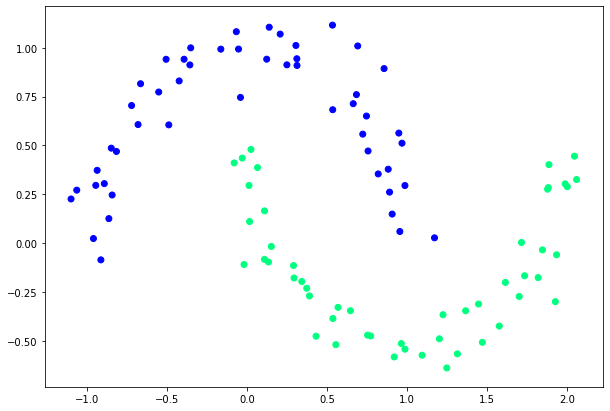

In [3]:

from sklearn import datasets
import numpy as np
import matplotlib.pyplot as plt

np.random.seed(0)
feature_set, labels = datasets.make_moons(100, noise=0.10)
plt.figure(figsize=(10,7))
plt.scatter(feature_set[:,0], feature_set[:,1], c=labels, cmap=plt.cm.winter)

labels = labels.reshape(100, 1)

def sigmoid(x):
    return 1/(1+np.exp(-x))

def sigmoid_der(x):
    return sigmoid(x) *(1-sigmoid (x))

wh = np.random.rand(len(feature_set[0]),4) 
wo = np.random.rand(4, 1)
lr = 0.5

for epoch in range(200000):
    # feedforward
    zh = np.dot(feature_set, wh)
    ah = sigmoid(zh)

    zo = np.dot(ah, wo)
    ao = sigmoid(zo)

    # Phase1 =======================

    error_out = ((1 / 2) * (np.power((ao - labels), 2)))
    print(error_out.sum())

    dcost_dao = ao - labels
    dao_dzo = sigmoid_der(zo) 
    dzo_dwo = ah

    dcost_wo = np.dot(dzo_dwo.T, dcost_dao * dao_dzo)

    # Phase 2 =======================

    # dcost_w1 = dcost_dah * dah_dzh * dzh_dw1
    # dcost_dah = dcost_dzo * dzo_dah
    dcost_dzo = dcost_dao * dao_dzo
    dzo_dah = wo
    dcost_dah = np.dot(dcost_dzo , dzo_dah.T)
    dah_dzh = sigmoid_der(zh) 
    dzh_dwh = feature_set
    dcost_wh = np.dot(dzh_dwh.T, dah_dzh * dcost_dah)

    # Update Weights ================

    wh -= lr * dcost_wh
    wo -= lr * dcost_wo

In the script above we start by importing the desired libraries and then we create our dataset. Next, we define the sigmoid function along with its derivative. We then initialize the hidden layer and output layer weights with random values. The learning rate is 0.5. I tried different learning rates and found that 0.5 is a good value.

We then execute the algorithm for 2000 epochs. Inside each epoch, we first perform the feed-forward operation. The code snippet for the feed forward operation is as follows:



In [4]:
zh = np.dot(feature_set, wh)
ah = sigmoid(zh)

zo = np.dot(ah, wo)
ao = sigmoid(zo)

As discussed in theory section, back propagation consists of two phases. In the first phase, the gradients for the output layer weights are calculated. The following script executes in the first phase of the back-propagation.


In [5]:
error_out = ((1 / 2) * (np.power((ao - labels), 2)))
print(error_out.sum())

dcost_dao = ao - labels
dao_dzo = sigmoid_der(zo) 
dzo_dwo = ah

dcost_wo = np.dot(dzo_dwo.T, dcost_dao * dao_dzo)

1.5032908403325673


In the second phase, the gradients for the hidden layer weights are calculated. The following script executes in the second phase of the back-propagation.

In [6]:
dcost_dzo = dcost_dao * dao_dzo
dzo_dah = wo
dcost_dah = np.dot(dcost_dzo , dzo_dah.T)
dah_dzh = sigmoid_der(zh) 
dzh_dwh = feature_set
dcost_wh = np.dot( dzh_dwh.T, dah_dzh * dcost_dah)

Finally, the weights are updated in the following script:

In [7]:
wh -= lr * dcost_wh
wo -= lr * dcost_wo

When the above script executes, you will see minimum mean squared error value of 1.50 which is less than our previous mean squared error of 4.17, which was obtained using the perceptron. This shows that the neural network with hidden layers performs better in the case of non-linearly separable data

Conclusion : 

In this article, we saw how we can create a neural network with 1 hidden layer, from scratch in Python. We saw how our neural network outperformed a neural network with no hidden layers for the binary classification of non-linear data.

However, we may need to classify data into more than two categories. In our next article, we will see how to create a neural network from scratch in Python for multi-class classification problems.

# ----------------------------------- THANK YOU ---------------------------------